<a href="https://colab.research.google.com/github/revanthavs/tile_embeddings/blob/main/notebooks/Copy_of_ClusteringBasedTileEmbeddingCodeBase.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

debug = 1

/bin/bash: nvidia-smi: command not found


In [2]:
!pip install annoy
!pip install pickle5
!apt-get install graphviz -y
!pip install pydot

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 647.5/647.5 kB 12.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for annoy: filename=annoy-1.17.3-cp310-cp310-linux_x86_64.whl size=582696 sha256=4b7a3339c30c7a0c25743faac730c641e89d70d0fc9ceee6e53fa694133e149e
  Stored in directory: /root/.cache/pip/wheels/64/8a/da/f714bcf46c5efdcfcac0559e63370c21abe961c48e3992465a
Successfully built annoy
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.1/132.1 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pickle5: filename=pickle5-0.0.11-cp310-cp310-linux_x86_64.whl size=256382 sha256=0e7717c31e646283701230e14622bd8b7ba4f8aa4d2d1578334cd73d05e27cc9
  Stored in directory: /root/.cache/pip/wheels/7d/14/ef/4aab19d27fa8e58772be5c71c16add0426acf9e1f64353235c
Successfully built pickle5
Reading package lists... Done
Building dependency tree       
Reading state information... Done
graphviz is already the newest version (2.42.2-3build2).
0 upgrade

**All the required imports**

In [3]:
from google.colab import files
import os
from google.colab import drive
drive.mount('/content/gdrive')
import pandas as pd
import numpy as np

import pickle5 as pickle
import keras.backend as K
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_probability as tfp
import tensorflow as tf
from keras.models import model_from_json
from tensorflow.keras.preprocessing.image import load_img, save_img
from tensorflow.keras.preprocessing.image import array_to_img, img_to_array
import glob
from collections import Counter
from PIL import Image, ImageOps
from annoy import AnnoyIndex
import random
import matplotlib.pyplot as plt
from keras.utils.vis_utils import plot_model
from keras.callbacks import Callback
random_seed = 13
random.seed(random_seed)
import sys
import base64
import requests
np.set_printoptions(threshold=sys.maxsize)

import json

from sklearn.utils import shuffle
from tensorflow.keras.preprocessing import sequence, image
from sklearn.preprocessing import MultiLabelBinarizer

from keras.layers import (
    Flatten,
    Dense,
    Input,
    Activation,
    BatchNormalization,
    Conv2D,
    MaxPool2D,
    Dropout,
    UpSampling2D,
    Lambda,
)
from keras.layers import ReLU, Reshape, Conv2DTranspose, Concatenate, Multiply
from keras.models import Model
from tensorflow.keras.optimizers import Adam
from keras.losses import binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras import metrics
# from utils.data_loading.load_data import get_tile_data
from sklearn.feature_extraction.text import TfidfVectorizer
from ast import literal_eval
from sklearn.model_selection import train_test_split
import cv2

from sklearn.mixture import GaussianMixture


Mounted at /content/gdrive


**Context.py File code**

In [10]:
def extract_context1(current_level,current_img_padded,save_dir,tile_dictionary):

    #for traversing through the text file rows
    x=0
    #for traversing through the image rows
    img_x=0
    imax=len(current_level)
    jmax=len(current_level[0][0])

    #outer loop for the row
    for x in range(imax):
        #for traversing through the text file columns
        y=0
        #image_columns
        img_y=0
        for y in range(jmax):
            #candidate tile character
            current_symbol=current_level[x][0][y]
            #extracting neighbourhood context of candidate tile
            north=' '
            south=' '
            west=' '
            east=' '
            north_west=' '
            north_east=' '
            south_west=' '
            south_east=' '

            ##row 1 of data
            if x+1<imax and y>0:
                north_west=current_level[x+1][0][y-1]
            if x+1<imax:
                north=current_level[x+1][0][y]
            if x+1<imax and y+1<jmax:
                north_east=current_level[x+1][0][y+1]
            row_1=str(north_west+north+north_east)

            #row 2 of data
            if y>0:
                west=current_level[x][0][y-1]
            if y+1<jmax:
                east=current_level[x][0][y+1]
            row_2=str(west+current_symbol+east)

            ##row 3 of data
            if x>0 and y>0:
                south_west=current_level[x-1][0][y-1]
            if x>0:
                south=current_level[x-1][0][y]
            if x>0 and y+1<jmax:
                south_east=current_level[x-1][0][y+1]
            row_3=str(south_west+south+south_east)

            #identifier string for the context tile
            sprite_string=str(row_3+row_2+row_1)

            #extract the image
            tile_context=img_to_array(current_img_padded)[img_x:img_x+48,img_y:img_y+48,:]
            tile_sprite=array_to_img(tile_context)
#             if not tile_context.shape[2]==3:
#                 tile_sprite=tile_sprite.convert('RGB')
            assert img_to_array(tile_sprite).shape == (48,48,3)
            if tile_dictionary.get(current_symbol) is None:
                tile_dictionary[current_symbol]=[]
            if sprite_string not in tile_dictionary.get(current_symbol):
                tile_dictionary[current_symbol].append(sprite_string)
                sprite_dir_path=save_dir+str(current_symbol)+"/"

                if not os.path.exists(sprite_dir_path):
                        os.mkdir(save_dir+str(current_symbol))
                save_img(sprite_dir_path+sprite_string+".png",tile_sprite)
            img_y+=16
        img_x+=16

    return tile_dictionary

def extract_context_unannotated(current_img_padded,save_dir,tile_dictionary):

    #for traversing through the text file rows
    x=0
    #for traversing through the image rows
    img_x=0
    data_array_padded = img_to_array(current_img_padded)
    imax = data_array_padded.shape[0] // 16
    jmax = data_array_padded.shape[1] // 16
    # imax=len(current_level)
    # jmax=len(current_level[0][0])
    count = 0

    #outer loop for the row
    for x in range(imax):
        #for traversing through the text file columns
        y=0
        #image_columns
        img_y=0
        for y in range(jmax):
            #candidate tile character
            # current_symbol=current_level[x][0][y]
            #extracting neighbourhood context of candidate tile
            north=' '
            south=' '
            west=' '
            east=' '
            north_west=' '
            north_east=' '
            south_west=' '
            south_east=' '

            ##row 1 of data
            # if x+1<imax and y>0:
            #     north_west=current_level[x+1][0][y-1]
            # if x+1<imax:
            #     north=current_level[x+1][0][y]
            # if x+1<imax and y+1<jmax:
            #     north_east=current_level[x+1][0][y+1]
            # row_1=str(north_west+north+north_east)

            #row 2 of data
            # if y>0:
            #     west=current_level[x][0][y-1]
            # if y+1<jmax:
            #     east=current_level[x][0][y+1]
            # row_2=str(west+current_symbol+east)

            ##row 3 of data
            # if x>0 and y>0:
            #     south_west=current_level[x-1][0][y-1]
            # if x>0:
            #     south=current_level[x-1][0][y]
            # if x>0 and y+1<jmax:
            #     south_east=current_level[x-1][0][y+1]
            # row_3=str(south_west+south+south_east)

            #identifier string for the context tile
            # sprite_string=str(row_3+row_2+row_1)

            #extract the image
            tile_context=img_to_array(current_img_padded)[img_x:img_x+48,img_y:img_y+48,:]
            tile_sprite=array_to_img(tile_context)
#             if not tile_context.shape[2]==3:
#                 tile_sprite=tile_sprite.convert('RGB')
            if img_to_array(tile_sprite).shape != (48,48,3):
                # print("Something is wrong: ")
                # tile_sprite.show()
                continue
            assert img_to_array(tile_sprite).shape == (48,48,3)
            # if tile_dictionary.get(current_symbol) is None:
            #     tile_dictionary[current_symbol]=[]
            current_symbol = "$"
            sprite_dir_path=save_dir+str(current_symbol)+"/"
            if not os.path.exists(sprite_dir_path):
                    os.mkdir(save_dir+str(current_symbol))
            save_img(sprite_dir_path+str(count)+".png",tile_sprite)
            count += 1

            img_y+=16
        img_x+=16

    return tile_dictionary


def extract_context_lr(current_level,current_img_padded,save_dir,tile_dictionary):
    #for traversing through the text file rows
    x=0
    #for traversing through the image rows
    img_x=0
    imax=len(current_level)
    jmax=len(current_level[0][0])

    #outer loop for the row
    for x in range(imax):
        #for traversing through the text file columns
        y=0
        #image_columns
        img_y=0
        for y in range(jmax):
            #current tile_symbol
            current_symbol=current_level[x][0][y]
            #current tile symbol context
            north=' '
            south=' '
            west=' '
            east=' '
            north_west=' '
            north_east=' '
            south_west=' '
            south_east=' '
            if str(current_symbol)=='.':
                current_symbol=str('@')
            ##row 1 of data
            if x+1<imax and y>0:
                north_west=current_level[x+1][0][y-1]
                if north_west==".":
                    north_west='@'
            if x+1<imax:
                north=current_level[x+1][0][y]
                if north=='.':
                    north='@'
            if x+1<imax and y+1<jmax:
                north_east=current_level[x+1][0][y+1]
                if north_east=='.':
                    north_east='@'
            row_1=str(north_west+north+north_east)
            #row 2 of data
            if y>0:
                west=current_level[x][0][y-1]
                if west =='.':
                    west="@"
            if y+1<jmax:
                east=current_level[x][0][y+1]
                if east=='.':
                    east='@'
            row_2=str(west+current_symbol+east)
            ##row 3 of data
            if x>0 and y>0:
                south_west=current_level[x-1][0][y-1]
                if south_west=='.':
                    south_west='@'
            if x>0:
                south=current_level[x-1][0][y]
                if south=='.':
                    south='@'
            if x>0 and y+1<jmax:
                south_east=current_level[x-1][0][y+1]
                if south_east=='.':
                    south_east="@"
            row_3=str(south_west+south+south_east)
            #identifier string for the context tile
            sprite_string=str(row_3+row_2+row_1)
            #extract the image
            tile_context=img_to_array(current_img_padded)[img_x:img_x+48,img_y:img_y+48,:]
            tile_sprite=array_to_img(tile_context)
            assert tile_context.shape == (48,48,3)
            if tile_dictionary.get(current_symbol) is None:
                tile_dictionary[current_symbol]=[]
            if sprite_string not in tile_dictionary.get(current_symbol):
                tile_dictionary[current_symbol].append(sprite_string)
                sprite_dir_path=save_dir+str(current_symbol)+"/"
                if not os.path.exists(sprite_dir_path):
                        os.mkdir(save_dir+str(current_symbol))
                save_img(sprite_dir_path+sprite_string+".png",tile_sprite)
            img_y+=16
        img_x+=16

    return tile_dictionary

**extract_context_data.py code**

In [ ]:
def get_level(path):
    with open(path, "r") as f:
        l = [line.split() for line in f]
    return l

def get_image(path):
    img_without_border = load_img(path)
    img = Image.open(path)
    img_with_border = ImageOps.expand(img_without_border, border=16, fill="black")
    return img_without_border, img_with_border

def update_tile_dictionary(
    game, current_level, current_img_padded, save_dir, tile_dictionary):
    if game == "lode_runner":
        return extract_context_lr(
            current_level, current_img_padded, save_dir, tile_dictionary
        )
    else:
        return extract_context1(
            current_level, current_img_padded, save_dir, tile_dictionary
        )

def save_context(game, identifiers, image_dir, image_extension, annotation_dir, save_dir):
    tile_dictionary = {}

    for identifier in identifiers:
        image_path = image_dir + identifier + image_extension
        current_img, current_img_padded = get_image(image_path)
        ##figure out the image_dimensions
        data_array = img_to_array(current_img)
        data_array_padded = img_to_array(current_img_padded)
        current_level = get_level(annotation_dir + identifier + ".txt")
        if (
            data_array.shape[0] / len(current_level) == 16.0
            and data_array.shape[1] / len(current_level[0][0]) == 16.0
        ):
            print("Processing", identifier)
            tile_dictionary = update_tile_dictionary(
                game, current_level, current_img_padded, save_dir, tile_dictionary
            )
        else:
            print("Skipping", identifier)
            continue
    # save the tile dictionary
    with open(save_dir + "candidate_tile_context_"+str(game)+".json", "w") as fp:
        json.dump(tile_dictionary, fp, indent=4, sort_keys=True)
    print("Context Data Extracted for game ", game)


# if __name__ == "__main__":
# UNCOMMENT TO EXTRACT DATA
# SUPER-MARIO-BROS
game="smb"
image_extension=".png"
# image_dir="../data/vglc/Super Mario Bros/Original_Fixed/"
image_dir="/content/gdrive/My Drive/CTE/data/vglc/Super Mario Bros/Original_Fixed/"
image_paths=glob.glob(image_dir+"*"+image_extension)
image_identifiers=[x.split("/")[-1].split(".")[0] for x in image_paths]
annotation_dir="/content/gdrive/My Drive/CTE/data/vglc/Super Mario Bros/Processed_Fixed/"
annotation_paths=glob.glob(annotation_dir+"*.txt")
annotation_identifiers=[x.split("/")[-1].split(".")[0] for x in annotation_paths]
identifiers=set(image_identifiers).intersection(set(annotation_identifiers))
save_dir="/content/gdrive/My Drive/CTE/data/context_data/smb/"
print("Number of levels with annotations detected: ",len(identifiers))
save_context(game, identifiers, image_dir, image_extension, annotation_dir, save_dir)
# '''
# LEGEND OF ZELDA
game="legend_of_zelda"
image_extension=".png"
image_dir="/content/gdrive/My Drive/CTE/data/vglc/The Legend of Zelda/Flipped_Data/"
image_paths=glob.glob(image_dir+"*"+image_extension)
image_identifiers=[x.split("/")[-1].split(".")[0] for x in image_paths]
annotation_dir="/content/gdrive/My Drive/CTE/data/vglc/The Legend of Zelda/Processed/"
annotation_paths=glob.glob(annotation_dir+"*.txt")
annotation_identifiers=[x.split("/")[-1].split(".")[0] for x in annotation_paths]
identifiers=set(image_identifiers).intersection(set(annotation_identifiers))
save_dir="/content/gdrive/My Drive/CTE/data/context_data/loz/"
print("Number of levels with annotations detected: ",len(identifiers))
save_context(game, identifiers, image_dir, image_extension, annotation_dir, save_dir)

# KID ICARUS
game="kid_icarus"
image_extension=".bmp"
image_dir="/content/gdrive/My Drive/CTE/data/vglc/Kid Icarus/Original_Fixed/"
image_paths=glob.glob(image_dir+"*"+image_extension)
image_identifiers=[x.split("/")[-1].split(".")[0] for x in image_paths]
annotation_dir="/content/gdrive/My Drive/CTE/data/vglc/Kid Icarus/Processed/"
annotation_paths=glob.glob(annotation_dir+"*.txt")
annotation_identifiers=[x.split("/")[-1].split(".")[0] for x in annotation_paths]
identifiers=set(image_identifiers).intersection(set(annotation_identifiers))
save_dir="/content/gdrive/My Drive/CTE/data/context_data/kid_icarus/"
print("Number of levels with annotations detected: ",len(identifiers))
save_context(game, identifiers, image_dir, image_extension, annotation_dir, save_dir)

# MEGAMAN
game = "megaman"
image_extension = ".bmp"
image_dir = "/content/gdrive/My Drive/CTE/data/vglc/MegaMan/"
image_paths = glob.glob("/content/gdrive/My Drive/CTE/data/vglc/MegaMan/*" + image_extension)
image_identifiers = [x.split("/")[-1].split(".")[0] for x in image_paths]
annotation_dir = "/content/gdrive/My Drive/CTE/data/vglc/MegaMan/"
annotation_paths = glob.glob("/content/gdrive/My Drive/CTE/data/vglc/MegaMan/*.txt")
annotation_identifiers = [x.split("/")[-1].split(".")[0] for x in annotation_paths]
identifiers = set(image_identifiers).intersection(set(annotation_identifiers))
save_dir = "/content/gdrive/My Drive/CTE/data/context_data/megaman/"
print("Number of levels with annotations detected: ", len(identifiers))
save_context(game, identifiers, image_dir, image_extension, annotation_dir, save_dir)

# LODE RUNNER
game="lode_runner"
image_extension=".png"
image_dir="/content/gdrive/My Drive/CTE/data/vglc/Lode Runner/Original_Fixed/"
image_paths=glob.glob(image_dir+"*"+image_extension)
annotation_dir="/content/gdrive/My Drive/CTE/data/vglc/Lode Runner/Processed/"
identifiers=[]
for image_path in image_paths:
    level_id=image_path.split("/")[-1].split(".")[0]
    identifiers.append(level_id)
save_dir="/content/gdrive/My Drive/CTE/data/context_data/lode_runner/"
print("Number of levels with annotations detected: ",len(identifiers))
save_context(game, identifiers, image_dir, image_extension, annotation_dir, save_dir)
# '''

Number of levels with annotations detected:  117
Processing game_1_31
Something is wrong: 


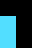

Something is wrong: 


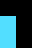

Something is wrong: 


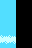

Something is wrong: 


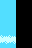

Something is wrong: 


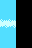

Something is wrong: 


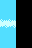

Something is wrong: 


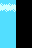

Something is wrong: 


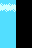

Something is wrong: 


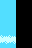

Something is wrong: 


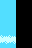

Something is wrong: 


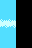

Something is wrong: 


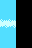

Something is wrong: 


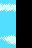

Something is wrong: 


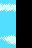

Something is wrong: 


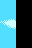

Something is wrong: 


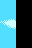

Something is wrong: 


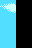

Something is wrong: 


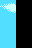

Something is wrong: 


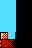

Something is wrong: 


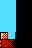

Something is wrong: 


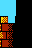

Something is wrong: 


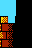

Something is wrong: 


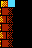

Something is wrong: 


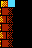

Something is wrong: 


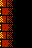

Something is wrong: 


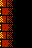

Something is wrong: 


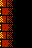

Something is wrong: 


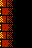

Something is wrong: 


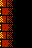

Something is wrong: 


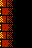

Something is wrong: 


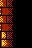

Something is wrong: 


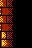

Something is wrong: 


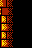

Something is wrong: 


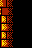

Something is wrong: 


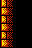

Something is wrong: 


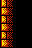

Something is wrong: 


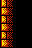

Something is wrong: 


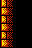

Something is wrong: 


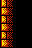

Something is wrong: 


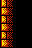

Something is wrong: 


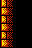

Something is wrong: 


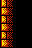

Something is wrong: 


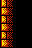

Something is wrong: 


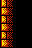

Something is wrong: 


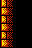

Something is wrong: 


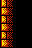

Something is wrong: 


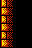

Something is wrong: 


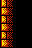

Something is wrong: 


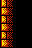

Something is wrong: 


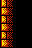

Something is wrong: 


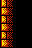

Something is wrong: 


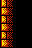

Something is wrong: 


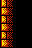

Something is wrong: 


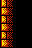

Something is wrong: 


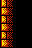

Something is wrong: 


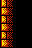

Something is wrong: 


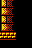

Something is wrong: 


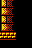

Something is wrong: 


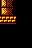

Something is wrong: 


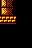

Something is wrong: 


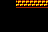

Something is wrong: 


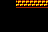

Something is wrong: 


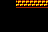

Something is wrong: 


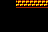

Something is wrong: 


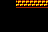

Something is wrong: 


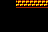

Something is wrong: 


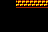

Something is wrong: 


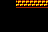

Something is wrong: 


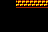

Something is wrong: 


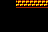

Something is wrong: 


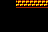

Something is wrong: 


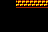

Something is wrong: 


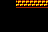

Something is wrong: 


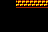

Something is wrong: 


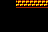

Something is wrong: 


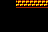

Something is wrong: 


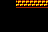

Something is wrong: 


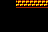

Something is wrong: 


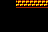

Something is wrong: 


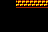

Something is wrong: 


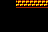

Something is wrong: 


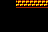

Something is wrong: 


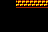

Something is wrong: 


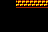

Something is wrong: 


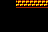

Something is wrong: 


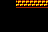

Something is wrong: 


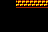

Something is wrong: 


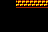

Something is wrong: 


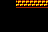

Something is wrong: 


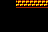

Something is wrong: 


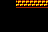

Something is wrong: 


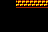

Something is wrong: 


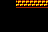

Something is wrong: 


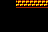

Something is wrong: 


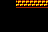

Something is wrong: 


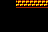

Something is wrong: 


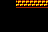

Something is wrong: 


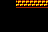

Something is wrong: 


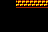

Something is wrong: 


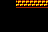

Something is wrong: 


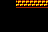

Something is wrong: 


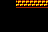

Something is wrong: 


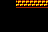

Something is wrong: 


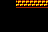

Something is wrong: 


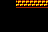

Something is wrong: 


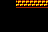

Something is wrong: 


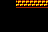

Something is wrong: 


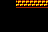

Something is wrong: 


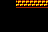

Something is wrong: 


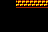

Something is wrong: 


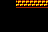

Something is wrong: 


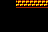

Something is wrong: 


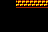

Something is wrong: 


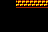

Something is wrong: 


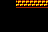

Something is wrong: 


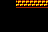

Something is wrong: 


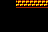

Something is wrong: 


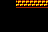

Something is wrong: 


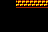

Something is wrong: 


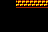

Something is wrong: 


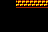

Something is wrong: 


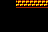

Something is wrong: 


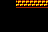

Something is wrong: 


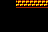

Something is wrong: 


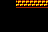

Something is wrong: 


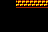

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_32
Something is wrong: 


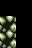

Something is wrong: 


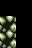

Something is wrong: 


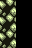

Something is wrong: 


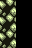

Something is wrong: 


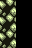

Something is wrong: 


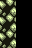

Something is wrong: 


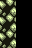

Something is wrong: 


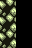

Something is wrong: 


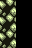

Something is wrong: 


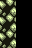

Something is wrong: 


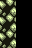

Something is wrong: 


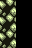

Something is wrong: 


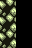

Something is wrong: 


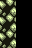

Something is wrong: 


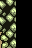

Something is wrong: 


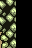

Something is wrong: 


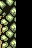

Something is wrong: 


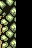

Something is wrong: 


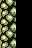

Something is wrong: 


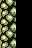

Something is wrong: 


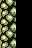

Something is wrong: 


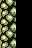

Something is wrong: 


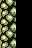

Something is wrong: 


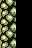

Something is wrong: 


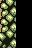

Something is wrong: 


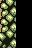

Something is wrong: 


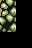

Something is wrong: 


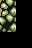

Something is wrong: 


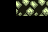

Something is wrong: 


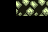

Something is wrong: 


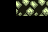

Something is wrong: 


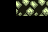

Something is wrong: 


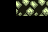

Something is wrong: 


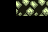

Something is wrong: 


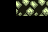

Something is wrong: 


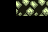

Something is wrong: 


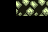

Something is wrong: 


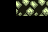

Something is wrong: 


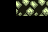

Something is wrong: 


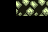

Something is wrong: 


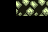

Something is wrong: 


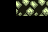

Something is wrong: 


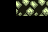

Something is wrong: 


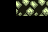

Something is wrong: 


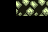

Something is wrong: 


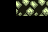

Something is wrong: 


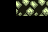

Something is wrong: 


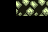

Something is wrong: 


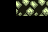

Something is wrong: 


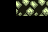

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_18
Something is wrong: 


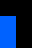

Something is wrong: 


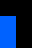

Something is wrong: 


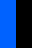

Something is wrong: 


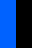

Something is wrong: 


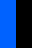

Something is wrong: 


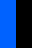

Something is wrong: 


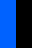

Something is wrong: 


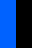

Something is wrong: 


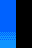

Something is wrong: 


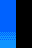

Something is wrong: 


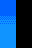

Something is wrong: 


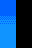

Something is wrong: 


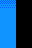

Something is wrong: 


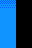

Something is wrong: 


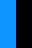

Something is wrong: 


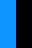

Something is wrong: 


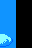

Something is wrong: 


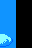

Something is wrong: 


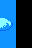

Something is wrong: 


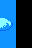

Something is wrong: 


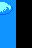

Something is wrong: 


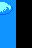

Something is wrong: 


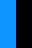

Something is wrong: 


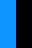

Something is wrong: 


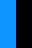

Something is wrong: 


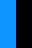

Something is wrong: 


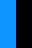

Something is wrong: 


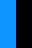

Something is wrong: 


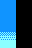

Something is wrong: 


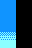

Something is wrong: 


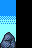

Something is wrong: 


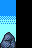

Something is wrong: 


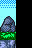

Something is wrong: 


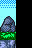

Something is wrong: 


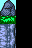

Something is wrong: 


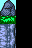

Something is wrong: 


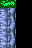

Something is wrong: 


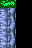

Something is wrong: 


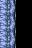

Something is wrong: 


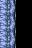

Something is wrong: 


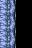

Something is wrong: 


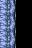

Something is wrong: 


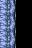

Something is wrong: 


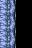

Something is wrong: 


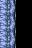

Something is wrong: 


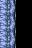

Something is wrong: 


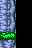

Something is wrong: 


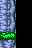

Something is wrong: 


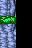

Something is wrong: 


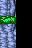

Something is wrong: 


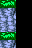

Something is wrong: 


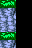

Something is wrong: 


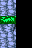

Something is wrong: 


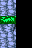

Something is wrong: 


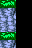

Something is wrong: 


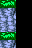

Something is wrong: 


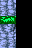

Something is wrong: 


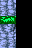

Something is wrong: 


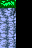

Something is wrong: 


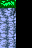

Something is wrong: 


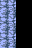

Something is wrong: 


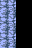

Something is wrong: 


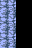

Something is wrong: 


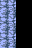

Something is wrong: 


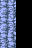

Something is wrong: 


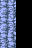

Something is wrong: 


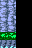

Something is wrong: 


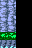

Something is wrong: 


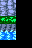

Something is wrong: 


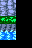

Something is wrong: 


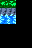

Something is wrong: 


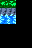

Something is wrong: 


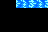

Something is wrong: 


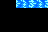

Something is wrong: 


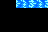

Something is wrong: 


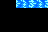

Something is wrong: 


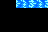

Something is wrong: 


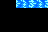

Something is wrong: 


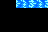

Something is wrong: 


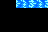

Something is wrong: 


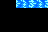

Something is wrong: 


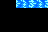

Something is wrong: 


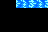

Something is wrong: 


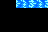

Something is wrong: 


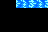

Something is wrong: 


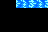

Something is wrong: 


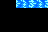

Something is wrong: 


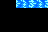

Something is wrong: 


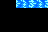

Something is wrong: 


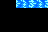

Something is wrong: 


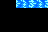

Something is wrong: 


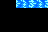

Something is wrong: 


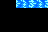

Something is wrong: 


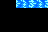

Something is wrong: 


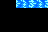

Something is wrong: 


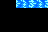

Something is wrong: 


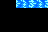

Something is wrong: 


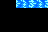

Something is wrong: 


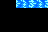

Something is wrong: 


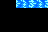

Something is wrong: 


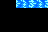

Something is wrong: 


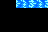

Something is wrong: 


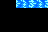

Something is wrong: 


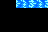

Something is wrong: 


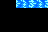

Something is wrong: 


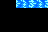

Something is wrong: 


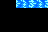

Something is wrong: 


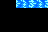

Something is wrong: 


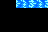

Something is wrong: 


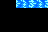

Something is wrong: 


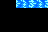

Something is wrong: 


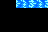

Something is wrong: 


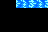

Something is wrong: 


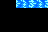

Something is wrong: 


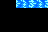

Something is wrong: 


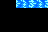

Something is wrong: 


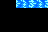

Something is wrong: 


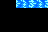

Something is wrong: 


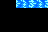

Something is wrong: 


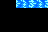

Something is wrong: 


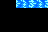

Something is wrong: 


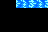

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_23
Something is wrong: 


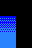

Something is wrong: 


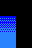

Something is wrong: 


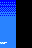

Something is wrong: 


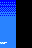

Something is wrong: 


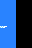

Something is wrong: 


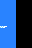

Something is wrong: 


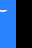

Something is wrong: 


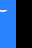

Something is wrong: 


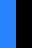

Something is wrong: 


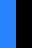

Something is wrong: 


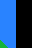

Something is wrong: 


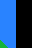

Something is wrong: 


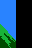

Something is wrong: 


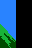

Something is wrong: 


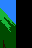

Something is wrong: 


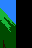

Something is wrong: 


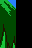

Something is wrong: 


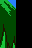

Something is wrong: 


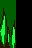

Something is wrong: 


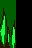

Something is wrong: 


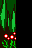

Something is wrong: 


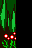

Something is wrong: 


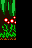

Something is wrong: 


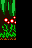

Something is wrong: 


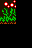

Something is wrong: 


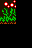

Something is wrong: 


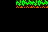

Something is wrong: 


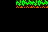

Something is wrong: 


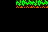

Something is wrong: 


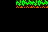

Something is wrong: 


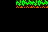

Something is wrong: 


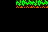

Something is wrong: 


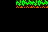

Something is wrong: 


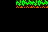

Something is wrong: 


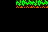

Something is wrong: 


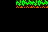

Something is wrong: 


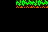

Something is wrong: 


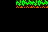

Something is wrong: 


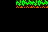

Something is wrong: 


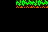

Something is wrong: 


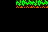

Something is wrong: 


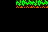

Something is wrong: 


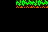

Something is wrong: 


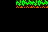

Something is wrong: 


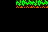

Something is wrong: 


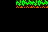

Something is wrong: 


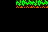

Something is wrong: 


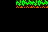

Something is wrong: 


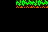

Something is wrong: 


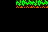

Something is wrong: 


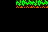

Something is wrong: 


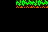

Something is wrong: 


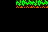

Something is wrong: 


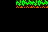

Something is wrong: 


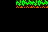

Something is wrong: 


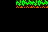

Something is wrong: 


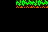

Something is wrong: 


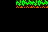

Something is wrong: 


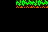

Something is wrong: 


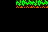

Something is wrong: 


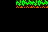

Something is wrong: 


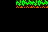

Something is wrong: 


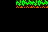

Something is wrong: 


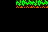

Something is wrong: 


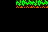

Something is wrong: 


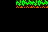

Something is wrong: 


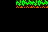

Something is wrong: 


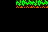

Something is wrong: 


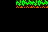

Something is wrong: 


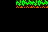

Something is wrong: 


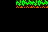

Something is wrong: 


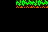

Something is wrong: 


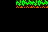

Something is wrong: 


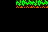

Something is wrong: 


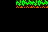

Something is wrong: 


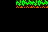

Something is wrong: 


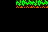

Something is wrong: 


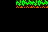

Something is wrong: 


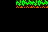

Something is wrong: 


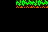

Something is wrong: 


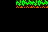

Something is wrong: 


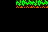

Something is wrong: 


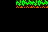

Something is wrong: 


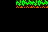

Something is wrong: 


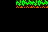

Something is wrong: 


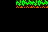

Something is wrong: 


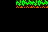

Something is wrong: 


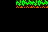

Something is wrong: 


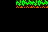

Something is wrong: 


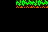

Something is wrong: 


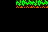

Something is wrong: 


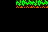

Something is wrong: 


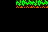

Something is wrong: 


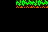

Something is wrong: 


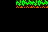

Something is wrong: 


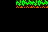

Something is wrong: 


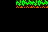

Something is wrong: 


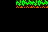

Something is wrong: 


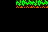

Something is wrong: 


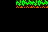

Something is wrong: 


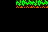

Something is wrong: 


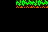

Something is wrong: 


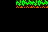

Something is wrong: 


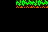

Something is wrong: 


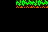

Something is wrong: 


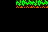

Something is wrong: 


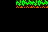

Something is wrong: 


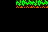

Something is wrong: 


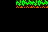

Something is wrong: 


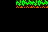

Something is wrong: 


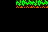

Something is wrong: 


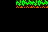

Something is wrong: 


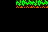

Something is wrong: 


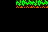

Something is wrong: 


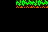

Something is wrong: 


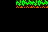

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_34
Something is wrong: 


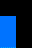

Something is wrong: 


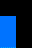

Something is wrong: 


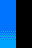

Something is wrong: 


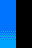

Something is wrong: 


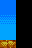

Something is wrong: 


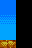

Something is wrong: 


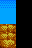

Something is wrong: 


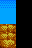

Something is wrong: 


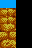

Something is wrong: 


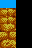

Something is wrong: 


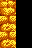

Something is wrong: 


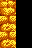

Something is wrong: 


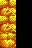

Something is wrong: 


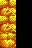

Something is wrong: 


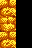

Something is wrong: 


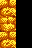

Something is wrong: 


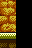

Something is wrong: 


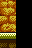

Something is wrong: 


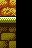

Something is wrong: 


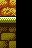

Something is wrong: 


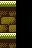

Something is wrong: 


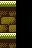

Something is wrong: 


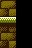

Something is wrong: 


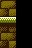

Something is wrong: 


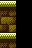

Something is wrong: 


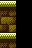

Something is wrong: 


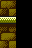

Something is wrong: 


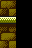

Something is wrong: 


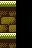

Something is wrong: 


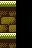

Something is wrong: 


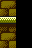

Something is wrong: 


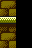

Something is wrong: 


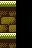

Something is wrong: 


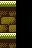

Something is wrong: 


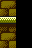

Something is wrong: 


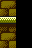

Something is wrong: 


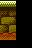

Something is wrong: 


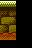

Something is wrong: 


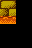

Something is wrong: 


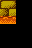

Something is wrong: 


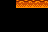

Something is wrong: 


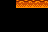

Something is wrong: 


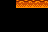

Something is wrong: 


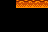

Something is wrong: 


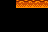

Something is wrong: 


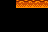

Something is wrong: 


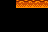

Something is wrong: 


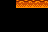

Something is wrong: 


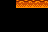

Something is wrong: 


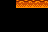

Something is wrong: 


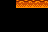

Something is wrong: 


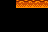

Something is wrong: 


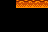

Something is wrong: 


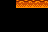

Something is wrong: 


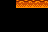

Something is wrong: 


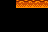

Something is wrong: 


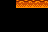

Something is wrong: 


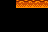

Something is wrong: 


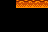

Something is wrong: 


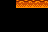

Something is wrong: 


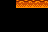

Something is wrong: 


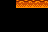

Something is wrong: 


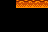

Something is wrong: 


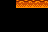

Something is wrong: 


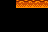

Something is wrong: 


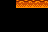

Something is wrong: 


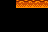

Something is wrong: 


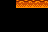

Something is wrong: 


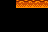

Something is wrong: 


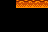

Something is wrong: 


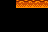

Something is wrong: 


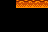

Something is wrong: 


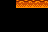

Something is wrong: 


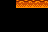

Something is wrong: 


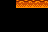

Something is wrong: 


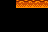

Something is wrong: 


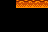

Something is wrong: 


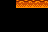

Something is wrong: 


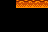

Something is wrong: 


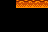

Something is wrong: 


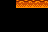

Something is wrong: 


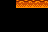

Something is wrong: 


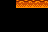

Something is wrong: 


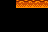

Something is wrong: 


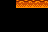

Something is wrong: 


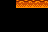

Something is wrong: 


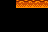

Something is wrong: 


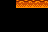

Something is wrong: 


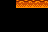

Something is wrong: 


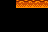

Something is wrong: 


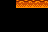

Something is wrong: 


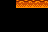

Something is wrong: 


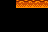

Something is wrong: 


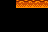

Something is wrong: 


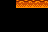

Something is wrong: 


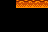

Something is wrong: 


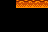

Something is wrong: 


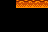

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_0_3
Something is wrong: 


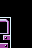

Something is wrong: 


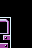

Something is wrong: 


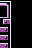

Something is wrong: 


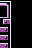

Something is wrong: 


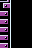

Something is wrong: 


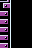

Something is wrong: 


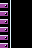

Something is wrong: 


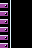

Something is wrong: 


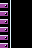

Something is wrong: 


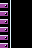

Something is wrong: 


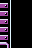

Something is wrong: 


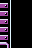

Something is wrong: 


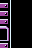

Something is wrong: 


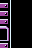

Something is wrong: 


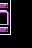

Something is wrong: 


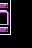

Something is wrong: 


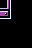

Something is wrong: 


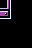

Something is wrong: 


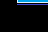

Something is wrong: 


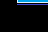

Something is wrong: 


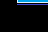

Something is wrong: 


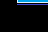

Something is wrong: 


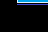

Something is wrong: 


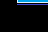

Something is wrong: 


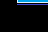

Something is wrong: 


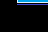

Something is wrong: 


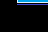

Something is wrong: 


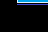

Something is wrong: 


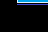

Something is wrong: 


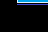

Something is wrong: 


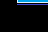

Something is wrong: 


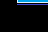

Something is wrong: 


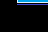

Something is wrong: 


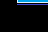

Something is wrong: 


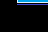

Something is wrong: 


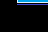

Something is wrong: 


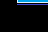

Something is wrong: 


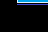

Something is wrong: 


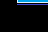

Something is wrong: 


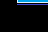

Something is wrong: 


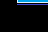

Something is wrong: 


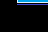

Something is wrong: 


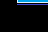

Something is wrong: 


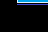

Something is wrong: 


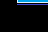

Something is wrong: 


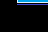

Something is wrong: 


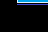

Something is wrong: 


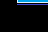

Something is wrong: 


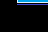

Something is wrong: 


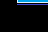

Something is wrong: 


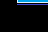

Something is wrong: 


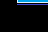

Something is wrong: 


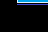

Something is wrong: 


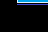

Something is wrong: 


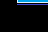

Something is wrong: 


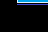

Something is wrong: 


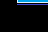

Something is wrong: 


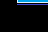

Something is wrong: 


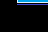

Something is wrong: 


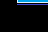

Something is wrong: 


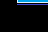

Something is wrong: 


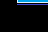

Something is wrong: 


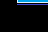

Something is wrong: 


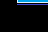

Something is wrong: 


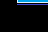

Something is wrong: 


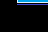

Something is wrong: 


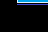

Something is wrong: 


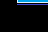

Something is wrong: 


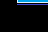

Something is wrong: 


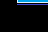

Something is wrong: 


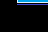

Something is wrong: 


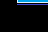

Something is wrong: 


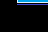

Something is wrong: 


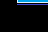

Something is wrong: 


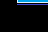

Something is wrong: 


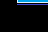

Something is wrong: 


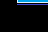

Something is wrong: 


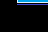

Something is wrong: 


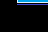

Something is wrong: 


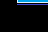

Something is wrong: 


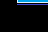

Something is wrong: 


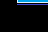

Something is wrong: 


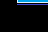

Something is wrong: 


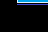

Something is wrong: 


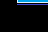

Something is wrong: 


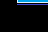

Something is wrong: 


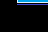

Something is wrong: 


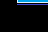

Something is wrong: 


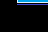

Something is wrong: 


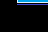

Something is wrong: 


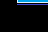

Something is wrong: 


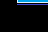

Something is wrong: 


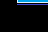

Something is wrong: 


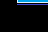

Something is wrong: 


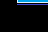

Something is wrong: 


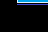

Something is wrong: 


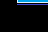

Something is wrong: 


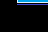

Something is wrong: 


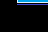

Something is wrong: 


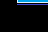

Something is wrong: 


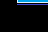

Something is wrong: 


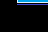

Something is wrong: 


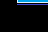

Something is wrong: 


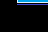

Something is wrong: 


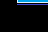

Something is wrong: 


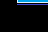

Something is wrong: 


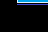

Something is wrong: 


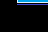

Something is wrong: 


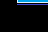

Something is wrong: 


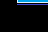

Something is wrong: 


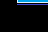

Something is wrong: 


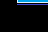

Something is wrong: 


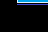

Something is wrong: 


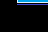

Something is wrong: 


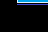

Something is wrong: 


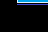

Something is wrong: 


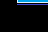

Something is wrong: 


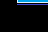

Something is wrong: 


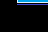

Something is wrong: 


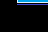

Something is wrong: 


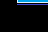

Something is wrong: 


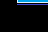

Something is wrong: 


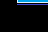

Something is wrong: 


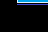

Something is wrong: 


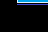

Something is wrong: 


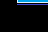

Something is wrong: 


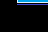

Something is wrong: 


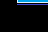

Something is wrong: 


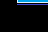

Something is wrong: 


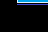

Something is wrong: 


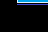

Something is wrong: 


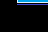

Something is wrong: 


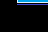

Something is wrong: 


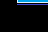

Something is wrong: 


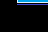

Something is wrong: 


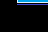

Something is wrong: 


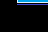

Something is wrong: 


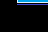

Something is wrong: 


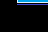

Something is wrong: 


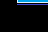

Something is wrong: 


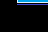

Something is wrong: 


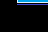

Something is wrong: 


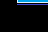

Something is wrong: 


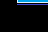

Something is wrong: 


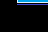

Something is wrong: 


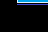

Something is wrong: 


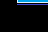

Something is wrong: 


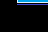

Something is wrong: 


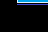

Something is wrong: 


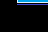

Something is wrong: 


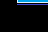

Something is wrong: 


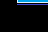

Something is wrong: 


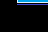

Something is wrong: 


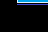

Something is wrong: 


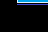

Something is wrong: 


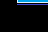

Something is wrong: 


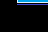

Something is wrong: 


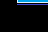

Something is wrong: 


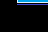

Something is wrong: 


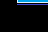

Something is wrong: 


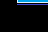

Something is wrong: 


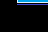

Something is wrong: 


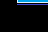

Something is wrong: 


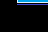

Something is wrong: 


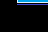

Something is wrong: 


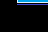

Something is wrong: 


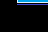

Something is wrong: 


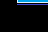

Something is wrong: 


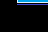

Something is wrong: 


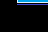

Something is wrong: 


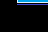

Something is wrong: 


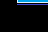

Something is wrong: 


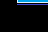

Something is wrong: 


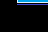

Something is wrong: 


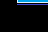

Something is wrong: 


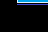

Something is wrong: 


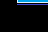

Something is wrong: 


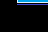

Something is wrong: 


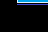

Something is wrong: 


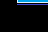

Something is wrong: 


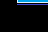

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_11
Something is wrong: 


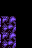

Something is wrong: 


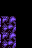

Something is wrong: 


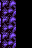

Something is wrong: 


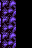

Something is wrong: 


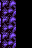

Something is wrong: 


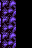

Something is wrong: 


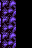

Something is wrong: 


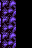

Something is wrong: 


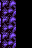

Something is wrong: 


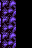

Something is wrong: 


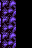

Something is wrong: 


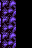

Something is wrong: 


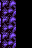

Something is wrong: 


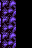

Something is wrong: 


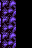

Something is wrong: 


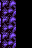

Something is wrong: 


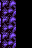

Something is wrong: 


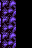

Something is wrong: 


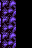

Something is wrong: 


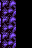

Something is wrong: 


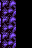

Something is wrong: 


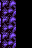

Something is wrong: 


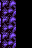

Something is wrong: 


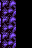

Something is wrong: 


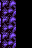

Something is wrong: 


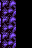

Something is wrong: 


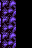

Something is wrong: 


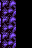

Something is wrong: 


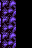

Something is wrong: 


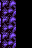

Something is wrong: 


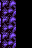

Something is wrong: 


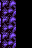

Something is wrong: 


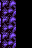

Something is wrong: 


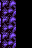

Something is wrong: 


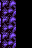

Something is wrong: 


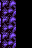

Something is wrong: 


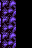

Something is wrong: 


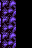

Something is wrong: 


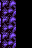

Something is wrong: 


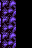

Something is wrong: 


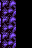

Something is wrong: 


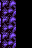

Something is wrong: 


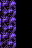

Something is wrong: 


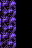

Something is wrong: 


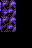

Something is wrong: 


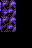

Something is wrong: 


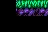

Something is wrong: 


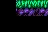

Something is wrong: 


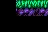

Something is wrong: 


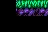

Something is wrong: 


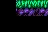

Something is wrong: 


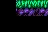

Something is wrong: 


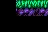

Something is wrong: 


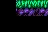

Something is wrong: 


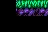

Something is wrong: 


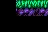

Something is wrong: 


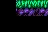

Something is wrong: 


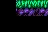

Something is wrong: 


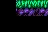

Something is wrong: 


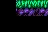

Something is wrong: 


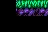

Something is wrong: 


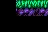

Something is wrong: 


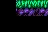

Something is wrong: 


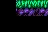

Something is wrong: 


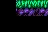

Something is wrong: 


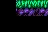

Something is wrong: 


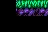

Something is wrong: 


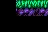

Something is wrong: 


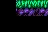

Something is wrong: 


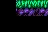

Something is wrong: 


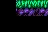

Something is wrong: 


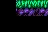

Something is wrong: 


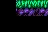

Something is wrong: 


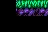

Something is wrong: 


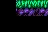

Something is wrong: 


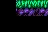

Something is wrong: 


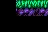

Something is wrong: 


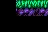

Something is wrong: 


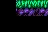

Something is wrong: 


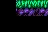

Something is wrong: 


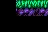

Something is wrong: 


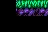

Something is wrong: 


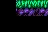

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_4
Something is wrong: 


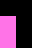

Something is wrong: 


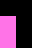

Something is wrong: 


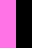

Something is wrong: 


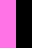

Something is wrong: 


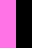

Something is wrong: 


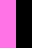

Something is wrong: 


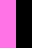

Something is wrong: 


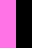

Something is wrong: 


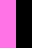

Something is wrong: 


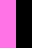

Something is wrong: 


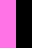

Something is wrong: 


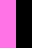

Something is wrong: 


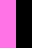

Something is wrong: 


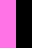

Something is wrong: 


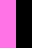

Something is wrong: 


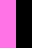

Something is wrong: 


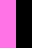

Something is wrong: 


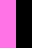

Something is wrong: 


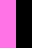

Something is wrong: 


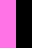

Something is wrong: 


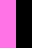

Something is wrong: 


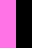

Something is wrong: 


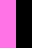

Something is wrong: 


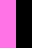

Something is wrong: 


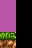

Something is wrong: 


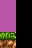

Something is wrong: 


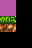

Something is wrong: 


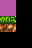

Something is wrong: 


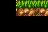

Something is wrong: 


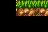

Something is wrong: 


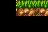

Something is wrong: 


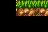

Something is wrong: 


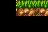

Something is wrong: 


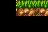

Something is wrong: 


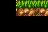

Something is wrong: 


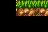

Something is wrong: 


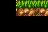

Something is wrong: 


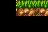

Something is wrong: 


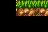

Something is wrong: 


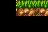

Something is wrong: 


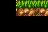

Something is wrong: 


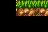

Something is wrong: 


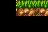

Something is wrong: 


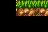

Something is wrong: 


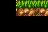

Something is wrong: 


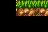

Something is wrong: 


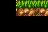

Something is wrong: 


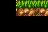

Something is wrong: 


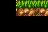

Something is wrong: 


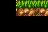

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_2
Something is wrong: 


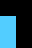

Something is wrong: 


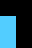

Something is wrong: 


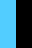

Something is wrong: 


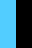

Something is wrong: 


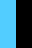

Something is wrong: 


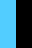

Something is wrong: 


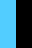

Something is wrong: 


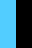

Something is wrong: 


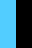

Something is wrong: 


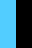

Something is wrong: 


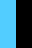

Something is wrong: 


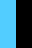

Something is wrong: 


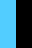

Something is wrong: 


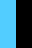

Something is wrong: 


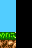

Something is wrong: 


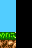

Something is wrong: 


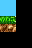

Something is wrong: 


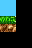

Something is wrong: 


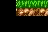

Something is wrong: 


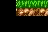

Something is wrong: 


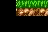

Something is wrong: 


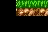

Something is wrong: 


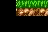

Something is wrong: 


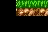

Something is wrong: 


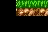

Something is wrong: 


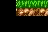

Something is wrong: 


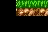

Something is wrong: 


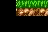

Something is wrong: 


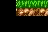

Something is wrong: 


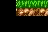

Something is wrong: 


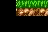

Something is wrong: 


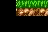

Something is wrong: 


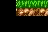

Something is wrong: 


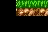

Something is wrong: 


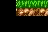

Something is wrong: 


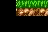

Something is wrong: 


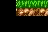

Something is wrong: 


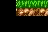

Something is wrong: 


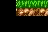

Something is wrong: 


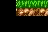

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_7
Something is wrong: 


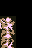

Something is wrong: 


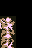

Something is wrong: 


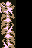

Something is wrong: 


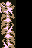

Something is wrong: 


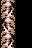

Something is wrong: 


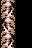

Something is wrong: 


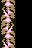

Something is wrong: 


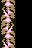

Something is wrong: 


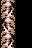

Something is wrong: 


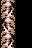

Something is wrong: 


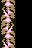

Something is wrong: 


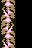

Something is wrong: 


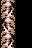

Something is wrong: 


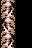

Something is wrong: 


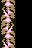

Something is wrong: 


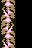

Something is wrong: 


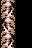

Something is wrong: 


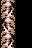

Something is wrong: 


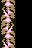

Something is wrong: 


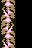

Something is wrong: 


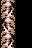

Something is wrong: 


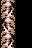

Something is wrong: 


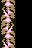

Something is wrong: 


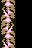

Something is wrong: 


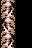

Something is wrong: 


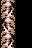

Something is wrong: 


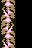

Something is wrong: 


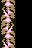

Something is wrong: 


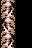

Something is wrong: 


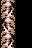

Something is wrong: 


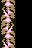

Something is wrong: 


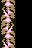

Something is wrong: 


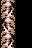

Something is wrong: 


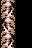

Something is wrong: 


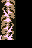

Something is wrong: 


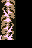

Something is wrong: 


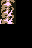

Something is wrong: 


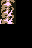

Something is wrong: 


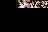

Something is wrong: 


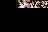

Something is wrong: 


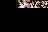

Something is wrong: 


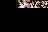

Something is wrong: 


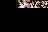

Something is wrong: 


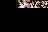

Something is wrong: 


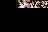

Something is wrong: 


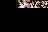

Something is wrong: 


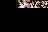

Something is wrong: 


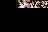

Something is wrong: 


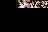

Something is wrong: 


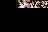

Something is wrong: 


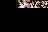

Something is wrong: 


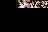

Something is wrong: 


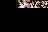

Something is wrong: 


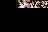

Something is wrong: 


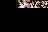

Something is wrong: 


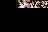

Something is wrong: 


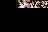

Something is wrong: 


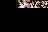

Something is wrong: 


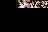

Something is wrong: 


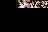

Something is wrong: 


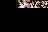

Something is wrong: 


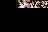

Something is wrong: 


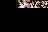

Something is wrong: 


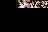

Something is wrong: 


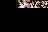

Something is wrong: 


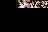

Something is wrong: 


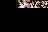

Something is wrong: 


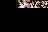

Something is wrong: 


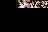

Something is wrong: 


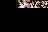

Something is wrong: 


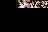

Something is wrong: 


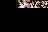

Something is wrong: 


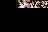

Something is wrong: 


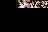

Something is wrong: 


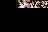

Something is wrong: 


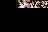

Something is wrong: 


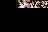

Something is wrong: 


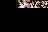

Something is wrong: 


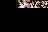

Something is wrong: 


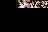

Something is wrong: 


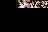

Something is wrong: 


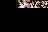

Something is wrong: 


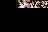

Something is wrong: 


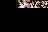

Something is wrong: 


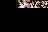

Something is wrong: 


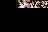

Something is wrong: 


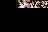

Something is wrong: 


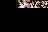

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_57
Something is wrong: 


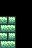

Something is wrong: 


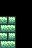

Something is wrong: 


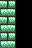

Something is wrong: 


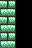

Something is wrong: 


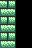

Something is wrong: 


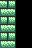

Something is wrong: 


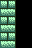

Something is wrong: 


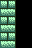

Something is wrong: 


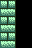

Something is wrong: 


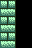

Something is wrong: 


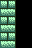

Something is wrong: 


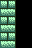

Something is wrong: 


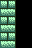

Something is wrong: 


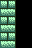

Something is wrong: 


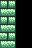

Something is wrong: 


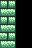

Something is wrong: 


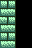

Something is wrong: 


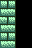

Something is wrong: 


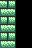

Something is wrong: 


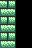

Something is wrong: 


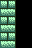

Something is wrong: 


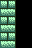

Something is wrong: 


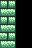

Something is wrong: 


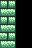

Something is wrong: 


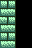

Something is wrong: 


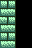

Something is wrong: 


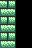

Something is wrong: 


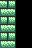

Something is wrong: 


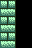

Something is wrong: 


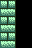

Something is wrong: 


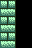

Something is wrong: 


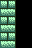

Something is wrong: 


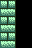

Something is wrong: 


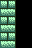

Something is wrong: 


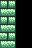

Something is wrong: 


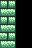

Something is wrong: 


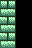

Something is wrong: 


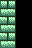

Something is wrong: 


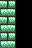

Something is wrong: 


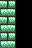

Something is wrong: 


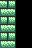

Something is wrong: 


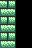

Something is wrong: 


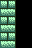

Something is wrong: 


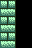

Something is wrong: 


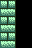

Something is wrong: 


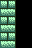

Something is wrong: 


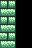

Something is wrong: 


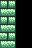

Something is wrong: 


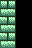

Something is wrong: 


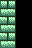

Something is wrong: 


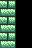

Something is wrong: 


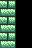

Something is wrong: 


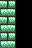

Something is wrong: 


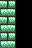

Something is wrong: 


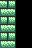

Something is wrong: 


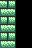

Something is wrong: 


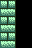

Something is wrong: 


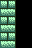

Something is wrong: 


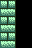

Something is wrong: 


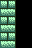

Something is wrong: 


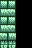

Something is wrong: 


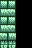

Something is wrong: 


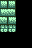

Something is wrong: 


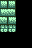

Something is wrong: 


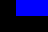

Something is wrong: 


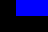

Something is wrong: 


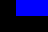

Something is wrong: 


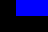

Something is wrong: 


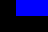

Something is wrong: 


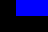

Something is wrong: 


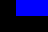

Something is wrong: 


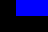

Something is wrong: 


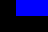

Something is wrong: 


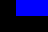

Something is wrong: 


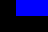

Something is wrong: 


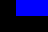

Something is wrong: 


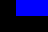

Something is wrong: 


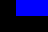

Something is wrong: 


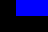

Something is wrong: 


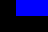

Something is wrong: 


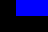

Something is wrong: 


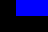

Something is wrong: 


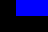

Something is wrong: 


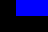

Something is wrong: 


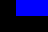

Something is wrong: 


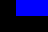

Something is wrong: 


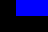

Something is wrong: 


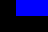

Something is wrong: 


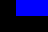

Something is wrong: 


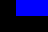

Something is wrong: 


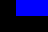

Something is wrong: 


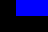

Something is wrong: 


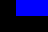

Something is wrong: 


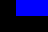

Something is wrong: 


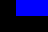

Something is wrong: 


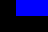

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_43
Something is wrong: 


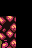

Something is wrong: 


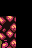

Something is wrong: 


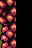

Something is wrong: 


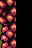

Something is wrong: 


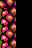

Something is wrong: 


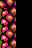

Something is wrong: 


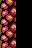

Something is wrong: 


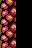

Something is wrong: 


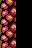

Something is wrong: 


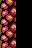

Something is wrong: 


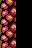

Something is wrong: 


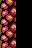

Something is wrong: 


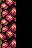

Something is wrong: 


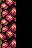

Something is wrong: 


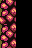

Something is wrong: 


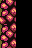

Something is wrong: 


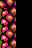

Something is wrong: 


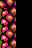

Something is wrong: 


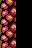

Something is wrong: 


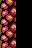

Something is wrong: 


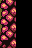

Something is wrong: 


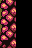

Something is wrong: 


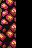

Something is wrong: 


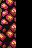

Something is wrong: 


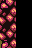

Something is wrong: 


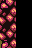

Something is wrong: 


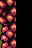

Something is wrong: 


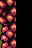

Something is wrong: 


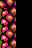

Something is wrong: 


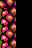

Something is wrong: 


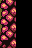

Something is wrong: 


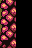

Something is wrong: 


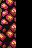

Something is wrong: 


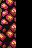

Something is wrong: 


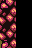

Something is wrong: 


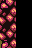

Something is wrong: 


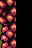

Something is wrong: 


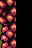

Something is wrong: 


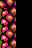

Something is wrong: 


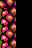

Something is wrong: 


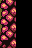

Something is wrong: 


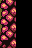

Something is wrong: 


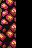

Something is wrong: 


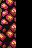

Something is wrong: 


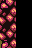

Something is wrong: 


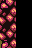

Something is wrong: 


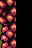

Something is wrong: 


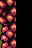

Something is wrong: 


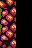

Something is wrong: 


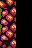

Something is wrong: 


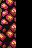

Something is wrong: 


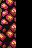

Something is wrong: 


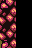

Something is wrong: 


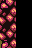

Something is wrong: 


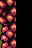

Something is wrong: 


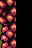

Something is wrong: 


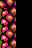

Something is wrong: 


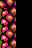

Something is wrong: 


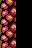

Something is wrong: 


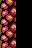

Something is wrong: 


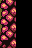

Something is wrong: 


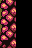

Something is wrong: 


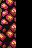

Something is wrong: 


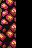

Something is wrong: 


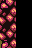

Something is wrong: 


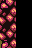

Something is wrong: 


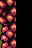

Something is wrong: 


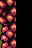

Something is wrong: 


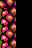

Something is wrong: 


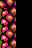

Something is wrong: 


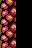

Something is wrong: 


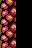

Something is wrong: 


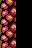

Something is wrong: 


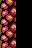

Something is wrong: 


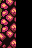

Something is wrong: 


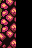

Something is wrong: 


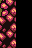

Something is wrong: 


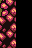

Something is wrong: 


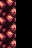

Something is wrong: 


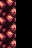

Something is wrong: 


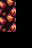

Something is wrong: 


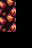

Something is wrong: 


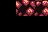

Something is wrong: 


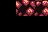

Something is wrong: 


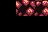

Something is wrong: 


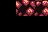

Something is wrong: 


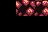

Something is wrong: 


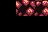

Something is wrong: 


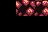

Something is wrong: 


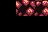

Something is wrong: 


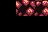

Something is wrong: 


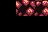

Something is wrong: 


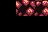

Something is wrong: 


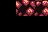

Something is wrong: 


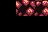

Something is wrong: 


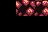

Something is wrong: 


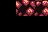

Something is wrong: 


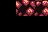

Something is wrong: 


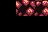

Something is wrong: 


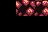

Something is wrong: 


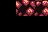

Something is wrong: 


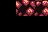

Something is wrong: 


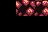

Something is wrong: 


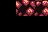

Something is wrong: 


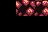

Something is wrong: 


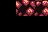

Something is wrong: 


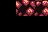

Something is wrong: 


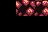

Something is wrong: 


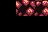

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_5
Something is wrong: 


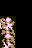

Something is wrong: 


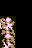

Something is wrong: 


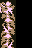

Something is wrong: 


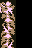

Something is wrong: 


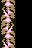

Something is wrong: 


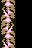

Something is wrong: 


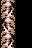

Something is wrong: 


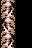

Something is wrong: 


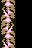

Something is wrong: 


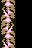

Something is wrong: 


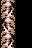

Something is wrong: 


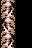

Something is wrong: 


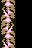

Something is wrong: 


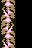

Something is wrong: 


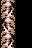

Something is wrong: 


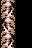

Something is wrong: 


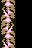

Something is wrong: 


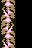

Something is wrong: 


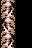

Something is wrong: 


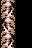

Something is wrong: 


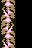

Something is wrong: 


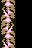

Something is wrong: 


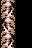

Something is wrong: 


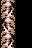

Something is wrong: 


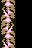

Something is wrong: 


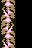

Something is wrong: 


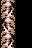

Something is wrong: 


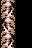

Something is wrong: 


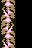

Something is wrong: 


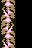

Something is wrong: 


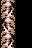

Something is wrong: 


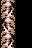

Something is wrong: 


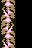

Something is wrong: 


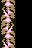

Something is wrong: 


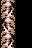

Something is wrong: 


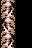

Something is wrong: 


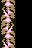

Something is wrong: 


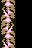

Something is wrong: 


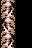

Something is wrong: 


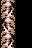

Something is wrong: 


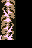

Something is wrong: 


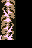

Something is wrong: 


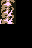

Something is wrong: 


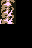

Something is wrong: 


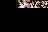

Something is wrong: 


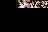

Something is wrong: 


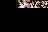

Something is wrong: 


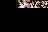

Something is wrong: 


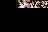

Something is wrong: 


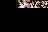

Something is wrong: 


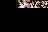

Something is wrong: 


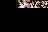

Something is wrong: 


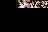

Something is wrong: 


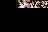

Something is wrong: 


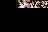

Something is wrong: 


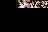

Something is wrong: 


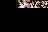

Something is wrong: 


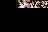

Something is wrong: 


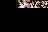

Something is wrong: 


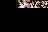

Something is wrong: 


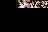

Something is wrong: 


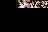

Something is wrong: 


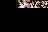

Something is wrong: 


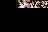

Something is wrong: 


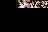

Something is wrong: 


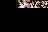

Something is wrong: 


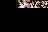

Something is wrong: 


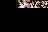

Something is wrong: 


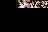

Something is wrong: 


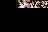

Something is wrong: 


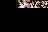

Something is wrong: 


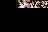

Something is wrong: 


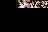

Something is wrong: 


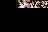

Something is wrong: 


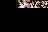

Something is wrong: 


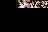

Something is wrong: 


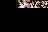

Something is wrong: 


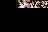

Something is wrong: 


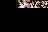

Something is wrong: 


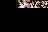

Something is wrong: 


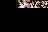

Something is wrong: 


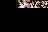

Something is wrong: 


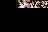

Something is wrong: 


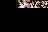

Something is wrong: 


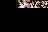

Something is wrong: 


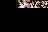

Something is wrong: 


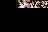

Something is wrong: 


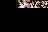

Something is wrong: 


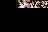

Something is wrong: 


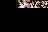

Something is wrong: 


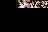

Something is wrong: 


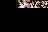

Something is wrong: 


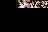

Something is wrong: 


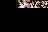

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_43
Something is wrong: 


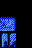

Something is wrong: 


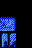

Something is wrong: 


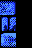

Something is wrong: 


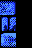

Something is wrong: 


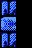

Something is wrong: 


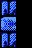

Something is wrong: 


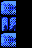

Something is wrong: 


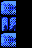

Something is wrong: 


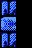

Something is wrong: 


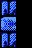

Something is wrong: 


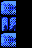

Something is wrong: 


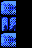

Something is wrong: 


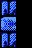

Something is wrong: 


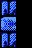

Something is wrong: 


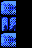

Something is wrong: 


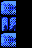

Something is wrong: 


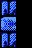

Something is wrong: 


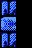

Something is wrong: 


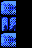

Something is wrong: 


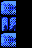

Something is wrong: 


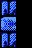

Something is wrong: 


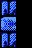

Something is wrong: 


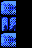

Something is wrong: 


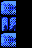

Something is wrong: 


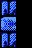

Something is wrong: 


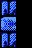

Something is wrong: 


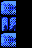

Something is wrong: 


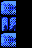

Something is wrong: 


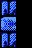

Something is wrong: 


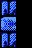

Something is wrong: 


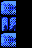

Something is wrong: 


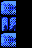

Something is wrong: 


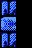

Something is wrong: 


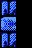

Something is wrong: 


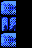

Something is wrong: 


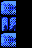

Something is wrong: 


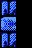

Something is wrong: 


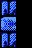

Something is wrong: 


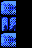

Something is wrong: 


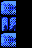

Something is wrong: 


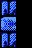

Something is wrong: 


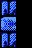

Something is wrong: 


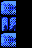

Something is wrong: 


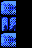

Something is wrong: 


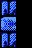

Something is wrong: 


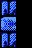

Something is wrong: 


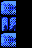

Something is wrong: 


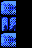

Something is wrong: 


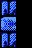

Something is wrong: 


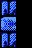

Something is wrong: 


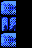

Something is wrong: 


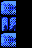

Something is wrong: 


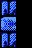

Something is wrong: 


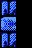

Something is wrong: 


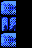

Something is wrong: 


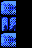

Something is wrong: 


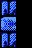

Something is wrong: 


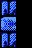

Something is wrong: 


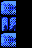

Something is wrong: 


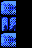

Something is wrong: 


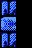

Something is wrong: 


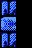

Something is wrong: 


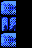

Something is wrong: 


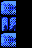

Something is wrong: 


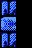

Something is wrong: 


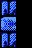

Something is wrong: 


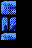

Something is wrong: 


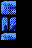

Something is wrong: 


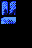

Something is wrong: 


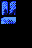

Something is wrong: 


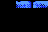

Something is wrong: 


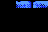

Something is wrong: 


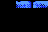

Something is wrong: 


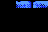

Something is wrong: 


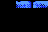

Something is wrong: 


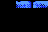

Something is wrong: 


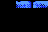

Something is wrong: 


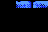

Something is wrong: 


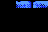

Something is wrong: 


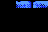

Something is wrong: 


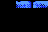

Something is wrong: 


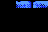

Something is wrong: 


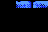

Something is wrong: 


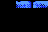

Something is wrong: 


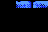

Something is wrong: 


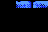

Something is wrong: 


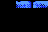

Something is wrong: 


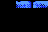

Something is wrong: 


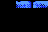

Something is wrong: 


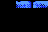

Something is wrong: 


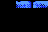

Something is wrong: 


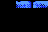

Something is wrong: 


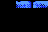

Something is wrong: 


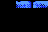

Something is wrong: 


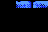

Something is wrong: 


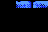

Something is wrong: 


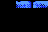

Something is wrong: 


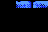

Something is wrong: 


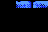

Something is wrong: 


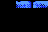

Something is wrong: 


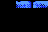

Something is wrong: 


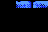

Something is wrong: 


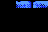

Something is wrong: 


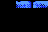

Something is wrong: 


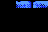

Something is wrong: 


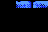

Something is wrong: 


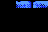

Something is wrong: 


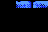

Something is wrong: 


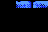

Something is wrong: 


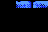

Something is wrong: 


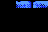

Something is wrong: 


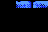

Something is wrong: 


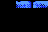

Something is wrong: 


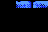

Something is wrong: 


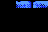

Something is wrong: 


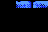

Something is wrong: 


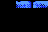

Something is wrong: 


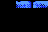

Something is wrong: 


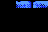

Something is wrong: 


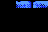

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_37
Something is wrong: 


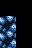

Something is wrong: 


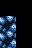

Something is wrong: 


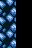

Something is wrong: 


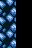

Something is wrong: 


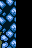

Something is wrong: 


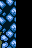

Something is wrong: 


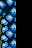

Something is wrong: 


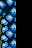

Something is wrong: 


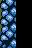

Something is wrong: 


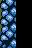

Something is wrong: 


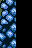

Something is wrong: 


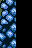

Something is wrong: 


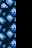

Something is wrong: 


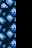

Something is wrong: 


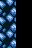

Something is wrong: 


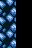

Something is wrong: 


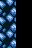

Something is wrong: 


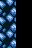

Something is wrong: 


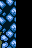

Something is wrong: 


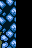

Something is wrong: 


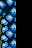

Something is wrong: 


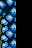

Something is wrong: 


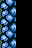

Something is wrong: 


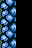

Something is wrong: 


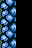

Something is wrong: 


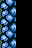

Something is wrong: 


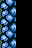

Something is wrong: 


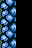

Something is wrong: 


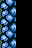

Something is wrong: 


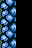

Something is wrong: 


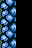

Something is wrong: 


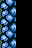

Something is wrong: 


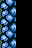

Something is wrong: 


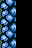

Something is wrong: 


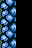

Something is wrong: 


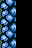

Something is wrong: 


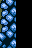

Something is wrong: 


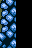

Something is wrong: 


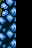

Something is wrong: 


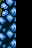

Something is wrong: 


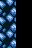

Something is wrong: 


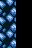

Something is wrong: 


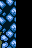

Something is wrong: 


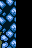

Something is wrong: 


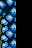

Something is wrong: 


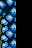

Something is wrong: 


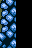

Something is wrong: 


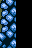

Something is wrong: 


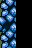

Something is wrong: 


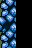

Something is wrong: 


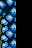

Something is wrong: 


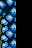

Something is wrong: 


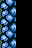

Something is wrong: 


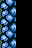

Something is wrong: 


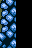

Something is wrong: 


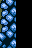

Something is wrong: 


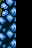

Something is wrong: 


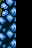

Something is wrong: 


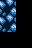

Something is wrong: 


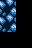

Something is wrong: 


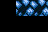

Something is wrong: 


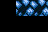

Something is wrong: 


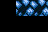

Something is wrong: 


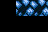

Something is wrong: 


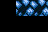

Something is wrong: 


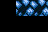

Something is wrong: 


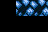

Something is wrong: 


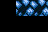

Something is wrong: 


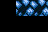

Something is wrong: 


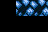

Something is wrong: 


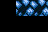

Something is wrong: 


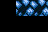

Something is wrong: 


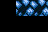

Something is wrong: 


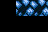

Something is wrong: 


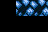

Something is wrong: 


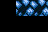

Something is wrong: 


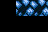

Something is wrong: 


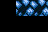

Something is wrong: 


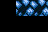

Something is wrong: 


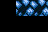

Something is wrong: 


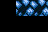

Something is wrong: 


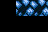

Something is wrong: 


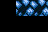

Something is wrong: 


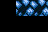

Something is wrong: 


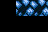

Something is wrong: 


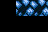

Something is wrong: 


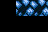

Something is wrong: 


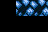

Something is wrong: 


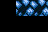

Something is wrong: 


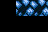

Something is wrong: 


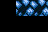

Something is wrong: 


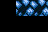

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_24
Something is wrong: 


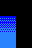

Something is wrong: 


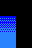

Something is wrong: 


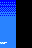

Something is wrong: 


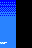

Something is wrong: 


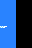

Something is wrong: 


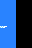

Something is wrong: 


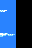

Something is wrong: 


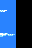

Something is wrong: 


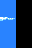

Something is wrong: 


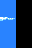

Something is wrong: 


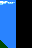

Something is wrong: 


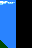

Something is wrong: 


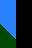

Something is wrong: 


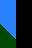

Something is wrong: 


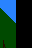

Something is wrong: 


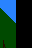

Something is wrong: 


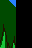

Something is wrong: 


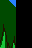

Something is wrong: 


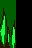

Something is wrong: 


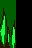

Something is wrong: 


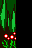

Something is wrong: 


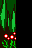

Something is wrong: 


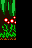

Something is wrong: 


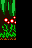

Something is wrong: 


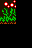

Something is wrong: 


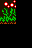

Something is wrong: 


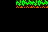

Something is wrong: 


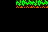

Something is wrong: 


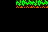

Something is wrong: 


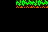

Something is wrong: 


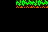

Something is wrong: 


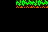

Something is wrong: 


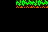

Something is wrong: 


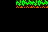

Something is wrong: 


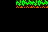

Something is wrong: 


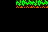

Something is wrong: 


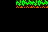

Something is wrong: 


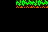

Something is wrong: 


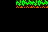

Something is wrong: 


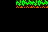

Something is wrong: 


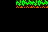

Something is wrong: 


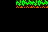

Something is wrong: 


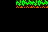

Something is wrong: 


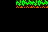

Something is wrong: 


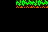

Something is wrong: 


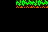

Something is wrong: 


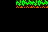

Something is wrong: 


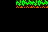

Something is wrong: 


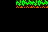

Something is wrong: 


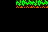

Something is wrong: 


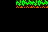

Something is wrong: 


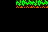

Something is wrong: 


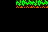

Something is wrong: 


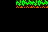

Something is wrong: 


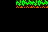

Something is wrong: 


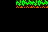

Something is wrong: 


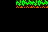

Something is wrong: 


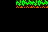

Something is wrong: 


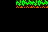

Something is wrong: 


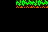

Something is wrong: 


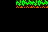

Something is wrong: 


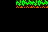

Something is wrong: 


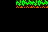

Something is wrong: 


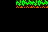

Something is wrong: 


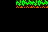

Something is wrong: 


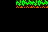

Something is wrong: 


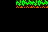

Something is wrong: 


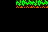

Something is wrong: 


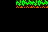

Something is wrong: 


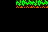

Something is wrong: 


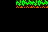

Something is wrong: 


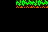

Something is wrong: 


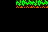

Something is wrong: 


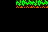

Something is wrong: 


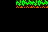

Something is wrong: 


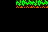

Something is wrong: 


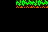

Something is wrong: 


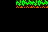

Something is wrong: 


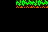

Something is wrong: 


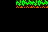

Something is wrong: 


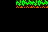

Something is wrong: 


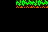

Something is wrong: 


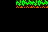

Something is wrong: 


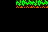

Something is wrong: 


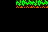

Something is wrong: 


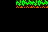

Something is wrong: 


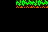

Something is wrong: 


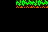

Something is wrong: 


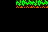

Something is wrong: 


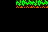

Something is wrong: 


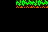

Something is wrong: 


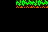

Something is wrong: 


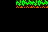

Something is wrong: 


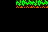

Something is wrong: 


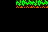

Something is wrong: 


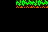

Something is wrong: 


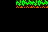

Something is wrong: 


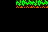

Something is wrong: 


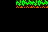

Something is wrong: 


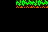

Something is wrong: 


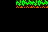

Something is wrong: 


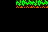

Something is wrong: 


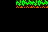

Something is wrong: 


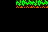

Something is wrong: 


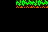

Something is wrong: 


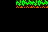

Something is wrong: 


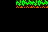

Something is wrong: 


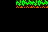

Something is wrong: 


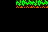

Something is wrong: 


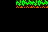

Something is wrong: 


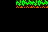

Something is wrong: 


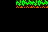

Something is wrong: 


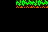

Something is wrong: 


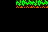

Something is wrong: 


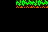

Something is wrong: 


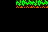

Something is wrong: 


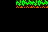

Something is wrong: 


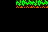

Something is wrong: 


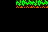

Something is wrong: 


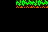

Something is wrong: 


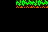

Something is wrong: 


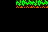

Something is wrong: 


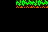

Something is wrong: 


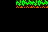

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_9
Something is wrong: 


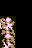

Something is wrong: 


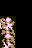

Something is wrong: 


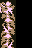

Something is wrong: 


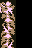

Something is wrong: 


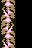

Something is wrong: 


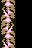

Something is wrong: 


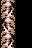

Something is wrong: 


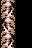

Something is wrong: 


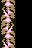

Something is wrong: 


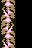

Something is wrong: 


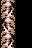

Something is wrong: 


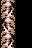

Something is wrong: 


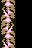

Something is wrong: 


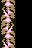

Something is wrong: 


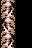

Something is wrong: 


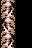

Something is wrong: 


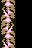

Something is wrong: 


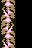

Something is wrong: 


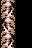

Something is wrong: 


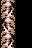

Something is wrong: 


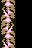

Something is wrong: 


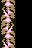

Something is wrong: 


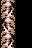

Something is wrong: 


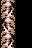

Something is wrong: 


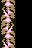

Something is wrong: 


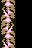

Something is wrong: 


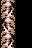

Something is wrong: 


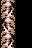

Something is wrong: 


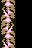

Something is wrong: 


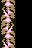

Something is wrong: 


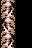

Something is wrong: 


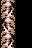

Something is wrong: 


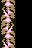

Something is wrong: 


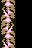

Something is wrong: 


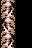

Something is wrong: 


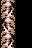

Something is wrong: 


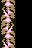

Something is wrong: 


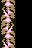

Something is wrong: 


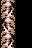

Something is wrong: 


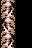

Something is wrong: 


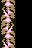

Something is wrong: 


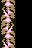

Something is wrong: 


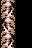

Something is wrong: 


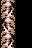

Something is wrong: 


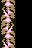

Something is wrong: 


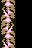

Something is wrong: 


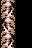

Something is wrong: 


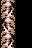

Something is wrong: 


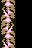

Something is wrong: 


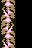

Something is wrong: 


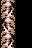

Something is wrong: 


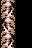

Something is wrong: 


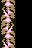

Something is wrong: 


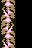

Something is wrong: 


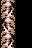

Something is wrong: 


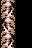

Something is wrong: 


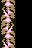

Something is wrong: 


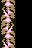

Something is wrong: 


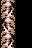

Something is wrong: 


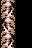

Something is wrong: 


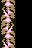

Something is wrong: 


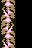

Something is wrong: 


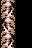

Something is wrong: 


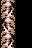

Something is wrong: 


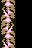

Something is wrong: 


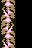

Something is wrong: 


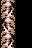

Something is wrong: 


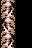

Something is wrong: 


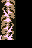

Something is wrong: 


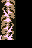

Something is wrong: 


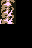

Something is wrong: 


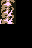

Something is wrong: 


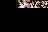

Something is wrong: 


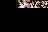

Something is wrong: 


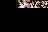

Something is wrong: 


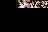

Something is wrong: 


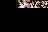

Something is wrong: 


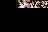

Something is wrong: 


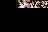

Something is wrong: 


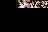

Something is wrong: 


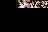

Something is wrong: 


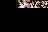

Something is wrong: 


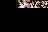

Something is wrong: 


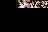

Something is wrong: 


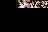

Something is wrong: 


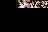

Something is wrong: 


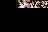

Something is wrong: 


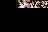

Something is wrong: 


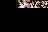

Something is wrong: 


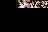

Something is wrong: 


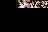

Something is wrong: 


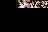

Something is wrong: 


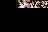

Something is wrong: 


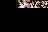

Something is wrong: 


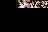

Something is wrong: 


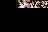

Something is wrong: 


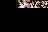

Something is wrong: 


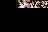

Something is wrong: 


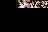

Something is wrong: 


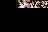

Something is wrong: 


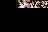

Something is wrong: 


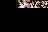

Something is wrong: 


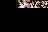

Something is wrong: 


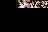

Something is wrong: 


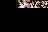

Something is wrong: 


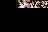

Something is wrong: 


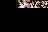

Something is wrong: 


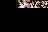

Something is wrong: 


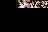

Something is wrong: 


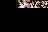

Something is wrong: 


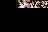

Something is wrong: 


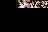

Something is wrong: 


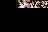

Something is wrong: 


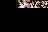

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_24
Something is wrong: 


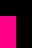

Something is wrong: 


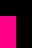

Something is wrong: 


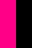

Something is wrong: 


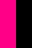

Something is wrong: 


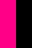

Something is wrong: 


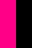

Something is wrong: 


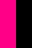

Something is wrong: 


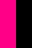

Something is wrong: 


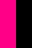

Something is wrong: 


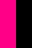

Something is wrong: 


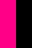

Something is wrong: 


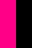

Something is wrong: 


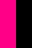

Something is wrong: 


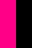

Something is wrong: 


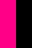

Something is wrong: 


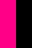

Something is wrong: 


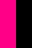

Something is wrong: 


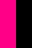

Something is wrong: 


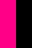

Something is wrong: 


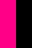

Something is wrong: 


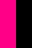

Something is wrong: 


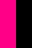

Something is wrong: 


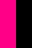

Something is wrong: 


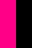

Something is wrong: 


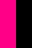

Something is wrong: 


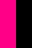

Something is wrong: 


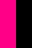

Something is wrong: 


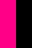

Something is wrong: 


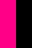

Something is wrong: 


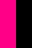

Something is wrong: 


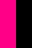

Something is wrong: 


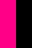

Something is wrong: 


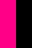

Something is wrong: 


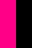

Something is wrong: 


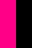

Something is wrong: 


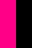

Something is wrong: 


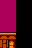

Something is wrong: 


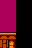

Something is wrong: 


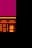

Something is wrong: 


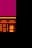

Something is wrong: 


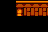

Something is wrong: 


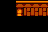

Something is wrong: 


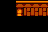

Something is wrong: 


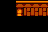

Something is wrong: 


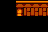

Something is wrong: 


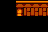

Something is wrong: 


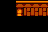

Something is wrong: 


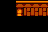

Something is wrong: 


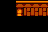

Something is wrong: 


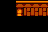

Something is wrong: 


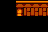

Something is wrong: 


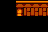

Something is wrong: 


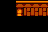

Something is wrong: 


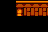

Something is wrong: 


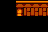

Something is wrong: 


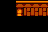

Something is wrong: 


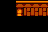

Something is wrong: 


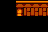

Something is wrong: 


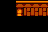

Something is wrong: 


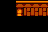

Something is wrong: 


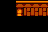

Something is wrong: 


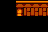

Something is wrong: 


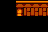

Something is wrong: 


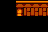

Something is wrong: 


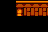

Something is wrong: 


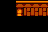

Something is wrong: 


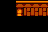

Something is wrong: 


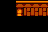

Something is wrong: 


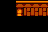

Something is wrong: 


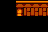

Something is wrong: 


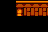

Something is wrong: 


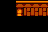

Something is wrong: 


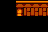

Something is wrong: 


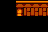

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_0_1
Something is wrong: 


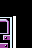

Something is wrong: 


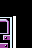

Something is wrong: 


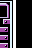

Something is wrong: 


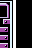

Something is wrong: 


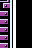

Something is wrong: 


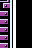

Something is wrong: 


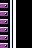

Something is wrong: 


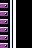

Something is wrong: 


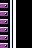

Something is wrong: 


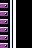

Something is wrong: 


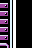

Something is wrong: 


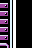

Something is wrong: 


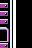

Something is wrong: 


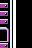

Something is wrong: 


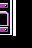

Something is wrong: 


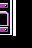

Something is wrong: 


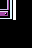

Something is wrong: 


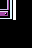

Something is wrong: 


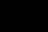

Something is wrong: 


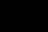

Something is wrong: 


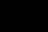

Something is wrong: 


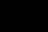

Something is wrong: 


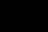

Something is wrong: 


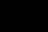

Something is wrong: 


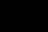

Something is wrong: 


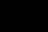

Something is wrong: 


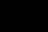

Something is wrong: 


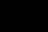

Something is wrong: 


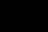

Something is wrong: 


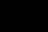

Something is wrong: 


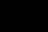

Something is wrong: 


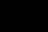

Something is wrong: 


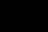

Something is wrong: 


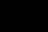

Something is wrong: 


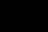

Something is wrong: 


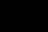

Something is wrong: 


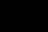

Something is wrong: 


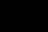

Something is wrong: 


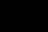

Something is wrong: 


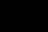

Something is wrong: 


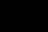

Something is wrong: 


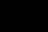

Something is wrong: 


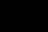

Something is wrong: 


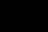

Something is wrong: 


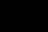

Something is wrong: 


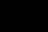

Something is wrong: 


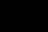

Something is wrong: 


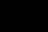

Something is wrong: 


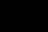

Something is wrong: 


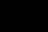

Something is wrong: 


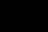

Something is wrong: 


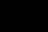

Something is wrong: 


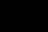

Something is wrong: 


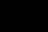

Something is wrong: 


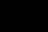

Something is wrong: 


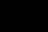

Something is wrong: 


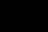

Something is wrong: 


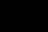

Something is wrong: 


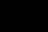

Something is wrong: 


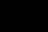

Something is wrong: 


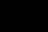

Something is wrong: 


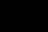

Something is wrong: 


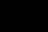

Something is wrong: 


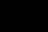

Something is wrong: 


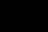

Something is wrong: 


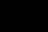

Something is wrong: 


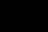

Something is wrong: 


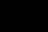

Something is wrong: 


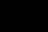

Something is wrong: 


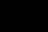

Something is wrong: 


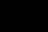

Something is wrong: 


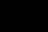

Something is wrong: 


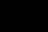

Something is wrong: 


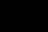

Something is wrong: 


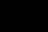

Something is wrong: 


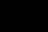

Something is wrong: 


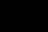

Something is wrong: 


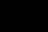

Something is wrong: 


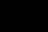

Something is wrong: 


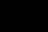

Something is wrong: 


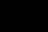

Something is wrong: 


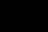

Something is wrong: 


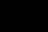

Something is wrong: 


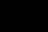

Something is wrong: 


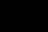

Something is wrong: 


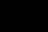

Something is wrong: 


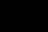

Something is wrong: 


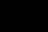

Something is wrong: 


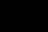

Something is wrong: 


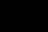

Something is wrong: 


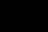

Something is wrong: 


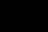

Something is wrong: 


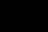

Something is wrong: 


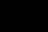

Something is wrong: 


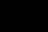

Something is wrong: 


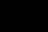

Something is wrong: 


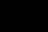

Something is wrong: 


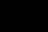

Something is wrong: 


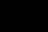

Something is wrong: 


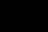

Something is wrong: 


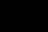

Something is wrong: 


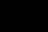

Something is wrong: 


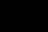

Something is wrong: 


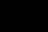

Something is wrong: 


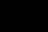

Something is wrong: 


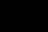

Something is wrong: 


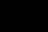

Something is wrong: 


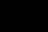

Something is wrong: 


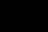

Something is wrong: 


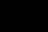

Something is wrong: 


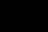

Something is wrong: 


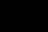

Something is wrong: 


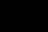

Something is wrong: 


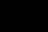

Something is wrong: 


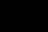

Something is wrong: 


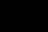

Something is wrong: 


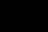

Something is wrong: 


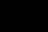

Something is wrong: 


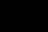

Something is wrong: 


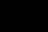

Something is wrong: 


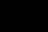

Something is wrong: 


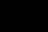

Something is wrong: 


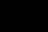

Something is wrong: 


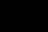

Something is wrong: 


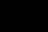

Something is wrong: 


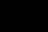

Something is wrong: 


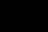

Something is wrong: 


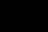

Something is wrong: 


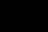

Something is wrong: 


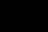

Something is wrong: 


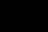

Something is wrong: 


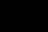

Something is wrong: 


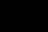

Something is wrong: 


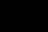

Something is wrong: 


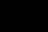

Something is wrong: 


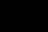

Something is wrong: 


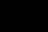

Something is wrong: 


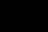

Something is wrong: 


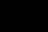

Something is wrong: 


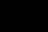

Something is wrong: 


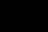

Something is wrong: 


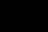

Something is wrong: 


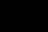

Something is wrong: 


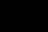

Something is wrong: 


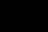

Something is wrong: 


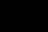

Something is wrong: 


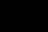

Something is wrong: 


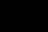

Something is wrong: 


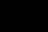

Something is wrong: 


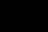

Something is wrong: 


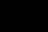

Something is wrong: 


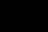

Something is wrong: 


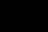

Something is wrong: 


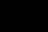

Something is wrong: 


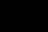

Something is wrong: 


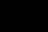

Something is wrong: 


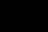

Something is wrong: 


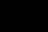

Something is wrong: 


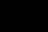

Something is wrong: 


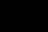

Something is wrong: 


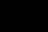

Something is wrong: 


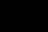

Something is wrong: 


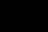

Something is wrong: 


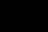

Something is wrong: 


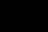

Something is wrong: 


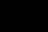

Something is wrong: 


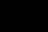

Something is wrong: 


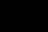

Something is wrong: 


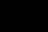

Something is wrong: 


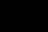

Something is wrong: 


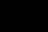

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_33
Something is wrong: 


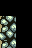

Something is wrong: 


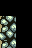

Something is wrong: 


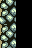

Something is wrong: 


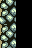

Something is wrong: 


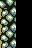

Something is wrong: 


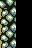

Something is wrong: 


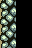

Something is wrong: 


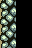

Something is wrong: 


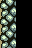

Something is wrong: 


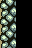

Something is wrong: 


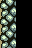

Something is wrong: 


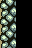

Something is wrong: 


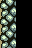

Something is wrong: 


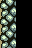

Something is wrong: 


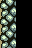

Something is wrong: 


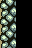

Something is wrong: 


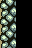

Something is wrong: 


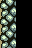

Something is wrong: 


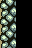

Something is wrong: 


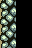

Something is wrong: 


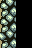

Something is wrong: 


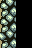

Something is wrong: 


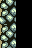

Something is wrong: 


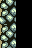

Something is wrong: 


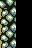

Something is wrong: 


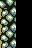

Something is wrong: 


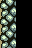

Something is wrong: 


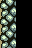

Something is wrong: 


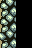

Something is wrong: 


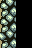

Something is wrong: 


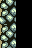

Something is wrong: 


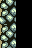

Something is wrong: 


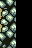

Something is wrong: 


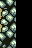

Something is wrong: 


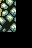

Something is wrong: 


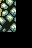

Something is wrong: 


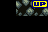

Something is wrong: 


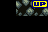

Something is wrong: 


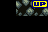

Something is wrong: 


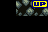

Something is wrong: 


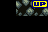

Something is wrong: 


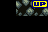

Something is wrong: 


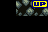

Something is wrong: 


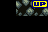

Something is wrong: 


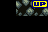

Something is wrong: 


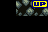

Something is wrong: 


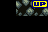

Something is wrong: 


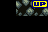

Something is wrong: 


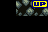

Something is wrong: 


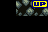

Something is wrong: 


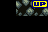

Something is wrong: 


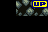

Something is wrong: 


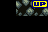

Something is wrong: 


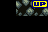

Something is wrong: 


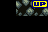

Something is wrong: 


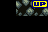

Something is wrong: 


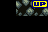

Something is wrong: 


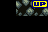

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_13
Something is wrong: 


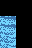

Something is wrong: 


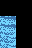

Something is wrong: 


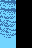

Something is wrong: 


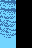

Something is wrong: 


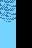

Something is wrong: 


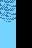

Something is wrong: 


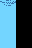

Something is wrong: 


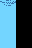

Something is wrong: 


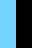

Something is wrong: 


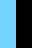

Something is wrong: 


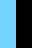

Something is wrong: 


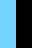

Something is wrong: 


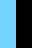

Something is wrong: 


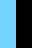

Something is wrong: 


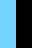

Something is wrong: 


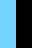

Something is wrong: 


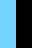

Something is wrong: 


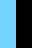

Something is wrong: 


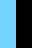

Something is wrong: 


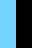

Something is wrong: 


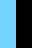

Something is wrong: 


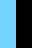

Something is wrong: 


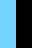

Something is wrong: 


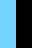

Something is wrong: 


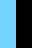

Something is wrong: 


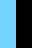

Something is wrong: 


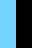

Something is wrong: 


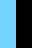

Something is wrong: 


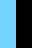

Something is wrong: 


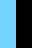

Something is wrong: 


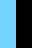

Something is wrong: 


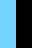

Something is wrong: 


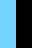

Something is wrong: 


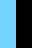

Something is wrong: 


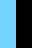

Something is wrong: 


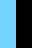

Something is wrong: 


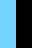

Something is wrong: 


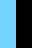

Something is wrong: 


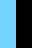

Something is wrong: 


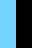

Something is wrong: 


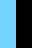

Something is wrong: 


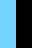

Something is wrong: 


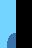

Something is wrong: 


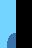

Something is wrong: 


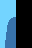

Something is wrong: 


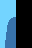

Something is wrong: 


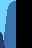

Something is wrong: 


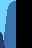

Something is wrong: 


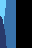

Something is wrong: 


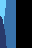

Something is wrong: 


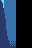

Something is wrong: 


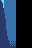

Something is wrong: 


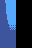

Something is wrong: 


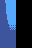

Something is wrong: 


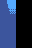

Something is wrong: 


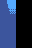

Something is wrong: 


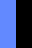

Something is wrong: 


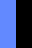

Something is wrong: 


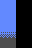

Something is wrong: 


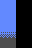

Something is wrong: 


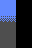

Something is wrong: 


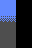

Something is wrong: 


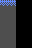

Something is wrong: 


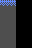

Something is wrong: 


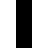

Something is wrong: 


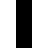

Something is wrong: 


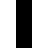

Something is wrong: 


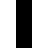

Something is wrong: 


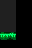

Something is wrong: 


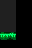

Something is wrong: 


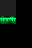

Something is wrong: 


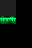

Something is wrong: 


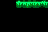

Something is wrong: 


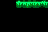

Something is wrong: 


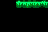

Something is wrong: 


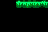

Something is wrong: 


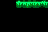

Something is wrong: 


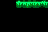

Something is wrong: 


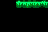

Something is wrong: 


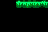

Something is wrong: 


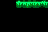

Something is wrong: 


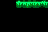

Something is wrong: 


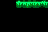

Something is wrong: 


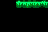

Something is wrong: 


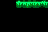

Something is wrong: 


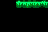

Something is wrong: 


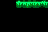

Something is wrong: 


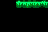

Something is wrong: 


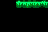

Something is wrong: 


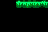

Something is wrong: 


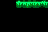

Something is wrong: 


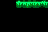

Something is wrong: 


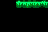

Something is wrong: 


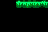

Something is wrong: 


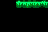

Something is wrong: 


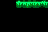

Something is wrong: 


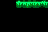

Something is wrong: 


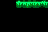

Something is wrong: 


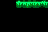

Something is wrong: 


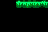

Something is wrong: 


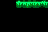

Something is wrong: 


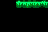

Something is wrong: 


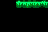

Something is wrong: 


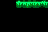

Something is wrong: 


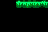

Something is wrong: 


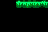

Something is wrong: 


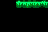

Something is wrong: 


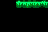

Something is wrong: 


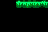

Something is wrong: 


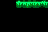

Something is wrong: 


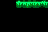

Something is wrong: 


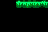

Something is wrong: 


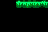

Something is wrong: 


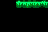

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_55
Something is wrong: 


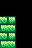

Something is wrong: 


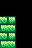

Something is wrong: 


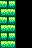

Something is wrong: 


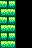

Something is wrong: 


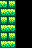

Something is wrong: 


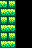

Something is wrong: 


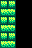

Something is wrong: 


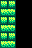

Something is wrong: 


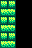

Something is wrong: 


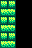

Something is wrong: 


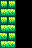

Something is wrong: 


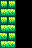

Something is wrong: 


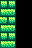

Something is wrong: 


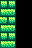

Something is wrong: 


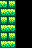

Something is wrong: 


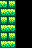

Something is wrong: 


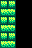

Something is wrong: 


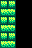

Something is wrong: 


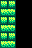

Something is wrong: 


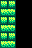

Something is wrong: 


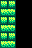

Something is wrong: 


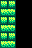

Something is wrong: 


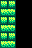

Something is wrong: 


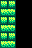

Something is wrong: 


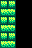

Something is wrong: 


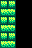

Something is wrong: 


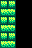

Something is wrong: 


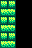

Something is wrong: 


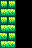

Something is wrong: 


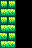

Something is wrong: 


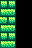

Something is wrong: 


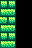

Something is wrong: 


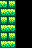

Something is wrong: 


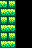

Something is wrong: 


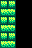

Something is wrong: 


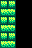

Something is wrong: 


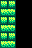

Something is wrong: 


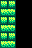

Something is wrong: 


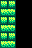

Something is wrong: 


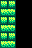

Something is wrong: 


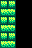

Something is wrong: 


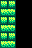

Something is wrong: 


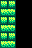

Something is wrong: 


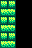

Something is wrong: 


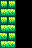

Something is wrong: 


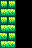

Something is wrong: 


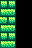

Something is wrong: 


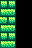

Something is wrong: 


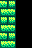

Something is wrong: 


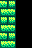

Something is wrong: 


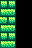

Something is wrong: 


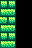

Something is wrong: 


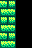

Something is wrong: 


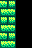

Something is wrong: 


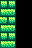

Something is wrong: 


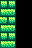

Something is wrong: 


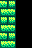

Something is wrong: 


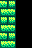

Something is wrong: 


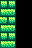

Something is wrong: 


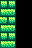

Something is wrong: 


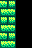

Something is wrong: 


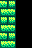

Something is wrong: 


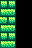

Something is wrong: 


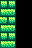

Something is wrong: 


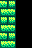

Something is wrong: 


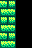

Something is wrong: 


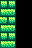

Something is wrong: 


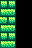

Something is wrong: 


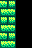

Something is wrong: 


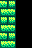

Something is wrong: 


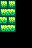

Something is wrong: 


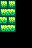

Something is wrong: 


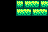

Something is wrong: 


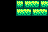

Something is wrong: 


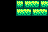

Something is wrong: 


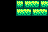

Something is wrong: 


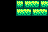

Something is wrong: 


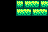

Something is wrong: 


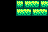

Something is wrong: 


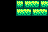

Something is wrong: 


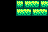

Something is wrong: 


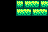

Something is wrong: 


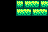

Something is wrong: 


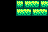

Something is wrong: 


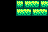

Something is wrong: 


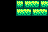

Something is wrong: 


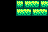

Something is wrong: 


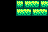

Something is wrong: 


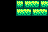

Something is wrong: 


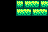

Something is wrong: 


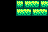

Something is wrong: 


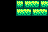

Something is wrong: 


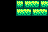

Something is wrong: 


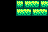

Something is wrong: 


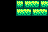

Something is wrong: 


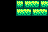

Something is wrong: 


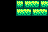

Something is wrong: 


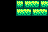

Something is wrong: 


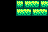

Something is wrong: 


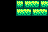

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_23
Something is wrong: 


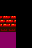

Something is wrong: 


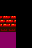

Something is wrong: 


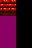

Something is wrong: 


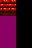

Something is wrong: 


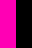

Something is wrong: 


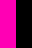

Something is wrong: 


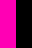

Something is wrong: 


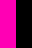

Something is wrong: 


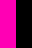

Something is wrong: 


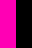

Something is wrong: 


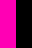

Something is wrong: 


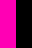

Something is wrong: 


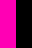

Something is wrong: 


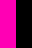

Something is wrong: 


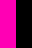

Something is wrong: 


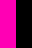

Something is wrong: 


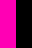

Something is wrong: 


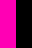

Something is wrong: 


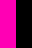

Something is wrong: 


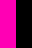

Something is wrong: 


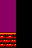

Something is wrong: 


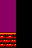

Something is wrong: 


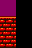

Something is wrong: 


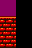

Something is wrong: 


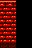

Something is wrong: 


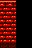

Something is wrong: 


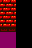

Something is wrong: 


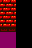

Something is wrong: 


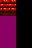

Something is wrong: 


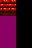

Something is wrong: 


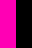

Something is wrong: 


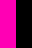

Something is wrong: 


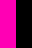

Something is wrong: 


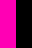

Something is wrong: 


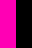

Something is wrong: 


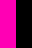

Something is wrong: 


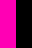

Something is wrong: 


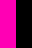

Something is wrong: 


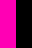

Something is wrong: 


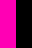

Something is wrong: 


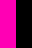

Something is wrong: 


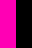

Something is wrong: 


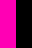

Something is wrong: 


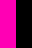

Something is wrong: 


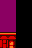

Something is wrong: 


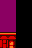

Something is wrong: 


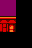

Something is wrong: 


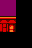

Something is wrong: 


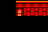

Something is wrong: 


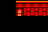

Something is wrong: 


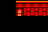

Something is wrong: 


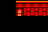

Something is wrong: 


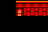

Something is wrong: 


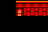

Something is wrong: 


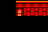

Something is wrong: 


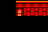

Something is wrong: 


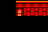

Something is wrong: 


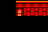

Something is wrong: 


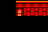

Something is wrong: 


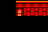

Something is wrong: 


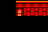

Something is wrong: 


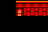

Something is wrong: 


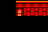

Something is wrong: 


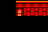

Something is wrong: 


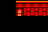

Something is wrong: 


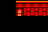

Something is wrong: 


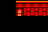

Something is wrong: 


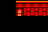

Something is wrong: 


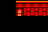

Something is wrong: 


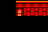

Something is wrong: 


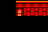

Something is wrong: 


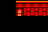

Something is wrong: 


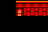

Something is wrong: 


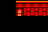

Something is wrong: 


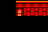

Something is wrong: 


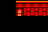

Something is wrong: 


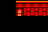

Something is wrong: 


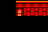

Something is wrong: 


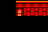

Something is wrong: 


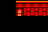

Something is wrong: 


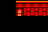

Something is wrong: 


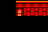

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_59
Something is wrong: 


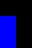

Something is wrong: 


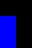

Something is wrong: 


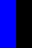

Something is wrong: 


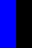

Something is wrong: 


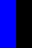

Something is wrong: 


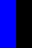

Something is wrong: 


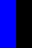

Something is wrong: 


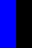

Something is wrong: 


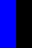

Something is wrong: 


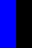

Something is wrong: 


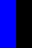

Something is wrong: 


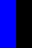

Something is wrong: 


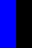

Something is wrong: 


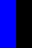

Something is wrong: 


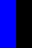

Something is wrong: 


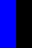

Something is wrong: 


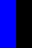

Something is wrong: 


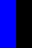

Something is wrong: 


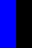

Something is wrong: 


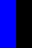

Something is wrong: 


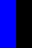

Something is wrong: 


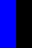

Something is wrong: 


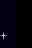

Something is wrong: 


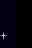

Something is wrong: 


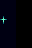

Something is wrong: 


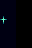

Something is wrong: 


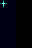

Something is wrong: 


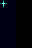

Something is wrong: 


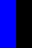

Something is wrong: 


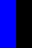

Something is wrong: 


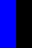

Something is wrong: 


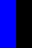

Something is wrong: 


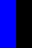

Something is wrong: 


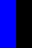

Something is wrong: 


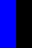

Something is wrong: 


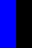

Something is wrong: 


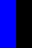

Something is wrong: 


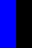

Something is wrong: 


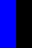

Something is wrong: 


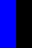

Something is wrong: 


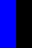

Something is wrong: 


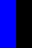

Something is wrong: 


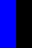

Something is wrong: 


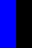

Something is wrong: 


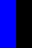

Something is wrong: 


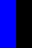

Something is wrong: 


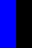

Something is wrong: 


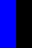

Something is wrong: 


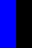

Something is wrong: 


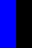

Something is wrong: 


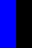

Something is wrong: 


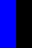

Something is wrong: 


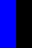

Something is wrong: 


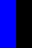

Something is wrong: 


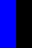

Something is wrong: 


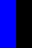

Something is wrong: 


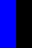

Something is wrong: 


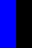

Something is wrong: 


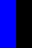

Something is wrong: 


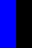

Something is wrong: 


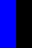

Something is wrong: 


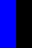

Something is wrong: 


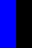

Something is wrong: 


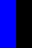

Something is wrong: 


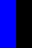

Something is wrong: 


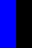

Something is wrong: 


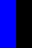

Something is wrong: 


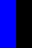

Something is wrong: 


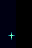

Something is wrong: 


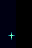

Something is wrong: 


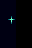

Something is wrong: 


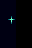

Something is wrong: 


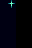

Something is wrong: 


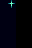

Something is wrong: 


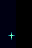

Something is wrong: 


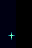

Something is wrong: 


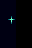

Something is wrong: 


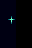

Something is wrong: 


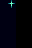

Something is wrong: 


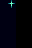

Something is wrong: 


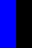

Something is wrong: 


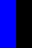

Something is wrong: 


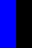

Something is wrong: 


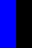

Something is wrong: 


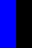

Something is wrong: 


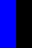

Something is wrong: 


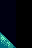

Something is wrong: 


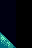

Something is wrong: 


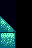

Something is wrong: 


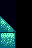

Something is wrong: 


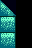

Something is wrong: 


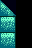

Something is wrong: 


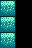

Something is wrong: 


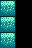

Something is wrong: 


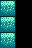

Something is wrong: 


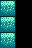

Something is wrong: 


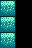

Something is wrong: 


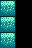

Something is wrong: 


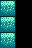

Something is wrong: 


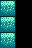

Something is wrong: 


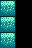

Something is wrong: 


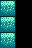

Something is wrong: 


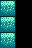

Something is wrong: 


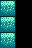

Something is wrong: 


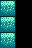

Something is wrong: 


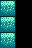

Something is wrong: 


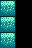

Something is wrong: 


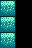

Something is wrong: 


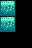

Something is wrong: 


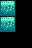

Something is wrong: 


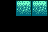

Something is wrong: 


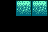

Something is wrong: 


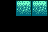

Something is wrong: 


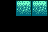

Something is wrong: 


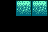

Something is wrong: 


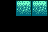

Something is wrong: 


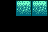

Something is wrong: 


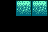

Something is wrong: 


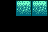

Something is wrong: 


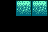

Something is wrong: 


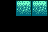

Something is wrong: 


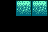

Something is wrong: 


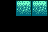

Something is wrong: 


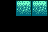

Something is wrong: 


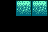

Something is wrong: 


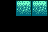

Something is wrong: 


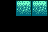

Something is wrong: 


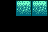

Something is wrong: 


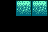

Something is wrong: 


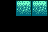

Something is wrong: 


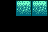

Something is wrong: 


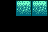

Something is wrong: 


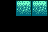

Something is wrong: 


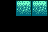

Something is wrong: 


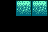

Something is wrong: 


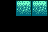

Something is wrong: 


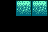

Something is wrong: 


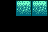

Something is wrong: 


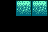

Something is wrong: 


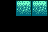

Something is wrong: 


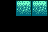

Something is wrong: 


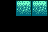

Something is wrong: 


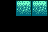

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_8
Something is wrong: 


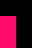

Something is wrong: 


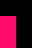

Something is wrong: 


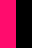

Something is wrong: 


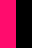

Something is wrong: 


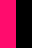

Something is wrong: 


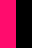

Something is wrong: 


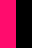

Something is wrong: 


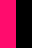

Something is wrong: 


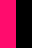

Something is wrong: 


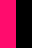

Something is wrong: 


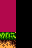

Something is wrong: 


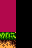

Something is wrong: 


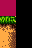

Something is wrong: 


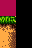

Something is wrong: 


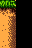

Something is wrong: 


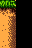

Something is wrong: 


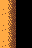

Something is wrong: 


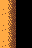

Something is wrong: 


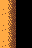

Something is wrong: 


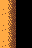

Something is wrong: 


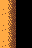

Something is wrong: 


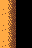

Something is wrong: 


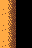

Something is wrong: 


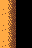

Something is wrong: 


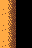

Something is wrong: 


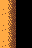

Something is wrong: 


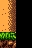

Something is wrong: 


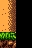

Something is wrong: 


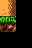

Something is wrong: 


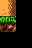

Something is wrong: 


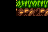

Something is wrong: 


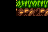

Something is wrong: 


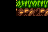

Something is wrong: 


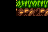

Something is wrong: 


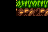

Something is wrong: 


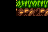

Something is wrong: 


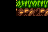

Something is wrong: 


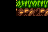

Something is wrong: 


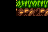

Something is wrong: 


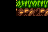

Something is wrong: 


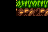

Something is wrong: 


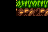

Something is wrong: 


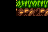

Something is wrong: 


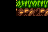

Something is wrong: 


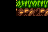

Something is wrong: 


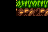

Something is wrong: 


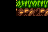

Something is wrong: 


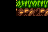

Something is wrong: 


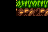

Something is wrong: 


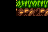

Something is wrong: 


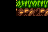

Something is wrong: 


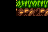

Something is wrong: 


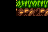

Something is wrong: 


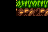

Something is wrong: 


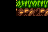

Something is wrong: 


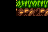

Something is wrong: 


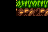

Something is wrong: 


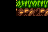

Something is wrong: 


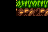

Something is wrong: 


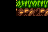

Something is wrong: 


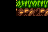

Something is wrong: 


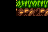

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_22
Something is wrong: 


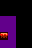

Something is wrong: 


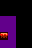

Something is wrong: 


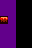

Something is wrong: 


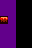

Something is wrong: 


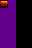

Something is wrong: 


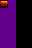

Something is wrong: 


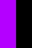

Something is wrong: 


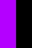

Something is wrong: 


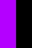

Something is wrong: 


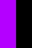

Something is wrong: 


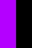

Something is wrong: 


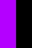

Something is wrong: 


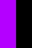

Something is wrong: 


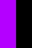

Something is wrong: 


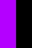

Something is wrong: 


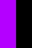

Something is wrong: 


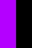

Something is wrong: 


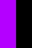

Something is wrong: 


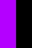

Something is wrong: 


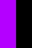

Something is wrong: 


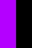

Something is wrong: 


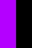

Something is wrong: 


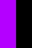

Something is wrong: 


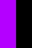

Something is wrong: 


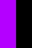

Something is wrong: 


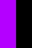

Something is wrong: 


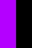

Something is wrong: 


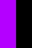

Something is wrong: 


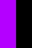

Something is wrong: 


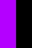

Something is wrong: 


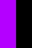

Something is wrong: 


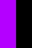

Something is wrong: 


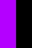

Something is wrong: 


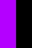

Something is wrong: 


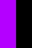

Something is wrong: 


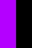

Something is wrong: 


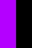

Something is wrong: 


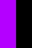

Something is wrong: 


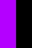

Something is wrong: 


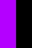

Something is wrong: 


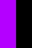

Something is wrong: 


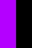

Something is wrong: 


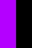

Something is wrong: 


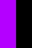

Something is wrong: 


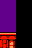

Something is wrong: 


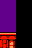

Something is wrong: 


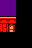

Something is wrong: 


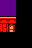

Something is wrong: 


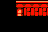

Something is wrong: 


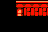

Something is wrong: 


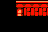

Something is wrong: 


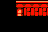

Something is wrong: 


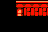

Something is wrong: 


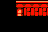

Something is wrong: 


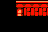

Something is wrong: 


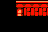

Something is wrong: 


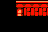

Something is wrong: 


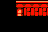

Something is wrong: 


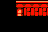

Something is wrong: 


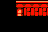

Something is wrong: 


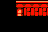

Something is wrong: 


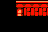

Something is wrong: 


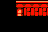

Something is wrong: 


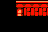

Something is wrong: 


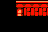

Something is wrong: 


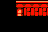

Something is wrong: 


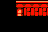

Something is wrong: 


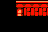

Something is wrong: 


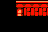

Something is wrong: 


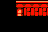

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_32
Something is wrong: 


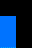

Something is wrong: 


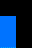

Something is wrong: 


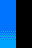

Something is wrong: 


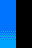

Something is wrong: 


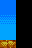

Something is wrong: 


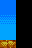

Something is wrong: 


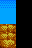

Something is wrong: 


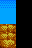

Something is wrong: 


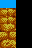

Something is wrong: 


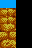

Something is wrong: 


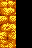

Something is wrong: 


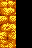

Something is wrong: 


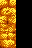

Something is wrong: 


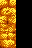

Something is wrong: 


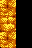

Something is wrong: 


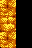

Something is wrong: 


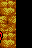

Something is wrong: 


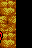

Something is wrong: 


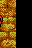

Something is wrong: 


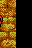

Something is wrong: 


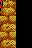

Something is wrong: 


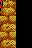

Something is wrong: 


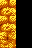

Something is wrong: 


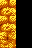

Something is wrong: 


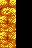

Something is wrong: 


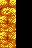

Something is wrong: 


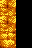

Something is wrong: 


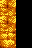

Something is wrong: 


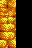

Something is wrong: 


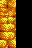

Something is wrong: 


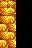

Something is wrong: 


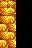

Something is wrong: 


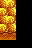

Something is wrong: 


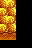

Something is wrong: 


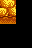

Something is wrong: 


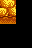

Something is wrong: 


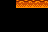

Something is wrong: 


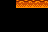

Something is wrong: 


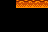

Something is wrong: 


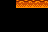

Something is wrong: 


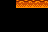

Something is wrong: 


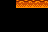

Something is wrong: 


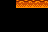

Something is wrong: 


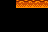

Something is wrong: 


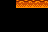

Something is wrong: 


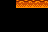

Something is wrong: 


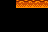

Something is wrong: 


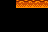

Something is wrong: 


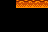

Something is wrong: 


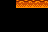

Something is wrong: 


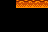

Something is wrong: 


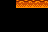

Something is wrong: 


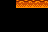

Something is wrong: 


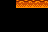

Something is wrong: 


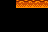

Something is wrong: 


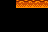

Something is wrong: 


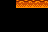

Something is wrong: 


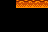

Something is wrong: 


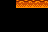

Something is wrong: 


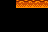

Something is wrong: 


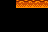

Something is wrong: 


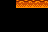

Something is wrong: 


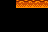

Something is wrong: 


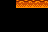

Something is wrong: 


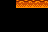

Something is wrong: 


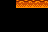

Something is wrong: 


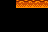

Something is wrong: 


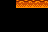

Something is wrong: 


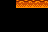

Something is wrong: 


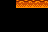

Something is wrong: 


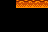

Something is wrong: 


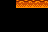

Something is wrong: 


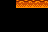

Something is wrong: 


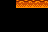

Something is wrong: 


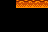

Something is wrong: 


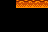

Something is wrong: 


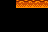

Something is wrong: 


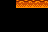

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_56
Something is wrong: 


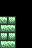

Something is wrong: 


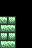

Something is wrong: 


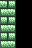

Something is wrong: 


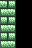

Something is wrong: 


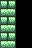

Something is wrong: 


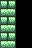

Something is wrong: 


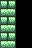

Something is wrong: 


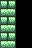

Something is wrong: 


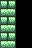

Something is wrong: 


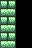

Something is wrong: 


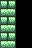

Something is wrong: 


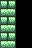

Something is wrong: 


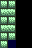

Something is wrong: 


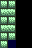

Something is wrong: 


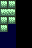

Something is wrong: 


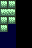

Something is wrong: 


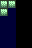

Something is wrong: 


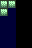

Something is wrong: 


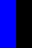

Something is wrong: 


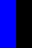

Something is wrong: 


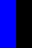

Something is wrong: 


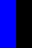

Something is wrong: 


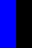

Something is wrong: 


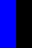

Something is wrong: 


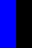

Something is wrong: 


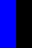

Something is wrong: 


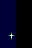

Something is wrong: 


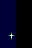

Something is wrong: 


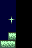

Something is wrong: 


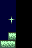

Something is wrong: 


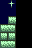

Something is wrong: 


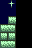

Something is wrong: 


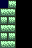

Something is wrong: 


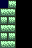

Something is wrong: 


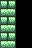

Something is wrong: 


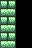

Something is wrong: 


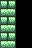

Something is wrong: 


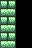

Something is wrong: 


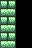

Something is wrong: 


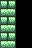

Something is wrong: 


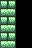

Something is wrong: 


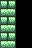

Something is wrong: 


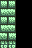

Something is wrong: 


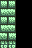

Something is wrong: 


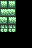

Something is wrong: 


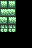

Something is wrong: 


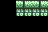

Something is wrong: 


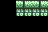

Something is wrong: 


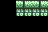

Something is wrong: 


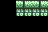

Something is wrong: 


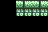

Something is wrong: 


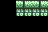

Something is wrong: 


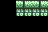

Something is wrong: 


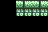

Something is wrong: 


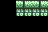

Something is wrong: 


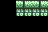

Something is wrong: 


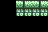

Something is wrong: 


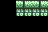

Something is wrong: 


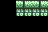

Something is wrong: 


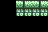

Something is wrong: 


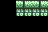

Something is wrong: 


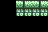

Something is wrong: 


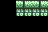

Something is wrong: 


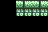

Something is wrong: 


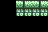

Something is wrong: 


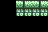

Something is wrong: 


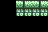

Something is wrong: 


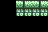

Something is wrong: 


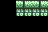

Something is wrong: 


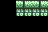

Something is wrong: 


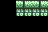

Something is wrong: 


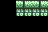

Something is wrong: 


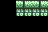

Something is wrong: 


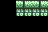

Something is wrong: 


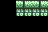

Something is wrong: 


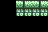

Something is wrong: 


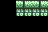

Something is wrong: 


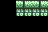

Something is wrong: 


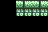

Something is wrong: 


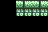

Something is wrong: 


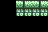

Something is wrong: 


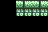

Something is wrong: 


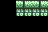

Something is wrong: 


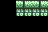

Something is wrong: 


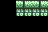

Something is wrong: 


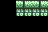

Something is wrong: 


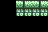

Something is wrong: 


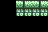

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_21
Something is wrong: 


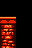

Something is wrong: 


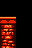

Something is wrong: 


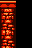

Something is wrong: 


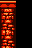

Something is wrong: 


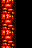

Something is wrong: 


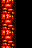

Something is wrong: 


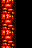

Something is wrong: 


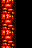

Something is wrong: 


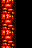

Something is wrong: 


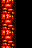

Something is wrong: 


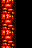

Something is wrong: 


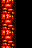

Something is wrong: 


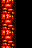

Something is wrong: 


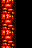

Something is wrong: 


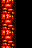

Something is wrong: 


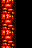

Something is wrong: 


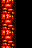

Something is wrong: 


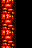

Something is wrong: 


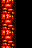

Something is wrong: 


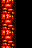

Something is wrong: 


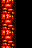

Something is wrong: 


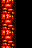

Something is wrong: 


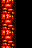

Something is wrong: 


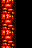

Something is wrong: 


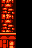

Something is wrong: 


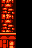

Something is wrong: 


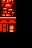

Something is wrong: 


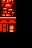

Something is wrong: 


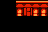

Something is wrong: 


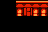

Something is wrong: 


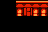

Something is wrong: 


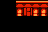

Something is wrong: 


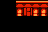

Something is wrong: 


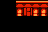

Something is wrong: 


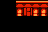

Something is wrong: 


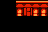

Something is wrong: 


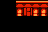

Something is wrong: 


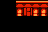

Something is wrong: 


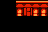

Something is wrong: 


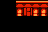

Something is wrong: 


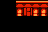

Something is wrong: 


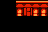

Something is wrong: 


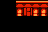

Something is wrong: 


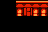

Something is wrong: 


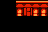

Something is wrong: 


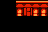

Something is wrong: 


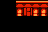

Something is wrong: 


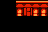

Something is wrong: 


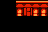

Something is wrong: 


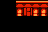

Something is wrong: 


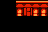

Something is wrong: 


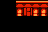

Something is wrong: 


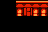

Something is wrong: 


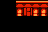

Something is wrong: 


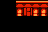

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_8
Something is wrong: 


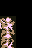

Something is wrong: 


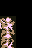

Something is wrong: 


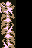

Something is wrong: 


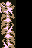

Something is wrong: 


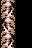

Something is wrong: 


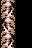

Something is wrong: 


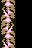

Something is wrong: 


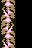

Something is wrong: 


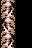

Something is wrong: 


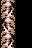

Something is wrong: 


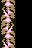

Something is wrong: 


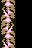

Something is wrong: 


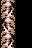

Something is wrong: 


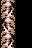

Something is wrong: 


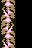

Something is wrong: 


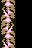

Something is wrong: 


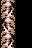

Something is wrong: 


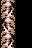

Something is wrong: 


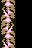

Something is wrong: 


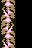

Something is wrong: 


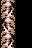

Something is wrong: 


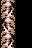

Something is wrong: 


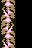

Something is wrong: 


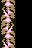

Something is wrong: 


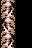

Something is wrong: 


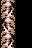

Something is wrong: 


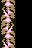

Something is wrong: 


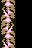

Something is wrong: 


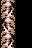

Something is wrong: 


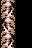

Something is wrong: 


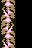

Something is wrong: 


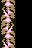

Something is wrong: 


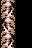

Something is wrong: 


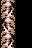

Something is wrong: 


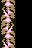

Something is wrong: 


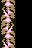

Something is wrong: 


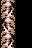

Something is wrong: 


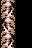

Something is wrong: 


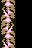

Something is wrong: 


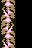

Something is wrong: 


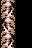

Something is wrong: 


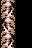

Something is wrong: 


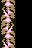

Something is wrong: 


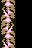

Something is wrong: 


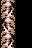

Something is wrong: 


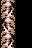

Something is wrong: 


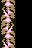

Something is wrong: 


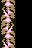

Something is wrong: 


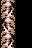

Something is wrong: 


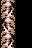

Something is wrong: 


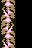

Something is wrong: 


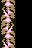

Something is wrong: 


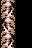

Something is wrong: 


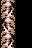

Something is wrong: 


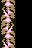

Something is wrong: 


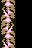

Something is wrong: 


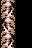

Something is wrong: 


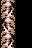

Something is wrong: 


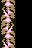

Something is wrong: 


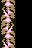

Something is wrong: 


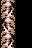

Something is wrong: 


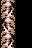

Something is wrong: 


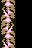

Something is wrong: 


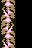

Something is wrong: 


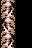

Something is wrong: 


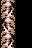

Something is wrong: 


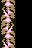

Something is wrong: 


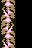

Something is wrong: 


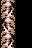

Something is wrong: 


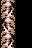

Something is wrong: 


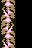

Something is wrong: 


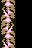

Something is wrong: 


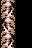

Something is wrong: 


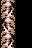

Something is wrong: 


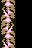

Something is wrong: 


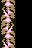

Something is wrong: 


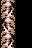

Something is wrong: 


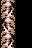

Something is wrong: 


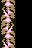

Something is wrong: 


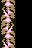

Something is wrong: 


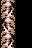

Something is wrong: 


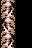

Something is wrong: 


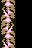

Something is wrong: 


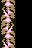

Something is wrong: 


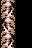

Something is wrong: 


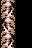

Something is wrong: 


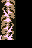

Something is wrong: 


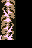

Something is wrong: 


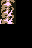

Something is wrong: 


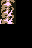

Something is wrong: 


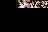

Something is wrong: 


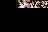

Something is wrong: 


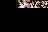

Something is wrong: 


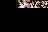

Something is wrong: 


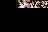

Something is wrong: 


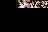

Something is wrong: 


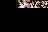

Something is wrong: 


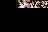

Something is wrong: 


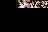

Something is wrong: 


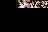

Something is wrong: 


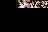

Something is wrong: 


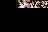

Something is wrong: 


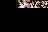

Something is wrong: 


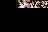

Something is wrong: 


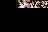

Something is wrong: 


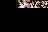

Something is wrong: 


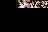

Something is wrong: 


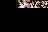

Something is wrong: 


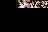

Something is wrong: 


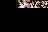

Something is wrong: 


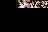

Something is wrong: 


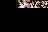

Something is wrong: 


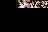

Something is wrong: 


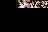

Something is wrong: 


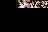

Something is wrong: 


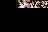

Something is wrong: 


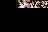

Something is wrong: 


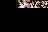

Something is wrong: 


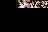

Something is wrong: 


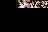

Something is wrong: 


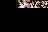

Something is wrong: 


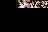

Something is wrong: 


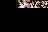

Something is wrong: 


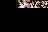

Something is wrong: 


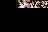

Something is wrong: 


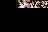

Something is wrong: 


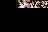

Something is wrong: 


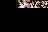

Something is wrong: 


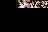

Something is wrong: 


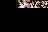

Something is wrong: 


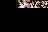

Something is wrong: 


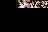

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_11
Something is wrong: 


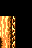

Something is wrong: 


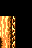

Something is wrong: 


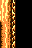

Something is wrong: 


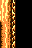

Something is wrong: 


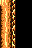

Something is wrong: 


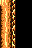

Something is wrong: 


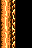

Something is wrong: 


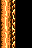

Something is wrong: 


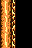

Something is wrong: 


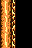

Something is wrong: 


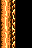

Something is wrong: 


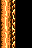

Something is wrong: 


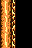

Something is wrong: 


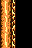

Something is wrong: 


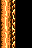

Something is wrong: 


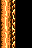

Something is wrong: 


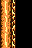

Something is wrong: 


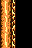

Something is wrong: 


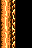

Something is wrong: 


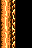

Something is wrong: 


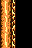

Something is wrong: 


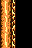

Something is wrong: 


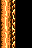

Something is wrong: 


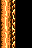

Something is wrong: 


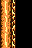

Something is wrong: 


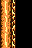

Something is wrong: 


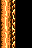

Something is wrong: 


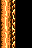

Something is wrong: 


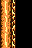

Something is wrong: 


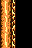

Something is wrong: 


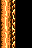

Something is wrong: 


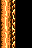

Something is wrong: 


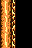

Something is wrong: 


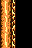

Something is wrong: 


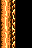

Something is wrong: 


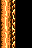

Something is wrong: 


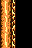

Something is wrong: 


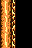

Something is wrong: 


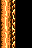

Something is wrong: 


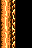

Something is wrong: 


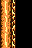

Something is wrong: 


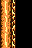

Something is wrong: 


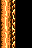

Something is wrong: 


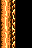

Something is wrong: 


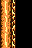

Something is wrong: 


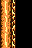

Something is wrong: 


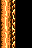

Something is wrong: 


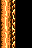

Something is wrong: 


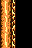

Something is wrong: 


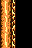

Something is wrong: 


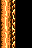

Something is wrong: 


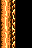

Something is wrong: 


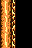

Something is wrong: 


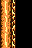

Something is wrong: 


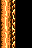

Something is wrong: 


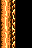

Something is wrong: 


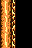

Something is wrong: 


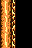

Something is wrong: 


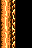

Something is wrong: 


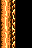

Something is wrong: 


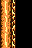

Something is wrong: 


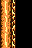

Something is wrong: 


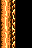

Something is wrong: 


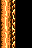

Something is wrong: 


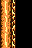

Something is wrong: 


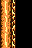

Something is wrong: 


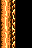

Something is wrong: 


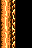

Something is wrong: 


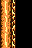

Something is wrong: 


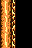

Something is wrong: 


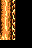

Something is wrong: 


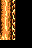

Something is wrong: 


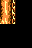

Something is wrong: 


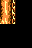

Something is wrong: 


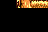

Something is wrong: 


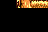

Something is wrong: 


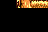

Something is wrong: 


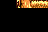

Something is wrong: 


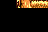

Something is wrong: 


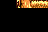

Something is wrong: 


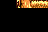

Something is wrong: 


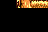

Something is wrong: 


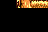

Something is wrong: 


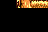

Something is wrong: 


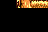

Something is wrong: 


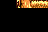

Something is wrong: 


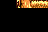

Something is wrong: 


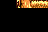

Something is wrong: 


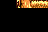

Something is wrong: 


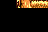

Something is wrong: 


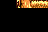

Something is wrong: 


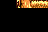

Something is wrong: 


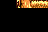

Something is wrong: 


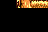

Something is wrong: 


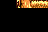

Something is wrong: 


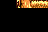

Something is wrong: 


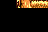

Something is wrong: 


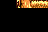

Something is wrong: 


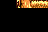

Something is wrong: 


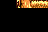

Something is wrong: 


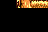

Something is wrong: 


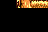

Something is wrong: 


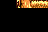

Something is wrong: 


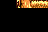

Something is wrong: 


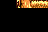

Something is wrong: 


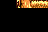

Something is wrong: 


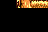

Something is wrong: 


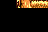

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_35
Something is wrong: 


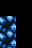

Something is wrong: 


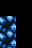

Something is wrong: 


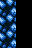

Something is wrong: 


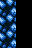

Something is wrong: 


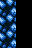

Something is wrong: 


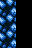

Something is wrong: 


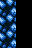

Something is wrong: 


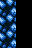

Something is wrong: 


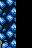

Something is wrong: 


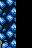

Something is wrong: 


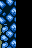

Something is wrong: 


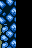

Something is wrong: 


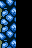

Something is wrong: 


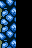

Something is wrong: 


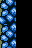

Something is wrong: 


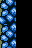

Something is wrong: 


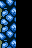

Something is wrong: 


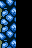

Something is wrong: 


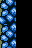

Something is wrong: 


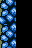

Something is wrong: 


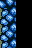

Something is wrong: 


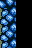

Something is wrong: 


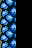

Something is wrong: 


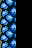

Something is wrong: 


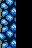

Something is wrong: 


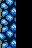

Something is wrong: 


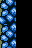

Something is wrong: 


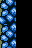

Something is wrong: 


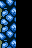

Something is wrong: 


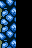

Something is wrong: 


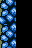

Something is wrong: 


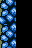

Something is wrong: 


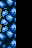

Something is wrong: 


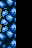

Something is wrong: 


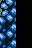

Something is wrong: 


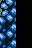

Something is wrong: 


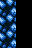

Something is wrong: 


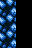

Something is wrong: 


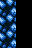

Something is wrong: 


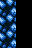

Something is wrong: 


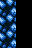

Something is wrong: 


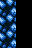

Something is wrong: 


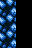

Something is wrong: 


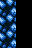

Something is wrong: 


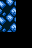

Something is wrong: 


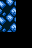

Something is wrong: 


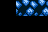

Something is wrong: 


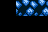

Something is wrong: 


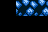

Something is wrong: 


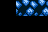

Something is wrong: 


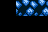

Something is wrong: 


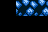

Something is wrong: 


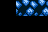

Something is wrong: 


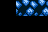

Something is wrong: 


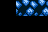

Something is wrong: 


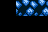

Something is wrong: 


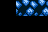

Something is wrong: 


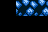

Something is wrong: 


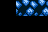

Something is wrong: 


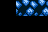

Something is wrong: 


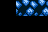

Something is wrong: 


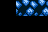

Something is wrong: 


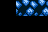

Something is wrong: 


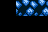

Something is wrong: 


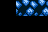

Something is wrong: 


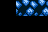

Something is wrong: 


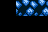

Something is wrong: 


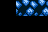

Something is wrong: 


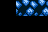

Something is wrong: 


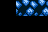

Something is wrong: 


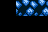

Something is wrong: 


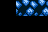

Something is wrong: 


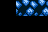

Something is wrong: 


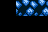

Something is wrong: 


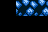

Something is wrong: 


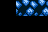

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_37
Something is wrong: 


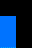

Something is wrong: 


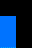

Something is wrong: 


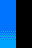

Something is wrong: 


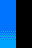

Something is wrong: 


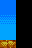

Something is wrong: 


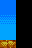

Something is wrong: 


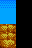

Something is wrong: 


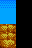

Something is wrong: 


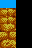

Something is wrong: 


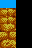

Something is wrong: 


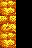

Something is wrong: 


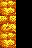

Something is wrong: 


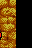

Something is wrong: 


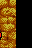

Something is wrong: 


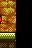

Something is wrong: 


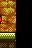

Something is wrong: 


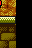

Something is wrong: 


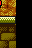

Something is wrong: 


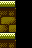

Something is wrong: 


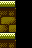

Something is wrong: 


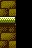

Something is wrong: 


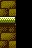

Something is wrong: 


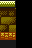

Something is wrong: 


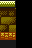

Something is wrong: 


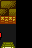

Something is wrong: 


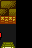

Something is wrong: 


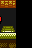

Something is wrong: 


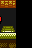

Something is wrong: 


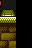

Something is wrong: 


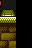

Something is wrong: 


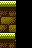

Something is wrong: 


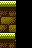

Something is wrong: 


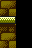

Something is wrong: 


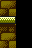

Something is wrong: 


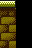

Something is wrong: 


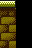

Something is wrong: 


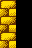

Something is wrong: 


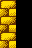

Something is wrong: 


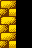

Something is wrong: 


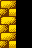

Something is wrong: 


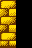

Something is wrong: 


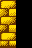

Something is wrong: 


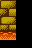

Something is wrong: 


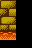

Something is wrong: 


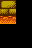

Something is wrong: 


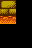

Something is wrong: 


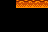

Something is wrong: 


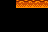

Something is wrong: 


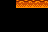

Something is wrong: 


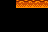

Something is wrong: 


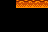

Something is wrong: 


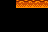

Something is wrong: 


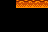

Something is wrong: 


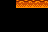

Something is wrong: 


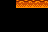

Something is wrong: 


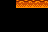

Something is wrong: 


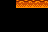

Something is wrong: 


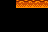

Something is wrong: 


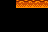

Something is wrong: 


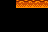

Something is wrong: 


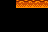

Something is wrong: 


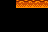

Something is wrong: 


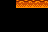

Something is wrong: 


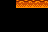

Something is wrong: 


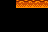

Something is wrong: 


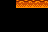

Something is wrong: 


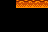

Something is wrong: 


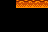

Something is wrong: 


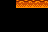

Something is wrong: 


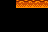

Something is wrong: 


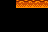

Something is wrong: 


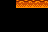

Something is wrong: 


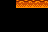

Something is wrong: 


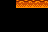

Something is wrong: 


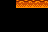

Something is wrong: 


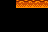

Something is wrong: 


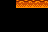

Something is wrong: 


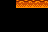

Something is wrong: 


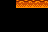

Something is wrong: 


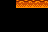

Something is wrong: 


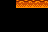

Something is wrong: 


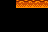

Something is wrong: 


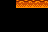

Something is wrong: 


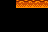

Something is wrong: 


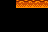

Something is wrong: 


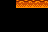

Something is wrong: 


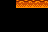

Something is wrong: 


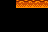

Something is wrong: 


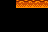

Something is wrong: 


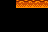

Something is wrong: 


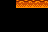

Something is wrong: 


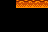

Something is wrong: 


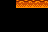

Something is wrong: 


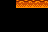

Something is wrong: 


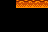

Something is wrong: 


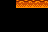

Something is wrong: 


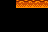

Something is wrong: 


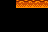

Something is wrong: 


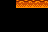

Something is wrong: 


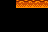

Something is wrong: 


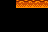

Something is wrong: 


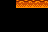

Something is wrong: 


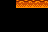

Something is wrong: 


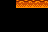

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_0_9
Something is wrong: 


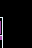

Something is wrong: 


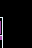

Something is wrong: 


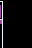

Something is wrong: 


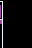

Something is wrong: 


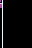

Something is wrong: 


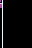

Something is wrong: 


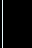

Something is wrong: 


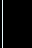

Something is wrong: 


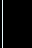

Something is wrong: 


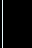

Something is wrong: 


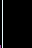

Something is wrong: 


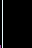

Something is wrong: 


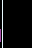

Something is wrong: 


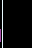

Something is wrong: 


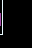

Something is wrong: 


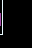

Something is wrong: 


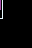

Something is wrong: 


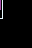

Something is wrong: 


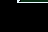

Something is wrong: 


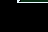

Something is wrong: 


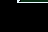

Something is wrong: 


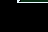

Something is wrong: 


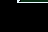

Something is wrong: 


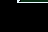

Something is wrong: 


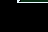

Something is wrong: 


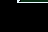

Something is wrong: 


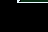

Something is wrong: 


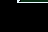

Something is wrong: 


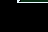

Something is wrong: 


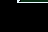

Something is wrong: 


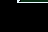

Something is wrong: 


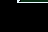

Something is wrong: 


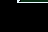

Something is wrong: 


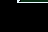

Something is wrong: 


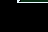

Something is wrong: 


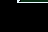

Something is wrong: 


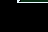

Something is wrong: 


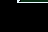

Something is wrong: 


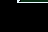

Something is wrong: 


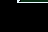

Something is wrong: 


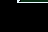

Something is wrong: 


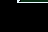

Something is wrong: 


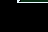

Something is wrong: 


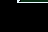

Something is wrong: 


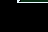

Something is wrong: 


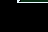

Something is wrong: 


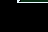

Something is wrong: 


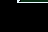

Something is wrong: 


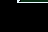

Something is wrong: 


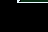

Something is wrong: 


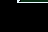

Something is wrong: 


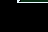

Something is wrong: 


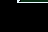

Something is wrong: 


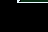

Something is wrong: 


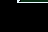

Something is wrong: 


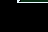

Something is wrong: 


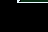

Something is wrong: 


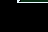

Something is wrong: 


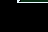

Something is wrong: 


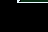

Something is wrong: 


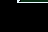

Something is wrong: 


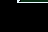

Something is wrong: 


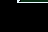

Something is wrong: 


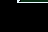

Something is wrong: 


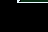

Something is wrong: 


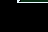

Something is wrong: 


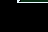

Something is wrong: 


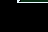

Something is wrong: 


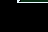

Something is wrong: 


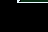

Something is wrong: 


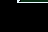

Something is wrong: 


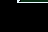

Something is wrong: 


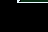

Something is wrong: 


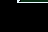

Something is wrong: 


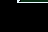

Something is wrong: 


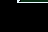

Something is wrong: 


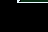

Something is wrong: 


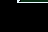

Something is wrong: 


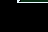

Something is wrong: 


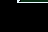

Something is wrong: 


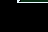

Something is wrong: 


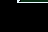

Something is wrong: 


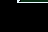

Something is wrong: 


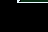

Something is wrong: 


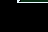

Something is wrong: 


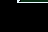

Something is wrong: 


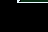

Something is wrong: 


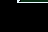

Something is wrong: 


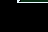

Something is wrong: 


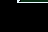

Something is wrong: 


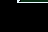

Something is wrong: 


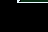

Something is wrong: 


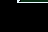

Something is wrong: 


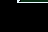

Something is wrong: 


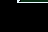

Something is wrong: 


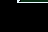

Something is wrong: 


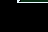

Something is wrong: 


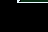

Something is wrong: 


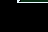

Something is wrong: 


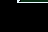

Something is wrong: 


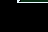

Something is wrong: 


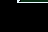

Something is wrong: 


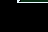

Something is wrong: 


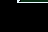

Something is wrong: 


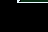

Something is wrong: 


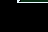

Something is wrong: 


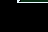

Something is wrong: 


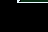

Something is wrong: 


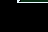

Something is wrong: 


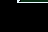

Something is wrong: 


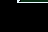

Something is wrong: 


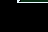

Something is wrong: 


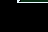

Something is wrong: 


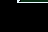

Something is wrong: 


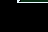

Something is wrong: 


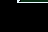

Something is wrong: 


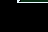

Something is wrong: 


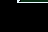

Something is wrong: 


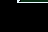

Something is wrong: 


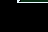

Something is wrong: 


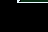

Something is wrong: 


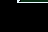

Something is wrong: 


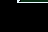

Something is wrong: 


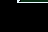

Something is wrong: 


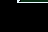

Something is wrong: 


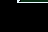

Something is wrong: 


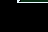

Something is wrong: 


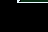

Something is wrong: 


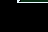

Something is wrong: 


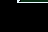

Something is wrong: 


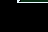

Something is wrong: 


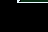

Something is wrong: 


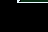

Something is wrong: 


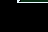

Something is wrong: 


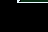

Something is wrong: 


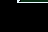

Something is wrong: 


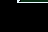

Something is wrong: 


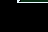

Something is wrong: 


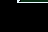

Something is wrong: 


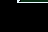

Something is wrong: 


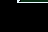

Something is wrong: 


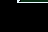

Something is wrong: 


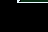

Something is wrong: 


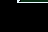

Something is wrong: 


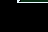

Something is wrong: 


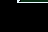

Something is wrong: 


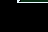

Something is wrong: 


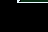

Something is wrong: 


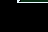

Something is wrong: 


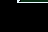

Something is wrong: 


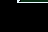

Something is wrong: 


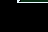

Something is wrong: 


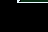

Something is wrong: 


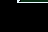

Something is wrong: 


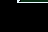

Something is wrong: 


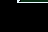

Something is wrong: 


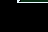

Something is wrong: 


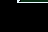

Something is wrong: 


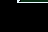

Something is wrong: 


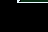

Something is wrong: 


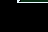

Something is wrong: 


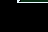

Something is wrong: 


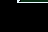

Something is wrong: 


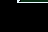

Something is wrong: 


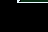

Something is wrong: 


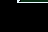

Something is wrong: 


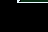

Something is wrong: 


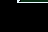

Something is wrong: 


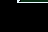

Something is wrong: 


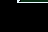

Something is wrong: 


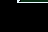

Something is wrong: 


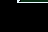

Something is wrong: 


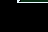

Something is wrong: 


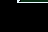

Something is wrong: 


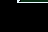

Something is wrong: 


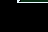

Something is wrong: 


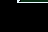

Something is wrong: 


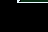

Something is wrong: 


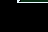

Something is wrong: 


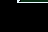

Something is wrong: 


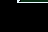

Something is wrong: 


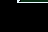

Something is wrong: 


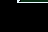

Something is wrong: 


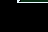

Something is wrong: 


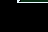

Something is wrong: 


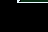

Something is wrong: 


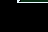

Something is wrong: 


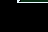

Something is wrong: 


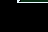

Something is wrong: 


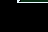

Something is wrong: 


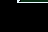

Something is wrong: 


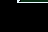

Something is wrong: 


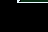

Something is wrong: 


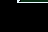

Something is wrong: 


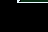

Something is wrong: 


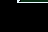

Something is wrong: 


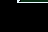

Something is wrong: 


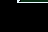

Something is wrong: 


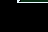

Something is wrong: 


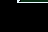

Something is wrong: 


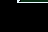

Something is wrong: 


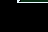

Something is wrong: 


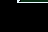

Something is wrong: 


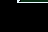

Something is wrong: 


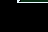

Something is wrong: 


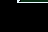

Something is wrong: 


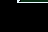

Something is wrong: 


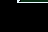

Something is wrong: 


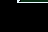

Something is wrong: 


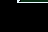

Something is wrong: 


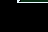

Something is wrong: 


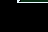

Something is wrong: 


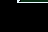

Something is wrong: 


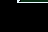

Something is wrong: 


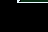

Something is wrong: 


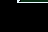

Something is wrong: 


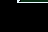

Something is wrong: 


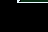

Something is wrong: 


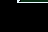

Something is wrong: 


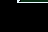

Something is wrong: 


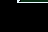

Something is wrong: 


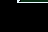

Something is wrong: 


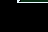

Something is wrong: 


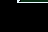

Something is wrong: 


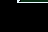

Something is wrong: 


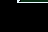

Something is wrong: 


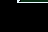

Something is wrong: 


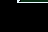

Something is wrong: 


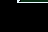

Something is wrong: 


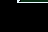

Something is wrong: 


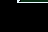

Something is wrong: 


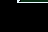

Something is wrong: 


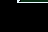

Something is wrong: 


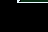

Something is wrong: 


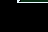

Something is wrong: 


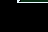

Something is wrong: 


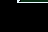

Something is wrong: 


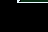

Something is wrong: 


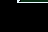

Something is wrong: 


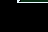

Something is wrong: 


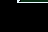

Something is wrong: 


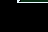

Something is wrong: 


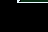

Something is wrong: 


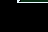

Something is wrong: 


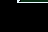

Something is wrong: 


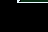

Something is wrong: 


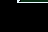

Something is wrong: 


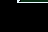

Something is wrong: 


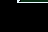

Something is wrong: 


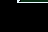

Something is wrong: 


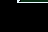

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_1
Something is wrong: 


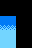

Something is wrong: 


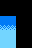

Something is wrong: 


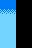

Something is wrong: 


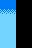

Something is wrong: 


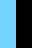

Something is wrong: 


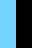

Something is wrong: 


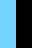

Something is wrong: 


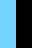

Something is wrong: 


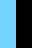

Something is wrong: 


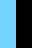

Something is wrong: 


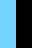

Something is wrong: 


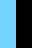

Something is wrong: 


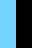

Something is wrong: 


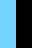

Something is wrong: 


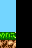

Something is wrong: 


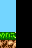

Something is wrong: 


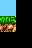

Something is wrong: 


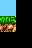

Something is wrong: 


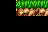

Something is wrong: 


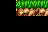

Something is wrong: 


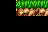

Something is wrong: 


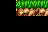

Something is wrong: 


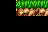

Something is wrong: 


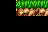

Something is wrong: 


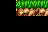

Something is wrong: 


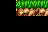

Something is wrong: 


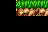

Something is wrong: 


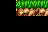

Something is wrong: 


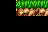

Something is wrong: 


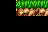

Something is wrong: 


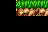

Something is wrong: 


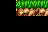

Something is wrong: 


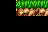

Something is wrong: 


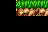

Something is wrong: 


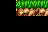

Something is wrong: 


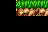

Something is wrong: 


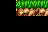

Something is wrong: 


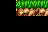

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_3
Something is wrong: 


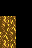

Something is wrong: 


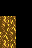

Something is wrong: 


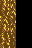

Something is wrong: 


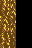

Something is wrong: 


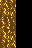

Something is wrong: 


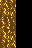

Something is wrong: 


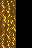

Something is wrong: 


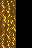

Something is wrong: 


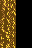

Something is wrong: 


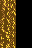

Something is wrong: 


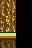

Something is wrong: 


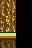

Something is wrong: 


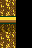

Something is wrong: 


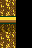

Something is wrong: 


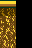

Something is wrong: 


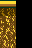

Something is wrong: 


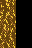

Something is wrong: 


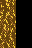

Something is wrong: 


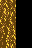

Something is wrong: 


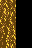

Something is wrong: 


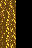

Something is wrong: 


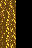

Something is wrong: 


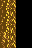

Something is wrong: 


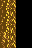

Something is wrong: 


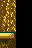

Something is wrong: 


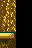

Something is wrong: 


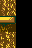

Something is wrong: 


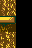

Something is wrong: 


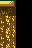

Something is wrong: 


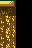

Something is wrong: 


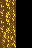

Something is wrong: 


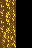

Something is wrong: 


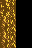

Something is wrong: 


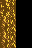

Something is wrong: 


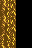

Something is wrong: 


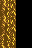

Something is wrong: 


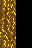

Something is wrong: 


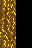

Something is wrong: 


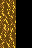

Something is wrong: 


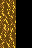

Something is wrong: 


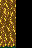

Something is wrong: 


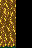

Something is wrong: 


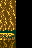

Something is wrong: 


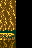

Something is wrong: 


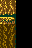

Something is wrong: 


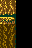

Something is wrong: 


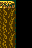

Something is wrong: 


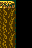

Something is wrong: 


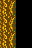

Something is wrong: 


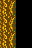

Something is wrong: 


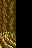

Something is wrong: 


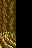

Something is wrong: 


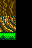

Something is wrong: 


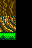

Something is wrong: 


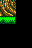

Something is wrong: 


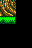

Something is wrong: 


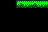

Something is wrong: 


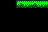

Something is wrong: 


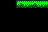

Something is wrong: 


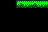

Something is wrong: 


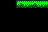

Something is wrong: 


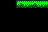

Something is wrong: 


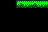

Something is wrong: 


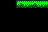

Something is wrong: 


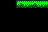

Something is wrong: 


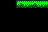

Something is wrong: 


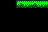

Something is wrong: 


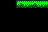

Something is wrong: 


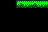

Something is wrong: 


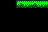

Something is wrong: 


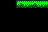

Something is wrong: 


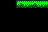

Something is wrong: 


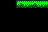

Something is wrong: 


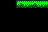

Something is wrong: 


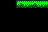

Something is wrong: 


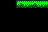

Something is wrong: 


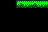

Something is wrong: 


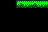

Something is wrong: 


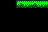

Something is wrong: 


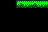

Something is wrong: 


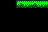

Something is wrong: 


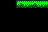

Something is wrong: 


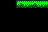

Something is wrong: 


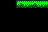

Something is wrong: 


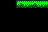

Something is wrong: 


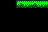

Something is wrong: 


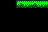

Something is wrong: 


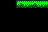

Something is wrong: 


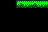

Something is wrong: 


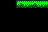

Something is wrong: 


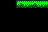

Something is wrong: 


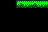

Something is wrong: 


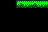

Something is wrong: 


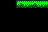

Something is wrong: 


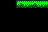

Something is wrong: 


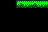

Something is wrong: 


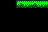

Something is wrong: 


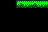

Something is wrong: 


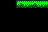

Something is wrong: 


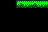

Something is wrong: 


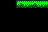

Something is wrong: 


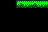

Something is wrong: 


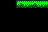

Something is wrong: 


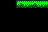

Something is wrong: 


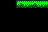

Something is wrong: 


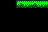

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_27
Something is wrong: 


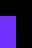

Something is wrong: 


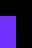

Something is wrong: 


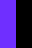

Something is wrong: 


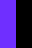

Something is wrong: 


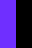

Something is wrong: 


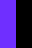

Something is wrong: 


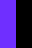

Something is wrong: 


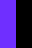

Something is wrong: 


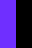

Something is wrong: 


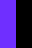

Something is wrong: 


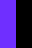

Something is wrong: 


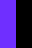

Something is wrong: 


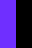

Something is wrong: 


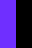

Something is wrong: 


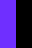

Something is wrong: 


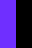

Something is wrong: 


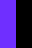

Something is wrong: 


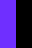

Something is wrong: 


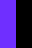

Something is wrong: 


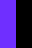

Something is wrong: 


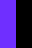

Something is wrong: 


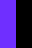

Something is wrong: 


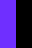

Something is wrong: 


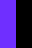

Something is wrong: 


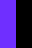

Something is wrong: 


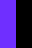

Something is wrong: 


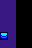

Something is wrong: 


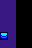

Something is wrong: 


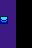

Something is wrong: 


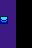

Something is wrong: 


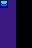

Something is wrong: 


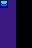

Something is wrong: 


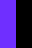

Something is wrong: 


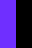

Something is wrong: 


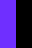

Something is wrong: 


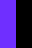

Something is wrong: 


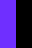

Something is wrong: 


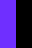

Something is wrong: 


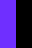

Something is wrong: 


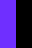

Something is wrong: 


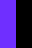

Something is wrong: 


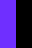

Something is wrong: 


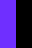

Something is wrong: 


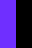

Something is wrong: 


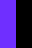

Something is wrong: 


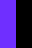

Something is wrong: 


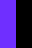

Something is wrong: 


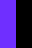

Something is wrong: 


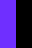

Something is wrong: 


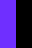

Something is wrong: 


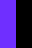

Something is wrong: 


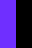

Something is wrong: 


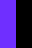

Something is wrong: 


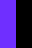

Something is wrong: 


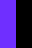

Something is wrong: 


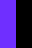

Something is wrong: 


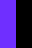

Something is wrong: 


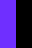

Something is wrong: 


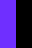

Something is wrong: 


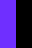

Something is wrong: 


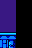

Something is wrong: 


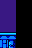

Something is wrong: 


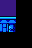

Something is wrong: 


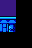

Something is wrong: 


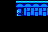

Something is wrong: 


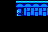

Something is wrong: 


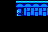

Something is wrong: 


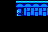

Something is wrong: 


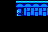

Something is wrong: 


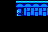

Something is wrong: 


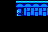

Something is wrong: 


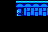

Something is wrong: 


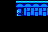

Something is wrong: 


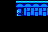

Something is wrong: 


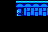

Something is wrong: 


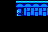

Something is wrong: 


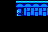

Something is wrong: 


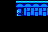

Something is wrong: 


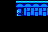

Something is wrong: 


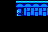

Something is wrong: 


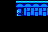

Something is wrong: 


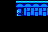

Something is wrong: 


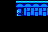

Something is wrong: 


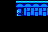

Something is wrong: 


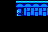

Something is wrong: 


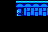

Something is wrong: 


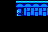

Something is wrong: 


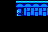

Something is wrong: 


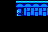

Something is wrong: 


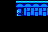

Something is wrong: 


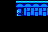

Something is wrong: 


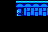

Something is wrong: 


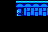

Something is wrong: 


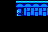

Something is wrong: 


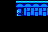

Something is wrong: 


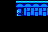

Something is wrong: 


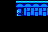

Something is wrong: 


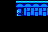

Something is wrong: 


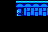

Something is wrong: 


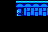

Something is wrong: 


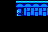

Something is wrong: 


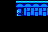

Something is wrong: 


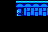

Something is wrong: 


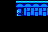

Something is wrong: 


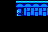

Something is wrong: 


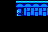

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_9
Something is wrong: 


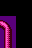

Something is wrong: 


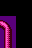

Something is wrong: 


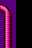

Something is wrong: 


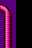

Something is wrong: 


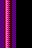

Something is wrong: 


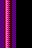

Something is wrong: 


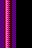

Something is wrong: 


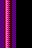

Something is wrong: 


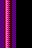

Something is wrong: 


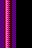

Something is wrong: 


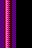

Something is wrong: 


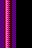

Something is wrong: 


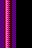

Something is wrong: 


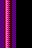

Something is wrong: 


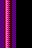

Something is wrong: 


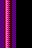

Something is wrong: 


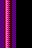

Something is wrong: 


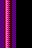

Something is wrong: 


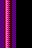

Something is wrong: 


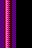

Something is wrong: 


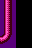

Something is wrong: 


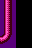

Something is wrong: 


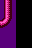

Something is wrong: 


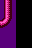

Something is wrong: 


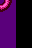

Something is wrong: 


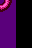

Something is wrong: 


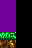

Something is wrong: 


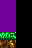

Something is wrong: 


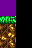

Something is wrong: 


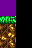

Something is wrong: 


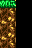

Something is wrong: 


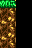

Something is wrong: 


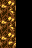

Something is wrong: 


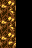

Something is wrong: 


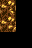

Something is wrong: 


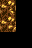

Something is wrong: 


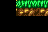

Something is wrong: 


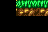

Something is wrong: 


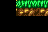

Something is wrong: 


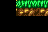

Something is wrong: 


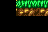

Something is wrong: 


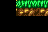

Something is wrong: 


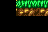

Something is wrong: 


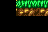

Something is wrong: 


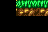

Something is wrong: 


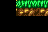

Something is wrong: 


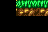

Something is wrong: 


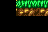

Something is wrong: 


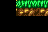

Something is wrong: 


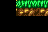

Something is wrong: 


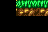

Something is wrong: 


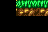

Something is wrong: 


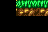

Something is wrong: 


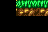

Something is wrong: 


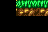

Something is wrong: 


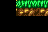

Something is wrong: 


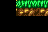

Something is wrong: 


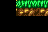

Something is wrong: 


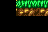

Something is wrong: 


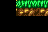

Something is wrong: 


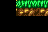

Something is wrong: 


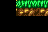

Something is wrong: 


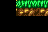

Something is wrong: 


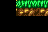

Something is wrong: 


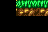

Something is wrong: 


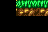

Something is wrong: 


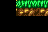

Something is wrong: 


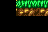

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_16
Something is wrong: 


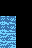

Something is wrong: 


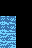

Something is wrong: 


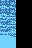

Something is wrong: 


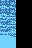

Something is wrong: 


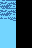

Something is wrong: 


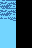

Something is wrong: 


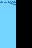

Something is wrong: 


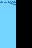

Something is wrong: 


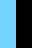

Something is wrong: 


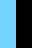

Something is wrong: 


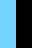

Something is wrong: 


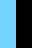

Something is wrong: 


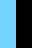

Something is wrong: 


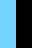

Something is wrong: 


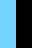

Something is wrong: 


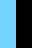

Something is wrong: 


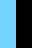

Something is wrong: 


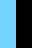

Something is wrong: 


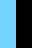

Something is wrong: 


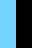

Something is wrong: 


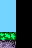

Something is wrong: 


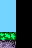

Something is wrong: 


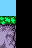

Something is wrong: 


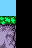

Something is wrong: 


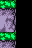

Something is wrong: 


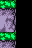

Something is wrong: 


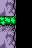

Something is wrong: 


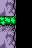

Something is wrong: 


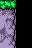

Something is wrong: 


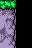

Something is wrong: 


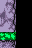

Something is wrong: 


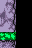

Something is wrong: 


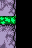

Something is wrong: 


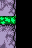

Something is wrong: 


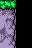

Something is wrong: 


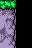

Something is wrong: 


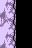

Something is wrong: 


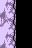

Something is wrong: 


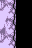

Something is wrong: 


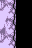

Something is wrong: 


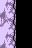

Something is wrong: 


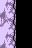

Something is wrong: 


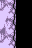

Something is wrong: 


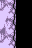

Something is wrong: 


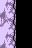

Something is wrong: 


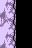

Something is wrong: 


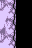

Something is wrong: 


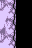

Something is wrong: 


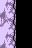

Something is wrong: 


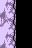

Something is wrong: 


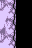

Something is wrong: 


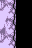

Something is wrong: 


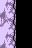

Something is wrong: 


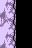

Something is wrong: 


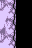

Something is wrong: 


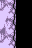

Something is wrong: 


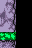

Something is wrong: 


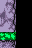

Something is wrong: 


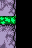

Something is wrong: 


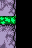

Something is wrong: 


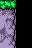

Something is wrong: 


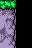

Something is wrong: 


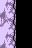

Something is wrong: 


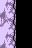

Something is wrong: 


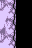

Something is wrong: 


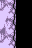

Something is wrong: 


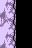

Something is wrong: 


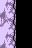

Something is wrong: 


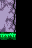

Something is wrong: 


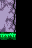

Something is wrong: 


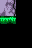

Something is wrong: 


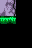

Something is wrong: 


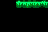

Something is wrong: 


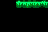

Something is wrong: 


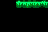

Something is wrong: 


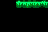

Something is wrong: 


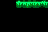

Something is wrong: 


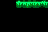

Something is wrong: 


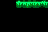

Something is wrong: 


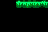

Something is wrong: 


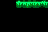

Something is wrong: 


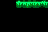

Something is wrong: 


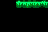

Something is wrong: 


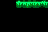

Something is wrong: 


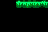

Something is wrong: 


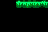

Something is wrong: 


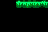

Something is wrong: 


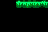

Something is wrong: 


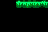

Something is wrong: 


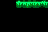

Something is wrong: 


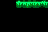

Something is wrong: 


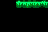

Something is wrong: 


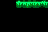

Something is wrong: 


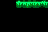

Something is wrong: 


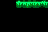

Something is wrong: 


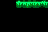

Something is wrong: 


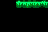

Something is wrong: 


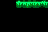

Something is wrong: 


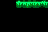

Something is wrong: 


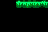

Something is wrong: 


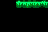

Something is wrong: 


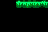

Something is wrong: 


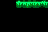

Something is wrong: 


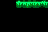

Something is wrong: 


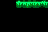

Something is wrong: 


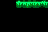

Something is wrong: 


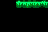

Something is wrong: 


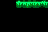

Something is wrong: 


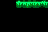

Something is wrong: 


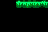

Something is wrong: 


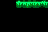

Something is wrong: 


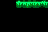

Something is wrong: 


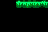

Something is wrong: 


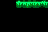

Something is wrong: 


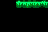

Something is wrong: 


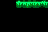

Something is wrong: 


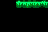

Something is wrong: 


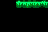

Something is wrong: 


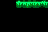

Something is wrong: 


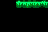

Something is wrong: 


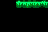

Something is wrong: 


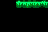

Something is wrong: 


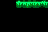

Something is wrong: 


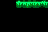

Something is wrong: 


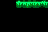

Something is wrong: 


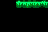

Something is wrong: 


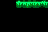

Something is wrong: 


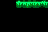

Something is wrong: 


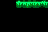

Something is wrong: 


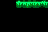

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_20
Something is wrong: 


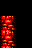

Something is wrong: 


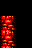

Something is wrong: 


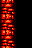

Something is wrong: 


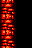

Something is wrong: 


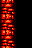

Something is wrong: 


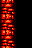

Something is wrong: 


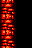

Something is wrong: 


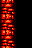

Something is wrong: 


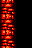

Something is wrong: 


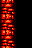

Something is wrong: 


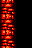

Something is wrong: 


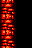

Something is wrong: 


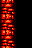

Something is wrong: 


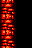

Something is wrong: 


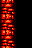

Something is wrong: 


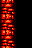

Something is wrong: 


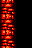

Something is wrong: 


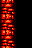

Something is wrong: 


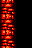

Something is wrong: 


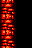

Something is wrong: 


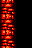

Something is wrong: 


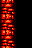

Something is wrong: 


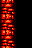

Something is wrong: 


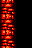

Something is wrong: 


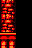

Something is wrong: 


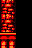

Something is wrong: 


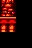

Something is wrong: 


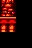

Something is wrong: 


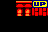

Something is wrong: 


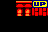

Something is wrong: 


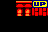

Something is wrong: 


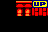

Something is wrong: 


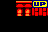

Something is wrong: 


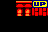

Something is wrong: 


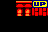

Something is wrong: 


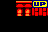

Something is wrong: 


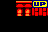

Something is wrong: 


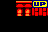

Something is wrong: 


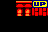

Something is wrong: 


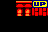

Something is wrong: 


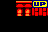

Something is wrong: 


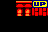

Something is wrong: 


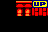

Something is wrong: 


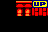

Something is wrong: 


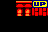

Something is wrong: 


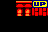

Something is wrong: 


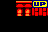

Something is wrong: 


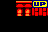

Something is wrong: 


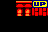

Something is wrong: 


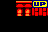

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_1
Something is wrong: 


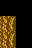

Something is wrong: 


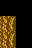

Something is wrong: 


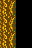

Something is wrong: 


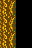

Something is wrong: 


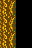

Something is wrong: 


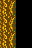

Something is wrong: 


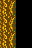

Something is wrong: 


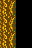

Something is wrong: 


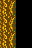

Something is wrong: 


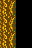

Something is wrong: 


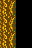

Something is wrong: 


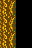

Something is wrong: 


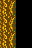

Something is wrong: 


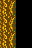

Something is wrong: 


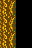

Something is wrong: 


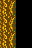

Something is wrong: 


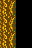

Something is wrong: 


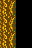

Something is wrong: 


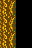

Something is wrong: 


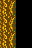

Something is wrong: 


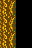

Something is wrong: 


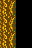

Something is wrong: 


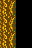

Something is wrong: 


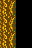

Something is wrong: 


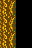

Something is wrong: 


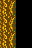

Something is wrong: 


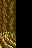

Something is wrong: 


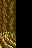

Something is wrong: 


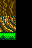

Something is wrong: 


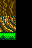

Something is wrong: 


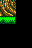

Something is wrong: 


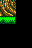

Something is wrong: 


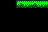

Something is wrong: 


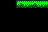

Something is wrong: 


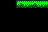

Something is wrong: 


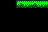

Something is wrong: 


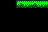

Something is wrong: 


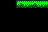

Something is wrong: 


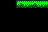

Something is wrong: 


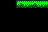

Something is wrong: 


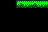

Something is wrong: 


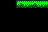

Something is wrong: 


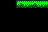

Something is wrong: 


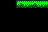

Something is wrong: 


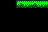

Something is wrong: 


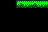

Something is wrong: 


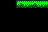

Something is wrong: 


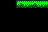

Something is wrong: 


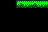

Something is wrong: 


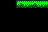

Something is wrong: 


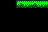

Something is wrong: 


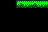

Something is wrong: 


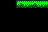

Something is wrong: 


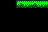

Something is wrong: 


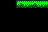

Something is wrong: 


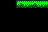

Something is wrong: 


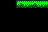

Something is wrong: 


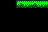

Something is wrong: 


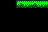

Something is wrong: 


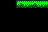

Something is wrong: 


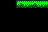

Something is wrong: 


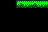

Something is wrong: 


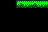

Something is wrong: 


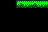

Something is wrong: 


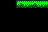

Something is wrong: 


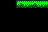

Something is wrong: 


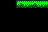

Something is wrong: 


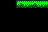

Something is wrong: 


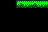

Something is wrong: 


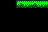

Something is wrong: 


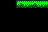

Something is wrong: 


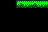

Something is wrong: 


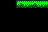

Something is wrong: 


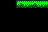

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_16
Something is wrong: 


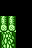

Something is wrong: 


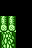

Something is wrong: 


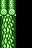

Something is wrong: 


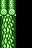

Something is wrong: 


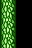

Something is wrong: 


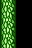

Something is wrong: 


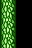

Something is wrong: 


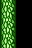

Something is wrong: 


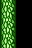

Something is wrong: 


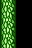

Something is wrong: 


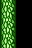

Something is wrong: 


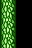

Something is wrong: 


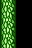

Something is wrong: 


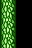

Something is wrong: 


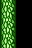

Something is wrong: 


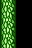

Something is wrong: 


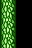

Something is wrong: 


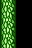

Something is wrong: 


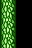

Something is wrong: 


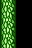

Something is wrong: 


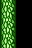

Something is wrong: 


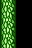

Something is wrong: 


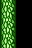

Something is wrong: 


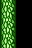

Something is wrong: 


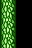

Something is wrong: 


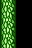

Something is wrong: 


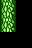

Something is wrong: 


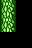

Something is wrong: 


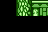

Something is wrong: 


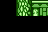

Something is wrong: 


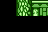

Something is wrong: 


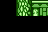

Something is wrong: 


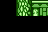

Something is wrong: 


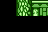

Something is wrong: 


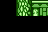

Something is wrong: 


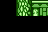

Something is wrong: 


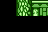

Something is wrong: 


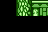

Something is wrong: 


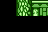

Something is wrong: 


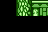

Something is wrong: 


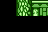

Something is wrong: 


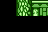

Something is wrong: 


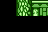

Something is wrong: 


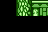

Something is wrong: 


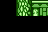

Something is wrong: 


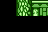

Something is wrong: 


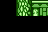

Something is wrong: 


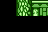

Something is wrong: 


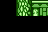

Something is wrong: 


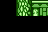

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_53
Something is wrong: 


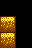

Something is wrong: 


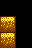

Something is wrong: 


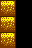

Something is wrong: 


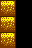

Something is wrong: 


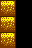

Something is wrong: 


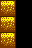

Something is wrong: 


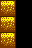

Something is wrong: 


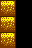

Something is wrong: 


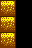

Something is wrong: 


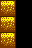

Something is wrong: 


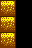

Something is wrong: 


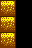

Something is wrong: 


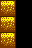

Something is wrong: 


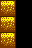

Something is wrong: 


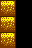

Something is wrong: 


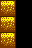

Something is wrong: 


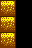

Something is wrong: 


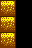

Something is wrong: 


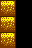

Something is wrong: 


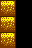

Something is wrong: 


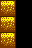

Something is wrong: 


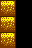

Something is wrong: 


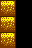

Something is wrong: 


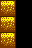

Something is wrong: 


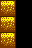

Something is wrong: 


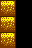

Something is wrong: 


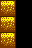

Something is wrong: 


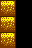

Something is wrong: 


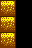

Something is wrong: 


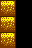

Something is wrong: 


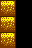

Something is wrong: 


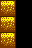

Something is wrong: 


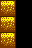

Something is wrong: 


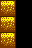

Something is wrong: 


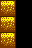

Something is wrong: 


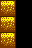

Something is wrong: 


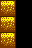

Something is wrong: 


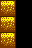

Something is wrong: 


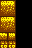

Something is wrong: 


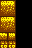

Something is wrong: 


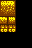

Something is wrong: 


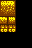

Something is wrong: 


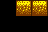

Something is wrong: 


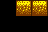

Something is wrong: 


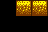

Something is wrong: 


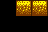

Something is wrong: 


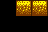

Something is wrong: 


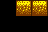

Something is wrong: 


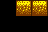

Something is wrong: 


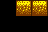

Something is wrong: 


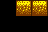

Something is wrong: 


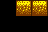

Something is wrong: 


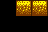

Something is wrong: 


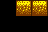

Something is wrong: 


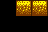

Something is wrong: 


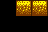

Something is wrong: 


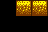

Something is wrong: 


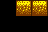

Something is wrong: 


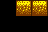

Something is wrong: 


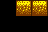

Something is wrong: 


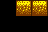

Something is wrong: 


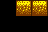

Something is wrong: 


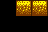

Something is wrong: 


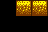

Something is wrong: 


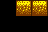

Something is wrong: 


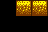

Something is wrong: 


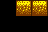

Something is wrong: 


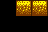

Something is wrong: 


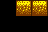

Something is wrong: 


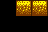

Something is wrong: 


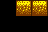

Something is wrong: 


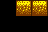

Something is wrong: 


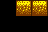

Something is wrong: 


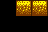

Something is wrong: 


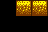

Something is wrong: 


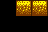

Something is wrong: 


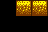

Something is wrong: 


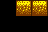

Something is wrong: 


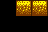

Something is wrong: 


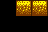

Something is wrong: 


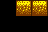

Something is wrong: 


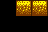

Something is wrong: 


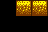

Something is wrong: 


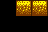

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_36
Something is wrong: 


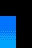

Something is wrong: 


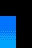

Something is wrong: 


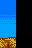

Something is wrong: 


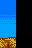

Something is wrong: 


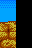

Something is wrong: 


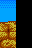

Something is wrong: 


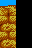

Something is wrong: 


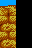

Something is wrong: 


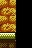

Something is wrong: 


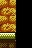

Something is wrong: 


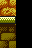

Something is wrong: 


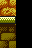

Something is wrong: 


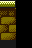

Something is wrong: 


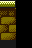

Something is wrong: 


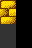

Something is wrong: 


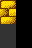

Something is wrong: 


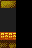

Something is wrong: 


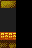

Something is wrong: 


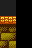

Something is wrong: 


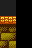

Something is wrong: 


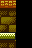

Something is wrong: 


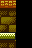

Something is wrong: 


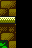

Something is wrong: 


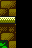

Something is wrong: 


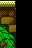

Something is wrong: 


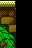

Something is wrong: 


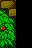

Something is wrong: 


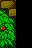

Something is wrong: 


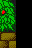

Something is wrong: 


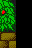

Something is wrong: 


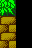

Something is wrong: 


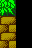

Something is wrong: 


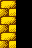

Something is wrong: 


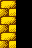

Something is wrong: 


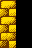

Something is wrong: 


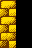

Something is wrong: 


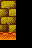

Something is wrong: 


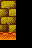

Something is wrong: 


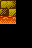

Something is wrong: 


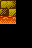

Something is wrong: 


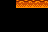

Something is wrong: 


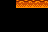

Something is wrong: 


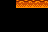

Something is wrong: 


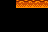

Something is wrong: 


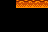

Something is wrong: 


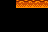

Something is wrong: 


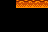

Something is wrong: 


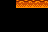

Something is wrong: 


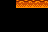

Something is wrong: 


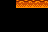

Something is wrong: 


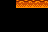

Something is wrong: 


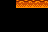

Something is wrong: 


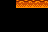

Something is wrong: 


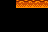

Something is wrong: 


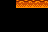

Something is wrong: 


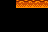

Something is wrong: 


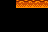

Something is wrong: 


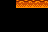

Something is wrong: 


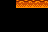

Something is wrong: 


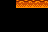

Something is wrong: 


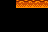

Something is wrong: 


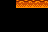

Something is wrong: 


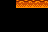

Something is wrong: 


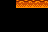

Something is wrong: 


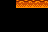

Something is wrong: 


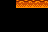

Something is wrong: 


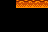

Something is wrong: 


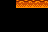

Something is wrong: 


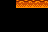

Something is wrong: 


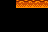

Something is wrong: 


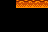

Something is wrong: 


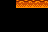

Something is wrong: 


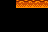

Something is wrong: 


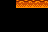

Something is wrong: 


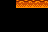

Something is wrong: 


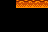

Something is wrong: 


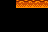

Something is wrong: 


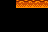

Something is wrong: 


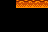

Something is wrong: 


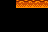

Something is wrong: 


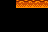

Something is wrong: 


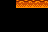

Something is wrong: 


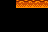

Something is wrong: 


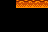

Something is wrong: 


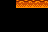

Something is wrong: 


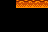

Something is wrong: 


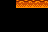

Something is wrong: 


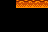

Something is wrong: 


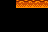

Something is wrong: 


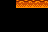

Something is wrong: 


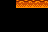

Something is wrong: 


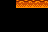

Something is wrong: 


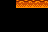

Something is wrong: 


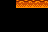

Something is wrong: 


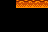

Something is wrong: 


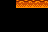

Something is wrong: 


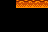

Something is wrong: 


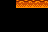

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_44
Something is wrong: 


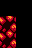

Something is wrong: 


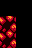

Something is wrong: 


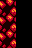

Something is wrong: 


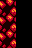

Something is wrong: 


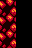

Something is wrong: 


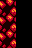

Something is wrong: 


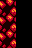

Something is wrong: 


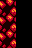

Something is wrong: 


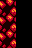

Something is wrong: 


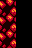

Something is wrong: 


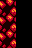

Something is wrong: 


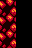

Something is wrong: 


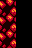

Something is wrong: 


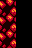

Something is wrong: 


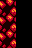

Something is wrong: 


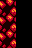

Something is wrong: 


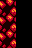

Something is wrong: 


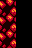

Something is wrong: 


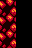

Something is wrong: 


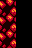

Something is wrong: 


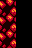

Something is wrong: 


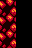

Something is wrong: 


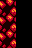

Something is wrong: 


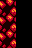

Something is wrong: 


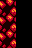

Something is wrong: 


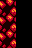

Something is wrong: 


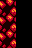

Something is wrong: 


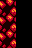

Something is wrong: 


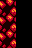

Something is wrong: 


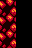

Something is wrong: 


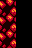

Something is wrong: 


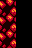

Something is wrong: 


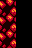

Something is wrong: 


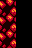

Something is wrong: 


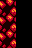

Something is wrong: 


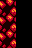

Something is wrong: 


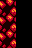

Something is wrong: 


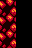

Something is wrong: 


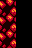

Something is wrong: 


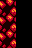

Something is wrong: 


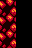

Something is wrong: 


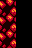

Something is wrong: 


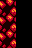

Something is wrong: 


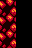

Something is wrong: 


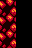

Something is wrong: 


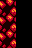

Something is wrong: 


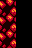

Something is wrong: 


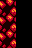

Something is wrong: 


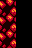

Something is wrong: 


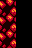

Something is wrong: 


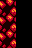

Something is wrong: 


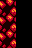

Something is wrong: 


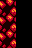

Something is wrong: 


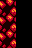

Something is wrong: 


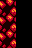

Something is wrong: 


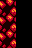

Something is wrong: 


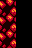

Something is wrong: 


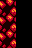

Something is wrong: 


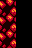

Something is wrong: 


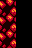

Something is wrong: 


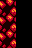

Something is wrong: 


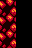

Something is wrong: 


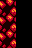

Something is wrong: 


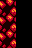

Something is wrong: 


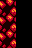

Something is wrong: 


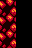

Something is wrong: 


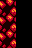

Something is wrong: 


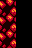

Something is wrong: 


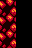

Something is wrong: 


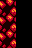

Something is wrong: 


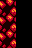

Something is wrong: 


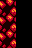

Something is wrong: 


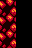

Something is wrong: 


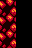

Something is wrong: 


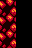

Something is wrong: 


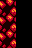

Something is wrong: 


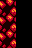

Something is wrong: 


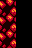

Something is wrong: 


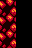

Something is wrong: 


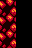

Something is wrong: 


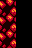

Something is wrong: 


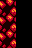

Something is wrong: 


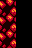

Something is wrong: 


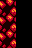

Something is wrong: 


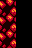

Something is wrong: 


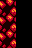

Something is wrong: 


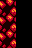

Something is wrong: 


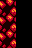

Something is wrong: 


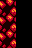

Something is wrong: 


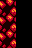

Something is wrong: 


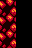

Something is wrong: 


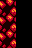

Something is wrong: 


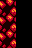

Something is wrong: 


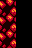

Something is wrong: 


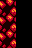

Something is wrong: 


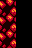

Something is wrong: 


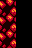

Something is wrong: 


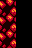

Something is wrong: 


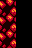

Something is wrong: 


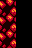

Something is wrong: 


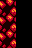

Something is wrong: 


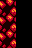

Something is wrong: 


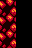

Something is wrong: 


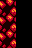

Something is wrong: 


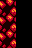

Something is wrong: 


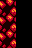

Something is wrong: 


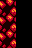

Something is wrong: 


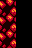

Something is wrong: 


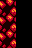

Something is wrong: 


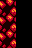

Something is wrong: 


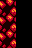

Something is wrong: 


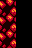

Something is wrong: 


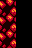

Something is wrong: 


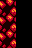

Something is wrong: 


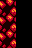

Something is wrong: 


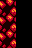

Something is wrong: 


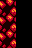

Something is wrong: 


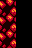

Something is wrong: 


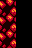

Something is wrong: 


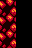

Something is wrong: 


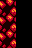

Something is wrong: 


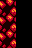

Something is wrong: 


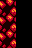

Something is wrong: 


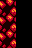

Something is wrong: 


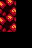

Something is wrong: 


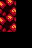

Something is wrong: 


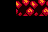

Something is wrong: 


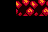

Something is wrong: 


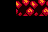

Something is wrong: 


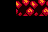

Something is wrong: 


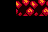

Something is wrong: 


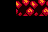

Something is wrong: 


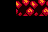

Something is wrong: 


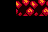

Something is wrong: 


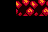

Something is wrong: 


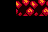

Something is wrong: 


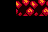

Something is wrong: 


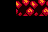

Something is wrong: 


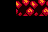

Something is wrong: 


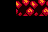

Something is wrong: 


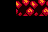

Something is wrong: 


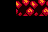

Something is wrong: 


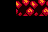

Something is wrong: 


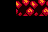

Something is wrong: 


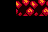

Something is wrong: 


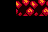

Something is wrong: 


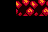

Something is wrong: 


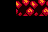

Something is wrong: 


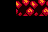

Something is wrong: 


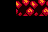

Something is wrong: 


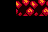

Something is wrong: 


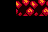

Something is wrong: 


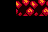

Something is wrong: 


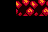

Something is wrong: 


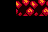

Something is wrong: 


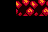

Something is wrong: 


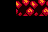

Something is wrong: 


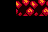

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_60
Something is wrong: 


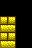

Something is wrong: 


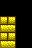

Something is wrong: 


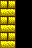

Something is wrong: 


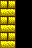

Something is wrong: 


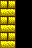

Something is wrong: 


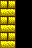

Something is wrong: 


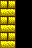

Something is wrong: 


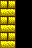

Something is wrong: 


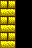

Something is wrong: 


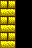

Something is wrong: 


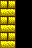

Something is wrong: 


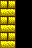

Something is wrong: 


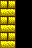

Something is wrong: 


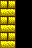

Something is wrong: 


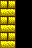

Something is wrong: 


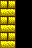

Something is wrong: 


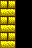

Something is wrong: 


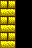

Something is wrong: 


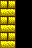

Something is wrong: 


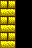

Something is wrong: 


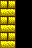

Something is wrong: 


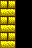

Something is wrong: 


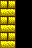

Something is wrong: 


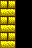

Something is wrong: 


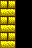

Something is wrong: 


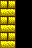

Something is wrong: 


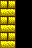

Something is wrong: 


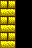

Something is wrong: 


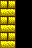

Something is wrong: 


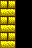

Something is wrong: 


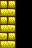

Something is wrong: 


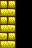

Something is wrong: 


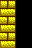

Something is wrong: 


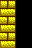

Something is wrong: 


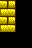

Something is wrong: 


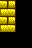

Something is wrong: 


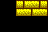

Something is wrong: 


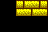

Something is wrong: 


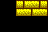

Something is wrong: 


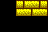

Something is wrong: 


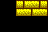

Something is wrong: 


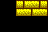

Something is wrong: 


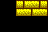

Something is wrong: 


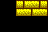

Something is wrong: 


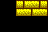

Something is wrong: 


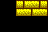

Something is wrong: 


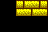

Something is wrong: 


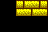

Something is wrong: 


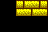

Something is wrong: 


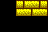

Something is wrong: 


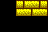

Something is wrong: 


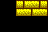

Something is wrong: 


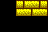

Something is wrong: 


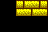

Something is wrong: 


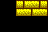

Something is wrong: 


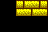

Something is wrong: 


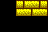

Something is wrong: 


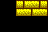

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_12
Something is wrong: 


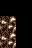

Something is wrong: 


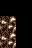

Something is wrong: 


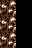

Something is wrong: 


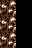

Something is wrong: 


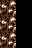

Something is wrong: 


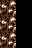

Something is wrong: 


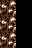

Something is wrong: 


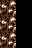

Something is wrong: 


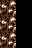

Something is wrong: 


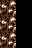

Something is wrong: 


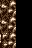

Something is wrong: 


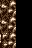

Something is wrong: 


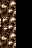

Something is wrong: 


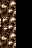

Something is wrong: 


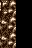

Something is wrong: 


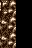

Something is wrong: 


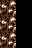

Something is wrong: 


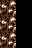

Something is wrong: 


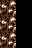

Something is wrong: 


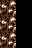

Something is wrong: 


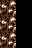

Something is wrong: 


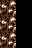

Something is wrong: 


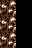

Something is wrong: 


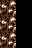

Something is wrong: 


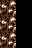

Something is wrong: 


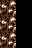

Something is wrong: 


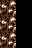

Something is wrong: 


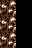

Something is wrong: 


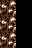

Something is wrong: 


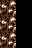

Something is wrong: 


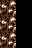

Something is wrong: 


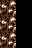

Something is wrong: 


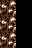

Something is wrong: 


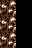

Something is wrong: 


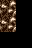

Something is wrong: 


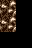

Something is wrong: 


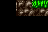

Something is wrong: 


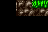

Something is wrong: 


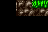

Something is wrong: 


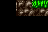

Something is wrong: 


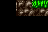

Something is wrong: 


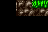

Something is wrong: 


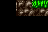

Something is wrong: 


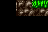

Something is wrong: 


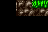

Something is wrong: 


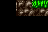

Something is wrong: 


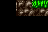

Something is wrong: 


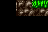

Something is wrong: 


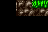

Something is wrong: 


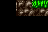

Something is wrong: 


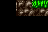

Something is wrong: 


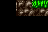

Something is wrong: 


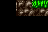

Something is wrong: 


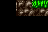

Something is wrong: 


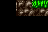

Something is wrong: 


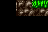

Something is wrong: 


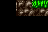

Something is wrong: 


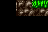

Something is wrong: 


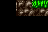

Something is wrong: 


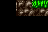

Something is wrong: 


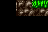

Something is wrong: 


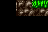

Something is wrong: 


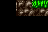

Something is wrong: 


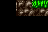

Something is wrong: 


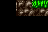

Something is wrong: 


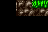

Something is wrong: 


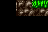

Something is wrong: 


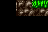

Something is wrong: 


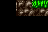

Something is wrong: 


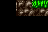

Something is wrong: 


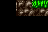

Something is wrong: 


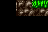

Something is wrong: 


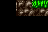

Something is wrong: 


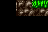

Something is wrong: 


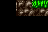

Something is wrong: 


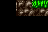

Something is wrong: 


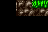

Something is wrong: 


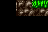

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_0_5
Something is wrong: 


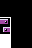

Something is wrong: 


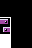

Something is wrong: 


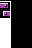

Something is wrong: 


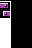

Something is wrong: 


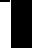

Something is wrong: 


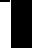

Something is wrong: 


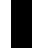

Something is wrong: 


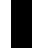

Something is wrong: 


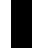

Something is wrong: 


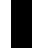

Something is wrong: 


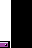

Something is wrong: 


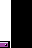

Something is wrong: 


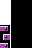

Something is wrong: 


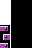

Something is wrong: 


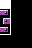

Something is wrong: 


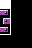

Something is wrong: 


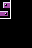

Something is wrong: 


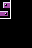

Something is wrong: 


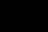

Something is wrong: 


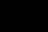

Something is wrong: 


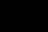

Something is wrong: 


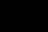

Something is wrong: 


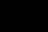

Something is wrong: 


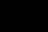

Something is wrong: 


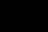

Something is wrong: 


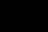

Something is wrong: 


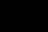

Something is wrong: 


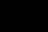

Something is wrong: 


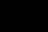

Something is wrong: 


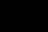

Something is wrong: 


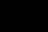

Something is wrong: 


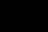

Something is wrong: 


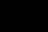

Something is wrong: 


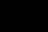

Something is wrong: 


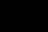

Something is wrong: 


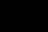

Something is wrong: 


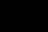

Something is wrong: 


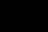

Something is wrong: 


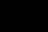

Something is wrong: 


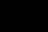

Something is wrong: 


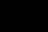

Something is wrong: 


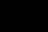

Something is wrong: 


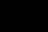

Something is wrong: 


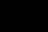

Something is wrong: 


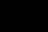

Something is wrong: 


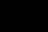

Something is wrong: 


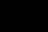

Something is wrong: 


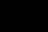

Something is wrong: 


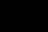

Something is wrong: 


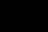

Something is wrong: 


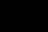

Something is wrong: 


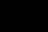

Something is wrong: 


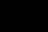

Something is wrong: 


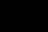

Something is wrong: 


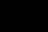

Something is wrong: 


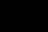

Something is wrong: 


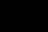

Something is wrong: 


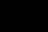

Something is wrong: 


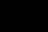

Something is wrong: 


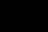

Something is wrong: 


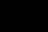

Something is wrong: 


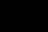

Something is wrong: 


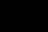

Something is wrong: 


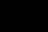

Something is wrong: 


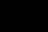

Something is wrong: 


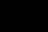

Something is wrong: 


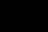

Something is wrong: 


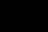

Something is wrong: 


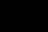

Something is wrong: 


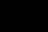

Something is wrong: 


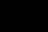

Something is wrong: 


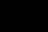

Something is wrong: 


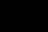

Something is wrong: 


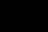

Something is wrong: 


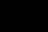

Something is wrong: 


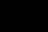

Something is wrong: 


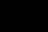

Something is wrong: 


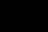

Something is wrong: 


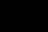

Something is wrong: 


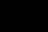

Something is wrong: 


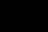

Something is wrong: 


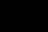

Something is wrong: 


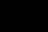

Something is wrong: 


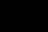

Something is wrong: 


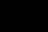

Something is wrong: 


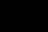

Something is wrong: 


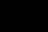

Something is wrong: 


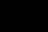

Something is wrong: 


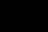

Something is wrong: 


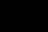

Something is wrong: 


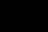

Something is wrong: 


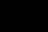

Something is wrong: 


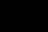

Something is wrong: 


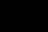

Something is wrong: 


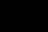

Something is wrong: 


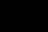

Something is wrong: 


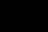

Something is wrong: 


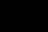

Something is wrong: 


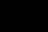

Something is wrong: 


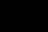

Something is wrong: 


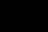

Something is wrong: 


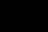

Something is wrong: 


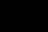

Something is wrong: 


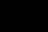

Something is wrong: 


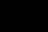

Something is wrong: 


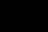

Something is wrong: 


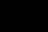

Something is wrong: 


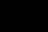

Something is wrong: 


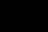

Something is wrong: 


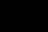

Something is wrong: 


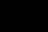

Something is wrong: 


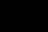

Something is wrong: 


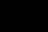

Something is wrong: 


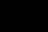

Something is wrong: 


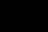

Something is wrong: 


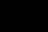

Something is wrong: 


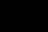

Something is wrong: 


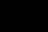

Something is wrong: 


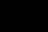

Something is wrong: 


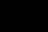

Something is wrong: 


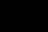

Something is wrong: 


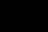

Something is wrong: 


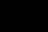

Something is wrong: 


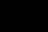

Something is wrong: 


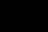

Something is wrong: 


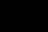

Something is wrong: 


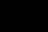

Something is wrong: 


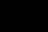

Something is wrong: 


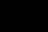

Something is wrong: 


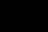

Something is wrong: 


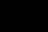

Something is wrong: 


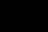

Something is wrong: 


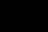

Something is wrong: 


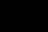

Something is wrong: 


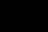

Something is wrong: 


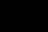

Something is wrong: 


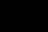

Something is wrong: 


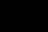

Something is wrong: 


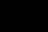

Something is wrong: 


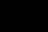

Something is wrong: 


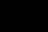

Something is wrong: 


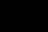

Something is wrong: 


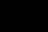

Something is wrong: 


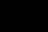

Something is wrong: 


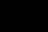

Something is wrong: 


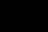

Something is wrong: 


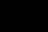

Something is wrong: 


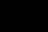

Something is wrong: 


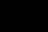

Something is wrong: 


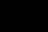

Something is wrong: 


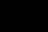

Something is wrong: 


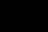

Something is wrong: 


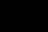

Something is wrong: 


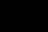

Something is wrong: 


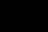

Something is wrong: 


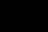

Something is wrong: 


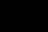

Something is wrong: 


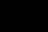

Something is wrong: 


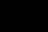

Something is wrong: 


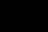

Something is wrong: 


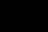

Something is wrong: 


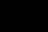

Something is wrong: 


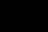

Something is wrong: 


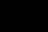

Something is wrong: 


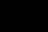

Something is wrong: 


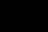

Something is wrong: 


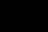

Something is wrong: 


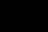

Something is wrong: 


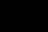

Something is wrong: 


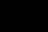

Something is wrong: 


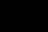

Something is wrong: 


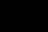

Something is wrong: 


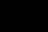

Something is wrong: 


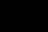

Something is wrong: 


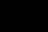

Something is wrong: 


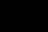

Something is wrong: 


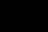

Something is wrong: 


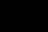

Something is wrong: 


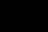

Something is wrong: 


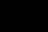

Something is wrong: 


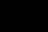

Something is wrong: 


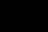

Something is wrong: 


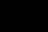

Something is wrong: 


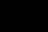

Something is wrong: 


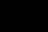

Something is wrong: 


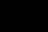

Something is wrong: 


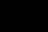

Something is wrong: 


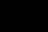

Something is wrong: 


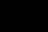

Something is wrong: 


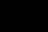

Something is wrong: 


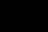

Something is wrong: 


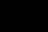

Something is wrong: 


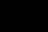

Something is wrong: 


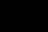

Something is wrong: 


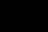

Something is wrong: 


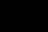

Something is wrong: 


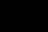

Something is wrong: 


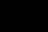

Something is wrong: 


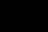

Something is wrong: 


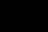

Something is wrong: 


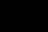

Something is wrong: 


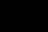

Something is wrong: 


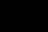

Something is wrong: 


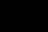

Something is wrong: 


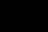

Something is wrong: 


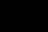

Something is wrong: 


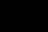

Something is wrong: 


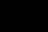

Something is wrong: 


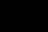

Something is wrong: 


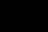

Something is wrong: 


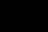

Something is wrong: 


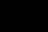

Something is wrong: 


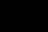

Something is wrong: 


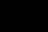

Something is wrong: 


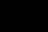

Something is wrong: 


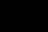

Something is wrong: 


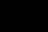

Something is wrong: 


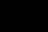

Something is wrong: 


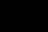

Something is wrong: 


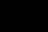

Something is wrong: 


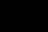

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_12
Something is wrong: 


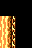

Something is wrong: 


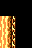

Something is wrong: 


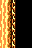

Something is wrong: 


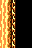

Something is wrong: 


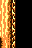

Something is wrong: 


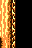

Something is wrong: 


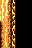

Something is wrong: 


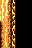

Something is wrong: 


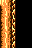

Something is wrong: 


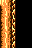

Something is wrong: 


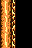

Something is wrong: 


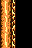

Something is wrong: 


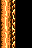

Something is wrong: 


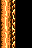

Something is wrong: 


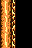

Something is wrong: 


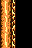

Something is wrong: 


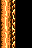

Something is wrong: 


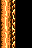

Something is wrong: 


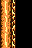

Something is wrong: 


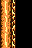

Something is wrong: 


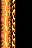

Something is wrong: 


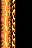

Something is wrong: 


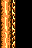

Something is wrong: 


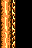

Something is wrong: 


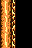

Something is wrong: 


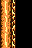

Something is wrong: 


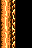

Something is wrong: 


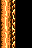

Something is wrong: 


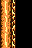

Something is wrong: 


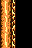

Something is wrong: 


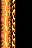

Something is wrong: 


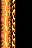

Something is wrong: 


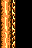

Something is wrong: 


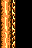

Something is wrong: 


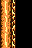

Something is wrong: 


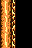

Something is wrong: 


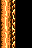

Something is wrong: 


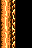

Something is wrong: 


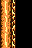

Something is wrong: 


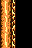

Something is wrong: 


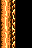

Something is wrong: 


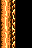

Something is wrong: 


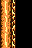

Something is wrong: 


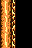

Something is wrong: 


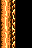

Something is wrong: 


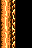

Something is wrong: 


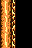

Something is wrong: 


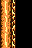

Something is wrong: 


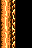

Something is wrong: 


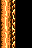

Something is wrong: 


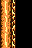

Something is wrong: 


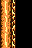

Something is wrong: 


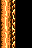

Something is wrong: 


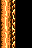

Something is wrong: 


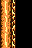

Something is wrong: 


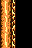

Something is wrong: 


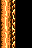

Something is wrong: 


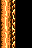

Something is wrong: 


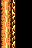

Something is wrong: 


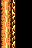

Something is wrong: 


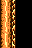

Something is wrong: 


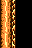

Something is wrong: 


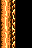

Something is wrong: 


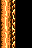

Something is wrong: 


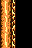

Something is wrong: 


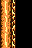

Something is wrong: 


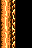

Something is wrong: 


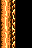

Something is wrong: 


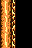

Something is wrong: 


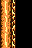

Something is wrong: 


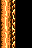

Something is wrong: 


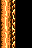

Something is wrong: 


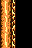

Something is wrong: 


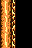

Something is wrong: 


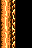

Something is wrong: 


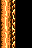

Something is wrong: 


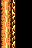

Something is wrong: 


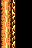

Something is wrong: 


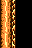

Something is wrong: 


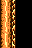

Something is wrong: 


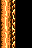

Something is wrong: 


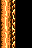

Something is wrong: 


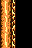

Something is wrong: 


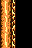

Something is wrong: 


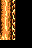

Something is wrong: 


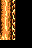

Something is wrong: 


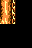

Something is wrong: 


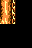

Something is wrong: 


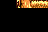

Something is wrong: 


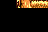

Something is wrong: 


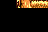

Something is wrong: 


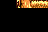

Something is wrong: 


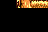

Something is wrong: 


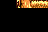

Something is wrong: 


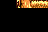

Something is wrong: 


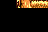

Something is wrong: 


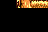

Something is wrong: 


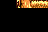

Something is wrong: 


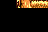

Something is wrong: 


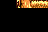

Something is wrong: 


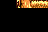

Something is wrong: 


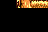

Something is wrong: 


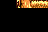

Something is wrong: 


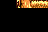

Something is wrong: 


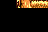

Something is wrong: 


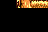

Something is wrong: 


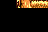

Something is wrong: 


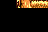

Something is wrong: 


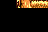

Something is wrong: 


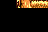

Something is wrong: 


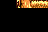

Something is wrong: 


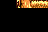

Something is wrong: 


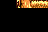

Something is wrong: 


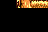

Something is wrong: 


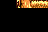

Something is wrong: 


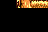

Something is wrong: 


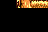

Something is wrong: 


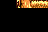

Something is wrong: 


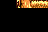

Something is wrong: 


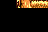

Something is wrong: 


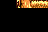

Something is wrong: 


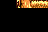

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_13
Something is wrong: 


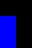

Something is wrong: 


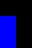

Something is wrong: 


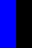

Something is wrong: 


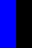

Something is wrong: 


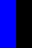

Something is wrong: 


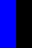

Something is wrong: 


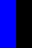

Something is wrong: 


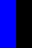

Something is wrong: 


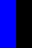

Something is wrong: 


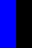

Something is wrong: 


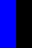

Something is wrong: 


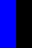

Something is wrong: 


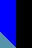

Something is wrong: 


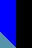

Something is wrong: 


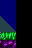

Something is wrong: 


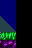

Something is wrong: 


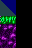

Something is wrong: 


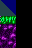

Something is wrong: 


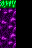

Something is wrong: 


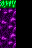

Something is wrong: 


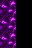

Something is wrong: 


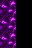

Something is wrong: 


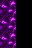

Something is wrong: 


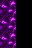

Something is wrong: 


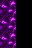

Something is wrong: 


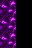

Something is wrong: 


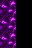

Something is wrong: 


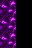

Something is wrong: 


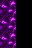

Something is wrong: 


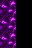

Something is wrong: 


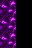

Something is wrong: 


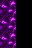

Something is wrong: 


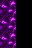

Something is wrong: 


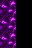

Something is wrong: 


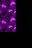

Something is wrong: 


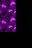

Something is wrong: 


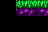

Something is wrong: 


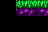

Something is wrong: 


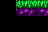

Something is wrong: 


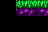

Something is wrong: 


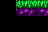

Something is wrong: 


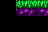

Something is wrong: 


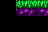

Something is wrong: 


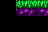

Something is wrong: 


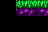

Something is wrong: 


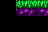

Something is wrong: 


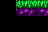

Something is wrong: 


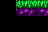

Something is wrong: 


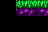

Something is wrong: 


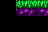

Something is wrong: 


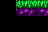

Something is wrong: 


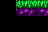

Something is wrong: 


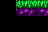

Something is wrong: 


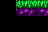

Something is wrong: 


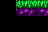

Something is wrong: 


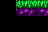

Something is wrong: 


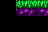

Something is wrong: 


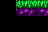

Something is wrong: 


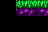

Something is wrong: 


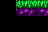

Something is wrong: 


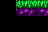

Something is wrong: 


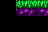

Something is wrong: 


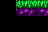

Something is wrong: 


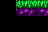

Something is wrong: 


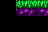

Something is wrong: 


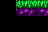

Something is wrong: 


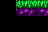

Something is wrong: 


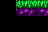

Something is wrong: 


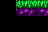

Something is wrong: 


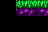

Something is wrong: 


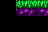

Something is wrong: 


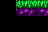

Something is wrong: 


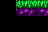

Something is wrong: 


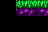

Something is wrong: 


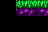

Something is wrong: 


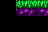

Something is wrong: 


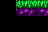

Something is wrong: 


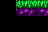

Something is wrong: 


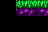

Something is wrong: 


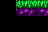

Something is wrong: 


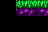

Something is wrong: 


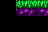

Something is wrong: 


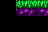

Something is wrong: 


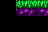

Something is wrong: 


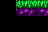

Something is wrong: 


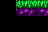

Something is wrong: 


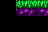

Something is wrong: 


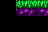

Something is wrong: 


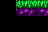

Something is wrong: 


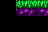

Something is wrong: 


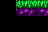

Something is wrong: 


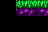

Something is wrong: 


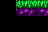

Something is wrong: 


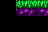

Something is wrong: 


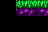

Something is wrong: 


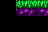

Something is wrong: 


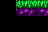

Something is wrong: 


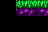

Something is wrong: 


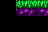

Something is wrong: 


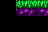

Something is wrong: 


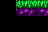

Something is wrong: 


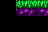

Something is wrong: 


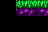

Something is wrong: 


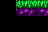

Something is wrong: 


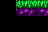

Something is wrong: 


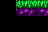

Something is wrong: 


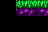

Something is wrong: 


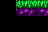

Something is wrong: 


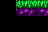

Something is wrong: 


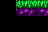

Something is wrong: 


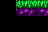

Something is wrong: 


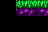

Something is wrong: 


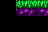

Something is wrong: 


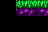

Something is wrong: 


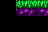

Something is wrong: 


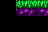

Something is wrong: 


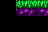

Something is wrong: 


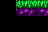

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_19
Something is wrong: 


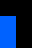

Something is wrong: 


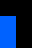

Something is wrong: 


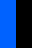

Something is wrong: 


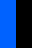

Something is wrong: 


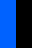

Something is wrong: 


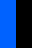

Something is wrong: 


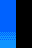

Something is wrong: 


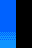

Something is wrong: 


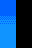

Something is wrong: 


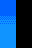

Something is wrong: 


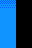

Something is wrong: 


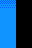

Something is wrong: 


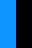

Something is wrong: 


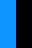

Something is wrong: 


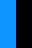

Something is wrong: 


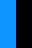

Something is wrong: 


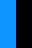

Something is wrong: 


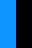

Something is wrong: 


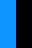

Something is wrong: 


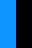

Something is wrong: 


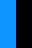

Something is wrong: 


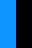

Something is wrong: 


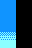

Something is wrong: 


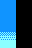

Something is wrong: 


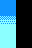

Something is wrong: 


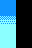

Something is wrong: 


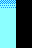

Something is wrong: 


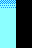

Something is wrong: 


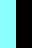

Something is wrong: 


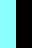

Something is wrong: 


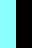

Something is wrong: 


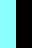

Something is wrong: 


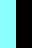

Something is wrong: 


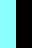

Something is wrong: 


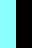

Something is wrong: 


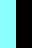

Something is wrong: 


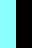

Something is wrong: 


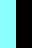

Something is wrong: 


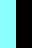

Something is wrong: 


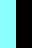

Something is wrong: 


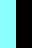

Something is wrong: 


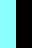

Something is wrong: 


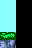

Something is wrong: 


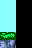

Something is wrong: 


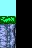

Something is wrong: 


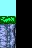

Something is wrong: 


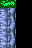

Something is wrong: 


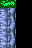

Something is wrong: 


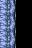

Something is wrong: 


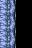

Something is wrong: 


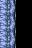

Something is wrong: 


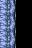

Something is wrong: 


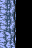

Something is wrong: 


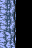

Something is wrong: 


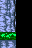

Something is wrong: 


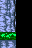

Something is wrong: 


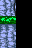

Something is wrong: 


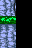

Something is wrong: 


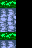

Something is wrong: 


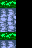

Something is wrong: 


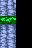

Something is wrong: 


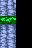

Something is wrong: 


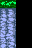

Something is wrong: 


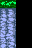

Something is wrong: 


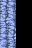

Something is wrong: 


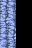

Something is wrong: 


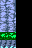

Something is wrong: 


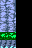

Something is wrong: 


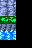

Something is wrong: 


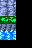

Something is wrong: 


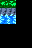

Something is wrong: 


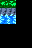

Something is wrong: 


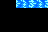

Something is wrong: 


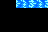

Something is wrong: 


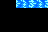

Something is wrong: 


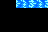

Something is wrong: 


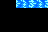

Something is wrong: 


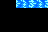

Something is wrong: 


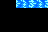

Something is wrong: 


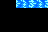

Something is wrong: 


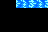

Something is wrong: 


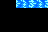

Something is wrong: 


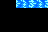

Something is wrong: 


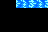

Something is wrong: 


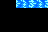

Something is wrong: 


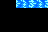

Something is wrong: 


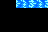

Something is wrong: 


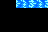

Something is wrong: 


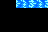

Something is wrong: 


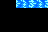

Something is wrong: 


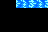

Something is wrong: 


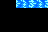

Something is wrong: 


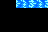

Something is wrong: 


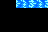

Something is wrong: 


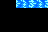

Something is wrong: 


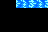

Something is wrong: 


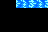

Something is wrong: 


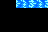

Something is wrong: 


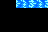

Something is wrong: 


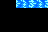

Something is wrong: 


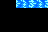

Something is wrong: 


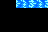

Something is wrong: 


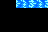

Something is wrong: 


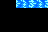

Something is wrong: 


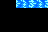

Something is wrong: 


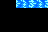

Something is wrong: 


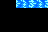

Something is wrong: 


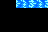

Something is wrong: 


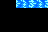

Something is wrong: 


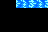

Something is wrong: 


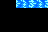

Something is wrong: 


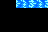

Something is wrong: 


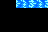

Something is wrong: 


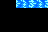

Something is wrong: 


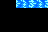

Something is wrong: 


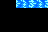

Something is wrong: 


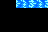

Something is wrong: 


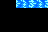

Something is wrong: 


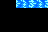

Something is wrong: 


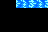

Something is wrong: 


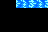

Something is wrong: 


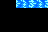

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_14
Something is wrong: 


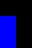

Something is wrong: 


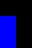

Something is wrong: 


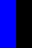

Something is wrong: 


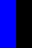

Something is wrong: 


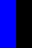

Something is wrong: 


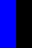

Something is wrong: 


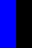

Something is wrong: 


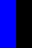

Something is wrong: 


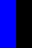

Something is wrong: 


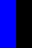

Something is wrong: 


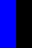

Something is wrong: 


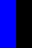

Something is wrong: 


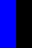

Something is wrong: 


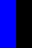

Something is wrong: 


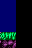

Something is wrong: 


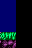

Something is wrong: 


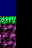

Something is wrong: 


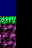

Something is wrong: 


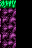

Something is wrong: 


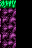

Something is wrong: 


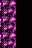

Something is wrong: 


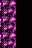

Something is wrong: 


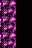

Something is wrong: 


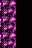

Something is wrong: 


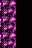

Something is wrong: 


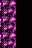

Something is wrong: 


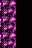

Something is wrong: 


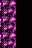

Something is wrong: 


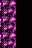

Something is wrong: 


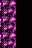

Something is wrong: 


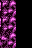

Something is wrong: 


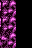

Something is wrong: 


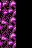

Something is wrong: 


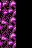

Something is wrong: 


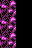

Something is wrong: 


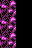

Something is wrong: 


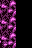

Something is wrong: 


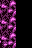

Something is wrong: 


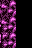

Something is wrong: 


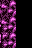

Something is wrong: 


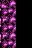

Something is wrong: 


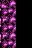

Something is wrong: 


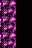

Something is wrong: 


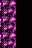

Something is wrong: 


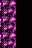

Something is wrong: 


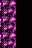

Something is wrong: 


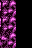

Something is wrong: 


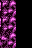

Something is wrong: 


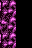

Something is wrong: 


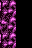

Something is wrong: 


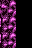

Something is wrong: 


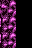

Something is wrong: 


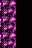

Something is wrong: 


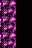

Something is wrong: 


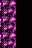

Something is wrong: 


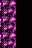

Something is wrong: 


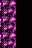

Something is wrong: 


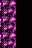

Something is wrong: 


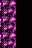

Something is wrong: 


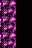

Something is wrong: 


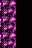

Something is wrong: 


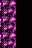

Something is wrong: 


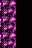

Something is wrong: 


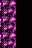

Something is wrong: 


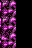

Something is wrong: 


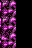

Something is wrong: 


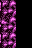

Something is wrong: 


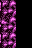

Something is wrong: 


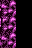

Something is wrong: 


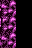

Something is wrong: 


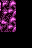

Something is wrong: 


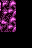

Something is wrong: 


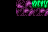

Something is wrong: 


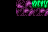

Something is wrong: 


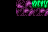

Something is wrong: 


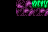

Something is wrong: 


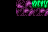

Something is wrong: 


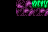

Something is wrong: 


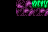

Something is wrong: 


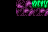

Something is wrong: 


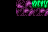

Something is wrong: 


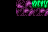

Something is wrong: 


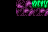

Something is wrong: 


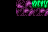

Something is wrong: 


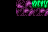

Something is wrong: 


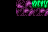

Something is wrong: 


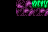

Something is wrong: 


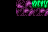

Something is wrong: 


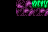

Something is wrong: 


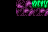

Something is wrong: 


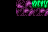

Something is wrong: 


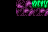

Something is wrong: 


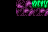

Something is wrong: 


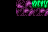

Something is wrong: 


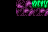

Something is wrong: 


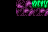

Something is wrong: 


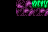

Something is wrong: 


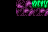

Something is wrong: 


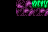

Something is wrong: 


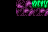

Something is wrong: 


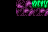

Something is wrong: 


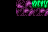

Something is wrong: 


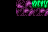

Something is wrong: 


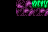

Something is wrong: 


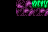

Something is wrong: 


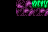

Something is wrong: 


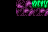

Something is wrong: 


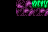

Something is wrong: 


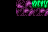

Something is wrong: 


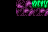

Something is wrong: 


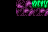

Something is wrong: 


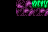

Something is wrong: 


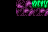

Something is wrong: 


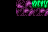

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_22
Something is wrong: 


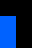

Something is wrong: 


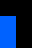

Something is wrong: 


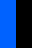

Something is wrong: 


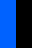

Something is wrong: 


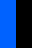

Something is wrong: 


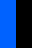

Something is wrong: 


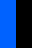

Something is wrong: 


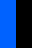

Something is wrong: 


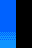

Something is wrong: 


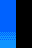

Something is wrong: 


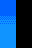

Something is wrong: 


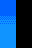

Something is wrong: 


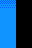

Something is wrong: 


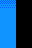

Something is wrong: 


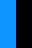

Something is wrong: 


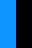

Something is wrong: 


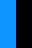

Something is wrong: 


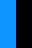

Something is wrong: 


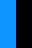

Something is wrong: 


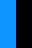

Something is wrong: 


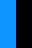

Something is wrong: 


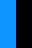

Something is wrong: 


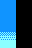

Something is wrong: 


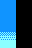

Something is wrong: 


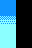

Something is wrong: 


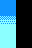

Something is wrong: 


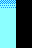

Something is wrong: 


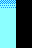

Something is wrong: 


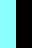

Something is wrong: 


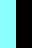

Something is wrong: 


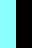

Something is wrong: 


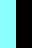

Something is wrong: 


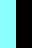

Something is wrong: 


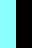

Something is wrong: 


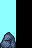

Something is wrong: 


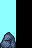

Something is wrong: 


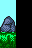

Something is wrong: 


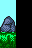

Something is wrong: 


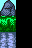

Something is wrong: 


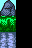

Something is wrong: 


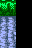

Something is wrong: 


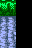

Something is wrong: 


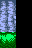

Something is wrong: 


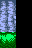

Something is wrong: 


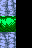

Something is wrong: 


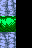

Something is wrong: 


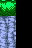

Something is wrong: 


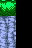

Something is wrong: 


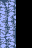

Something is wrong: 


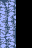

Something is wrong: 


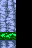

Something is wrong: 


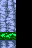

Something is wrong: 


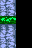

Something is wrong: 


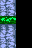

Something is wrong: 


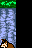

Something is wrong: 


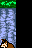

Something is wrong: 


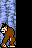

Something is wrong: 


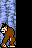

Something is wrong: 


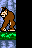

Something is wrong: 


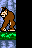

Something is wrong: 


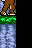

Something is wrong: 


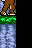

Something is wrong: 


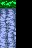

Something is wrong: 


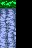

Something is wrong: 


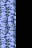

Something is wrong: 


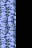

Something is wrong: 


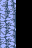

Something is wrong: 


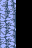

Something is wrong: 


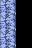

Something is wrong: 


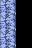

Something is wrong: 


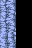

Something is wrong: 


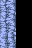

Something is wrong: 


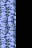

Something is wrong: 


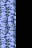

Something is wrong: 


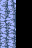

Something is wrong: 


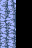

Something is wrong: 


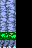

Something is wrong: 


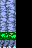

Something is wrong: 


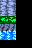

Something is wrong: 


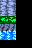

Something is wrong: 


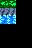

Something is wrong: 


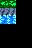

Something is wrong: 


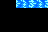

Something is wrong: 


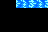

Something is wrong: 


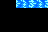

Something is wrong: 


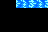

Something is wrong: 


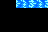

Something is wrong: 


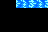

Something is wrong: 


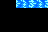

Something is wrong: 


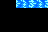

Something is wrong: 


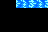

Something is wrong: 


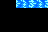

Something is wrong: 


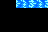

Something is wrong: 


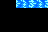

Something is wrong: 


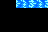

Something is wrong: 


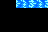

Something is wrong: 


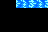

Something is wrong: 


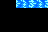

Something is wrong: 


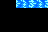

Something is wrong: 


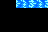

Something is wrong: 


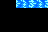

Something is wrong: 


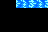

Something is wrong: 


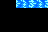

Something is wrong: 


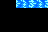

Something is wrong: 


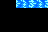

Something is wrong: 


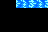

Something is wrong: 


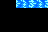

Something is wrong: 


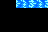

Something is wrong: 


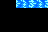

Something is wrong: 


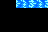

Something is wrong: 


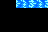

Something is wrong: 


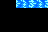

Something is wrong: 


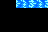

Something is wrong: 


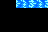

Something is wrong: 


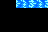

Something is wrong: 


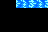

Something is wrong: 


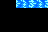

Something is wrong: 


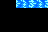

Something is wrong: 


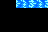

Something is wrong: 


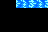

Something is wrong: 


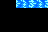

Something is wrong: 


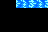

Something is wrong: 


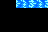

Something is wrong: 


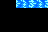

Something is wrong: 


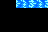

Something is wrong: 


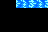

Something is wrong: 


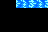

Something is wrong: 


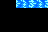

Something is wrong: 


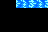

Something is wrong: 


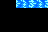

Something is wrong: 


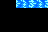

Something is wrong: 


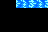

Something is wrong: 


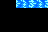

Something is wrong: 


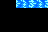

Something is wrong: 


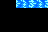

Something is wrong: 


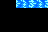

Something is wrong: 


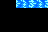

Something is wrong: 


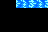

Something is wrong: 


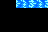

Something is wrong: 


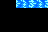

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_0_11
Something is wrong: 


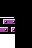

Something is wrong: 


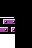

Something is wrong: 


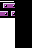

Something is wrong: 


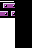

Something is wrong: 


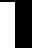

Something is wrong: 


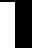

Something is wrong: 


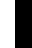

Something is wrong: 


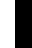

Something is wrong: 


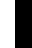

Something is wrong: 


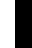

Something is wrong: 


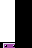

Something is wrong: 


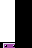

Something is wrong: 


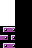

Something is wrong: 


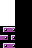

Something is wrong: 


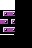

Something is wrong: 


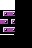

Something is wrong: 


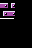

Something is wrong: 


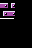

Something is wrong: 


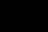

Something is wrong: 


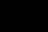

Something is wrong: 


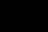

Something is wrong: 


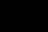

Something is wrong: 


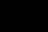

Something is wrong: 


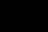

Something is wrong: 


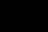

Something is wrong: 


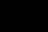

Something is wrong: 


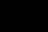

Something is wrong: 


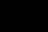

Something is wrong: 


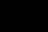

Something is wrong: 


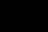

Something is wrong: 


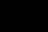

Something is wrong: 


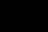

Something is wrong: 


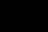

Something is wrong: 


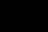

Something is wrong: 


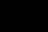

Something is wrong: 


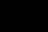

Something is wrong: 


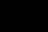

Something is wrong: 


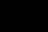

Something is wrong: 


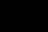

Something is wrong: 


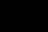

Something is wrong: 


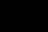

Something is wrong: 


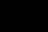

Something is wrong: 


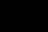

Something is wrong: 


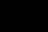

Something is wrong: 


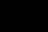

Something is wrong: 


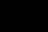

Something is wrong: 


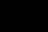

Something is wrong: 


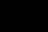

Something is wrong: 


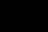

Something is wrong: 


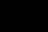

Something is wrong: 


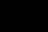

Something is wrong: 


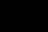

Something is wrong: 


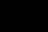

Something is wrong: 


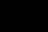

Something is wrong: 


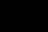

Something is wrong: 


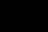

Something is wrong: 


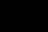

Something is wrong: 


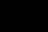

Something is wrong: 


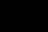

Something is wrong: 


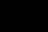

Something is wrong: 


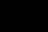

Something is wrong: 


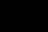

Something is wrong: 


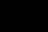

Something is wrong: 


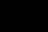

Something is wrong: 


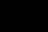

Something is wrong: 


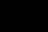

Something is wrong: 


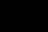

Something is wrong: 


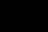

Something is wrong: 


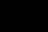

Something is wrong: 


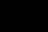

Something is wrong: 


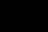

Something is wrong: 


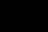

Something is wrong: 


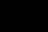

Something is wrong: 


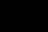

Something is wrong: 


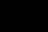

Something is wrong: 


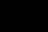

Something is wrong: 


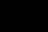

Something is wrong: 


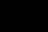

Something is wrong: 


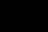

Something is wrong: 


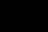

Something is wrong: 


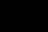

Something is wrong: 


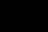

Something is wrong: 


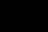

Something is wrong: 


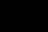

Something is wrong: 


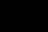

Something is wrong: 


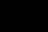

Something is wrong: 


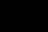

Something is wrong: 


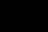

Something is wrong: 


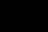

Something is wrong: 


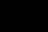

Something is wrong: 


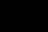

Something is wrong: 


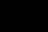

Something is wrong: 


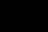

Something is wrong: 


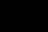

Something is wrong: 


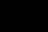

Something is wrong: 


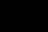

Something is wrong: 


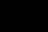

Something is wrong: 


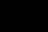

Something is wrong: 


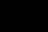

Something is wrong: 


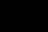

Something is wrong: 


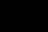

Something is wrong: 


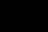

Something is wrong: 


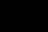

Something is wrong: 


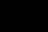

Something is wrong: 


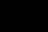

Something is wrong: 


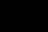

Something is wrong: 


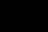

Something is wrong: 


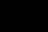

Something is wrong: 


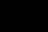

Something is wrong: 


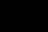

Something is wrong: 


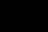

Something is wrong: 


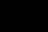

Something is wrong: 


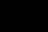

Something is wrong: 


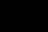

Something is wrong: 


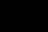

Something is wrong: 


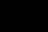

Something is wrong: 


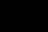

Something is wrong: 


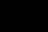

Something is wrong: 


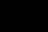

Something is wrong: 


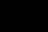

Something is wrong: 


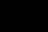

Something is wrong: 


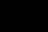

Something is wrong: 


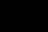

Something is wrong: 


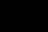

Something is wrong: 


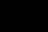

Something is wrong: 


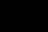

Something is wrong: 


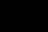

Something is wrong: 


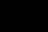

Something is wrong: 


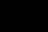

Something is wrong: 


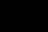

Something is wrong: 


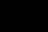

Something is wrong: 


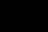

Something is wrong: 


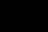

Something is wrong: 


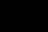

Something is wrong: 


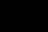

Something is wrong: 


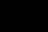

Something is wrong: 


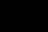

Something is wrong: 


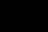

Something is wrong: 


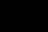

Something is wrong: 


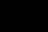

Something is wrong: 


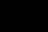

Something is wrong: 


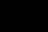

Something is wrong: 


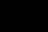

Something is wrong: 


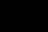

Something is wrong: 


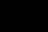

Something is wrong: 


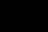

Something is wrong: 


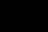

Something is wrong: 


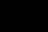

Something is wrong: 


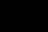

Something is wrong: 


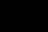

Something is wrong: 


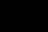

Something is wrong: 


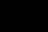

Something is wrong: 


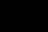

Something is wrong: 


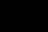

Something is wrong: 


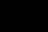

Something is wrong: 


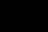

Something is wrong: 


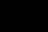

Something is wrong: 


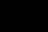

Something is wrong: 


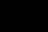

Something is wrong: 


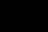

Something is wrong: 


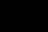

Something is wrong: 


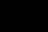

Something is wrong: 


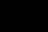

Something is wrong: 


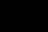

Something is wrong: 


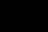

Something is wrong: 


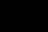

Something is wrong: 


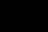

Something is wrong: 


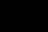

Something is wrong: 


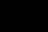

Something is wrong: 


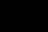

Something is wrong: 


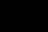

Something is wrong: 


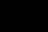

Something is wrong: 


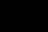

Something is wrong: 


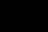

Something is wrong: 


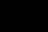

Something is wrong: 


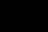

Something is wrong: 


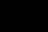

Something is wrong: 


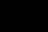

Something is wrong: 


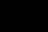

Something is wrong: 


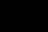

Something is wrong: 


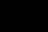

Something is wrong: 


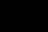

Something is wrong: 


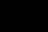

Something is wrong: 


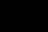

Something is wrong: 


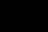

Something is wrong: 


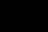

Something is wrong: 


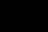

Something is wrong: 


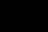

Something is wrong: 


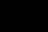

Something is wrong: 


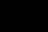

Something is wrong: 


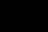

Something is wrong: 


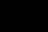

Something is wrong: 


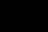

Something is wrong: 


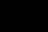

Something is wrong: 


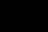

Something is wrong: 


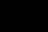

Something is wrong: 


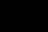

Something is wrong: 


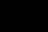

Something is wrong: 


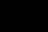

Something is wrong: 


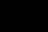

Something is wrong: 


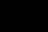

Something is wrong: 


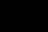

Something is wrong: 


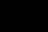

Something is wrong: 


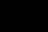

Something is wrong: 


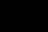

Something is wrong: 


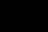

Something is wrong: 


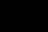

Something is wrong: 


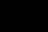

Something is wrong: 


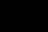

Something is wrong: 


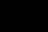

Something is wrong: 


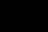

Something is wrong: 


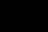

Something is wrong: 


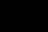

Something is wrong: 


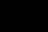

Something is wrong: 


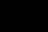

Something is wrong: 


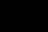

Something is wrong: 


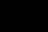

Something is wrong: 


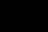

Something is wrong: 


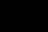

Something is wrong: 


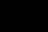

Something is wrong: 


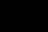

Something is wrong: 


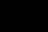

Something is wrong: 


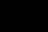

Something is wrong: 


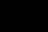

Something is wrong: 


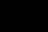

Something is wrong: 


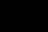

Something is wrong: 


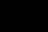

Something is wrong: 


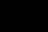

Something is wrong: 


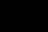

Something is wrong: 


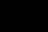

Something is wrong: 


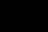

Something is wrong: 


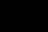

Something is wrong: 


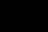

Something is wrong: 


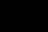

Something is wrong: 


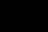

Something is wrong: 


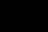

Something is wrong: 


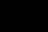

Something is wrong: 


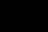

Something is wrong: 


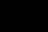

Something is wrong: 


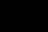

Something is wrong: 


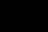

Something is wrong: 


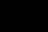

Something is wrong: 


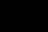

Something is wrong: 


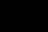

Something is wrong: 


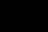

Something is wrong: 


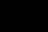

Something is wrong: 


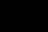

Something is wrong: 


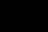

Something is wrong: 


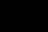

Something is wrong: 


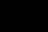

Something is wrong: 


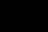

Something is wrong: 


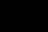

Something is wrong: 


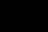

Something is wrong: 


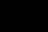

Something is wrong: 


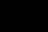

Something is wrong: 


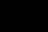

Something is wrong: 


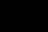

Something is wrong: 


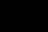

Something is wrong: 


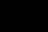

Something is wrong: 


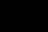

Something is wrong: 


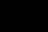

Something is wrong: 


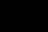

Something is wrong: 


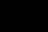

Something is wrong: 


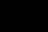

Something is wrong: 


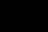

Something is wrong: 


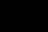

Something is wrong: 


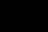

Something is wrong: 


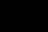

Something is wrong: 


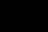

Something is wrong: 


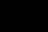

Something is wrong: 


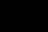

Something is wrong: 


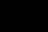

Something is wrong: 


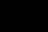

Something is wrong: 


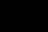

Something is wrong: 


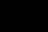

Something is wrong: 


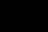

Something is wrong: 


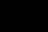

Something is wrong: 


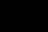

Something is wrong: 


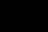

Something is wrong: 


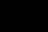

Something is wrong: 


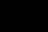

Something is wrong: 


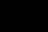

Something is wrong: 


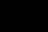

Something is wrong: 


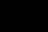

Something is wrong: 


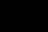

Something is wrong: 


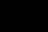

Something is wrong: 


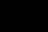

Something is wrong: 


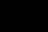

Something is wrong: 


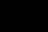

Something is wrong: 


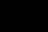

Something is wrong: 


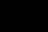

Something is wrong: 


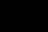

Something is wrong: 


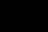

Something is wrong: 


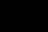

Something is wrong: 


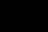

Something is wrong: 


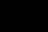

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_2
Something is wrong: 


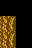

Something is wrong: 


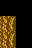

Something is wrong: 


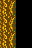

Something is wrong: 


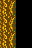

Something is wrong: 


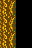

Something is wrong: 


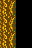

Something is wrong: 


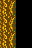

Something is wrong: 


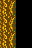

Something is wrong: 


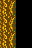

Something is wrong: 


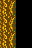

Something is wrong: 


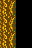

Something is wrong: 


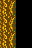

Something is wrong: 


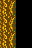

Something is wrong: 


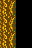

Something is wrong: 


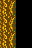

Something is wrong: 


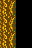

Something is wrong: 


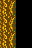

Something is wrong: 


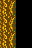

Something is wrong: 


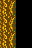

Something is wrong: 


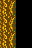

Something is wrong: 


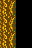

Something is wrong: 


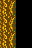

Something is wrong: 


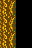

Something is wrong: 


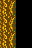

Something is wrong: 


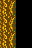

Something is wrong: 


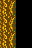

Something is wrong: 


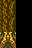

Something is wrong: 


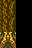

Something is wrong: 


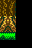

Something is wrong: 


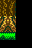

Something is wrong: 


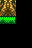

Something is wrong: 


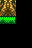

Something is wrong: 


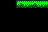

Something is wrong: 


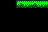

Something is wrong: 


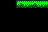

Something is wrong: 


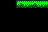

Something is wrong: 


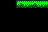

Something is wrong: 


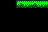

Something is wrong: 


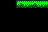

Something is wrong: 


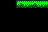

Something is wrong: 


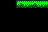

Something is wrong: 


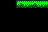

Something is wrong: 


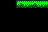

Something is wrong: 


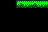

Something is wrong: 


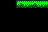

Something is wrong: 


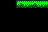

Something is wrong: 


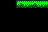

Something is wrong: 


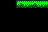

Something is wrong: 


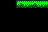

Something is wrong: 


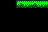

Something is wrong: 


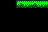

Something is wrong: 


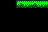

Something is wrong: 


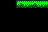

Something is wrong: 


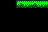

Something is wrong: 


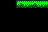

Something is wrong: 


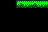

Something is wrong: 


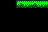

Something is wrong: 


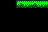

Something is wrong: 


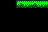

Something is wrong: 


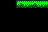

Something is wrong: 


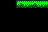

Something is wrong: 


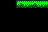

Something is wrong: 


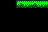

Something is wrong: 


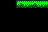

Something is wrong: 


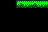

Something is wrong: 


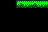

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_42
Something is wrong: 


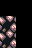

Something is wrong: 


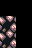

Something is wrong: 


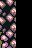

Something is wrong: 


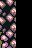

Something is wrong: 


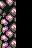

Something is wrong: 


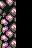

Something is wrong: 


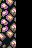

Something is wrong: 


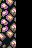

Something is wrong: 


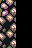

Something is wrong: 


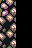

Something is wrong: 


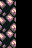

Something is wrong: 


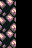

Something is wrong: 


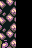

Something is wrong: 


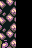

Something is wrong: 


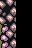

Something is wrong: 


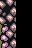

Something is wrong: 


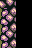

Something is wrong: 


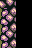

Something is wrong: 


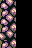

Something is wrong: 


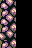

Something is wrong: 


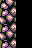

Something is wrong: 


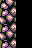

Something is wrong: 


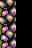

Something is wrong: 


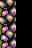

Something is wrong: 


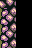

Something is wrong: 


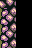

Something is wrong: 


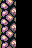

Something is wrong: 


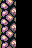

Something is wrong: 


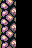

Something is wrong: 


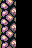

Something is wrong: 


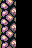

Something is wrong: 


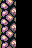

Something is wrong: 


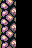

Something is wrong: 


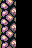

Something is wrong: 


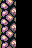

Something is wrong: 


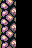

Something is wrong: 


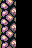

Something is wrong: 


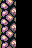

Something is wrong: 


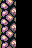

Something is wrong: 


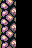

Something is wrong: 


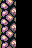

Something is wrong: 


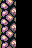

Something is wrong: 


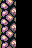

Something is wrong: 


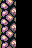

Something is wrong: 


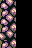

Something is wrong: 


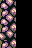

Something is wrong: 


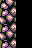

Something is wrong: 


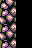

Something is wrong: 


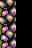

Something is wrong: 


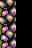

Something is wrong: 


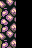

Something is wrong: 


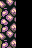

Something is wrong: 


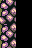

Something is wrong: 


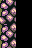

Something is wrong: 


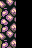

Something is wrong: 


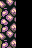

Something is wrong: 


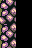

Something is wrong: 


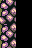

Something is wrong: 


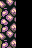

Something is wrong: 


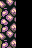

Something is wrong: 


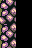

Something is wrong: 


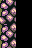

Something is wrong: 


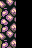

Something is wrong: 


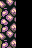

Something is wrong: 


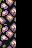

Something is wrong: 


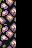

Something is wrong: 


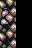

Something is wrong: 


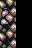

Something is wrong: 


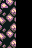

Something is wrong: 


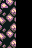

Something is wrong: 


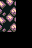

Something is wrong: 


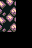

Something is wrong: 


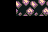

Something is wrong: 


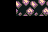

Something is wrong: 


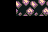

Something is wrong: 


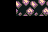

Something is wrong: 


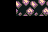

Something is wrong: 


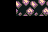

Something is wrong: 


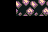

Something is wrong: 


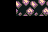

Something is wrong: 


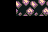

Something is wrong: 


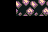

Something is wrong: 


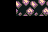

Something is wrong: 


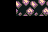

Something is wrong: 


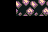

Something is wrong: 


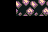

Something is wrong: 


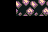

Something is wrong: 


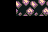

Something is wrong: 


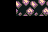

Something is wrong: 


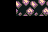

Something is wrong: 


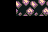

Something is wrong: 


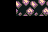

Something is wrong: 


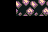

Something is wrong: 


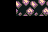

Something is wrong: 


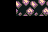

Something is wrong: 


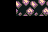

Something is wrong: 


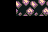

Something is wrong: 


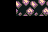

Something is wrong: 


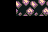

Something is wrong: 


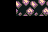

Something is wrong: 


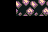

Something is wrong: 


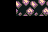

Something is wrong: 


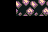

Something is wrong: 


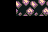

Something is wrong: 


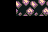

Something is wrong: 


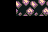

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_27
Something is wrong: 


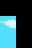

Something is wrong: 


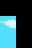

Something is wrong: 


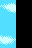

Something is wrong: 


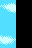

Something is wrong: 


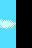

Something is wrong: 


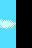

Something is wrong: 


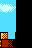

Something is wrong: 


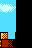

Something is wrong: 


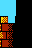

Something is wrong: 


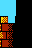

Something is wrong: 


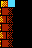

Something is wrong: 


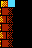

Something is wrong: 


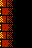

Something is wrong: 


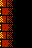

Something is wrong: 


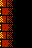

Something is wrong: 


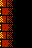

Something is wrong: 


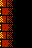

Something is wrong: 


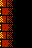

Something is wrong: 


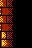

Something is wrong: 


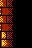

Something is wrong: 


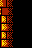

Something is wrong: 


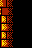

Something is wrong: 


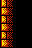

Something is wrong: 


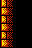

Something is wrong: 


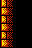

Something is wrong: 


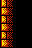

Something is wrong: 


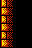

Something is wrong: 


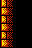

Something is wrong: 


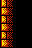

Something is wrong: 


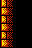

Something is wrong: 


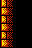

Something is wrong: 


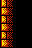

Something is wrong: 


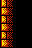

Something is wrong: 


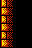

Something is wrong: 


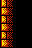

Something is wrong: 


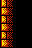

Something is wrong: 


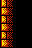

Something is wrong: 


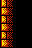

Something is wrong: 


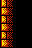

Something is wrong: 


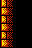

Something is wrong: 


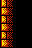

Something is wrong: 


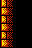

Something is wrong: 


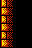

Something is wrong: 


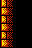

Something is wrong: 


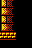

Something is wrong: 


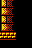

Something is wrong: 


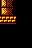

Something is wrong: 


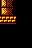

Something is wrong: 


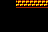

Something is wrong: 


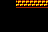

Something is wrong: 


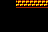

Something is wrong: 


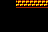

Something is wrong: 


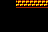

Something is wrong: 


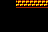

Something is wrong: 


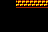

Something is wrong: 


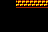

Something is wrong: 


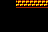

Something is wrong: 


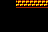

Something is wrong: 


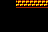

Something is wrong: 


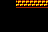

Something is wrong: 


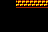

Something is wrong: 


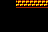

Something is wrong: 


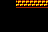

Something is wrong: 


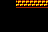

Something is wrong: 


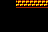

Something is wrong: 


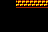

Something is wrong: 


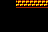

Something is wrong: 


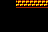

Something is wrong: 


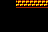

Something is wrong: 


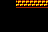

Something is wrong: 


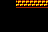

Something is wrong: 


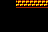

Something is wrong: 


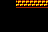

Something is wrong: 


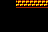

Something is wrong: 


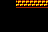

Something is wrong: 


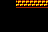

Something is wrong: 


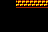

Something is wrong: 


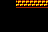

Something is wrong: 


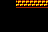

Something is wrong: 


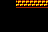

Something is wrong: 


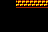

Something is wrong: 


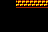

Something is wrong: 


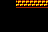

Something is wrong: 


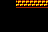

Something is wrong: 


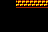

Something is wrong: 


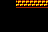

Something is wrong: 


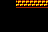

Something is wrong: 


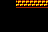

Something is wrong: 


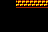

Something is wrong: 


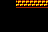

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_39
Something is wrong: 


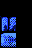

Something is wrong: 


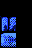

Something is wrong: 


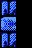

Something is wrong: 


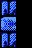

Something is wrong: 


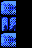

Something is wrong: 


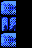

Something is wrong: 


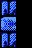

Something is wrong: 


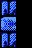

Something is wrong: 


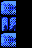

Something is wrong: 


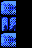

Something is wrong: 


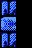

Something is wrong: 


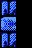

Something is wrong: 


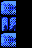

Something is wrong: 


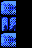

Something is wrong: 


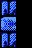

Something is wrong: 


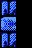

Something is wrong: 


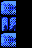

Something is wrong: 


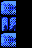

Something is wrong: 


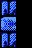

Something is wrong: 


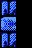

Something is wrong: 


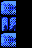

Something is wrong: 


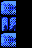

Something is wrong: 


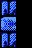

Something is wrong: 


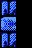

Something is wrong: 


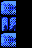

Something is wrong: 


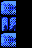

Something is wrong: 


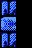

Something is wrong: 


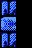

Something is wrong: 


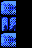

Something is wrong: 


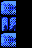

Something is wrong: 


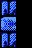

Something is wrong: 


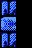

Something is wrong: 


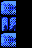

Something is wrong: 


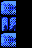

Something is wrong: 


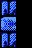

Something is wrong: 


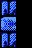

Something is wrong: 


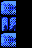

Something is wrong: 


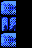

Something is wrong: 


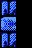

Something is wrong: 


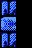

Something is wrong: 


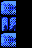

Something is wrong: 


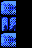

Something is wrong: 


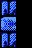

Something is wrong: 


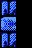

Something is wrong: 


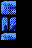

Something is wrong: 


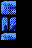

Something is wrong: 


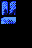

Something is wrong: 


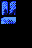

Something is wrong: 


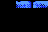

Something is wrong: 


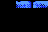

Something is wrong: 


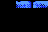

Something is wrong: 


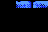

Something is wrong: 


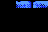

Something is wrong: 


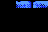

Something is wrong: 


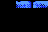

Something is wrong: 


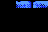

Something is wrong: 


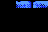

Something is wrong: 


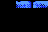

Something is wrong: 


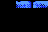

Something is wrong: 


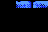

Something is wrong: 


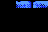

Something is wrong: 


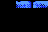

Something is wrong: 


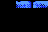

Something is wrong: 


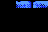

Something is wrong: 


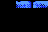

Something is wrong: 


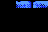

Something is wrong: 


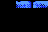

Something is wrong: 


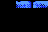

Something is wrong: 


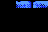

Something is wrong: 


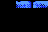

Something is wrong: 


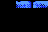

Something is wrong: 


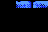

Something is wrong: 


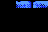

Something is wrong: 


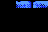

Something is wrong: 


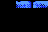

Something is wrong: 


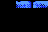

Something is wrong: 


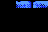

Something is wrong: 


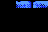

Something is wrong: 


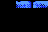

Something is wrong: 


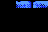

Something is wrong: 


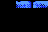

Something is wrong: 


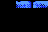

Something is wrong: 


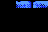

Something is wrong: 


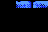

Something is wrong: 


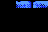

Something is wrong: 


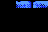

Something is wrong: 


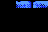

Something is wrong: 


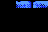

Something is wrong: 


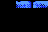

Something is wrong: 


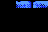

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_38
Something is wrong: 


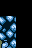

Something is wrong: 


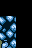

Something is wrong: 


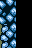

Something is wrong: 


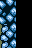

Something is wrong: 


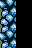

Something is wrong: 


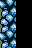

Something is wrong: 


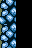

Something is wrong: 


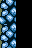

Something is wrong: 


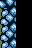

Something is wrong: 


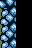

Something is wrong: 


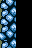

Something is wrong: 


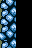

Something is wrong: 


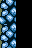

Something is wrong: 


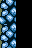

Something is wrong: 


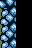

Something is wrong: 


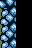

Something is wrong: 


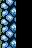

Something is wrong: 


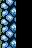

Something is wrong: 


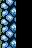

Something is wrong: 


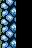

Something is wrong: 


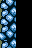

Something is wrong: 


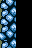

Something is wrong: 


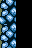

Something is wrong: 


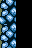

Something is wrong: 


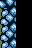

Something is wrong: 


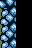

Something is wrong: 


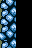

Something is wrong: 


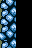

Something is wrong: 


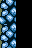

Something is wrong: 


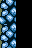

Something is wrong: 


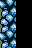

Something is wrong: 


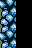

Something is wrong: 


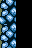

Something is wrong: 


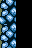

Something is wrong: 


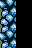

Something is wrong: 


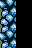

Something is wrong: 


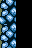

Something is wrong: 


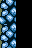

Something is wrong: 


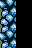

Something is wrong: 


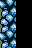

Something is wrong: 


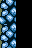

Something is wrong: 


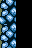

Something is wrong: 


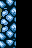

Something is wrong: 


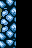

Something is wrong: 


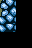

Something is wrong: 


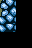

Something is wrong: 


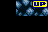

Something is wrong: 


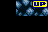

Something is wrong: 


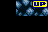

Something is wrong: 


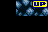

Something is wrong: 


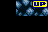

Something is wrong: 


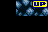

Something is wrong: 


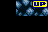

Something is wrong: 


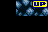

Something is wrong: 


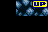

Something is wrong: 


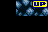

Something is wrong: 


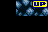

Something is wrong: 


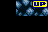

Something is wrong: 


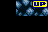

Something is wrong: 


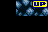

Something is wrong: 


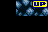

Something is wrong: 


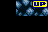

Something is wrong: 


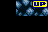

Something is wrong: 


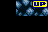

Something is wrong: 


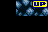

Something is wrong: 


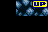

Something is wrong: 


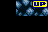

Something is wrong: 


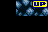

Something is wrong: 


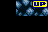

Something is wrong: 


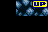

Something is wrong: 


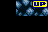

Something is wrong: 


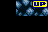

Something is wrong: 


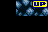

Something is wrong: 


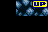

Something is wrong: 


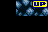

Something is wrong: 


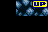

Something is wrong: 


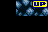

Something is wrong: 


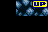

Something is wrong: 


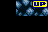

Something is wrong: 


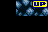

Something is wrong: 


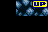

Something is wrong: 


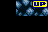

Something is wrong: 


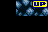

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_30
Something is wrong: 


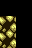

Something is wrong: 


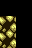

Something is wrong: 


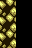

Something is wrong: 


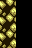

Something is wrong: 


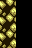

Something is wrong: 


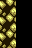

Something is wrong: 


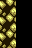

Something is wrong: 


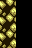

Something is wrong: 


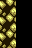

Something is wrong: 


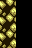

Something is wrong: 


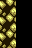

Something is wrong: 


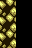

Something is wrong: 


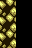

Something is wrong: 


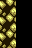

Something is wrong: 


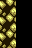

Something is wrong: 


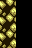

Something is wrong: 


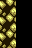

Something is wrong: 


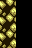

Something is wrong: 


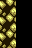

Something is wrong: 


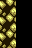

Something is wrong: 


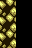

Something is wrong: 


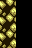

Something is wrong: 


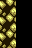

Something is wrong: 


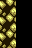

Something is wrong: 


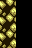

Something is wrong: 


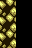

Something is wrong: 


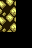

Something is wrong: 


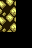

Something is wrong: 


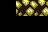

Something is wrong: 


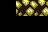

Something is wrong: 


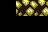

Something is wrong: 


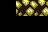

Something is wrong: 


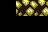

Something is wrong: 


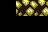

Something is wrong: 


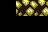

Something is wrong: 


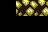

Something is wrong: 


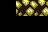

Something is wrong: 


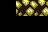

Something is wrong: 


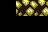

Something is wrong: 


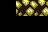

Something is wrong: 


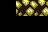

Something is wrong: 


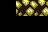

Something is wrong: 


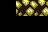

Something is wrong: 


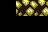

Something is wrong: 


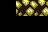

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_28
Something is wrong: 


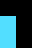

Something is wrong: 


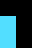

Something is wrong: 


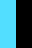

Something is wrong: 


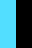

Something is wrong: 


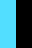

Something is wrong: 


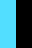

Something is wrong: 


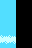

Something is wrong: 


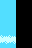

Something is wrong: 


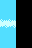

Something is wrong: 


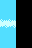

Something is wrong: 


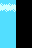

Something is wrong: 


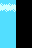

Something is wrong: 


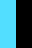

Something is wrong: 


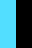

Something is wrong: 


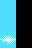

Something is wrong: 


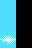

Something is wrong: 


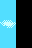

Something is wrong: 


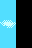

Something is wrong: 


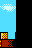

Something is wrong: 


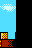

Something is wrong: 


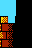

Something is wrong: 


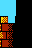

Something is wrong: 


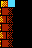

Something is wrong: 


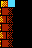

Something is wrong: 


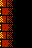

Something is wrong: 


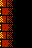

Something is wrong: 


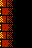

Something is wrong: 


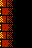

Something is wrong: 


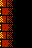

Something is wrong: 


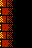

Something is wrong: 


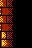

Something is wrong: 


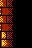

Something is wrong: 


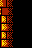

Something is wrong: 


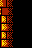

Something is wrong: 


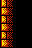

Something is wrong: 


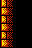

Something is wrong: 


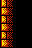

Something is wrong: 


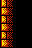

Something is wrong: 


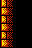

Something is wrong: 


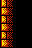

Something is wrong: 


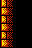

Something is wrong: 


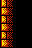

Something is wrong: 


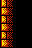

Something is wrong: 


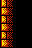

Something is wrong: 


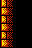

Something is wrong: 


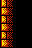

Something is wrong: 


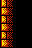

Something is wrong: 


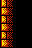

Something is wrong: 


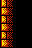

Something is wrong: 


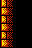

Something is wrong: 


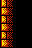

Something is wrong: 


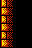

Something is wrong: 


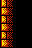

Something is wrong: 


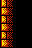

Something is wrong: 


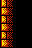

Something is wrong: 


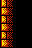

Something is wrong: 


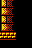

Something is wrong: 


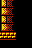

Something is wrong: 


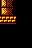

Something is wrong: 


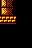

Something is wrong: 


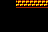

Something is wrong: 


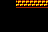

Something is wrong: 


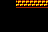

Something is wrong: 


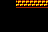

Something is wrong: 


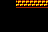

Something is wrong: 


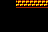

Something is wrong: 


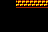

Something is wrong: 


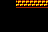

Something is wrong: 


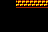

Something is wrong: 


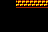

Something is wrong: 


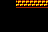

Something is wrong: 


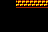

Something is wrong: 


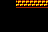

Something is wrong: 


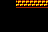

Something is wrong: 


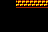

Something is wrong: 


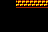

Something is wrong: 


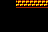

Something is wrong: 


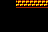

Something is wrong: 


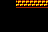

Something is wrong: 


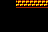

Something is wrong: 


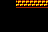

Something is wrong: 


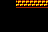

Something is wrong: 


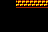

Something is wrong: 


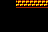

Something is wrong: 


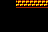

Something is wrong: 


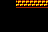

Something is wrong: 


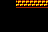

Something is wrong: 


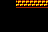

Something is wrong: 


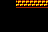

Something is wrong: 


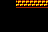

Something is wrong: 


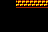

Something is wrong: 


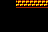

Something is wrong: 


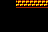

Something is wrong: 


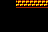

Something is wrong: 


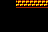

Something is wrong: 


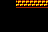

Something is wrong: 


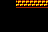

Something is wrong: 


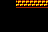

Something is wrong: 


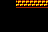

Something is wrong: 


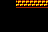

Something is wrong: 


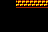

Something is wrong: 


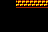

Something is wrong: 


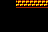

Something is wrong: 


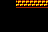

Something is wrong: 


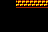

Something is wrong: 


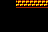

Something is wrong: 


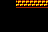

Something is wrong: 


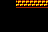

Something is wrong: 


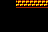

Something is wrong: 


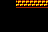

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_0
Something is wrong: 


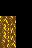

Something is wrong: 


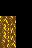

Something is wrong: 


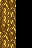

Something is wrong: 


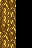

Something is wrong: 


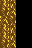

Something is wrong: 


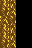

Something is wrong: 


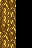

Something is wrong: 


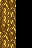

Something is wrong: 


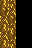

Something is wrong: 


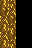

Something is wrong: 


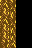

Something is wrong: 


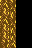

Something is wrong: 


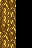

Something is wrong: 


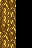

Something is wrong: 


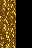

Something is wrong: 


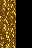

Something is wrong: 


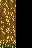

Something is wrong: 


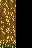

Something is wrong: 


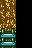

Something is wrong: 


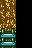

Something is wrong: 


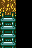

Something is wrong: 


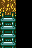

Something is wrong: 


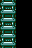

Something is wrong: 


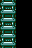

Something is wrong: 


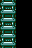

Something is wrong: 


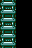

Something is wrong: 


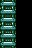

Something is wrong: 


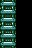

Something is wrong: 


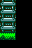

Something is wrong: 


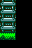

Something is wrong: 


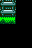

Something is wrong: 


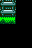

Something is wrong: 


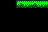

Something is wrong: 


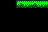

Something is wrong: 


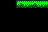

Something is wrong: 


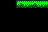

Something is wrong: 


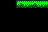

Something is wrong: 


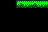

Something is wrong: 


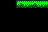

Something is wrong: 


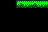

Something is wrong: 


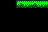

Something is wrong: 


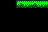

Something is wrong: 


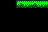

Something is wrong: 


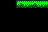

Something is wrong: 


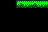

Something is wrong: 


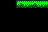

Something is wrong: 


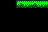

Something is wrong: 


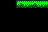

Something is wrong: 


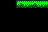

Something is wrong: 


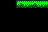

Something is wrong: 


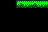

Something is wrong: 


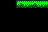

Something is wrong: 


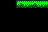

Something is wrong: 


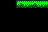

Something is wrong: 


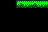

Something is wrong: 


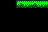

Something is wrong: 


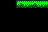

Something is wrong: 


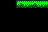

Something is wrong: 


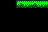

Something is wrong: 


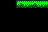

Something is wrong: 


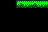

Something is wrong: 


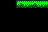

Something is wrong: 


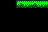

Something is wrong: 


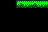

Something is wrong: 


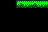

Something is wrong: 


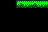

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_6
Something is wrong: 


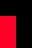

Something is wrong: 


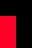

Something is wrong: 


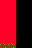

Something is wrong: 


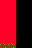

Something is wrong: 


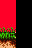

Something is wrong: 


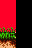

Something is wrong: 


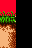

Something is wrong: 


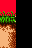

Something is wrong: 


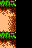

Something is wrong: 


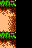

Something is wrong: 


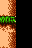

Something is wrong: 


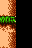

Something is wrong: 


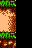

Something is wrong: 


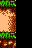

Something is wrong: 


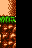

Something is wrong: 


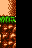

Something is wrong: 


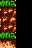

Something is wrong: 


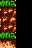

Something is wrong: 


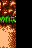

Something is wrong: 


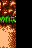

Something is wrong: 


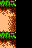

Something is wrong: 


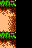

Something is wrong: 


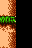

Something is wrong: 


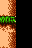

Something is wrong: 


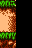

Something is wrong: 


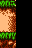

Something is wrong: 


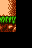

Something is wrong: 


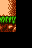

Something is wrong: 


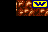

Something is wrong: 


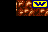

Something is wrong: 


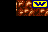

Something is wrong: 


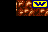

Something is wrong: 


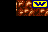

Something is wrong: 


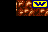

Something is wrong: 


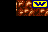

Something is wrong: 


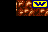

Something is wrong: 


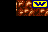

Something is wrong: 


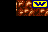

Something is wrong: 


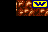

Something is wrong: 


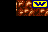

Something is wrong: 


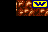

Something is wrong: 


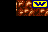

Something is wrong: 


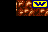

Something is wrong: 


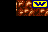

Something is wrong: 


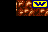

Something is wrong: 


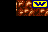

Something is wrong: 


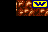

Something is wrong: 


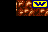

Something is wrong: 


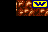

Something is wrong: 


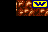

Something is wrong: 


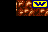

Something is wrong: 


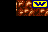

Something is wrong: 


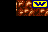

Something is wrong: 


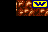

Something is wrong: 


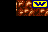

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_0_7
Something is wrong: 


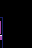

Something is wrong: 


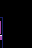

Something is wrong: 


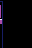

Something is wrong: 


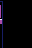

Something is wrong: 


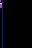

Something is wrong: 


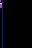

Something is wrong: 


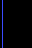

Something is wrong: 


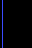

Something is wrong: 


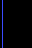

Something is wrong: 


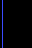

Something is wrong: 


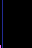

Something is wrong: 


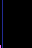

Something is wrong: 


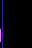

Something is wrong: 


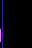

Something is wrong: 


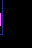

Something is wrong: 


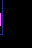

Something is wrong: 


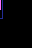

Something is wrong: 


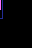

Something is wrong: 


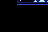

Something is wrong: 


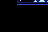

Something is wrong: 


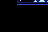

Something is wrong: 


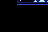

Something is wrong: 


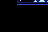

Something is wrong: 


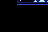

Something is wrong: 


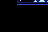

Something is wrong: 


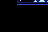

Something is wrong: 


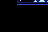

Something is wrong: 


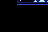

Something is wrong: 


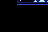

Something is wrong: 


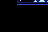

Something is wrong: 


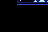

Something is wrong: 


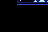

Something is wrong: 


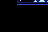

Something is wrong: 


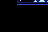

Something is wrong: 


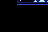

Something is wrong: 


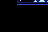

Something is wrong: 


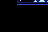

Something is wrong: 


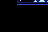

Something is wrong: 


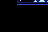

Something is wrong: 


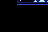

Something is wrong: 


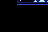

Something is wrong: 


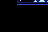

Something is wrong: 


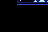

Something is wrong: 


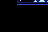

Something is wrong: 


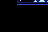

Something is wrong: 


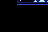

Something is wrong: 


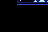

Something is wrong: 


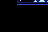

Something is wrong: 


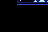

Something is wrong: 


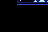

Something is wrong: 


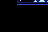

Something is wrong: 


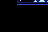

Something is wrong: 


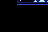

Something is wrong: 


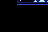

Something is wrong: 


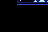

Something is wrong: 


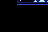

Something is wrong: 


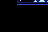

Something is wrong: 


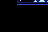

Something is wrong: 


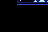

Something is wrong: 


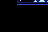

Something is wrong: 


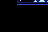

Something is wrong: 


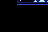

Something is wrong: 


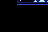

Something is wrong: 


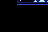

Something is wrong: 


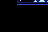

Something is wrong: 


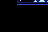

Something is wrong: 


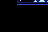

Something is wrong: 


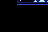

Something is wrong: 


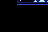

Something is wrong: 


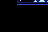

Something is wrong: 


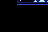

Something is wrong: 


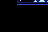

Something is wrong: 


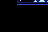

Something is wrong: 


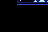

Something is wrong: 


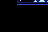

Something is wrong: 


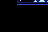

Something is wrong: 


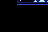

Something is wrong: 


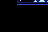

Something is wrong: 


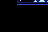

Something is wrong: 


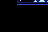

Something is wrong: 


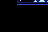

Something is wrong: 


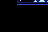

Something is wrong: 


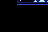

Something is wrong: 


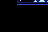

Something is wrong: 


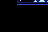

Something is wrong: 


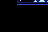

Something is wrong: 


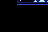

Something is wrong: 


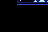

Something is wrong: 


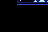

Something is wrong: 


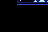

Something is wrong: 


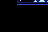

Something is wrong: 


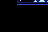

Something is wrong: 


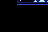

Something is wrong: 


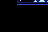

Something is wrong: 


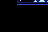

Something is wrong: 


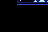

Something is wrong: 


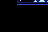

Something is wrong: 


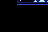

Something is wrong: 


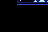

Something is wrong: 


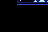

Something is wrong: 


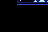

Something is wrong: 


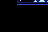

Something is wrong: 


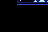

Something is wrong: 


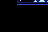

Something is wrong: 


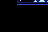

Something is wrong: 


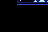

Something is wrong: 


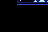

Something is wrong: 


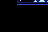

Something is wrong: 


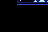

Something is wrong: 


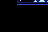

Something is wrong: 


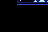

Something is wrong: 


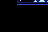

Something is wrong: 


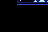

Something is wrong: 


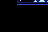

Something is wrong: 


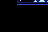

Something is wrong: 


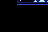

Something is wrong: 


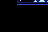

Something is wrong: 


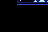

Something is wrong: 


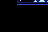

Something is wrong: 


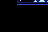

Something is wrong: 


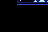

Something is wrong: 


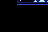

Something is wrong: 


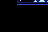

Something is wrong: 


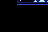

Something is wrong: 


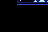

Something is wrong: 


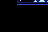

Something is wrong: 


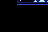

Something is wrong: 


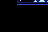

Something is wrong: 


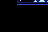

Something is wrong: 


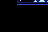

Something is wrong: 


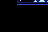

Something is wrong: 


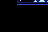

Something is wrong: 


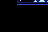

Something is wrong: 


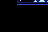

Something is wrong: 


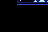

Something is wrong: 


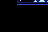

Something is wrong: 


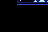

Something is wrong: 


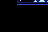

Something is wrong: 


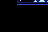

Something is wrong: 


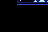

Something is wrong: 


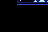

Something is wrong: 


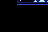

Something is wrong: 


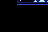

Something is wrong: 


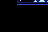

Something is wrong: 


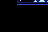

Something is wrong: 


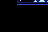

Something is wrong: 


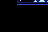

Something is wrong: 


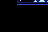

Something is wrong: 


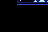

Something is wrong: 


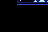

Something is wrong: 


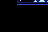

Something is wrong: 


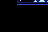

Something is wrong: 


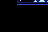

Something is wrong: 


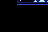

Something is wrong: 


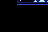

Something is wrong: 


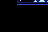

Something is wrong: 


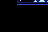

Something is wrong: 


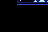

Something is wrong: 


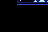

Something is wrong: 


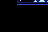

Something is wrong: 


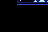

Something is wrong: 


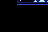

Something is wrong: 


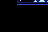

Something is wrong: 


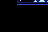

Something is wrong: 


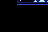

Something is wrong: 


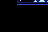

Something is wrong: 


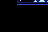

Something is wrong: 


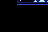

Something is wrong: 


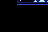

Something is wrong: 


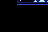

Something is wrong: 


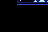

Something is wrong: 


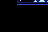

Something is wrong: 


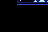

Something is wrong: 


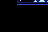

Something is wrong: 


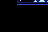

Something is wrong: 


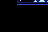

Something is wrong: 


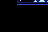

Something is wrong: 


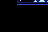

Something is wrong: 


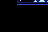

Something is wrong: 


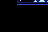

Something is wrong: 


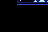

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_17
Something is wrong: 


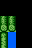

Something is wrong: 


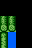

Something is wrong: 


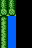

Something is wrong: 


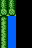

Something is wrong: 


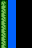

Something is wrong: 


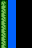

Something is wrong: 


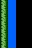

Something is wrong: 


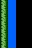

Something is wrong: 


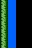

Something is wrong: 


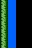

Something is wrong: 


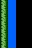

Something is wrong: 


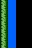

Something is wrong: 


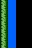

Something is wrong: 


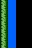

Something is wrong: 


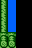

Something is wrong: 


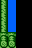

Something is wrong: 


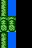

Something is wrong: 


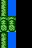

Something is wrong: 


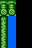

Something is wrong: 


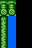

Something is wrong: 


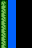

Something is wrong: 


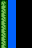

Something is wrong: 


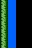

Something is wrong: 


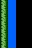

Something is wrong: 


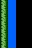

Something is wrong: 


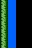

Something is wrong: 


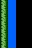

Something is wrong: 


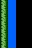

Something is wrong: 


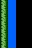

Something is wrong: 


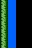

Something is wrong: 


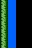

Something is wrong: 


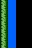

Something is wrong: 


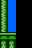

Something is wrong: 


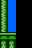

Something is wrong: 


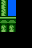

Something is wrong: 


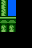

Something is wrong: 


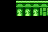

Something is wrong: 


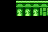

Something is wrong: 


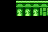

Something is wrong: 


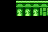

Something is wrong: 


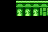

Something is wrong: 


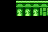

Something is wrong: 


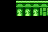

Something is wrong: 


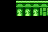

Something is wrong: 


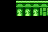

Something is wrong: 


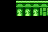

Something is wrong: 


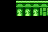

Something is wrong: 


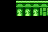

Something is wrong: 


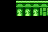

Something is wrong: 


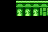

Something is wrong: 


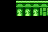

Something is wrong: 


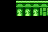

Something is wrong: 


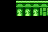

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_26
Something is wrong: 


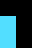

Something is wrong: 


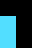

Something is wrong: 


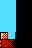

Something is wrong: 


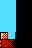

Something is wrong: 


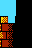

Something is wrong: 


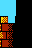

Something is wrong: 


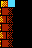

Something is wrong: 


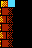

Something is wrong: 


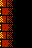

Something is wrong: 


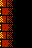

Something is wrong: 


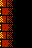

Something is wrong: 


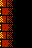

Something is wrong: 


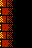

Something is wrong: 


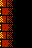

Something is wrong: 


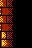

Something is wrong: 


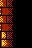

Something is wrong: 


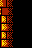

Something is wrong: 


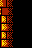

Something is wrong: 


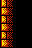

Something is wrong: 


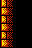

Something is wrong: 


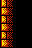

Something is wrong: 


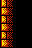

Something is wrong: 


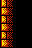

Something is wrong: 


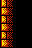

Something is wrong: 


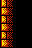

Something is wrong: 


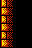

Something is wrong: 


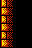

Something is wrong: 


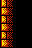

Something is wrong: 


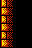

Something is wrong: 


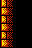

Something is wrong: 


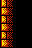

Something is wrong: 


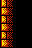

Something is wrong: 


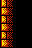

Something is wrong: 


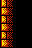

Something is wrong: 


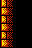

Something is wrong: 


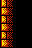

Something is wrong: 


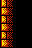

Something is wrong: 


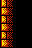

Something is wrong: 


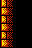

Something is wrong: 


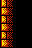

Something is wrong: 


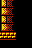

Something is wrong: 


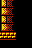

Something is wrong: 


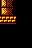

Something is wrong: 


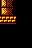

Something is wrong: 


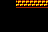

Something is wrong: 


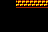

Something is wrong: 


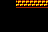

Something is wrong: 


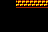

Something is wrong: 


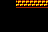

Something is wrong: 


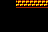

Something is wrong: 


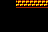

Something is wrong: 


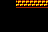

Something is wrong: 


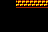

Something is wrong: 


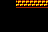

Something is wrong: 


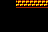

Something is wrong: 


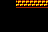

Something is wrong: 


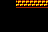

Something is wrong: 


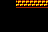

Something is wrong: 


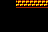

Something is wrong: 


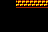

Something is wrong: 


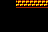

Something is wrong: 


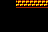

Something is wrong: 


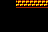

Something is wrong: 


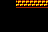

Something is wrong: 


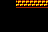

Something is wrong: 


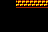

Something is wrong: 


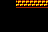

Something is wrong: 


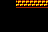

Something is wrong: 


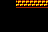

Something is wrong: 


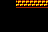

Something is wrong: 


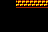

Something is wrong: 


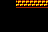

Something is wrong: 


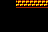

Something is wrong: 


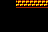

Something is wrong: 


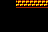

Something is wrong: 


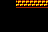

Something is wrong: 


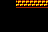

Something is wrong: 


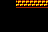

Something is wrong: 


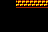

Something is wrong: 


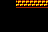

Something is wrong: 


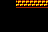

Something is wrong: 


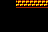

Something is wrong: 


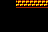

Something is wrong: 


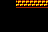

Something is wrong: 


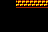

Something is wrong: 


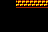

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_20
Something is wrong: 


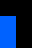

Something is wrong: 


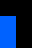

Something is wrong: 


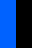

Something is wrong: 


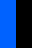

Something is wrong: 


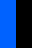

Something is wrong: 


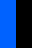

Something is wrong: 


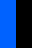

Something is wrong: 


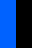

Something is wrong: 


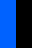

Something is wrong: 


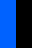

Something is wrong: 


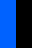

Something is wrong: 


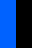

Something is wrong: 


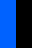

Something is wrong: 


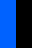

Something is wrong: 


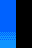

Something is wrong: 


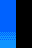

Something is wrong: 


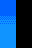

Something is wrong: 


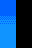

Something is wrong: 


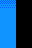

Something is wrong: 


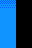

Something is wrong: 


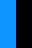

Something is wrong: 


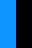

Something is wrong: 


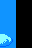

Something is wrong: 


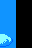

Something is wrong: 


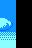

Something is wrong: 


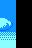

Something is wrong: 


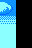

Something is wrong: 


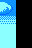

Something is wrong: 


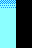

Something is wrong: 


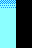

Something is wrong: 


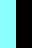

Something is wrong: 


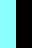

Something is wrong: 


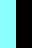

Something is wrong: 


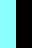

Something is wrong: 


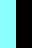

Something is wrong: 


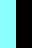

Something is wrong: 


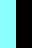

Something is wrong: 


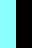

Something is wrong: 


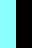

Something is wrong: 


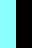

Something is wrong: 


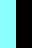

Something is wrong: 


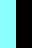

Something is wrong: 


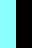

Something is wrong: 


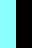

Something is wrong: 


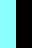

Something is wrong: 


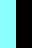

Something is wrong: 


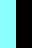

Something is wrong: 


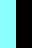

Something is wrong: 


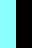

Something is wrong: 


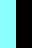

Something is wrong: 


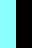

Something is wrong: 


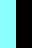

Something is wrong: 


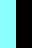

Something is wrong: 


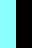

Something is wrong: 


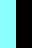

Something is wrong: 


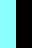

Something is wrong: 


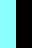

Something is wrong: 


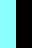

Something is wrong: 


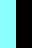

Something is wrong: 


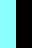

Something is wrong: 


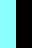

Something is wrong: 


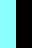

Something is wrong: 


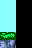

Something is wrong: 


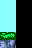

Something is wrong: 


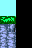

Something is wrong: 


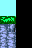

Something is wrong: 


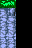

Something is wrong: 


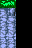

Something is wrong: 


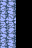

Something is wrong: 


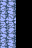

Something is wrong: 


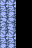

Something is wrong: 


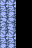

Something is wrong: 


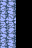

Something is wrong: 


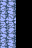

Something is wrong: 


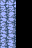

Something is wrong: 


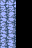

Something is wrong: 


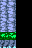

Something is wrong: 


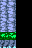

Something is wrong: 


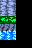

Something is wrong: 


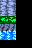

Something is wrong: 


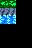

Something is wrong: 


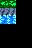

Something is wrong: 


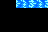

Something is wrong: 


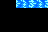

Something is wrong: 


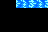

Something is wrong: 


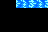

Something is wrong: 


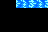

Something is wrong: 


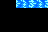

Something is wrong: 


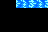

Something is wrong: 


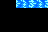

Something is wrong: 


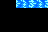

Something is wrong: 


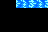

Something is wrong: 


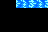

Something is wrong: 


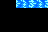

Something is wrong: 


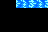

Something is wrong: 


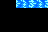

Something is wrong: 


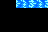

Something is wrong: 


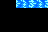

Something is wrong: 


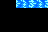

Something is wrong: 


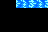

Something is wrong: 


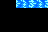

Something is wrong: 


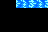

Something is wrong: 


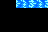

Something is wrong: 


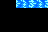

Something is wrong: 


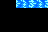

Something is wrong: 


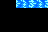

Something is wrong: 


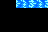

Something is wrong: 


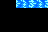

Something is wrong: 


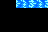

Something is wrong: 


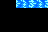

Something is wrong: 


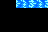

Something is wrong: 


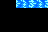

Something is wrong: 


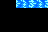

Something is wrong: 


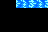

Something is wrong: 


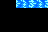

Something is wrong: 


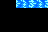

Something is wrong: 


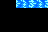

Something is wrong: 


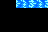

Something is wrong: 


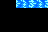

Something is wrong: 


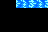

Something is wrong: 


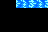

Something is wrong: 


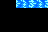

Something is wrong: 


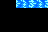

Something is wrong: 


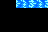

Something is wrong: 


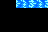

Something is wrong: 


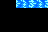

Something is wrong: 


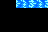

Something is wrong: 


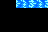

Something is wrong: 


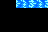

Something is wrong: 


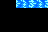

Something is wrong: 


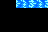

Something is wrong: 


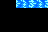

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_58
Something is wrong: 


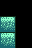

Something is wrong: 


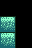

Something is wrong: 


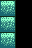

Something is wrong: 


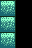

Something is wrong: 


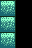

Something is wrong: 


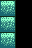

Something is wrong: 


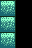

Something is wrong: 


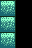

Something is wrong: 


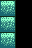

Something is wrong: 


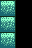

Something is wrong: 


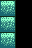

Something is wrong: 


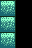

Something is wrong: 


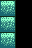

Something is wrong: 


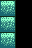

Something is wrong: 


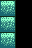

Something is wrong: 


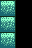

Something is wrong: 


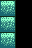

Something is wrong: 


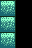

Something is wrong: 


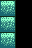

Something is wrong: 


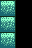

Something is wrong: 


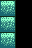

Something is wrong: 


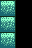

Something is wrong: 


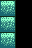

Something is wrong: 


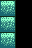

Something is wrong: 


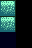

Something is wrong: 


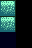

Something is wrong: 


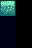

Something is wrong: 


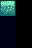

Something is wrong: 


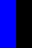

Something is wrong: 


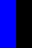

Something is wrong: 


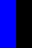

Something is wrong: 


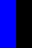

Something is wrong: 


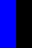

Something is wrong: 


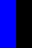

Something is wrong: 


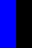

Something is wrong: 


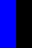

Something is wrong: 


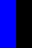

Something is wrong: 


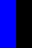

Something is wrong: 


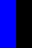

Something is wrong: 


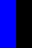

Something is wrong: 


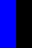

Something is wrong: 


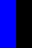

Something is wrong: 


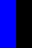

Something is wrong: 


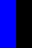

Something is wrong: 


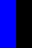

Something is wrong: 


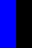

Something is wrong: 


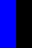

Something is wrong: 


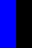

Something is wrong: 


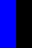

Something is wrong: 


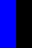

Something is wrong: 


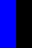

Something is wrong: 


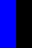

Something is wrong: 


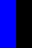

Something is wrong: 


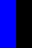

Something is wrong: 


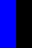

Something is wrong: 


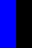

Something is wrong: 


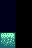

Something is wrong: 


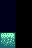

Something is wrong: 


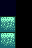

Something is wrong: 


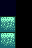

Something is wrong: 


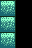

Something is wrong: 


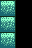

Something is wrong: 


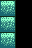

Something is wrong: 


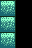

Something is wrong: 


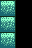

Something is wrong: 


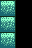

Something is wrong: 


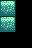

Something is wrong: 


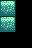

Something is wrong: 


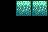

Something is wrong: 


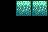

Something is wrong: 


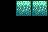

Something is wrong: 


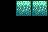

Something is wrong: 


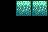

Something is wrong: 


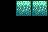

Something is wrong: 


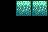

Something is wrong: 


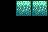

Something is wrong: 


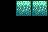

Something is wrong: 


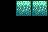

Something is wrong: 


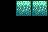

Something is wrong: 


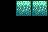

Something is wrong: 


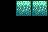

Something is wrong: 


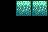

Something is wrong: 


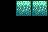

Something is wrong: 


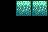

Something is wrong: 


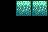

Something is wrong: 


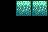

Something is wrong: 


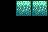

Something is wrong: 


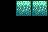

Something is wrong: 


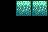

Something is wrong: 


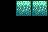

Something is wrong: 


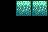

Something is wrong: 


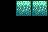

Something is wrong: 


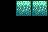

Something is wrong: 


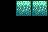

Something is wrong: 


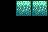

Something is wrong: 


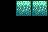

Something is wrong: 


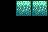

Something is wrong: 


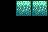

Something is wrong: 


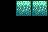

Something is wrong: 


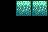

Something is wrong: 


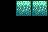

Something is wrong: 


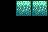

Something is wrong: 


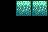

Something is wrong: 


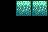

Something is wrong: 


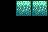

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_4
Something is wrong: 


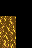

Something is wrong: 


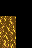

Something is wrong: 


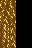

Something is wrong: 


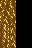

Something is wrong: 


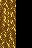

Something is wrong: 


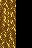

Something is wrong: 


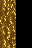

Something is wrong: 


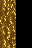

Something is wrong: 


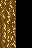

Something is wrong: 


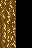

Something is wrong: 


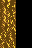

Something is wrong: 


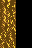

Something is wrong: 


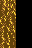

Something is wrong: 


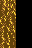

Something is wrong: 


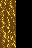

Something is wrong: 


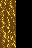

Something is wrong: 


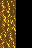

Something is wrong: 


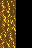

Something is wrong: 


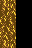

Something is wrong: 


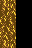

Something is wrong: 


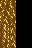

Something is wrong: 


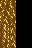

Something is wrong: 


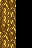

Something is wrong: 


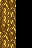

Something is wrong: 


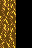

Something is wrong: 


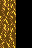

Something is wrong: 


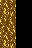

Something is wrong: 


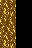

Something is wrong: 


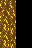

Something is wrong: 


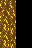

Something is wrong: 


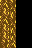

Something is wrong: 


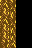

Something is wrong: 


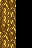

Something is wrong: 


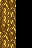

Something is wrong: 


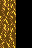

Something is wrong: 


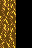

Something is wrong: 


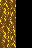

Something is wrong: 


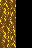

Something is wrong: 


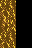

Something is wrong: 


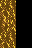

Something is wrong: 


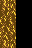

Something is wrong: 


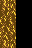

Something is wrong: 


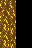

Something is wrong: 


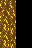

Something is wrong: 


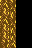

Something is wrong: 


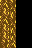

Something is wrong: 


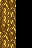

Something is wrong: 


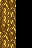

Something is wrong: 


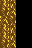

Something is wrong: 


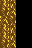

Something is wrong: 


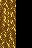

Something is wrong: 


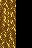

Something is wrong: 


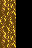

Something is wrong: 


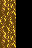

Something is wrong: 


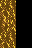

Something is wrong: 


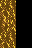

Something is wrong: 


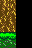

Something is wrong: 


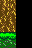

Something is wrong: 


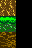

Something is wrong: 


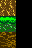

Something is wrong: 


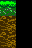

Something is wrong: 


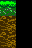

Something is wrong: 


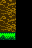

Something is wrong: 


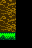

Something is wrong: 


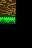

Something is wrong: 


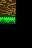

Something is wrong: 


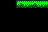

Something is wrong: 


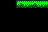

Something is wrong: 


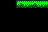

Something is wrong: 


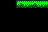

Something is wrong: 


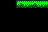

Something is wrong: 


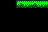

Something is wrong: 


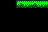

Something is wrong: 


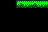

Something is wrong: 


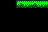

Something is wrong: 


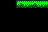

Something is wrong: 


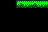

Something is wrong: 


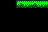

Something is wrong: 


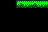

Something is wrong: 


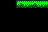

Something is wrong: 


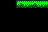

Something is wrong: 


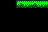

Something is wrong: 


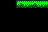

Something is wrong: 


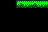

Something is wrong: 


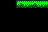

Something is wrong: 


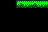

Something is wrong: 


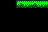

Something is wrong: 


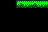

Something is wrong: 


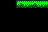

Something is wrong: 


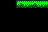

Something is wrong: 


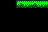

Something is wrong: 


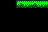

Something is wrong: 


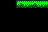

Something is wrong: 


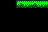

Something is wrong: 


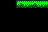

Something is wrong: 


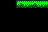

Something is wrong: 


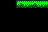

Something is wrong: 


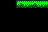

Something is wrong: 


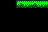

Something is wrong: 


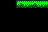

Something is wrong: 


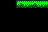

Something is wrong: 


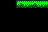

Something is wrong: 


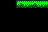

Something is wrong: 


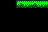

Something is wrong: 


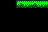

Something is wrong: 


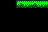

Something is wrong: 


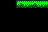

Something is wrong: 


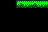

Something is wrong: 


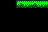

Something is wrong: 


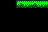

Something is wrong: 


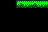

Something is wrong: 


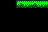

Something is wrong: 


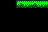

Something is wrong: 


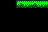

Something is wrong: 


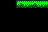

Something is wrong: 


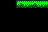

Something is wrong: 


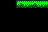

Something is wrong: 


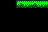

Something is wrong: 


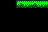

Something is wrong: 


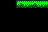

Something is wrong: 


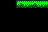

Something is wrong: 


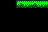

Something is wrong: 


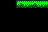

Something is wrong: 


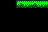

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_7
Something is wrong: 


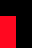

Something is wrong: 


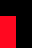

Something is wrong: 


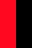

Something is wrong: 


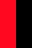

Something is wrong: 


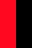

Something is wrong: 


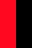

Something is wrong: 


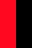

Something is wrong: 


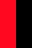

Something is wrong: 


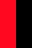

Something is wrong: 


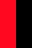

Something is wrong: 


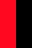

Something is wrong: 


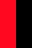

Something is wrong: 


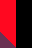

Something is wrong: 


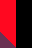

Something is wrong: 


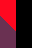

Something is wrong: 


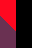

Something is wrong: 


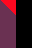

Something is wrong: 


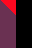

Something is wrong: 


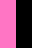

Something is wrong: 


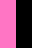

Something is wrong: 


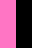

Something is wrong: 


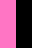

Something is wrong: 


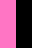

Something is wrong: 


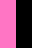

Something is wrong: 


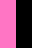

Something is wrong: 


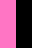

Something is wrong: 


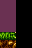

Something is wrong: 


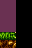

Something is wrong: 


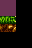

Something is wrong: 


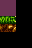

Something is wrong: 


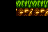

Something is wrong: 


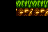

Something is wrong: 


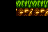

Something is wrong: 


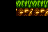

Something is wrong: 


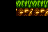

Something is wrong: 


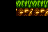

Something is wrong: 


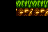

Something is wrong: 


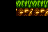

Something is wrong: 


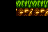

Something is wrong: 


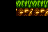

Something is wrong: 


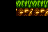

Something is wrong: 


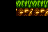

Something is wrong: 


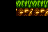

Something is wrong: 


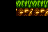

Something is wrong: 


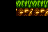

Something is wrong: 


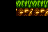

Something is wrong: 


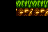

Something is wrong: 


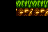

Something is wrong: 


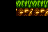

Something is wrong: 


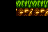

Something is wrong: 


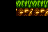

Something is wrong: 


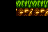

Something is wrong: 


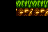

Something is wrong: 


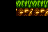

Something is wrong: 


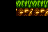

Something is wrong: 


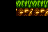

Something is wrong: 


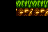

Something is wrong: 


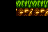

Something is wrong: 


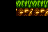

Something is wrong: 


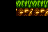

Something is wrong: 


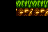

Something is wrong: 


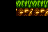

Something is wrong: 


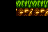

Something is wrong: 


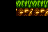

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_35
Something is wrong: 


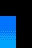

Something is wrong: 


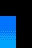

Something is wrong: 


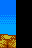

Something is wrong: 


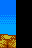

Something is wrong: 


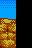

Something is wrong: 


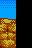

Something is wrong: 


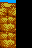

Something is wrong: 


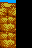

Something is wrong: 


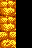

Something is wrong: 


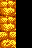

Something is wrong: 


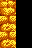

Something is wrong: 


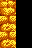

Something is wrong: 


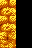

Something is wrong: 


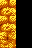

Something is wrong: 


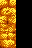

Something is wrong: 


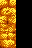

Something is wrong: 


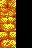

Something is wrong: 


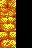

Something is wrong: 


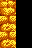

Something is wrong: 


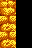

Something is wrong: 


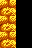

Something is wrong: 


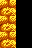

Something is wrong: 


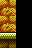

Something is wrong: 


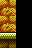

Something is wrong: 


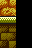

Something is wrong: 


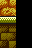

Something is wrong: 


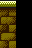

Something is wrong: 


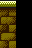

Something is wrong: 


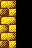

Something is wrong: 


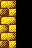

Something is wrong: 


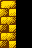

Something is wrong: 


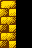

Something is wrong: 


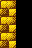

Something is wrong: 


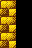

Something is wrong: 


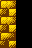

Something is wrong: 


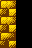

Something is wrong: 


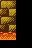

Something is wrong: 


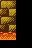

Something is wrong: 


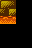

Something is wrong: 


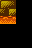

Something is wrong: 


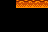

Something is wrong: 


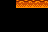

Something is wrong: 


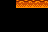

Something is wrong: 


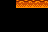

Something is wrong: 


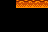

Something is wrong: 


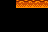

Something is wrong: 


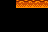

Something is wrong: 


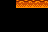

Something is wrong: 


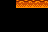

Something is wrong: 


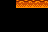

Something is wrong: 


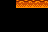

Something is wrong: 


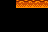

Something is wrong: 


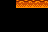

Something is wrong: 


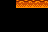

Something is wrong: 


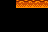

Something is wrong: 


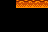

Something is wrong: 


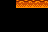

Something is wrong: 


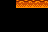

Something is wrong: 


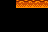

Something is wrong: 


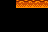

Something is wrong: 


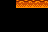

Something is wrong: 


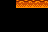

Something is wrong: 


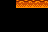

Something is wrong: 


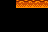

Something is wrong: 


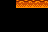

Something is wrong: 


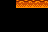

Something is wrong: 


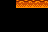

Something is wrong: 


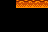

Something is wrong: 


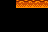

Something is wrong: 


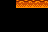

Something is wrong: 


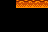

Something is wrong: 


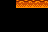

Something is wrong: 


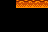

Something is wrong: 


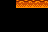

Something is wrong: 


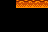

Something is wrong: 


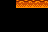

Something is wrong: 


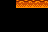

Something is wrong: 


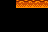

Something is wrong: 


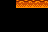

Something is wrong: 


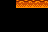

Something is wrong: 


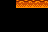

Something is wrong: 


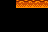

Something is wrong: 


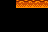

Something is wrong: 


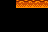

Something is wrong: 


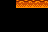

Something is wrong: 


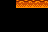

Something is wrong: 


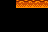

Something is wrong: 


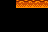

Something is wrong: 


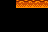

Something is wrong: 


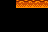

Something is wrong: 


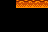

Something is wrong: 


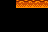

Something is wrong: 


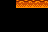

Something is wrong: 


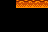

Something is wrong: 


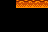

Something is wrong: 


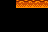

Something is wrong: 


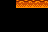

Something is wrong: 


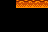

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_17
Something is wrong: 


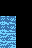

Something is wrong: 


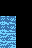

Something is wrong: 


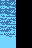

Something is wrong: 


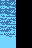

Something is wrong: 


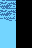

Something is wrong: 


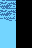

Something is wrong: 


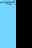

Something is wrong: 


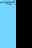

Something is wrong: 


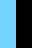

Something is wrong: 


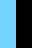

Something is wrong: 


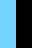

Something is wrong: 


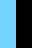

Something is wrong: 


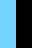

Something is wrong: 


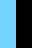

Something is wrong: 


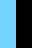

Something is wrong: 


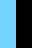

Something is wrong: 


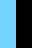

Something is wrong: 


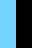

Something is wrong: 


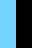

Something is wrong: 


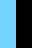

Something is wrong: 


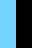

Something is wrong: 


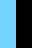

Something is wrong: 


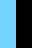

Something is wrong: 


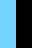

Something is wrong: 


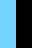

Something is wrong: 


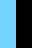

Something is wrong: 


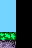

Something is wrong: 


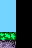

Something is wrong: 


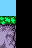

Something is wrong: 


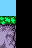

Something is wrong: 


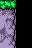

Something is wrong: 


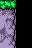

Something is wrong: 


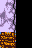

Something is wrong: 


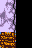

Something is wrong: 


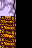

Something is wrong: 


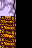

Something is wrong: 


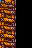

Something is wrong: 


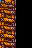

Something is wrong: 


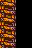

Something is wrong: 


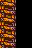

Something is wrong: 


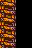

Something is wrong: 


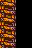

Something is wrong: 


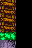

Something is wrong: 


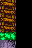

Something is wrong: 


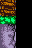

Something is wrong: 


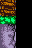

Something is wrong: 


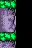

Something is wrong: 


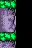

Something is wrong: 


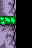

Something is wrong: 


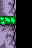

Something is wrong: 


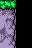

Something is wrong: 


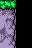

Something is wrong: 


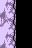

Something is wrong: 


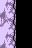

Something is wrong: 


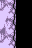

Something is wrong: 


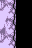

Something is wrong: 


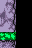

Something is wrong: 


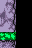

Something is wrong: 


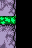

Something is wrong: 


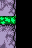

Something is wrong: 


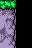

Something is wrong: 


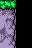

Something is wrong: 


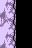

Something is wrong: 


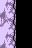

Something is wrong: 


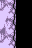

Something is wrong: 


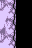

Something is wrong: 


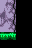

Something is wrong: 


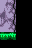

Something is wrong: 


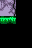

Something is wrong: 


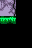

Something is wrong: 


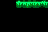

Something is wrong: 


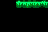

Something is wrong: 


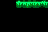

Something is wrong: 


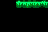

Something is wrong: 


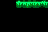

Something is wrong: 


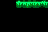

Something is wrong: 


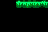

Something is wrong: 


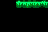

Something is wrong: 


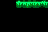

Something is wrong: 


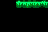

Something is wrong: 


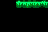

Something is wrong: 


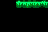

Something is wrong: 


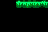

Something is wrong: 


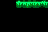

Something is wrong: 


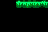

Something is wrong: 


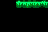

Something is wrong: 


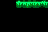

Something is wrong: 


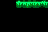

Something is wrong: 


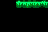

Something is wrong: 


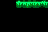

Something is wrong: 


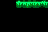

Something is wrong: 


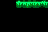

Something is wrong: 


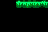

Something is wrong: 


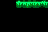

Something is wrong: 


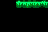

Something is wrong: 


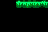

Something is wrong: 


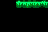

Something is wrong: 


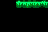

Something is wrong: 


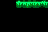

Something is wrong: 


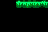

Something is wrong: 


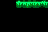

Something is wrong: 


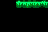

Something is wrong: 


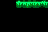

Something is wrong: 


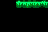

Something is wrong: 


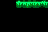

Something is wrong: 


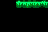

Something is wrong: 


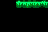

Something is wrong: 


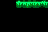

Something is wrong: 


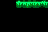

Something is wrong: 


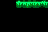

Something is wrong: 


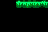

Something is wrong: 


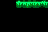

Something is wrong: 


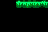

Something is wrong: 


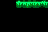

Something is wrong: 


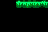

Something is wrong: 


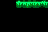

Something is wrong: 


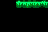

Something is wrong: 


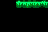

Something is wrong: 


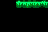

Something is wrong: 


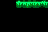

Something is wrong: 


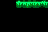

Something is wrong: 


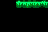

Something is wrong: 


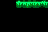

Something is wrong: 


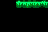

Something is wrong: 


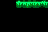

Something is wrong: 


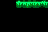

Something is wrong: 


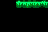

Something is wrong: 


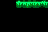

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_0_2
Something is wrong: 


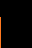

Something is wrong: 


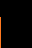

Something is wrong: 


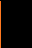

Something is wrong: 


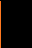

Something is wrong: 


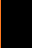

Something is wrong: 


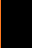

Something is wrong: 


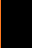

Something is wrong: 


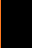

Something is wrong: 


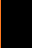

Something is wrong: 


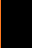

Something is wrong: 


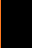

Something is wrong: 


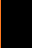

Something is wrong: 


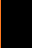

Something is wrong: 


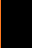

Something is wrong: 


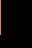

Something is wrong: 


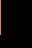

Something is wrong: 


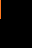

Something is wrong: 


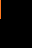

Something is wrong: 


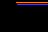

Something is wrong: 


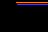

Something is wrong: 


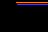

Something is wrong: 


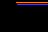

Something is wrong: 


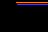

Something is wrong: 


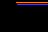

Something is wrong: 


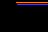

Something is wrong: 


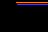

Something is wrong: 


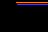

Something is wrong: 


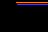

Something is wrong: 


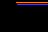

Something is wrong: 


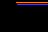

Something is wrong: 


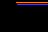

Something is wrong: 


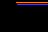

Something is wrong: 


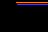

Something is wrong: 


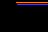

Something is wrong: 


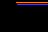

Something is wrong: 


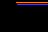

Something is wrong: 


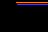

Something is wrong: 


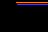

Something is wrong: 


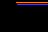

Something is wrong: 


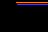

Something is wrong: 


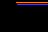

Something is wrong: 


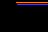

Something is wrong: 


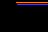

Something is wrong: 


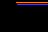

Something is wrong: 


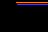

Something is wrong: 


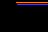

Something is wrong: 


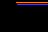

Something is wrong: 


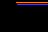

Something is wrong: 


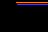

Something is wrong: 


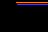

Something is wrong: 


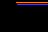

Something is wrong: 


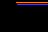

Something is wrong: 


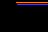

Something is wrong: 


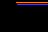

Something is wrong: 


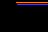

Something is wrong: 


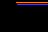

Something is wrong: 


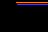

Something is wrong: 


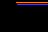

Something is wrong: 


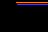

Something is wrong: 


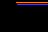

Something is wrong: 


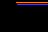

Something is wrong: 


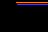

Something is wrong: 


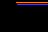

Something is wrong: 


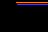

Something is wrong: 


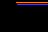

Something is wrong: 


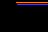

Something is wrong: 


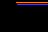

Something is wrong: 


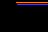

Something is wrong: 


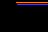

Something is wrong: 


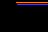

Something is wrong: 


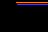

Something is wrong: 


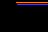

Something is wrong: 


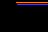

Something is wrong: 


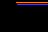

Something is wrong: 


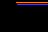

Something is wrong: 


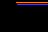

Something is wrong: 


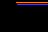

Something is wrong: 


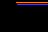

Something is wrong: 


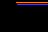

Something is wrong: 


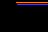

Something is wrong: 


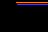

Something is wrong: 


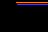

Something is wrong: 


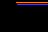

Something is wrong: 


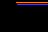

Something is wrong: 


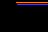

Something is wrong: 


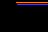

Something is wrong: 


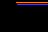

Something is wrong: 


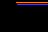

Something is wrong: 


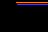

Something is wrong: 


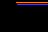

Something is wrong: 


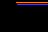

Something is wrong: 


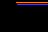

Something is wrong: 


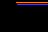

Something is wrong: 


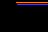

Something is wrong: 


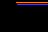

Something is wrong: 


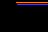

Something is wrong: 


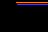

Something is wrong: 


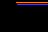

Something is wrong: 


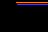

Something is wrong: 


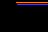

Something is wrong: 


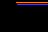

Something is wrong: 


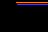

Something is wrong: 


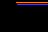

Something is wrong: 


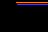

Something is wrong: 


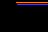

Something is wrong: 


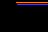

Something is wrong: 


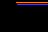

Something is wrong: 


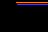

Something is wrong: 


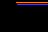

Something is wrong: 


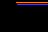

Something is wrong: 


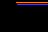

Something is wrong: 


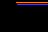

Something is wrong: 


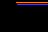

Something is wrong: 


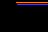

Something is wrong: 


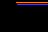

Something is wrong: 


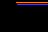

Something is wrong: 


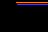

Something is wrong: 


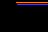

Something is wrong: 


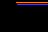

Something is wrong: 


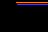

Something is wrong: 


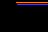

Something is wrong: 


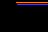

Something is wrong: 


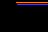

Something is wrong: 


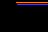

Something is wrong: 


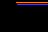

Something is wrong: 


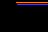

Something is wrong: 


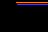

Something is wrong: 


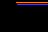

Something is wrong: 


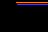

Something is wrong: 


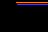

Something is wrong: 


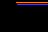

Something is wrong: 


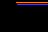

Something is wrong: 


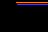

Something is wrong: 


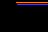

Something is wrong: 


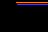

Something is wrong: 


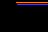

Something is wrong: 


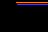

Something is wrong: 


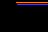

Something is wrong: 


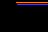

Something is wrong: 


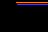

Something is wrong: 


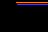

Something is wrong: 


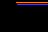

Something is wrong: 


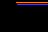

Something is wrong: 


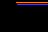

Something is wrong: 


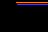

Something is wrong: 


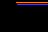

Something is wrong: 


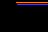

Something is wrong: 


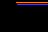

Something is wrong: 


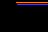

Something is wrong: 


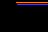

Something is wrong: 


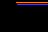

Something is wrong: 


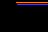

Something is wrong: 


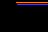

Something is wrong: 


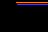

Something is wrong: 


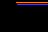

Something is wrong: 


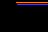

Something is wrong: 


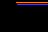

Something is wrong: 


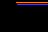

Something is wrong: 


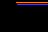

Something is wrong: 


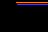

Something is wrong: 


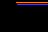

Something is wrong: 


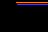

Something is wrong: 


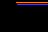

Something is wrong: 


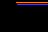

Something is wrong: 


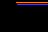

Something is wrong: 


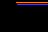

Something is wrong: 


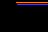

Something is wrong: 


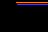

Something is wrong: 


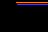

Something is wrong: 


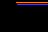

Something is wrong: 


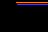

Something is wrong: 


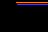

Something is wrong: 


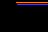

Something is wrong: 


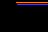

Something is wrong: 


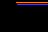

Something is wrong: 


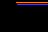

Something is wrong: 


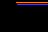

Something is wrong: 


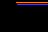

Something is wrong: 


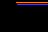

Something is wrong: 


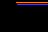

Something is wrong: 


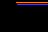

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_29
Something is wrong: 


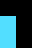

Something is wrong: 


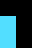

Something is wrong: 


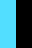

Something is wrong: 


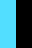

Something is wrong: 


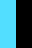

Something is wrong: 


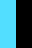

Something is wrong: 


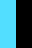

Something is wrong: 


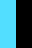

Something is wrong: 


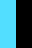

Something is wrong: 


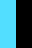

Something is wrong: 


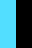

Something is wrong: 


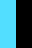

Something is wrong: 


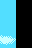

Something is wrong: 


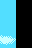

Something is wrong: 


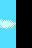

Something is wrong: 


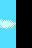

Something is wrong: 


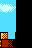

Something is wrong: 


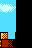

Something is wrong: 


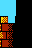

Something is wrong: 


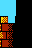

Something is wrong: 


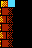

Something is wrong: 


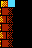

Something is wrong: 


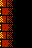

Something is wrong: 


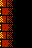

Something is wrong: 


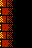

Something is wrong: 


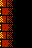

Something is wrong: 


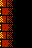

Something is wrong: 


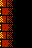

Something is wrong: 


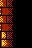

Something is wrong: 


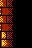

Something is wrong: 


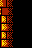

Something is wrong: 


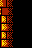

Something is wrong: 


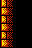

Something is wrong: 


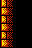

Something is wrong: 


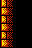

Something is wrong: 


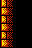

Something is wrong: 


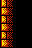

Something is wrong: 


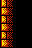

Something is wrong: 


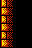

Something is wrong: 


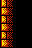

Something is wrong: 


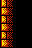

Something is wrong: 


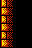

Something is wrong: 


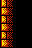

Something is wrong: 


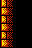

Something is wrong: 


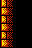

Something is wrong: 


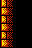

Something is wrong: 


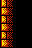

Something is wrong: 


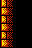

Something is wrong: 


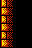

Something is wrong: 


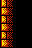

Something is wrong: 


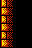

Something is wrong: 


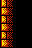

Something is wrong: 


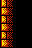

Something is wrong: 


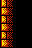

Something is wrong: 


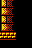

Something is wrong: 


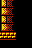

Something is wrong: 


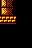

Something is wrong: 


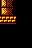

Something is wrong: 


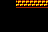

Something is wrong: 


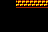

Something is wrong: 


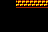

Something is wrong: 


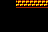

Something is wrong: 


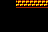

Something is wrong: 


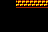

Something is wrong: 


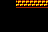

Something is wrong: 


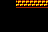

Something is wrong: 


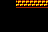

Something is wrong: 


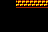

Something is wrong: 


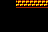

Something is wrong: 


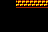

Something is wrong: 


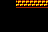

Something is wrong: 


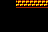

Something is wrong: 


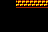

Something is wrong: 


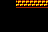

Something is wrong: 


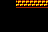

Something is wrong: 


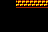

Something is wrong: 


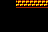

Something is wrong: 


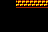

Something is wrong: 


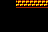

Something is wrong: 


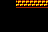

Something is wrong: 


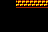

Something is wrong: 


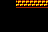

Something is wrong: 


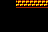

Something is wrong: 


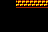

Something is wrong: 


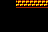

Something is wrong: 


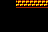

Something is wrong: 


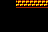

Something is wrong: 


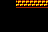

Something is wrong: 


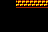

Something is wrong: 


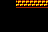

Something is wrong: 


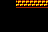

Something is wrong: 


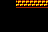

Something is wrong: 


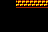

Something is wrong: 


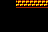

Something is wrong: 


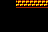

Something is wrong: 


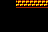

Something is wrong: 


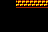

Something is wrong: 


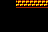

Something is wrong: 


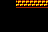

Something is wrong: 


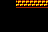

Something is wrong: 


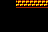

Something is wrong: 


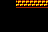

Something is wrong: 


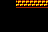

Something is wrong: 


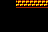

Something is wrong: 


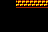

Something is wrong: 


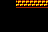

Something is wrong: 


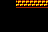

Something is wrong: 


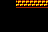

Something is wrong: 


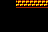

Something is wrong: 


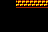

Something is wrong: 


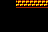

Something is wrong: 


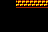

Something is wrong: 


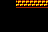

Something is wrong: 


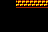

Something is wrong: 


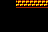

Something is wrong: 


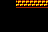

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_21
Something is wrong: 


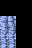

Something is wrong: 


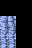

Something is wrong: 


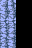

Something is wrong: 


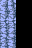

Something is wrong: 


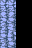

Something is wrong: 


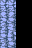

Something is wrong: 


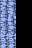

Something is wrong: 


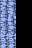

Something is wrong: 


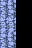

Something is wrong: 


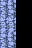

Something is wrong: 


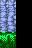

Something is wrong: 


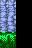

Something is wrong: 


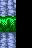

Something is wrong: 


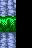

Something is wrong: 


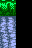

Something is wrong: 


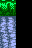

Something is wrong: 


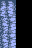

Something is wrong: 


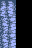

Something is wrong: 


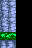

Something is wrong: 


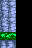

Something is wrong: 


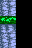

Something is wrong: 


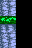

Something is wrong: 


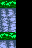

Something is wrong: 


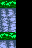

Something is wrong: 


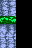

Something is wrong: 


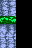

Something is wrong: 


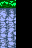

Something is wrong: 


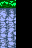

Something is wrong: 


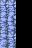

Something is wrong: 


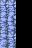

Something is wrong: 


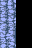

Something is wrong: 


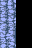

Something is wrong: 


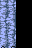

Something is wrong: 


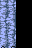

Something is wrong: 


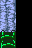

Something is wrong: 


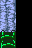

Something is wrong: 


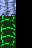

Something is wrong: 


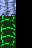

Something is wrong: 


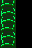

Something is wrong: 


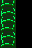

Something is wrong: 


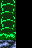

Something is wrong: 


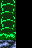

Something is wrong: 


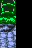

Something is wrong: 


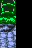

Something is wrong: 


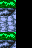

Something is wrong: 


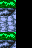

Something is wrong: 


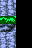

Something is wrong: 


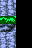

Something is wrong: 


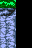

Something is wrong: 


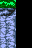

Something is wrong: 


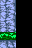

Something is wrong: 


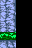

Something is wrong: 


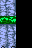

Something is wrong: 


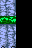

Something is wrong: 


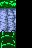

Something is wrong: 


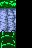

Something is wrong: 


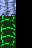

Something is wrong: 


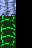

Something is wrong: 


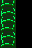

Something is wrong: 


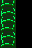

Something is wrong: 


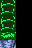

Something is wrong: 


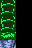

Something is wrong: 


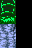

Something is wrong: 


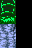

Something is wrong: 


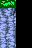

Something is wrong: 


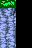

Something is wrong: 


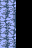

Something is wrong: 


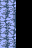

Something is wrong: 


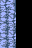

Something is wrong: 


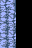

Something is wrong: 


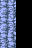

Something is wrong: 


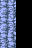

Something is wrong: 


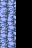

Something is wrong: 


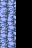

Something is wrong: 


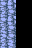

Something is wrong: 


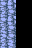

Something is wrong: 


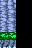

Something is wrong: 


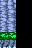

Something is wrong: 


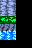

Something is wrong: 


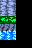

Something is wrong: 


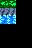

Something is wrong: 


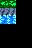

Something is wrong: 


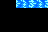

Something is wrong: 


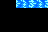

Something is wrong: 


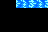

Something is wrong: 


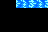

Something is wrong: 


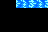

Something is wrong: 


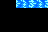

Something is wrong: 


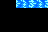

Something is wrong: 


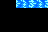

Something is wrong: 


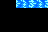

Something is wrong: 


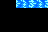

Something is wrong: 


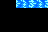

Something is wrong: 


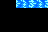

Something is wrong: 


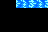

Something is wrong: 


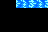

Something is wrong: 


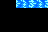

Something is wrong: 


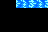

Something is wrong: 


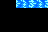

Something is wrong: 


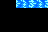

Something is wrong: 


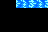

Something is wrong: 


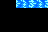

Something is wrong: 


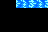

Something is wrong: 


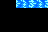

Something is wrong: 


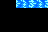

Something is wrong: 


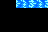

Something is wrong: 


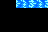

Something is wrong: 


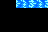

Something is wrong: 


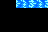

Something is wrong: 


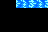

Something is wrong: 


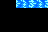

Something is wrong: 


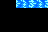

Something is wrong: 


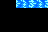

Something is wrong: 


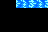

Something is wrong: 


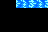

Something is wrong: 


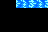

Something is wrong: 


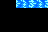

Something is wrong: 


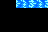

Something is wrong: 


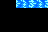

Something is wrong: 


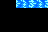

Something is wrong: 


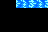

Something is wrong: 


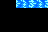

Something is wrong: 


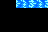

Something is wrong: 


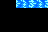

Something is wrong: 


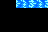

Something is wrong: 


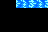

Something is wrong: 


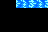

Something is wrong: 


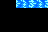

Something is wrong: 


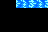

Something is wrong: 


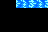

Something is wrong: 


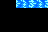

Something is wrong: 


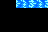

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_31
Something is wrong: 


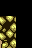

Something is wrong: 


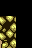

Something is wrong: 


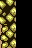

Something is wrong: 


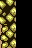

Something is wrong: 


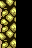

Something is wrong: 


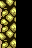

Something is wrong: 


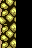

Something is wrong: 


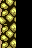

Something is wrong: 


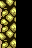

Something is wrong: 


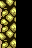

Something is wrong: 


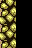

Something is wrong: 


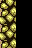

Something is wrong: 


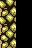

Something is wrong: 


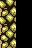

Something is wrong: 


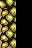

Something is wrong: 


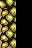

Something is wrong: 


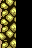

Something is wrong: 


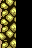

Something is wrong: 


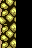

Something is wrong: 


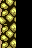

Something is wrong: 


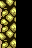

Something is wrong: 


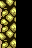

Something is wrong: 


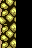

Something is wrong: 


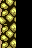

Something is wrong: 


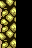

Something is wrong: 


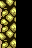

Something is wrong: 


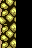

Something is wrong: 


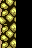

Something is wrong: 


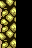

Something is wrong: 


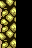

Something is wrong: 


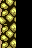

Something is wrong: 


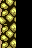

Something is wrong: 


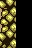

Something is wrong: 


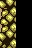

Something is wrong: 


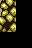

Something is wrong: 


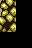

Something is wrong: 


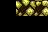

Something is wrong: 


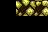

Something is wrong: 


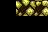

Something is wrong: 


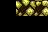

Something is wrong: 


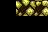

Something is wrong: 


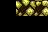

Something is wrong: 


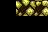

Something is wrong: 


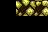

Something is wrong: 


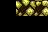

Something is wrong: 


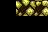

Something is wrong: 


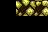

Something is wrong: 


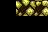

Something is wrong: 


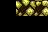

Something is wrong: 


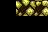

Something is wrong: 


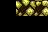

Something is wrong: 


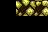

Something is wrong: 


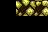

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_10
Something is wrong: 


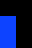

Something is wrong: 


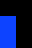

Something is wrong: 


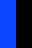

Something is wrong: 


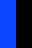

Something is wrong: 


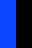

Something is wrong: 


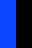

Something is wrong: 


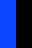

Something is wrong: 


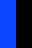

Something is wrong: 


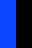

Something is wrong: 


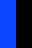

Something is wrong: 


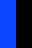

Something is wrong: 


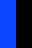

Something is wrong: 


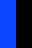

Something is wrong: 


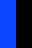

Something is wrong: 


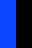

Something is wrong: 


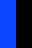

Something is wrong: 


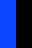

Something is wrong: 


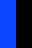

Something is wrong: 


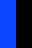

Something is wrong: 


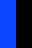

Something is wrong: 


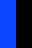

Something is wrong: 


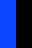

Something is wrong: 


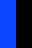

Something is wrong: 


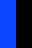

Something is wrong: 


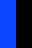

Something is wrong: 


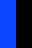

Something is wrong: 


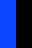

Something is wrong: 


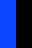

Something is wrong: 


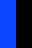

Something is wrong: 


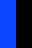

Something is wrong: 


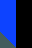

Something is wrong: 


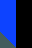

Something is wrong: 


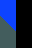

Something is wrong: 


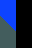

Something is wrong: 


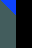

Something is wrong: 


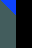

Something is wrong: 


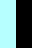

Something is wrong: 


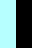

Something is wrong: 


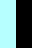

Something is wrong: 


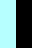

Something is wrong: 


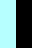

Something is wrong: 


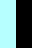

Something is wrong: 


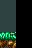

Something is wrong: 


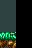

Something is wrong: 


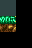

Something is wrong: 


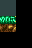

Something is wrong: 


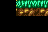

Something is wrong: 


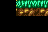

Something is wrong: 


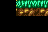

Something is wrong: 


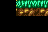

Something is wrong: 


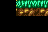

Something is wrong: 


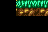

Something is wrong: 


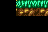

Something is wrong: 


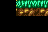

Something is wrong: 


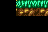

Something is wrong: 


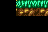

Something is wrong: 


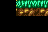

Something is wrong: 


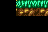

Something is wrong: 


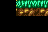

Something is wrong: 


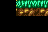

Something is wrong: 


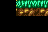

Something is wrong: 


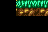

Something is wrong: 


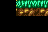

Something is wrong: 


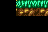

Something is wrong: 


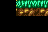

Something is wrong: 


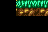

Something is wrong: 


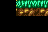

Something is wrong: 


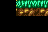

Something is wrong: 


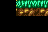

Something is wrong: 


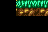

Something is wrong: 


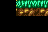

Something is wrong: 


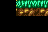

Something is wrong: 


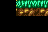

Something is wrong: 


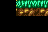

Something is wrong: 


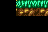

Something is wrong: 


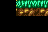

Something is wrong: 


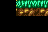

Something is wrong: 


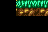

Something is wrong: 


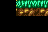

Something is wrong: 


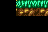

Something is wrong: 


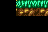

Something is wrong: 


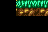

Something is wrong: 


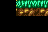

Something is wrong: 


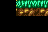

Something is wrong: 


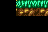

Something is wrong: 


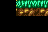

Something is wrong: 


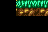

Something is wrong: 


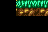

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_6
Something is wrong: 


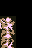

Something is wrong: 


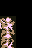

Something is wrong: 


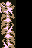

Something is wrong: 


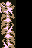

Something is wrong: 


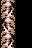

Something is wrong: 


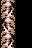

Something is wrong: 


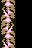

Something is wrong: 


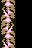

Something is wrong: 


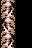

Something is wrong: 


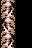

Something is wrong: 


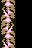

Something is wrong: 


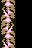

Something is wrong: 


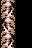

Something is wrong: 


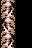

Something is wrong: 


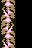

Something is wrong: 


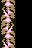

Something is wrong: 


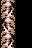

Something is wrong: 


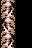

Something is wrong: 


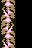

Something is wrong: 


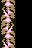

Something is wrong: 


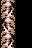

Something is wrong: 


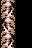

Something is wrong: 


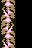

Something is wrong: 


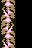

Something is wrong: 


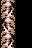

Something is wrong: 


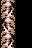

Something is wrong: 


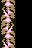

Something is wrong: 


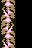

Something is wrong: 


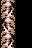

Something is wrong: 


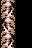

Something is wrong: 


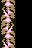

Something is wrong: 


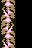

Something is wrong: 


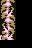

Something is wrong: 


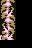

Something is wrong: 


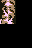

Something is wrong: 


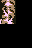

Something is wrong: 


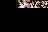

Something is wrong: 


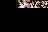

Something is wrong: 


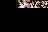

Something is wrong: 


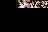

Something is wrong: 


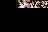

Something is wrong: 


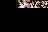

Something is wrong: 


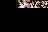

Something is wrong: 


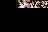

Something is wrong: 


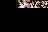

Something is wrong: 


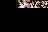

Something is wrong: 


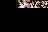

Something is wrong: 


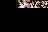

Something is wrong: 


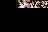

Something is wrong: 


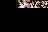

Something is wrong: 


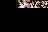

Something is wrong: 


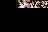

Something is wrong: 


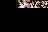

Something is wrong: 


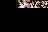

Something is wrong: 


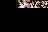

Something is wrong: 


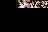

Something is wrong: 


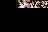

Something is wrong: 


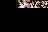

Something is wrong: 


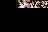

Something is wrong: 


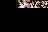

Something is wrong: 


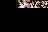

Something is wrong: 


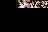

Something is wrong: 


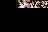

Something is wrong: 


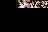

Something is wrong: 


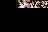

Something is wrong: 


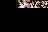

Something is wrong: 


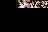

Something is wrong: 


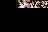

Something is wrong: 


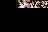

Something is wrong: 


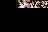

Something is wrong: 


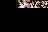

Something is wrong: 


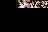

Something is wrong: 


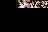

Something is wrong: 


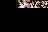

Something is wrong: 


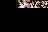

Something is wrong: 


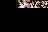

Something is wrong: 


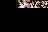

Something is wrong: 


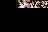

Something is wrong: 


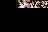

Something is wrong: 


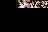

Something is wrong: 


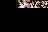

Something is wrong: 


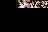

Something is wrong: 


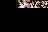

Something is wrong: 


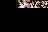

Something is wrong: 


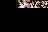

Something is wrong: 


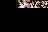

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_25
Something is wrong: 


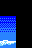

Something is wrong: 


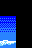

Something is wrong: 


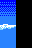

Something is wrong: 


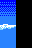

Something is wrong: 


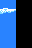

Something is wrong: 


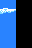

Something is wrong: 


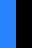

Something is wrong: 


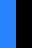

Something is wrong: 


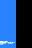

Something is wrong: 


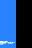

Something is wrong: 


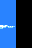

Something is wrong: 


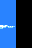

Something is wrong: 


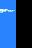

Something is wrong: 


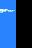

Something is wrong: 


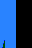

Something is wrong: 


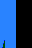

Something is wrong: 


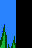

Something is wrong: 


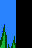

Something is wrong: 


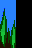

Something is wrong: 


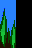

Something is wrong: 


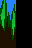

Something is wrong: 


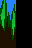

Something is wrong: 


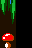

Something is wrong: 


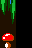

Something is wrong: 


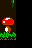

Something is wrong: 


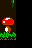

Something is wrong: 


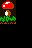

Something is wrong: 


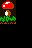

Something is wrong: 


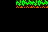

Something is wrong: 


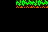

Something is wrong: 


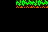

Something is wrong: 


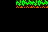

Something is wrong: 


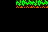

Something is wrong: 


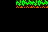

Something is wrong: 


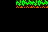

Something is wrong: 


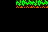

Something is wrong: 


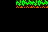

Something is wrong: 


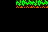

Something is wrong: 


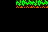

Something is wrong: 


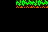

Something is wrong: 


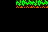

Something is wrong: 


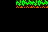

Something is wrong: 


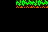

Something is wrong: 


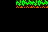

Something is wrong: 


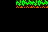

Something is wrong: 


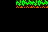

Something is wrong: 


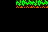

Something is wrong: 


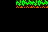

Something is wrong: 


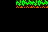

Something is wrong: 


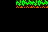

Something is wrong: 


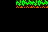

Something is wrong: 


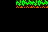

Something is wrong: 


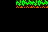

Something is wrong: 


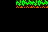

Something is wrong: 


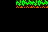

Something is wrong: 


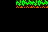

Something is wrong: 


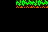

Something is wrong: 


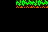

Something is wrong: 


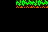

Something is wrong: 


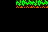

Something is wrong: 


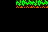

Something is wrong: 


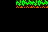

Something is wrong: 


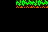

Something is wrong: 


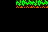

Something is wrong: 


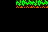

Something is wrong: 


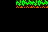

Something is wrong: 


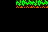

Something is wrong: 


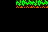

Something is wrong: 


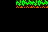

Something is wrong: 


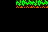

Something is wrong: 


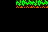

Something is wrong: 


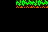

Something is wrong: 


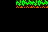

Something is wrong: 


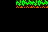

Something is wrong: 


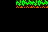

Something is wrong: 


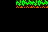

Something is wrong: 


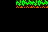

Something is wrong: 


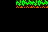

Something is wrong: 


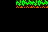

Something is wrong: 


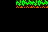

Something is wrong: 


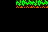

Something is wrong: 


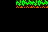

Something is wrong: 


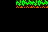

Something is wrong: 


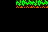

Something is wrong: 


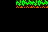

Something is wrong: 


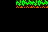

Something is wrong: 


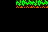

Something is wrong: 


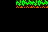

Something is wrong: 


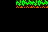

Something is wrong: 


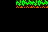

Something is wrong: 


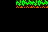

Something is wrong: 


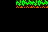

Something is wrong: 


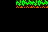

Something is wrong: 


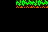

Something is wrong: 


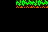

Something is wrong: 


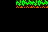

Something is wrong: 


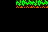

Something is wrong: 


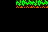

Something is wrong: 


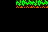

Something is wrong: 


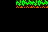

Something is wrong: 


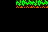

Something is wrong: 


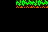

Something is wrong: 


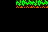

Something is wrong: 


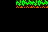

Something is wrong: 


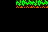

Something is wrong: 


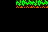

Something is wrong: 


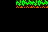

Something is wrong: 


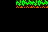

Something is wrong: 


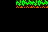

Something is wrong: 


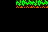

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_39
Something is wrong: 


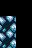

Something is wrong: 


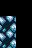

Something is wrong: 


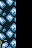

Something is wrong: 


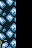

Something is wrong: 


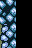

Something is wrong: 


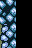

Something is wrong: 


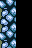

Something is wrong: 


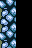

Something is wrong: 


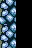

Something is wrong: 


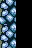

Something is wrong: 


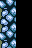

Something is wrong: 


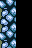

Something is wrong: 


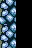

Something is wrong: 


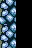

Something is wrong: 


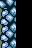

Something is wrong: 


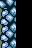

Something is wrong: 


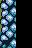

Something is wrong: 


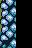

Something is wrong: 


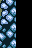

Something is wrong: 


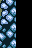

Something is wrong: 


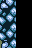

Something is wrong: 


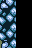

Something is wrong: 


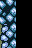

Something is wrong: 


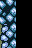

Something is wrong: 


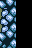

Something is wrong: 


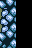

Something is wrong: 


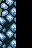

Something is wrong: 


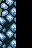

Something is wrong: 


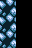

Something is wrong: 


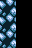

Something is wrong: 


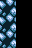

Something is wrong: 


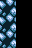

Something is wrong: 


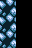

Something is wrong: 


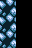

Something is wrong: 


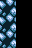

Something is wrong: 


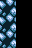

Something is wrong: 


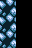

Something is wrong: 


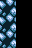

Something is wrong: 


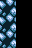

Something is wrong: 


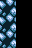

Something is wrong: 


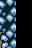

Something is wrong: 


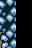

Something is wrong: 


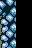

Something is wrong: 


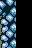

Something is wrong: 


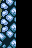

Something is wrong: 


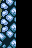

Something is wrong: 


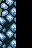

Something is wrong: 


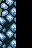

Something is wrong: 


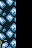

Something is wrong: 


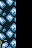

Something is wrong: 


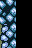

Something is wrong: 


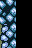

Something is wrong: 


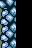

Something is wrong: 


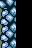

Something is wrong: 


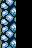

Something is wrong: 


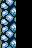

Something is wrong: 


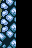

Something is wrong: 


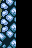

Something is wrong: 


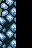

Something is wrong: 


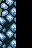

Something is wrong: 


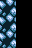

Something is wrong: 


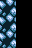

Something is wrong: 


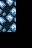

Something is wrong: 


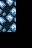

Something is wrong: 


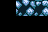

Something is wrong: 


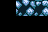

Something is wrong: 


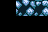

Something is wrong: 


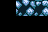

Something is wrong: 


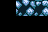

Something is wrong: 


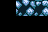

Something is wrong: 


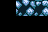

Something is wrong: 


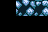

Something is wrong: 


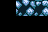

Something is wrong: 


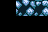

Something is wrong: 


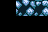

Something is wrong: 


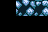

Something is wrong: 


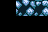

Something is wrong: 


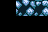

Something is wrong: 


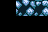

Something is wrong: 


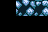

Something is wrong: 


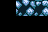

Something is wrong: 


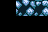

Something is wrong: 


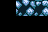

Something is wrong: 


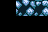

Something is wrong: 


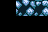

Something is wrong: 


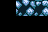

Something is wrong: 


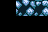

Something is wrong: 


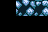

Something is wrong: 


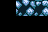

Something is wrong: 


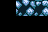

Something is wrong: 


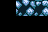

Something is wrong: 


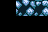

Something is wrong: 


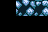

Something is wrong: 


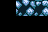

Something is wrong: 


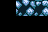

Something is wrong: 


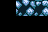

Something is wrong: 


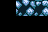

Something is wrong: 


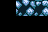

Something is wrong: 


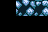

Something is wrong: 


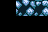

Something is wrong: 


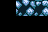

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_0
Something is wrong: 


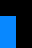

Something is wrong: 


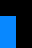

Something is wrong: 


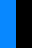

Something is wrong: 


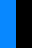

Something is wrong: 


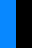

Something is wrong: 


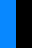

Something is wrong: 


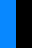

Something is wrong: 


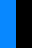

Something is wrong: 


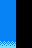

Something is wrong: 


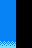

Something is wrong: 


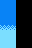

Something is wrong: 


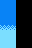

Something is wrong: 


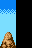

Something is wrong: 


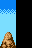

Something is wrong: 


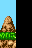

Something is wrong: 


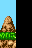

Something is wrong: 


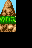

Something is wrong: 


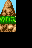

Something is wrong: 


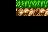

Something is wrong: 


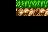

Something is wrong: 


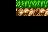

Something is wrong: 


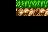

Something is wrong: 


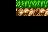

Something is wrong: 


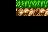

Something is wrong: 


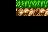

Something is wrong: 


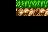

Something is wrong: 


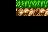

Something is wrong: 


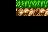

Something is wrong: 


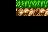

Something is wrong: 


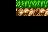

Something is wrong: 


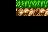

Something is wrong: 


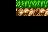

Something is wrong: 


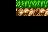

Something is wrong: 


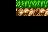

Something is wrong: 


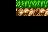

Something is wrong: 


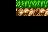

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_42
Something is wrong: 


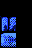

Something is wrong: 


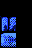

Something is wrong: 


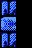

Something is wrong: 


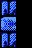

Something is wrong: 


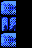

Something is wrong: 


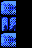

Something is wrong: 


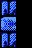

Something is wrong: 


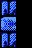

Something is wrong: 


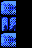

Something is wrong: 


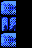

Something is wrong: 


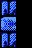

Something is wrong: 


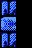

Something is wrong: 


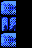

Something is wrong: 


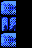

Something is wrong: 


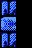

Something is wrong: 


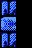

Something is wrong: 


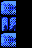

Something is wrong: 


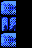

Something is wrong: 


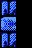

Something is wrong: 


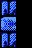

Something is wrong: 


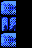

Something is wrong: 


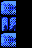

Something is wrong: 


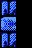

Something is wrong: 


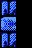

Something is wrong: 


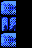

Something is wrong: 


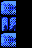

Something is wrong: 


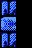

Something is wrong: 


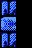

Something is wrong: 


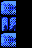

Something is wrong: 


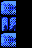

Something is wrong: 


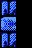

Something is wrong: 


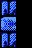

Something is wrong: 


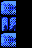

Something is wrong: 


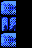

Something is wrong: 


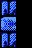

Something is wrong: 


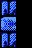

Something is wrong: 


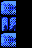

Something is wrong: 


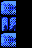

Something is wrong: 


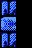

Something is wrong: 


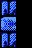

Something is wrong: 


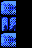

Something is wrong: 


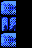

Something is wrong: 


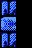

Something is wrong: 


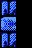

Something is wrong: 


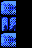

Something is wrong: 


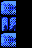

Something is wrong: 


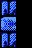

Something is wrong: 


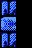

Something is wrong: 


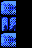

Something is wrong: 


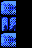

Something is wrong: 


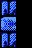

Something is wrong: 


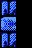

Something is wrong: 


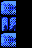

Something is wrong: 


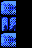

Something is wrong: 


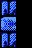

Something is wrong: 


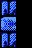

Something is wrong: 


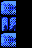

Something is wrong: 


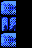

Something is wrong: 


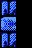

Something is wrong: 


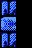

Something is wrong: 


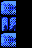

Something is wrong: 


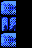

Something is wrong: 


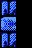

Something is wrong: 


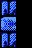

Something is wrong: 


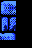

Something is wrong: 


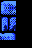

Something is wrong: 


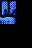

Something is wrong: 


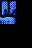

Something is wrong: 


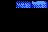

Something is wrong: 


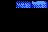

Something is wrong: 


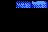

Something is wrong: 


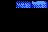

Something is wrong: 


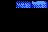

Something is wrong: 


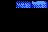

Something is wrong: 


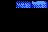

Something is wrong: 


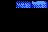

Something is wrong: 


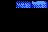

Something is wrong: 


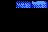

Something is wrong: 


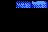

Something is wrong: 


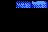

Something is wrong: 


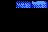

Something is wrong: 


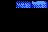

Something is wrong: 


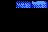

Something is wrong: 


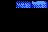

Something is wrong: 


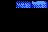

Something is wrong: 


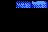

Something is wrong: 


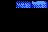

Something is wrong: 


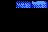

Something is wrong: 


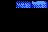

Something is wrong: 


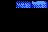

Something is wrong: 


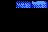

Something is wrong: 


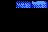

Something is wrong: 


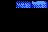

Something is wrong: 


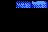

Something is wrong: 


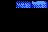

Something is wrong: 


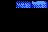

Something is wrong: 


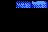

Something is wrong: 


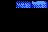

Something is wrong: 


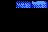

Something is wrong: 


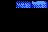

Something is wrong: 


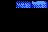

Something is wrong: 


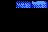

Something is wrong: 


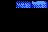

Something is wrong: 


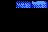

Something is wrong: 


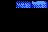

Something is wrong: 


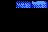

Something is wrong: 


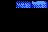

Something is wrong: 


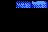

Something is wrong: 


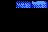

Something is wrong: 


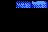

Something is wrong: 


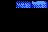

Something is wrong: 


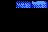

Something is wrong: 


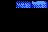

Something is wrong: 


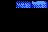

Something is wrong: 


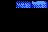

Something is wrong: 


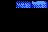

Something is wrong: 


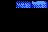

Something is wrong: 


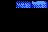

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_49
Something is wrong: 


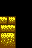

Something is wrong: 


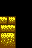

Something is wrong: 


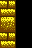

Something is wrong: 


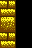

Something is wrong: 


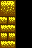

Something is wrong: 


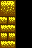

Something is wrong: 


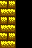

Something is wrong: 


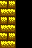

Something is wrong: 


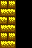

Something is wrong: 


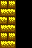

Something is wrong: 


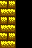

Something is wrong: 


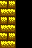

Something is wrong: 


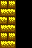

Something is wrong: 


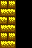

Something is wrong: 


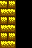

Something is wrong: 


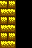

Something is wrong: 


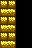

Something is wrong: 


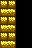

Something is wrong: 


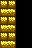

Something is wrong: 


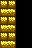

Something is wrong: 


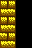

Something is wrong: 


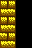

Something is wrong: 


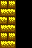

Something is wrong: 


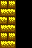

Something is wrong: 


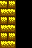

Something is wrong: 


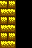

Something is wrong: 


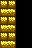

Something is wrong: 


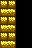

Something is wrong: 


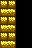

Something is wrong: 


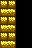

Something is wrong: 


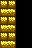

Something is wrong: 


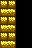

Something is wrong: 


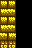

Something is wrong: 


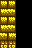

Something is wrong: 


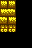

Something is wrong: 


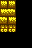

Something is wrong: 


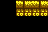

Something is wrong: 


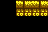

Something is wrong: 


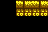

Something is wrong: 


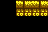

Something is wrong: 


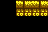

Something is wrong: 


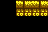

Something is wrong: 


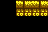

Something is wrong: 


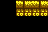

Something is wrong: 


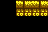

Something is wrong: 


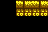

Something is wrong: 


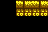

Something is wrong: 


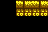

Something is wrong: 


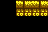

Something is wrong: 


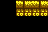

Something is wrong: 


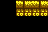

Something is wrong: 


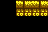

Something is wrong: 


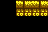

Something is wrong: 


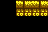

Something is wrong: 


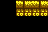

Something is wrong: 


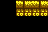

Something is wrong: 


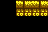

Something is wrong: 


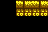

Something is wrong: 


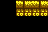

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_40
Something is wrong: 


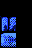

Something is wrong: 


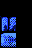

Something is wrong: 


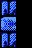

Something is wrong: 


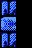

Something is wrong: 


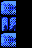

Something is wrong: 


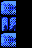

Something is wrong: 


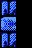

Something is wrong: 


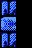

Something is wrong: 


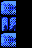

Something is wrong: 


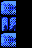

Something is wrong: 


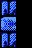

Something is wrong: 


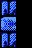

Something is wrong: 


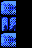

Something is wrong: 


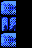

Something is wrong: 


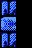

Something is wrong: 


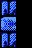

Something is wrong: 


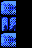

Something is wrong: 


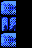

Something is wrong: 


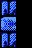

Something is wrong: 


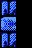

Something is wrong: 


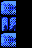

Something is wrong: 


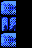

Something is wrong: 


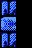

Something is wrong: 


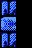

Something is wrong: 


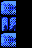

Something is wrong: 


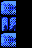

Something is wrong: 


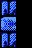

Something is wrong: 


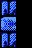

Something is wrong: 


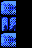

Something is wrong: 


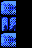

Something is wrong: 


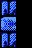

Something is wrong: 


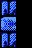

Something is wrong: 


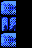

Something is wrong: 


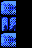

Something is wrong: 


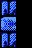

Something is wrong: 


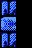

Something is wrong: 


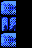

Something is wrong: 


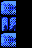

Something is wrong: 


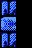

Something is wrong: 


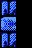

Something is wrong: 


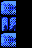

Something is wrong: 


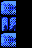

Something is wrong: 


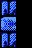

Something is wrong: 


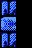

Something is wrong: 


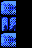

Something is wrong: 


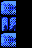

Something is wrong: 


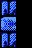

Something is wrong: 


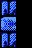

Something is wrong: 


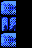

Something is wrong: 


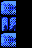

Something is wrong: 


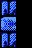

Something is wrong: 


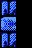

Something is wrong: 


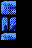

Something is wrong: 


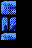

Something is wrong: 


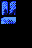

Something is wrong: 


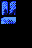

Something is wrong: 


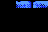

Something is wrong: 


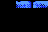

Something is wrong: 


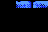

Something is wrong: 


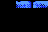

Something is wrong: 


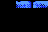

Something is wrong: 


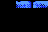

Something is wrong: 


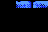

Something is wrong: 


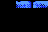

Something is wrong: 


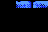

Something is wrong: 


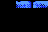

Something is wrong: 


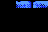

Something is wrong: 


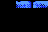

Something is wrong: 


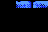

Something is wrong: 


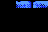

Something is wrong: 


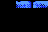

Something is wrong: 


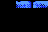

Something is wrong: 


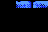

Something is wrong: 


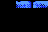

Something is wrong: 


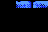

Something is wrong: 


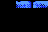

Something is wrong: 


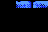

Something is wrong: 


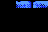

Something is wrong: 


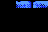

Something is wrong: 


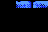

Something is wrong: 


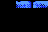

Something is wrong: 


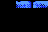

Something is wrong: 


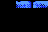

Something is wrong: 


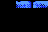

Something is wrong: 


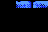

Something is wrong: 


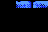

Something is wrong: 


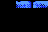

Something is wrong: 


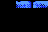

Something is wrong: 


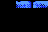

Something is wrong: 


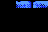

Something is wrong: 


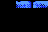

Something is wrong: 


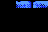

Something is wrong: 


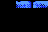

Something is wrong: 


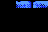

Something is wrong: 


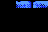

Something is wrong: 


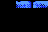

Something is wrong: 


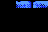

Something is wrong: 


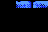

Something is wrong: 


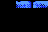

Something is wrong: 


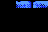

Something is wrong: 


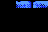

Something is wrong: 


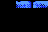

Something is wrong: 


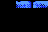

Something is wrong: 


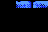

Something is wrong: 


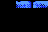

Something is wrong: 


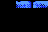

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_15
Something is wrong: 


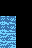

Something is wrong: 


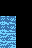

Something is wrong: 


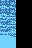

Something is wrong: 


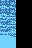

Something is wrong: 


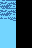

Something is wrong: 


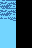

Something is wrong: 


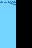

Something is wrong: 


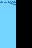

Something is wrong: 


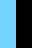

Something is wrong: 


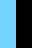

Something is wrong: 


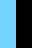

Something is wrong: 


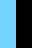

Something is wrong: 


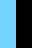

Something is wrong: 


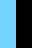

Something is wrong: 


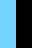

Something is wrong: 


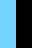

Something is wrong: 


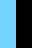

Something is wrong: 


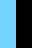

Something is wrong: 


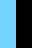

Something is wrong: 


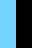

Something is wrong: 


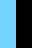

Something is wrong: 


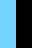

Something is wrong: 


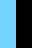

Something is wrong: 


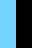

Something is wrong: 


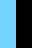

Something is wrong: 


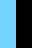

Something is wrong: 


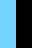

Something is wrong: 


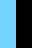

Something is wrong: 


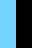

Something is wrong: 


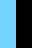

Something is wrong: 


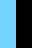

Something is wrong: 


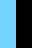

Something is wrong: 


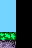

Something is wrong: 


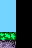

Something is wrong: 


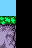

Something is wrong: 


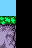

Something is wrong: 


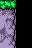

Something is wrong: 


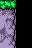

Something is wrong: 


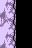

Something is wrong: 


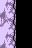

Something is wrong: 


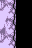

Something is wrong: 


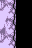

Something is wrong: 


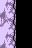

Something is wrong: 


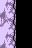

Something is wrong: 


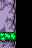

Something is wrong: 


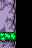

Something is wrong: 


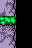

Something is wrong: 


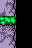

Something is wrong: 


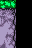

Something is wrong: 


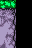

Something is wrong: 


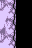

Something is wrong: 


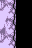

Something is wrong: 


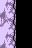

Something is wrong: 


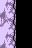

Something is wrong: 


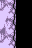

Something is wrong: 


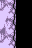

Something is wrong: 


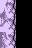

Something is wrong: 


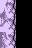

Something is wrong: 


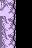

Something is wrong: 


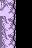

Something is wrong: 


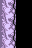

Something is wrong: 


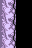

Something is wrong: 


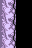

Something is wrong: 


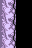

Something is wrong: 


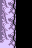

Something is wrong: 


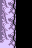

Something is wrong: 


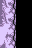

Something is wrong: 


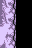

Something is wrong: 


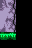

Something is wrong: 


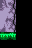

Something is wrong: 


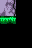

Something is wrong: 


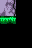

Something is wrong: 


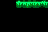

Something is wrong: 


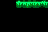

Something is wrong: 


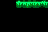

Something is wrong: 


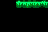

Something is wrong: 


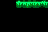

Something is wrong: 


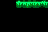

Something is wrong: 


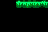

Something is wrong: 


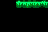

Something is wrong: 


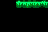

Something is wrong: 


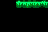

Something is wrong: 


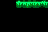

Something is wrong: 


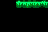

Something is wrong: 


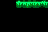

Something is wrong: 


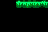

Something is wrong: 


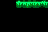

Something is wrong: 


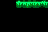

Something is wrong: 


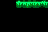

Something is wrong: 


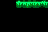

Something is wrong: 


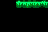

Something is wrong: 


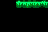

Something is wrong: 


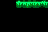

Something is wrong: 


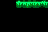

Something is wrong: 


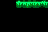

Something is wrong: 


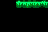

Something is wrong: 


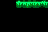

Something is wrong: 


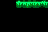

Something is wrong: 


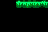

Something is wrong: 


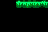

Something is wrong: 


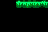

Something is wrong: 


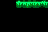

Something is wrong: 


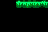

Something is wrong: 


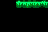

Something is wrong: 


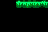

Something is wrong: 


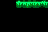

Something is wrong: 


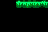

Something is wrong: 


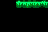

Something is wrong: 


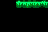

Something is wrong: 


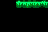

Something is wrong: 


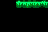

Something is wrong: 


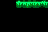

Something is wrong: 


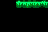

Something is wrong: 


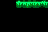

Something is wrong: 


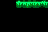

Something is wrong: 


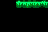

Something is wrong: 


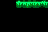

Something is wrong: 


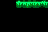

Something is wrong: 


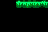

Something is wrong: 


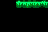

Something is wrong: 


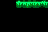

Something is wrong: 


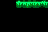

Something is wrong: 


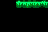

Something is wrong: 


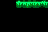

Something is wrong: 


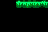

Something is wrong: 


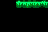

Something is wrong: 


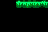

Something is wrong: 


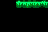

Something is wrong: 


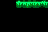

Something is wrong: 


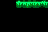

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_41
Something is wrong: 


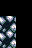

Something is wrong: 


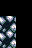

Something is wrong: 


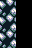

Something is wrong: 


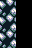

Something is wrong: 


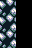

Something is wrong: 


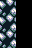

Something is wrong: 


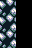

Something is wrong: 


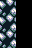

Something is wrong: 


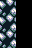

Something is wrong: 


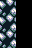

Something is wrong: 


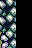

Something is wrong: 


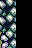

Something is wrong: 


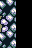

Something is wrong: 


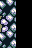

Something is wrong: 


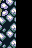

Something is wrong: 


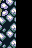

Something is wrong: 


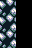

Something is wrong: 


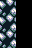

Something is wrong: 


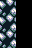

Something is wrong: 


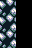

Something is wrong: 


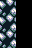

Something is wrong: 


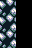

Something is wrong: 


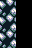

Something is wrong: 


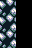

Something is wrong: 


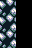

Something is wrong: 


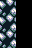

Something is wrong: 


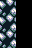

Something is wrong: 


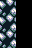

Something is wrong: 


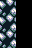

Something is wrong: 


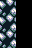

Something is wrong: 


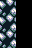

Something is wrong: 


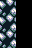

Something is wrong: 


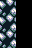

Something is wrong: 


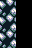

Something is wrong: 


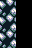

Something is wrong: 


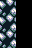

Something is wrong: 


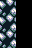

Something is wrong: 


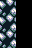

Something is wrong: 


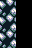

Something is wrong: 


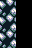

Something is wrong: 


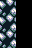

Something is wrong: 


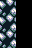

Something is wrong: 


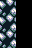

Something is wrong: 


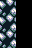

Something is wrong: 


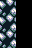

Something is wrong: 


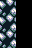

Something is wrong: 


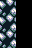

Something is wrong: 


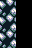

Something is wrong: 


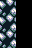

Something is wrong: 


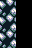

Something is wrong: 


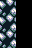

Something is wrong: 


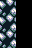

Something is wrong: 


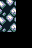

Something is wrong: 


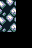

Something is wrong: 


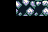

Something is wrong: 


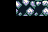

Something is wrong: 


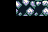

Something is wrong: 


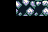

Something is wrong: 


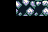

Something is wrong: 


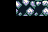

Something is wrong: 


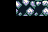

Something is wrong: 


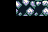

Something is wrong: 


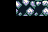

Something is wrong: 


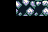

Something is wrong: 


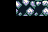

Something is wrong: 


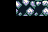

Something is wrong: 


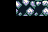

Something is wrong: 


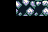

Something is wrong: 


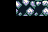

Something is wrong: 


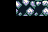

Something is wrong: 


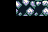

Something is wrong: 


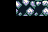

Something is wrong: 


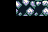

Something is wrong: 


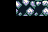

Something is wrong: 


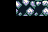

Something is wrong: 


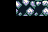

Something is wrong: 


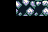

Something is wrong: 


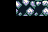

Something is wrong: 


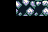

Something is wrong: 


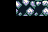

Something is wrong: 


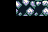

Something is wrong: 


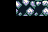

Something is wrong: 


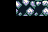

Something is wrong: 


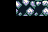

Something is wrong: 


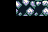

Something is wrong: 


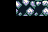

Something is wrong: 


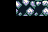

Something is wrong: 


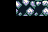

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_26
Something is wrong: 


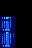

Something is wrong: 


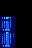

Something is wrong: 


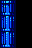

Something is wrong: 


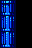

Something is wrong: 


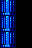

Something is wrong: 


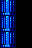

Something is wrong: 


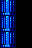

Something is wrong: 


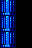

Something is wrong: 


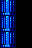

Something is wrong: 


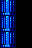

Something is wrong: 


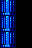

Something is wrong: 


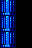

Something is wrong: 


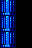

Something is wrong: 


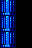

Something is wrong: 


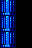

Something is wrong: 


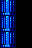

Something is wrong: 


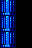

Something is wrong: 


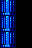

Something is wrong: 


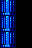

Something is wrong: 


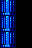

Something is wrong: 


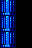

Something is wrong: 


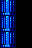

Something is wrong: 


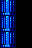

Something is wrong: 


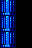

Something is wrong: 


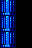

Something is wrong: 


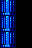

Something is wrong: 


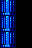

Something is wrong: 


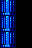

Something is wrong: 


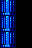

Something is wrong: 


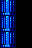

Something is wrong: 


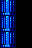

Something is wrong: 


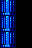

Something is wrong: 


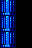

Something is wrong: 


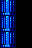

Something is wrong: 


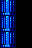

Something is wrong: 


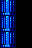

Something is wrong: 


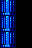

Something is wrong: 


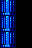

Something is wrong: 


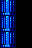

Something is wrong: 


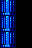

Something is wrong: 


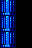

Something is wrong: 


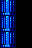

Something is wrong: 


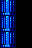

Something is wrong: 


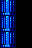

Something is wrong: 


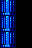

Something is wrong: 


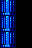

Something is wrong: 


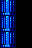

Something is wrong: 


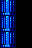

Something is wrong: 


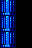

Something is wrong: 


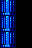

Something is wrong: 


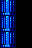

Something is wrong: 


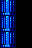

Something is wrong: 


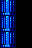

Something is wrong: 


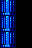

Something is wrong: 


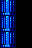

Something is wrong: 


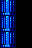

Something is wrong: 


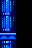

Something is wrong: 


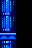

Something is wrong: 


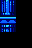

Something is wrong: 


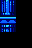

Something is wrong: 


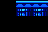

Something is wrong: 


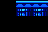

Something is wrong: 


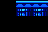

Something is wrong: 


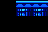

Something is wrong: 


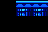

Something is wrong: 


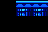

Something is wrong: 


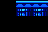

Something is wrong: 


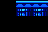

Something is wrong: 


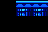

Something is wrong: 


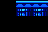

Something is wrong: 


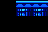

Something is wrong: 


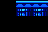

Something is wrong: 


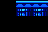

Something is wrong: 


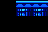

Something is wrong: 


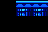

Something is wrong: 


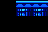

Something is wrong: 


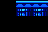

Something is wrong: 


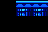

Something is wrong: 


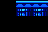

Something is wrong: 


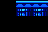

Something is wrong: 


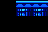

Something is wrong: 


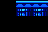

Something is wrong: 


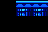

Something is wrong: 


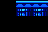

Something is wrong: 


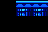

Something is wrong: 


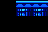

Something is wrong: 


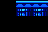

Something is wrong: 


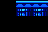

Something is wrong: 


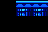

Something is wrong: 


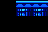

Something is wrong: 


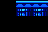

Something is wrong: 


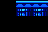

Something is wrong: 


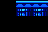

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_50
Something is wrong: 


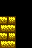

Something is wrong: 


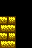

Something is wrong: 


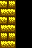

Something is wrong: 


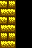

Something is wrong: 


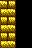

Something is wrong: 


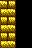

Something is wrong: 


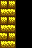

Something is wrong: 


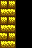

Something is wrong: 


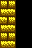

Something is wrong: 


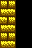

Something is wrong: 


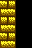

Something is wrong: 


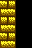

Something is wrong: 


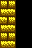

Something is wrong: 


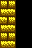

Something is wrong: 


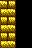

Something is wrong: 


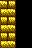

Something is wrong: 


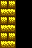

Something is wrong: 


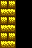

Something is wrong: 


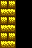

Something is wrong: 


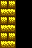

Something is wrong: 


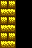

Something is wrong: 


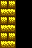

Something is wrong: 


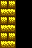

Something is wrong: 


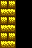

Something is wrong: 


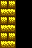

Something is wrong: 


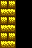

Something is wrong: 


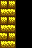

Something is wrong: 


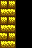

Something is wrong: 


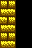

Something is wrong: 


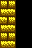

Something is wrong: 


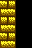

Something is wrong: 


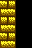

Something is wrong: 


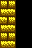

Something is wrong: 


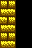

Something is wrong: 


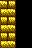

Something is wrong: 


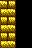

Something is wrong: 


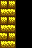

Something is wrong: 


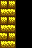

Something is wrong: 


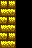

Something is wrong: 


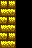

Something is wrong: 


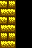

Something is wrong: 


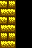

Something is wrong: 


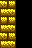

Something is wrong: 


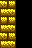

Something is wrong: 


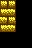

Something is wrong: 


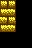

Something is wrong: 


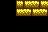

Something is wrong: 


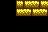

Something is wrong: 


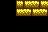

Something is wrong: 


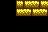

Something is wrong: 


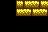

Something is wrong: 


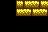

Something is wrong: 


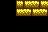

Something is wrong: 


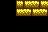

Something is wrong: 


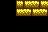

Something is wrong: 


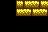

Something is wrong: 


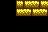

Something is wrong: 


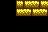

Something is wrong: 


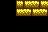

Something is wrong: 


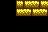

Something is wrong: 


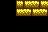

Something is wrong: 


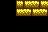

Something is wrong: 


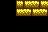

Something is wrong: 


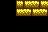

Something is wrong: 


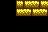

Something is wrong: 


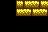

Something is wrong: 


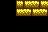

Something is wrong: 


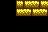

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_36
Something is wrong: 


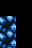

Something is wrong: 


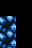

Something is wrong: 


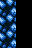

Something is wrong: 


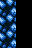

Something is wrong: 


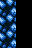

Something is wrong: 


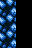

Something is wrong: 


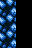

Something is wrong: 


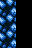

Something is wrong: 


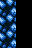

Something is wrong: 


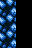

Something is wrong: 


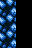

Something is wrong: 


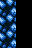

Something is wrong: 


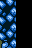

Something is wrong: 


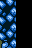

Something is wrong: 


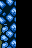

Something is wrong: 


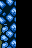

Something is wrong: 


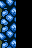

Something is wrong: 


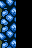

Something is wrong: 


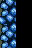

Something is wrong: 


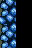

Something is wrong: 


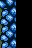

Something is wrong: 


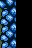

Something is wrong: 


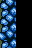

Something is wrong: 


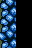

Something is wrong: 


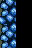

Something is wrong: 


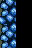

Something is wrong: 


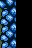

Something is wrong: 


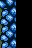

Something is wrong: 


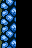

Something is wrong: 


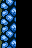

Something is wrong: 


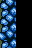

Something is wrong: 


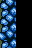

Something is wrong: 


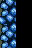

Something is wrong: 


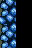

Something is wrong: 


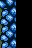

Something is wrong: 


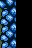

Something is wrong: 


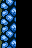

Something is wrong: 


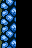

Something is wrong: 


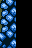

Something is wrong: 


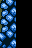

Something is wrong: 


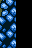

Something is wrong: 


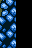

Something is wrong: 


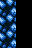

Something is wrong: 


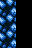

Something is wrong: 


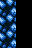

Something is wrong: 


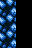

Something is wrong: 


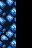

Something is wrong: 


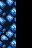

Something is wrong: 


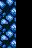

Something is wrong: 


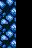

Something is wrong: 


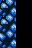

Something is wrong: 


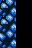

Something is wrong: 


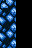

Something is wrong: 


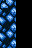

Something is wrong: 


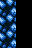

Something is wrong: 


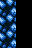

Something is wrong: 


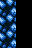

Something is wrong: 


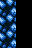

Something is wrong: 


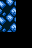

Something is wrong: 


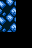

Something is wrong: 


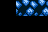

Something is wrong: 


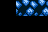

Something is wrong: 


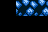

Something is wrong: 


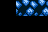

Something is wrong: 


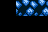

Something is wrong: 


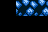

Something is wrong: 


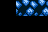

Something is wrong: 


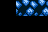

Something is wrong: 


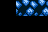

Something is wrong: 


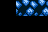

Something is wrong: 


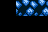

Something is wrong: 


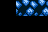

Something is wrong: 


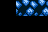

Something is wrong: 


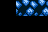

Something is wrong: 


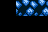

Something is wrong: 


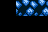

Something is wrong: 


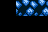

Something is wrong: 


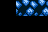

Something is wrong: 


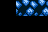

Something is wrong: 


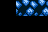

Something is wrong: 


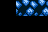

Something is wrong: 


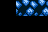

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_33
Something is wrong: 


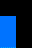

Something is wrong: 


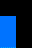

Something is wrong: 


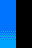

Something is wrong: 


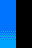

Something is wrong: 


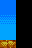

Something is wrong: 


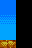

Something is wrong: 


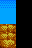

Something is wrong: 


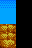

Something is wrong: 


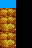

Something is wrong: 


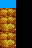

Something is wrong: 


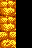

Something is wrong: 


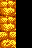

Something is wrong: 


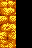

Something is wrong: 


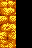

Something is wrong: 


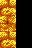

Something is wrong: 


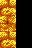

Something is wrong: 


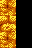

Something is wrong: 


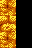

Something is wrong: 


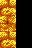

Something is wrong: 


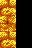

Something is wrong: 


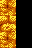

Something is wrong: 


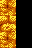

Something is wrong: 


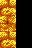

Something is wrong: 


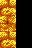

Something is wrong: 


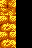

Something is wrong: 


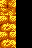

Something is wrong: 


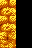

Something is wrong: 


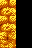

Something is wrong: 


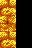

Something is wrong: 


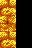

Something is wrong: 


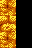

Something is wrong: 


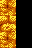

Something is wrong: 


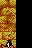

Something is wrong: 


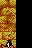

Something is wrong: 


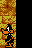

Something is wrong: 


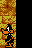

Something is wrong: 


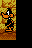

Something is wrong: 


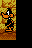

Something is wrong: 


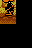

Something is wrong: 


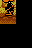

Something is wrong: 


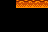

Something is wrong: 


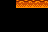

Something is wrong: 


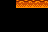

Something is wrong: 


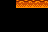

Something is wrong: 


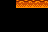

Something is wrong: 


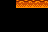

Something is wrong: 


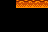

Something is wrong: 


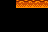

Something is wrong: 


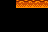

Something is wrong: 


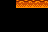

Something is wrong: 


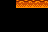

Something is wrong: 


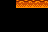

Something is wrong: 


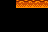

Something is wrong: 


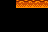

Something is wrong: 


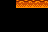

Something is wrong: 


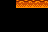

Something is wrong: 


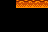

Something is wrong: 


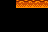

Something is wrong: 


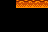

Something is wrong: 


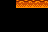

Something is wrong: 


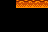

Something is wrong: 


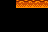

Something is wrong: 


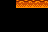

Something is wrong: 


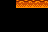

Something is wrong: 


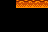

Something is wrong: 


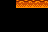

Something is wrong: 


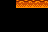

Something is wrong: 


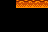

Something is wrong: 


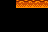

Something is wrong: 


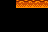

Something is wrong: 


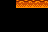

Something is wrong: 


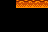

Something is wrong: 


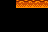

Something is wrong: 


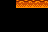

Something is wrong: 


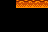

Something is wrong: 


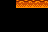

Something is wrong: 


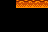

Something is wrong: 


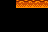

Something is wrong: 


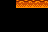

Something is wrong: 


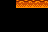

Something is wrong: 


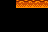

Something is wrong: 


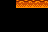

Something is wrong: 


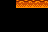

Something is wrong: 


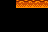

Something is wrong: 


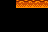

Something is wrong: 


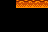

Something is wrong: 


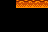

Something is wrong: 


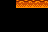

Something is wrong: 


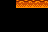

Something is wrong: 


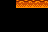

Something is wrong: 


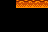

Something is wrong: 


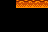

Something is wrong: 


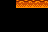

Something is wrong: 


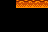

Something is wrong: 


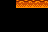

Something is wrong: 


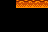

Something is wrong: 


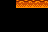

Something is wrong: 


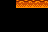

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_18
Something is wrong: 


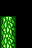

Something is wrong: 


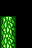

Something is wrong: 


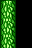

Something is wrong: 


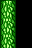

Something is wrong: 


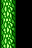

Something is wrong: 


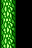

Something is wrong: 


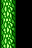

Something is wrong: 


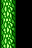

Something is wrong: 


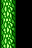

Something is wrong: 


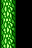

Something is wrong: 


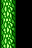

Something is wrong: 


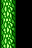

Something is wrong: 


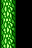

Something is wrong: 


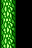

Something is wrong: 


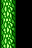

Something is wrong: 


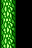

Something is wrong: 


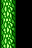

Something is wrong: 


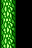

Something is wrong: 


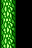

Something is wrong: 


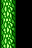

Something is wrong: 


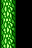

Something is wrong: 


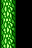

Something is wrong: 


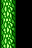

Something is wrong: 


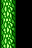

Something is wrong: 


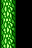

Something is wrong: 


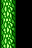

Something is wrong: 


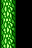

Something is wrong: 


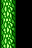

Something is wrong: 


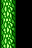

Something is wrong: 


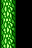

Something is wrong: 


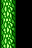

Something is wrong: 


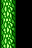

Something is wrong: 


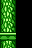

Something is wrong: 


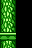

Something is wrong: 


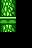

Something is wrong: 


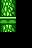

Something is wrong: 


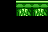

Something is wrong: 


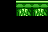

Something is wrong: 


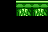

Something is wrong: 


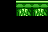

Something is wrong: 


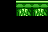

Something is wrong: 


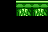

Something is wrong: 


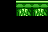

Something is wrong: 


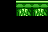

Something is wrong: 


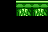

Something is wrong: 


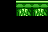

Something is wrong: 


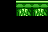

Something is wrong: 


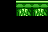

Something is wrong: 


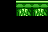

Something is wrong: 


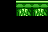

Something is wrong: 


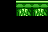

Something is wrong: 


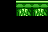

Something is wrong: 


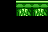

Something is wrong: 


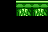

Something is wrong: 


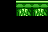

Something is wrong: 


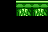

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_10
Something is wrong: 


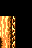

Something is wrong: 


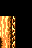

Something is wrong: 


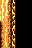

Something is wrong: 


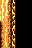

Something is wrong: 


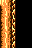

Something is wrong: 


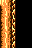

Something is wrong: 


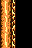

Something is wrong: 


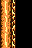

Something is wrong: 


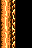

Something is wrong: 


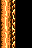

Something is wrong: 


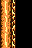

Something is wrong: 


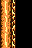

Something is wrong: 


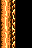

Something is wrong: 


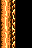

Something is wrong: 


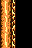

Something is wrong: 


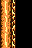

Something is wrong: 


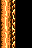

Something is wrong: 


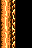

Something is wrong: 


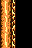

Something is wrong: 


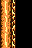

Something is wrong: 


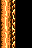

Something is wrong: 


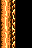

Something is wrong: 


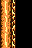

Something is wrong: 


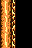

Something is wrong: 


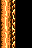

Something is wrong: 


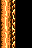

Something is wrong: 


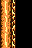

Something is wrong: 


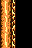

Something is wrong: 


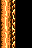

Something is wrong: 


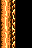

Something is wrong: 


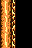

Something is wrong: 


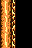

Something is wrong: 


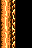

Something is wrong: 


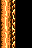

Something is wrong: 


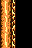

Something is wrong: 


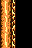

Something is wrong: 


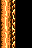

Something is wrong: 


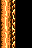

Something is wrong: 


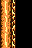

Something is wrong: 


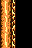

Something is wrong: 


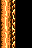

Something is wrong: 


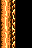

Something is wrong: 


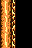

Something is wrong: 


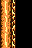

Something is wrong: 


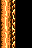

Something is wrong: 


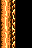

Something is wrong: 


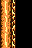

Something is wrong: 


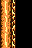

Something is wrong: 


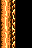

Something is wrong: 


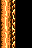

Something is wrong: 


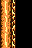

Something is wrong: 


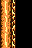

Something is wrong: 


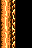

Something is wrong: 


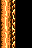

Something is wrong: 


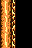

Something is wrong: 


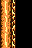

Something is wrong: 


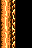

Something is wrong: 


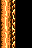

Something is wrong: 


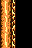

Something is wrong: 


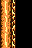

Something is wrong: 


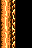

Something is wrong: 


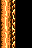

Something is wrong: 


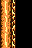

Something is wrong: 


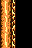

Something is wrong: 


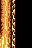

Something is wrong: 


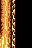

Something is wrong: 


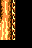

Something is wrong: 


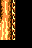

Something is wrong: 


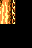

Something is wrong: 


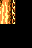

Something is wrong: 


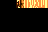

Something is wrong: 


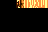

Something is wrong: 


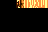

Something is wrong: 


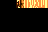

Something is wrong: 


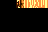

Something is wrong: 


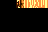

Something is wrong: 


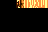

Something is wrong: 


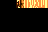

Something is wrong: 


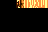

Something is wrong: 


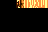

Something is wrong: 


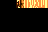

Something is wrong: 


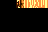

Something is wrong: 


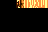

Something is wrong: 


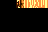

Something is wrong: 


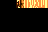

Something is wrong: 


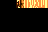

Something is wrong: 


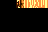

Something is wrong: 


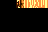

Something is wrong: 


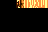

Something is wrong: 


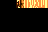

Something is wrong: 


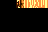

Something is wrong: 


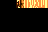

Something is wrong: 


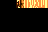

Something is wrong: 


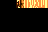

Something is wrong: 


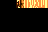

Something is wrong: 


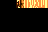

Something is wrong: 


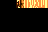

Something is wrong: 


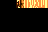

Something is wrong: 


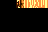

Something is wrong: 


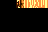

Something is wrong: 


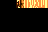

Something is wrong: 


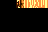

Something is wrong: 


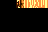

Something is wrong: 


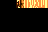

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_48
Something is wrong: 


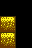

Something is wrong: 


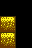

Something is wrong: 


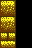

Something is wrong: 


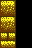

Something is wrong: 


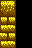

Something is wrong: 


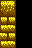

Something is wrong: 


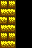

Something is wrong: 


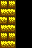

Something is wrong: 


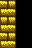

Something is wrong: 


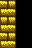

Something is wrong: 


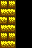

Something is wrong: 


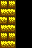

Something is wrong: 


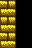

Something is wrong: 


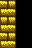

Something is wrong: 


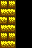

Something is wrong: 


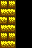

Something is wrong: 


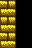

Something is wrong: 


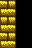

Something is wrong: 


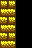

Something is wrong: 


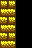

Something is wrong: 


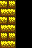

Something is wrong: 


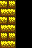

Something is wrong: 


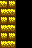

Something is wrong: 


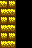

Something is wrong: 


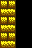

Something is wrong: 


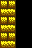

Something is wrong: 


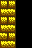

Something is wrong: 


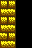

Something is wrong: 


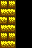

Something is wrong: 


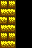

Something is wrong: 


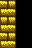

Something is wrong: 


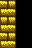

Something is wrong: 


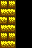

Something is wrong: 


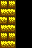

Something is wrong: 


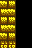

Something is wrong: 


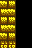

Something is wrong: 


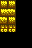

Something is wrong: 


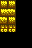

Something is wrong: 


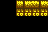

Something is wrong: 


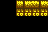

Something is wrong: 


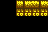

Something is wrong: 


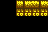

Something is wrong: 


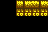

Something is wrong: 


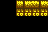

Something is wrong: 


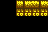

Something is wrong: 


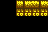

Something is wrong: 


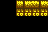

Something is wrong: 


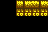

Something is wrong: 


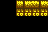

Something is wrong: 


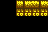

Something is wrong: 


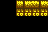

Something is wrong: 


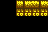

Something is wrong: 


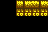

Something is wrong: 


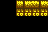

Something is wrong: 


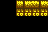

Something is wrong: 


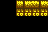

Something is wrong: 


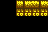

Something is wrong: 


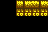

Something is wrong: 


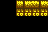

Something is wrong: 


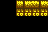

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_0_6
Something is wrong: 


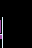

Something is wrong: 


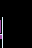

Something is wrong: 


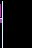

Something is wrong: 


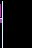

Something is wrong: 


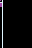

Something is wrong: 


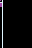

Something is wrong: 


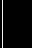

Something is wrong: 


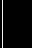

Something is wrong: 


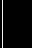

Something is wrong: 


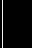

Something is wrong: 


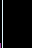

Something is wrong: 


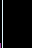

Something is wrong: 


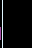

Something is wrong: 


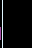

Something is wrong: 


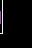

Something is wrong: 


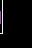

Something is wrong: 


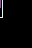

Something is wrong: 


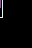

Something is wrong: 


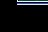

Something is wrong: 


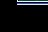

Something is wrong: 


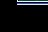

Something is wrong: 


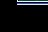

Something is wrong: 


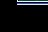

Something is wrong: 


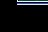

Something is wrong: 


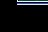

Something is wrong: 


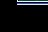

Something is wrong: 


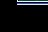

Something is wrong: 


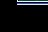

Something is wrong: 


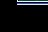

Something is wrong: 


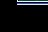

Something is wrong: 


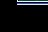

Something is wrong: 


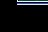

Something is wrong: 


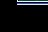

Something is wrong: 


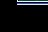

Something is wrong: 


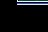

Something is wrong: 


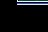

Something is wrong: 


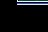

Something is wrong: 


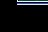

Something is wrong: 


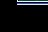

Something is wrong: 


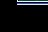

Something is wrong: 


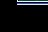

Something is wrong: 


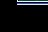

Something is wrong: 


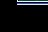

Something is wrong: 


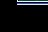

Something is wrong: 


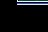

Something is wrong: 


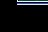

Something is wrong: 


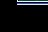

Something is wrong: 


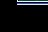

Something is wrong: 


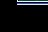

Something is wrong: 


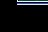

Something is wrong: 


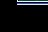

Something is wrong: 


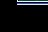

Something is wrong: 


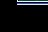

Something is wrong: 


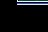

Something is wrong: 


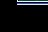

Something is wrong: 


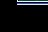

Something is wrong: 


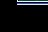

Something is wrong: 


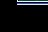

Something is wrong: 


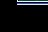

Something is wrong: 


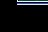

Something is wrong: 


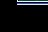

Something is wrong: 


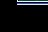

Something is wrong: 


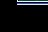

Something is wrong: 


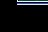

Something is wrong: 


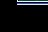

Something is wrong: 


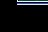

Something is wrong: 


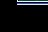

Something is wrong: 


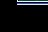

Something is wrong: 


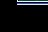

Something is wrong: 


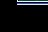

Something is wrong: 


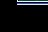

Something is wrong: 


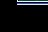

Something is wrong: 


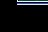

Something is wrong: 


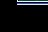

Something is wrong: 


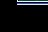

Something is wrong: 


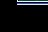

Something is wrong: 


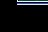

Something is wrong: 


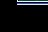

Something is wrong: 


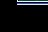

Something is wrong: 


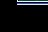

Something is wrong: 


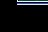

Something is wrong: 


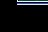

Something is wrong: 


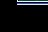

Something is wrong: 


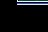

Something is wrong: 


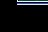

Something is wrong: 


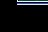

Something is wrong: 


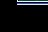

Something is wrong: 


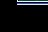

Something is wrong: 


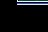

Something is wrong: 


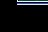

Something is wrong: 


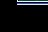

Something is wrong: 


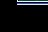

Something is wrong: 


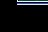

Something is wrong: 


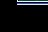

Something is wrong: 


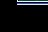

Something is wrong: 


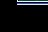

Something is wrong: 


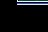

Something is wrong: 


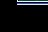

Something is wrong: 


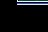

Something is wrong: 


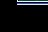

Something is wrong: 


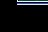

Something is wrong: 


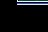

Something is wrong: 


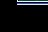

Something is wrong: 


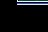

Something is wrong: 


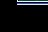

Something is wrong: 


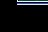

Something is wrong: 


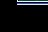

Something is wrong: 


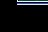

Something is wrong: 


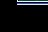

Something is wrong: 


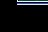

Something is wrong: 


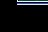

Something is wrong: 


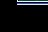

Something is wrong: 


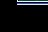

Something is wrong: 


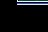

Something is wrong: 


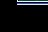

Something is wrong: 


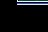

Something is wrong: 


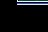

Something is wrong: 


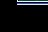

Something is wrong: 


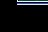

Something is wrong: 


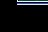

Something is wrong: 


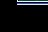

Something is wrong: 


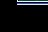

Something is wrong: 


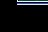

Something is wrong: 


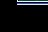

Something is wrong: 


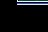

Something is wrong: 


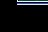

Something is wrong: 


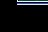

Something is wrong: 


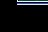

Something is wrong: 


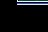

Something is wrong: 


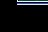

Something is wrong: 


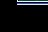

Something is wrong: 


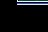

Something is wrong: 


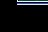

Something is wrong: 


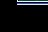

Something is wrong: 


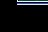

Something is wrong: 


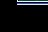

Something is wrong: 


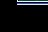

Something is wrong: 


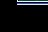

Something is wrong: 


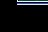

Something is wrong: 


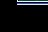

Something is wrong: 


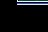

Something is wrong: 


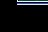

Something is wrong: 


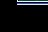

Something is wrong: 


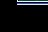

Something is wrong: 


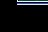

Something is wrong: 


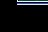

Something is wrong: 


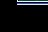

Something is wrong: 


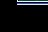

Something is wrong: 


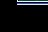

Something is wrong: 


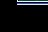

Something is wrong: 


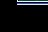

Something is wrong: 


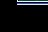

Something is wrong: 


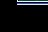

Something is wrong: 


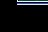

Something is wrong: 


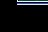

Something is wrong: 


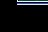

Something is wrong: 


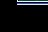

Something is wrong: 


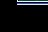

Something is wrong: 


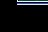

Something is wrong: 


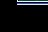

Something is wrong: 


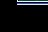

Something is wrong: 


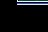

Something is wrong: 


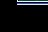

Something is wrong: 


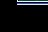

Something is wrong: 


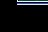

Something is wrong: 


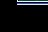

Something is wrong: 


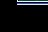

Something is wrong: 


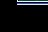

Something is wrong: 


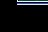

Something is wrong: 


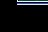

Something is wrong: 


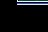

Something is wrong: 


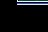

Something is wrong: 


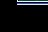

Something is wrong: 


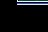

Something is wrong: 


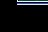

Something is wrong: 


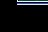

Something is wrong: 


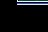

Something is wrong: 


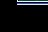

Something is wrong: 


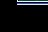

Something is wrong: 


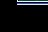

Something is wrong: 


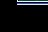

Something is wrong: 


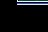

Something is wrong: 


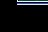

Something is wrong: 


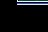

Something is wrong: 


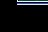

Something is wrong: 


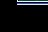

Something is wrong: 


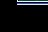

Something is wrong: 


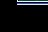

Something is wrong: 


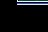

Something is wrong: 


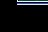

Something is wrong: 


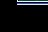

Something is wrong: 


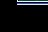

Something is wrong: 


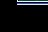

Something is wrong: 


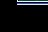

Something is wrong: 


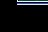

Something is wrong: 


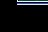

Something is wrong: 


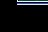

Something is wrong: 


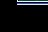

Something is wrong: 


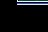

Something is wrong: 


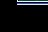

Something is wrong: 


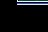

Something is wrong: 


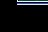

Something is wrong: 


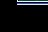

Something is wrong: 


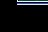

Something is wrong: 


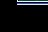

Something is wrong: 


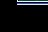

Something is wrong: 


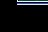

Something is wrong: 


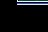

Something is wrong: 


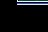

Something is wrong: 


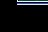

Something is wrong: 


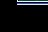

Something is wrong: 


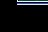

Something is wrong: 


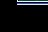

Something is wrong: 


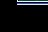

Something is wrong: 


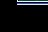

Something is wrong: 


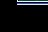

Something is wrong: 


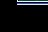

Something is wrong: 


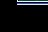

Something is wrong: 


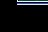

Something is wrong: 


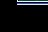

Something is wrong: 


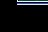

Something is wrong: 


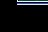

Something is wrong: 


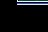

Something is wrong: 


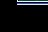

Something is wrong: 


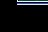

Something is wrong: 


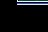

Something is wrong: 


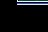

Something is wrong: 


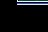

Something is wrong: 


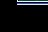

Something is wrong: 


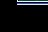

Something is wrong: 


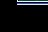

Something is wrong: 


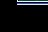

Something is wrong: 


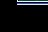

Something is wrong: 


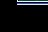

Something is wrong: 


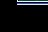

Something is wrong: 


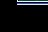

Something is wrong: 


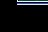

Something is wrong: 


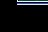

Something is wrong: 


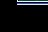

Something is wrong: 


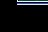

Something is wrong: 


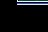

Something is wrong: 


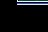

Something is wrong: 


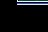

Something is wrong: 


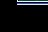

Something is wrong: 


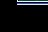

Something is wrong: 


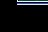

Something is wrong: 


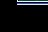

Something is wrong: 


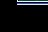

Something is wrong: 


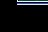

Something is wrong: 


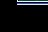

Something is wrong: 


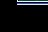

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_5
Something is wrong: 


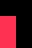

Something is wrong: 


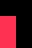

Something is wrong: 


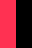

Something is wrong: 


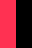

Something is wrong: 


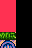

Something is wrong: 


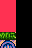

Something is wrong: 


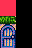

Something is wrong: 


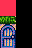

Something is wrong: 


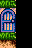

Something is wrong: 


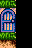

Something is wrong: 


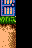

Something is wrong: 


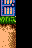

Something is wrong: 


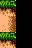

Something is wrong: 


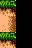

Something is wrong: 


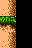

Something is wrong: 


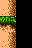

Something is wrong: 


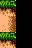

Something is wrong: 


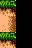

Something is wrong: 


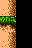

Something is wrong: 


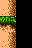

Something is wrong: 


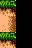

Something is wrong: 


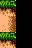

Something is wrong: 


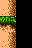

Something is wrong: 


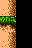

Something is wrong: 


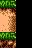

Something is wrong: 


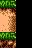

Something is wrong: 


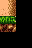

Something is wrong: 


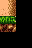

Something is wrong: 


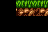

Something is wrong: 


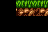

Something is wrong: 


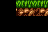

Something is wrong: 


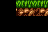

Something is wrong: 


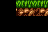

Something is wrong: 


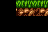

Something is wrong: 


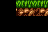

Something is wrong: 


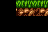

Something is wrong: 


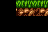

Something is wrong: 


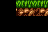

Something is wrong: 


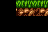

Something is wrong: 


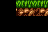

Something is wrong: 


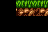

Something is wrong: 


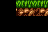

Something is wrong: 


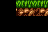

Something is wrong: 


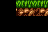

Something is wrong: 


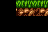

Something is wrong: 


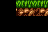

Something is wrong: 


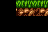

Something is wrong: 


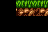

Something is wrong: 


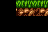

Something is wrong: 


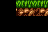

Something is wrong: 


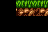

Something is wrong: 


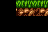

Something is wrong: 


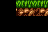

Something is wrong: 


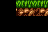

Something is wrong: 


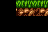

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_28
Something is wrong: 


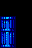

Something is wrong: 


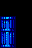

Something is wrong: 


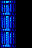

Something is wrong: 


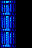

Something is wrong: 


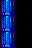

Something is wrong: 


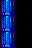

Something is wrong: 


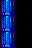

Something is wrong: 


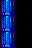

Something is wrong: 


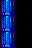

Something is wrong: 


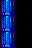

Something is wrong: 


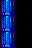

Something is wrong: 


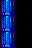

Something is wrong: 


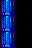

Something is wrong: 


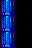

Something is wrong: 


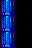

Something is wrong: 


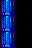

Something is wrong: 


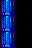

Something is wrong: 


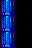

Something is wrong: 


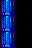

Something is wrong: 


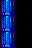

Something is wrong: 


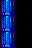

Something is wrong: 


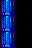

Something is wrong: 


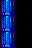

Something is wrong: 


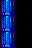

Something is wrong: 


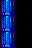

Something is wrong: 


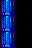

Something is wrong: 


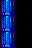

Something is wrong: 


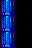

Something is wrong: 


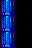

Something is wrong: 


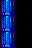

Something is wrong: 


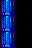

Something is wrong: 


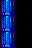

Something is wrong: 


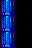

Something is wrong: 


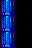

Something is wrong: 


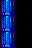

Something is wrong: 


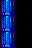

Something is wrong: 


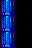

Something is wrong: 


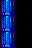

Something is wrong: 


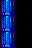

Something is wrong: 


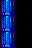

Something is wrong: 


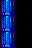

Something is wrong: 


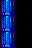

Something is wrong: 


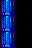

Something is wrong: 


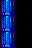

Something is wrong: 


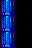

Something is wrong: 


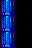

Something is wrong: 


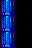

Something is wrong: 


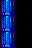

Something is wrong: 


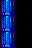

Something is wrong: 


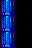

Something is wrong: 


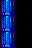

Something is wrong: 


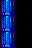

Something is wrong: 


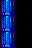

Something is wrong: 


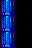

Something is wrong: 


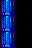

Something is wrong: 


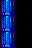

Something is wrong: 


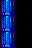

Something is wrong: 


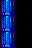

Something is wrong: 


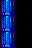

Something is wrong: 


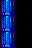

Something is wrong: 


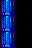

Something is wrong: 


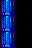

Something is wrong: 


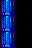

Something is wrong: 


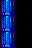

Something is wrong: 


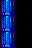

Something is wrong: 


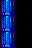

Something is wrong: 


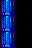

Something is wrong: 


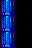

Something is wrong: 


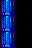

Something is wrong: 


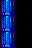

Something is wrong: 


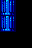

Something is wrong: 


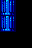

Something is wrong: 


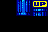

Something is wrong: 


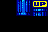

Something is wrong: 


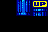

Something is wrong: 


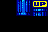

Something is wrong: 


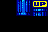

Something is wrong: 


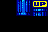

Something is wrong: 


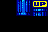

Something is wrong: 


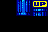

Something is wrong: 


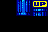

Something is wrong: 


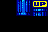

Something is wrong: 


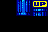

Something is wrong: 


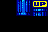

Something is wrong: 


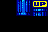

Something is wrong: 


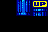

Something is wrong: 


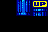

Something is wrong: 


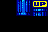

Something is wrong: 


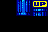

Something is wrong: 


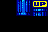

Something is wrong: 


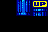

Something is wrong: 


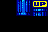

Something is wrong: 


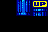

Something is wrong: 


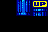

Something is wrong: 


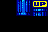

Something is wrong: 


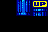

Something is wrong: 


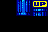

Something is wrong: 


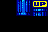

Something is wrong: 


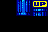

Something is wrong: 


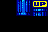

Something is wrong: 


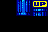

Something is wrong: 


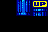

Something is wrong: 


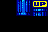

Something is wrong: 


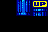

Something is wrong: 


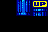

Something is wrong: 


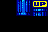

Something is wrong: 


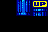

Something is wrong: 


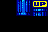

Something is wrong: 


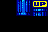

Something is wrong: 


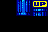

Something is wrong: 


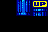

Something is wrong: 


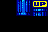

Something is wrong: 


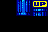

Something is wrong: 


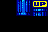

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_46
Something is wrong: 


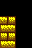

Something is wrong: 


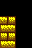

Something is wrong: 


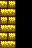

Something is wrong: 


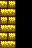

Something is wrong: 


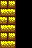

Something is wrong: 


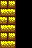

Something is wrong: 


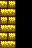

Something is wrong: 


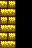

Something is wrong: 


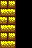

Something is wrong: 


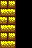

Something is wrong: 


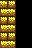

Something is wrong: 


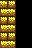

Something is wrong: 


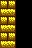

Something is wrong: 


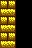

Something is wrong: 


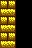

Something is wrong: 


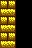

Something is wrong: 


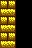

Something is wrong: 


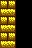

Something is wrong: 


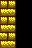

Something is wrong: 


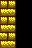

Something is wrong: 


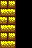

Something is wrong: 


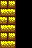

Something is wrong: 


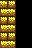

Something is wrong: 


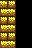

Something is wrong: 


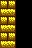

Something is wrong: 


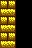

Something is wrong: 


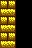

Something is wrong: 


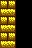

Something is wrong: 


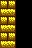

Something is wrong: 


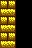

Something is wrong: 


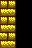

Something is wrong: 


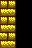

Something is wrong: 


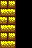

Something is wrong: 


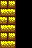

Something is wrong: 


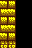

Something is wrong: 


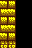

Something is wrong: 


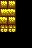

Something is wrong: 


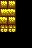

Something is wrong: 


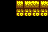

Something is wrong: 


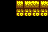

Something is wrong: 


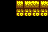

Something is wrong: 


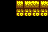

Something is wrong: 


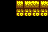

Something is wrong: 


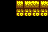

Something is wrong: 


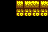

Something is wrong: 


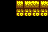

Something is wrong: 


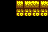

Something is wrong: 


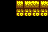

Something is wrong: 


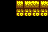

Something is wrong: 


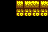

Something is wrong: 


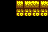

Something is wrong: 


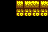

Something is wrong: 


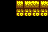

Something is wrong: 


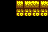

Something is wrong: 


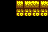

Something is wrong: 


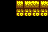

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_34
Something is wrong: 


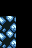

Something is wrong: 


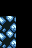

Something is wrong: 


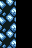

Something is wrong: 


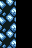

Something is wrong: 


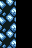

Something is wrong: 


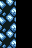

Something is wrong: 


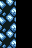

Something is wrong: 


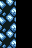

Something is wrong: 


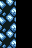

Something is wrong: 


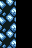

Something is wrong: 


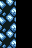

Something is wrong: 


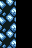

Something is wrong: 


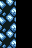

Something is wrong: 


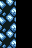

Something is wrong: 


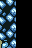

Something is wrong: 


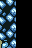

Something is wrong: 


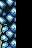

Something is wrong: 


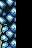

Something is wrong: 


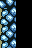

Something is wrong: 


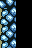

Something is wrong: 


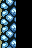

Something is wrong: 


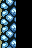

Something is wrong: 


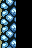

Something is wrong: 


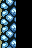

Something is wrong: 


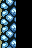

Something is wrong: 


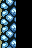

Something is wrong: 


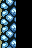

Something is wrong: 


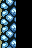

Something is wrong: 


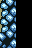

Something is wrong: 


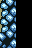

Something is wrong: 


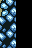

Something is wrong: 


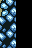

Something is wrong: 


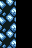

Something is wrong: 


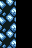

Something is wrong: 


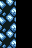

Something is wrong: 


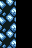

Something is wrong: 


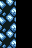

Something is wrong: 


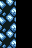

Something is wrong: 


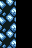

Something is wrong: 


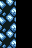

Something is wrong: 


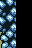

Something is wrong: 


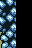

Something is wrong: 


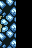

Something is wrong: 


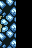

Something is wrong: 


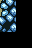

Something is wrong: 


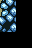

Something is wrong: 


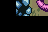

Something is wrong: 


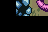

Something is wrong: 


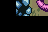

Something is wrong: 


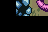

Something is wrong: 


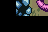

Something is wrong: 


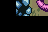

Something is wrong: 


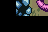

Something is wrong: 


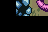

Something is wrong: 


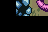

Something is wrong: 


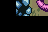

Something is wrong: 


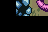

Something is wrong: 


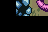

Something is wrong: 


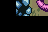

Something is wrong: 


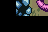

Something is wrong: 


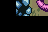

Something is wrong: 


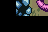

Something is wrong: 


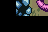

Something is wrong: 


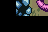

Something is wrong: 


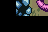

Something is wrong: 


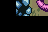

Something is wrong: 


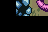

Something is wrong: 


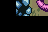

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_38
Something is wrong: 


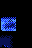

Something is wrong: 


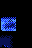

Something is wrong: 


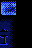

Something is wrong: 


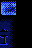

Something is wrong: 


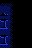

Something is wrong: 


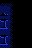

Something is wrong: 


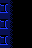

Something is wrong: 


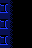

Something is wrong: 


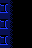

Something is wrong: 


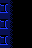

Something is wrong: 


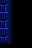

Something is wrong: 


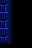

Something is wrong: 


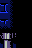

Something is wrong: 


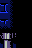

Something is wrong: 


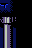

Something is wrong: 


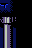

Something is wrong: 


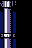

Something is wrong: 


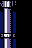

Something is wrong: 


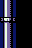

Something is wrong: 


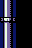

Something is wrong: 


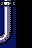

Something is wrong: 


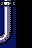

Something is wrong: 


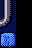

Something is wrong: 


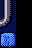

Something is wrong: 


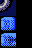

Something is wrong: 


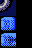

Something is wrong: 


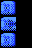

Something is wrong: 


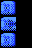

Something is wrong: 


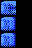

Something is wrong: 


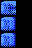

Something is wrong: 


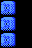

Something is wrong: 


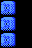

Something is wrong: 


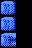

Something is wrong: 


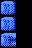

Something is wrong: 


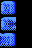

Something is wrong: 


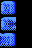

Something is wrong: 


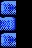

Something is wrong: 


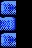

Something is wrong: 


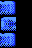

Something is wrong: 


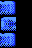

Something is wrong: 


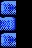

Something is wrong: 


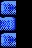

Something is wrong: 


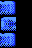

Something is wrong: 


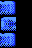

Something is wrong: 


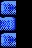

Something is wrong: 


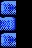

Something is wrong: 


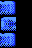

Something is wrong: 


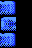

Something is wrong: 


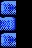

Something is wrong: 


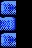

Something is wrong: 


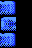

Something is wrong: 


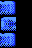

Something is wrong: 


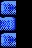

Something is wrong: 


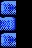

Something is wrong: 


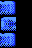

Something is wrong: 


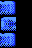

Something is wrong: 


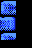

Something is wrong: 


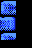

Something is wrong: 


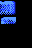

Something is wrong: 


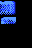

Something is wrong: 


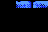

Something is wrong: 


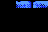

Something is wrong: 


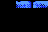

Something is wrong: 


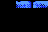

Something is wrong: 


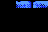

Something is wrong: 


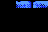

Something is wrong: 


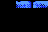

Something is wrong: 


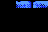

Something is wrong: 


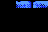

Something is wrong: 


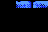

Something is wrong: 


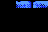

Something is wrong: 


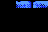

Something is wrong: 


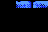

Something is wrong: 


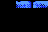

Something is wrong: 


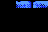

Something is wrong: 


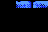

Something is wrong: 


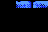

Something is wrong: 


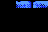

Something is wrong: 


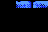

Something is wrong: 


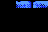

Something is wrong: 


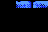

Something is wrong: 


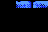

Something is wrong: 


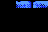

Something is wrong: 


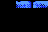

Something is wrong: 


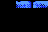

Something is wrong: 


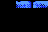

Something is wrong: 


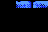

Something is wrong: 


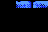

Something is wrong: 


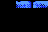

Something is wrong: 


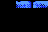

Something is wrong: 


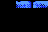

Something is wrong: 


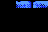

Something is wrong: 


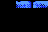

Something is wrong: 


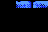

Something is wrong: 


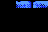

Something is wrong: 


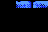

Something is wrong: 


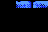

Something is wrong: 


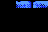

Something is wrong: 


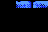

Something is wrong: 


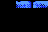

Something is wrong: 


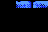

Something is wrong: 


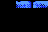

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_3
Something is wrong: 


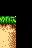

Something is wrong: 


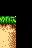

Something is wrong: 


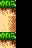

Something is wrong: 


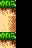

Something is wrong: 


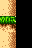

Something is wrong: 


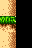

Something is wrong: 


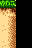

Something is wrong: 


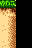

Something is wrong: 


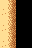

Something is wrong: 


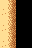

Something is wrong: 


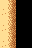

Something is wrong: 


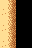

Something is wrong: 


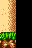

Something is wrong: 


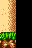

Something is wrong: 


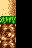

Something is wrong: 


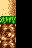

Something is wrong: 


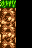

Something is wrong: 


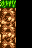

Something is wrong: 


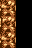

Something is wrong: 


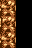

Something is wrong: 


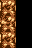

Something is wrong: 


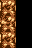

Something is wrong: 


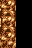

Something is wrong: 


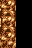

Something is wrong: 


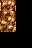

Something is wrong: 


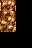

Something is wrong: 


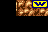

Something is wrong: 


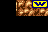

Something is wrong: 


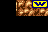

Something is wrong: 


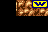

Something is wrong: 


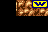

Something is wrong: 


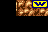

Something is wrong: 


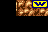

Something is wrong: 


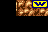

Something is wrong: 


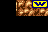

Something is wrong: 


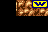

Something is wrong: 


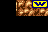

Something is wrong: 


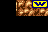

Something is wrong: 


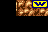

Something is wrong: 


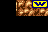

Something is wrong: 


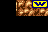

Something is wrong: 


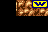

Something is wrong: 


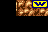

Something is wrong: 


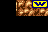

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_30
Something is wrong: 


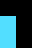

Something is wrong: 


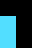

Something is wrong: 


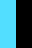

Something is wrong: 


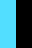

Something is wrong: 


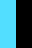

Something is wrong: 


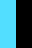

Something is wrong: 


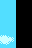

Something is wrong: 


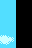

Something is wrong: 


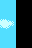

Something is wrong: 


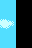

Something is wrong: 


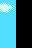

Something is wrong: 


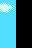

Something is wrong: 


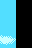

Something is wrong: 


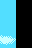

Something is wrong: 


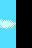

Something is wrong: 


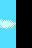

Something is wrong: 


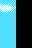

Something is wrong: 


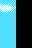

Something is wrong: 


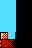

Something is wrong: 


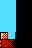

Something is wrong: 


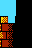

Something is wrong: 


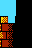

Something is wrong: 


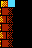

Something is wrong: 


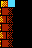

Something is wrong: 


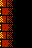

Something is wrong: 


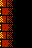

Something is wrong: 


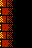

Something is wrong: 


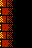

Something is wrong: 


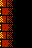

Something is wrong: 


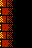

Something is wrong: 


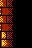

Something is wrong: 


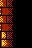

Something is wrong: 


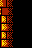

Something is wrong: 


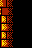

Something is wrong: 


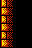

Something is wrong: 


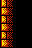

Something is wrong: 


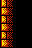

Something is wrong: 


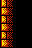

Something is wrong: 


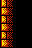

Something is wrong: 


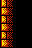

Something is wrong: 


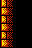

Something is wrong: 


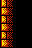

Something is wrong: 


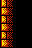

Something is wrong: 


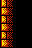

Something is wrong: 


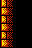

Something is wrong: 


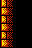

Something is wrong: 


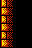

Something is wrong: 


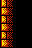

Something is wrong: 


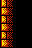

Something is wrong: 


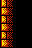

Something is wrong: 


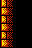

Something is wrong: 


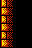

Something is wrong: 


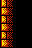

Something is wrong: 


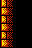

Something is wrong: 


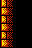

Something is wrong: 


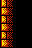

Something is wrong: 


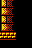

Something is wrong: 


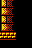

Something is wrong: 


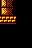

Something is wrong: 


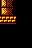

Something is wrong: 


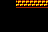

Something is wrong: 


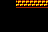

Something is wrong: 


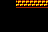

Something is wrong: 


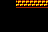

Something is wrong: 


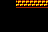

Something is wrong: 


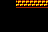

Something is wrong: 


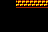

Something is wrong: 


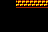

Something is wrong: 


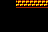

Something is wrong: 


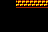

Something is wrong: 


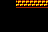

Something is wrong: 


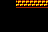

Something is wrong: 


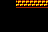

Something is wrong: 


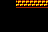

Something is wrong: 


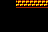

Something is wrong: 


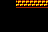

Something is wrong: 


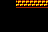

Something is wrong: 


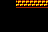

Something is wrong: 


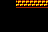

Something is wrong: 


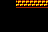

Something is wrong: 


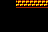

Something is wrong: 


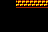

Something is wrong: 


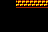

Something is wrong: 


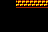

Something is wrong: 


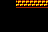

Something is wrong: 


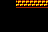

Something is wrong: 


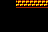

Something is wrong: 


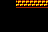

Something is wrong: 


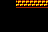

Something is wrong: 


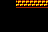

Something is wrong: 


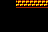

Something is wrong: 


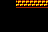

Something is wrong: 


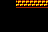

Something is wrong: 


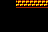

Something is wrong: 


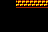

Something is wrong: 


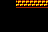

Something is wrong: 


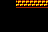

Something is wrong: 


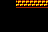

Something is wrong: 


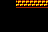

Something is wrong: 


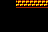

Something is wrong: 


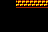

Something is wrong: 


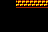

Something is wrong: 


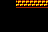

Something is wrong: 


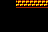

Something is wrong: 


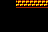

Something is wrong: 


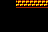

Something is wrong: 


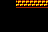

Something is wrong: 


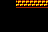

Something is wrong: 


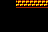

Something is wrong: 


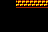

Something is wrong: 


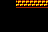

Something is wrong: 


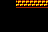

Something is wrong: 


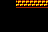

Something is wrong: 


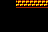

Something is wrong: 


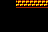

Something is wrong: 


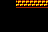

Something is wrong: 


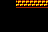

Something is wrong: 


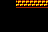

Something is wrong: 


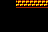

Something is wrong: 


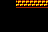

Something is wrong: 


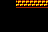

Something is wrong: 


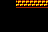

Something is wrong: 


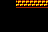

Something is wrong: 


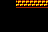

Something is wrong: 


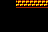

Something is wrong: 


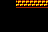

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_19
Something is wrong: 


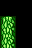

Something is wrong: 


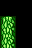

Something is wrong: 


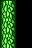

Something is wrong: 


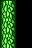

Something is wrong: 


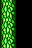

Something is wrong: 


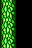

Something is wrong: 


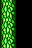

Something is wrong: 


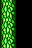

Something is wrong: 


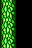

Something is wrong: 


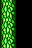

Something is wrong: 


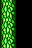

Something is wrong: 


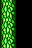

Something is wrong: 


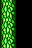

Something is wrong: 


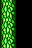

Something is wrong: 


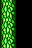

Something is wrong: 


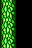

Something is wrong: 


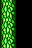

Something is wrong: 


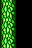

Something is wrong: 


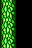

Something is wrong: 


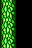

Something is wrong: 


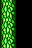

Something is wrong: 


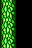

Something is wrong: 


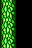

Something is wrong: 


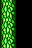

Something is wrong: 


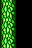

Something is wrong: 


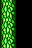

Something is wrong: 


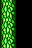

Something is wrong: 


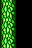

Something is wrong: 


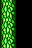

Something is wrong: 


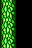

Something is wrong: 


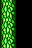

Something is wrong: 


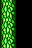

Something is wrong: 


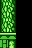

Something is wrong: 


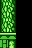

Something is wrong: 


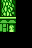

Something is wrong: 


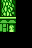

Something is wrong: 


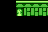

Something is wrong: 


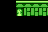

Something is wrong: 


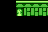

Something is wrong: 


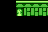

Something is wrong: 


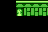

Something is wrong: 


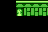

Something is wrong: 


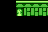

Something is wrong: 


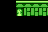

Something is wrong: 


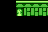

Something is wrong: 


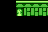

Something is wrong: 


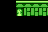

Something is wrong: 


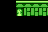

Something is wrong: 


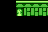

Something is wrong: 


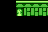

Something is wrong: 


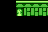

Something is wrong: 


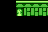

Something is wrong: 


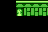

Something is wrong: 


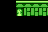

Something is wrong: 


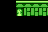

Something is wrong: 


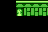

Something is wrong: 


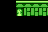

Something is wrong: 


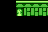

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_29
Something is wrong: 


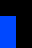

Something is wrong: 


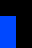

Something is wrong: 


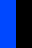

Something is wrong: 


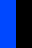

Something is wrong: 


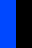

Something is wrong: 


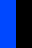

Something is wrong: 


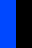

Something is wrong: 


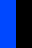

Something is wrong: 


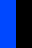

Something is wrong: 


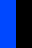

Something is wrong: 


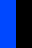

Something is wrong: 


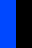

Something is wrong: 


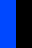

Something is wrong: 


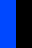

Something is wrong: 


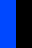

Something is wrong: 


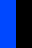

Something is wrong: 


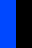

Something is wrong: 


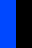

Something is wrong: 


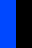

Something is wrong: 


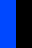

Something is wrong: 


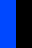

Something is wrong: 


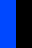

Something is wrong: 


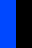

Something is wrong: 


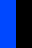

Something is wrong: 


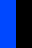

Something is wrong: 


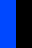

Something is wrong: 


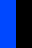

Something is wrong: 


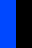

Something is wrong: 


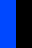

Something is wrong: 


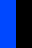

Something is wrong: 


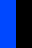

Something is wrong: 


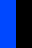

Something is wrong: 


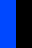

Something is wrong: 


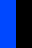

Something is wrong: 


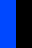

Something is wrong: 


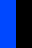

Something is wrong: 


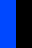

Something is wrong: 


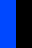

Something is wrong: 


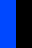

Something is wrong: 


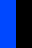

Something is wrong: 


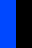

Something is wrong: 


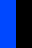

Something is wrong: 


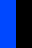

Something is wrong: 


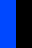

Something is wrong: 


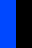

Something is wrong: 


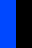

Something is wrong: 


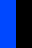

Something is wrong: 


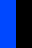

Something is wrong: 


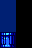

Something is wrong: 


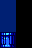

Something is wrong: 


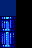

Something is wrong: 


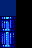

Something is wrong: 


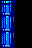

Something is wrong: 


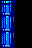

Something is wrong: 


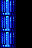

Something is wrong: 


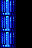

Something is wrong: 


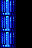

Something is wrong: 


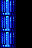

Something is wrong: 


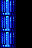

Something is wrong: 


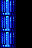

Something is wrong: 


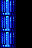

Something is wrong: 


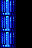

Something is wrong: 


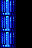

Something is wrong: 


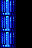

Something is wrong: 


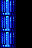

Something is wrong: 


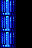

Something is wrong: 


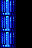

Something is wrong: 


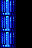

Something is wrong: 


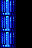

Something is wrong: 


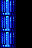

Something is wrong: 


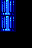

Something is wrong: 


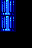

Something is wrong: 


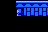

Something is wrong: 


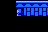

Something is wrong: 


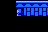

Something is wrong: 


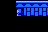

Something is wrong: 


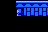

Something is wrong: 


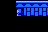

Something is wrong: 


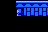

Something is wrong: 


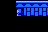

Something is wrong: 


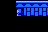

Something is wrong: 


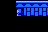

Something is wrong: 


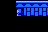

Something is wrong: 


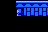

Something is wrong: 


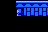

Something is wrong: 


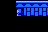

Something is wrong: 


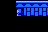

Something is wrong: 


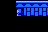

Something is wrong: 


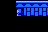

Something is wrong: 


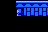

Something is wrong: 


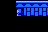

Something is wrong: 


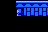

Something is wrong: 


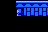

Something is wrong: 


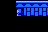

Something is wrong: 


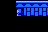

Something is wrong: 


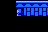

Something is wrong: 


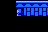

Something is wrong: 


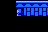

Something is wrong: 


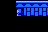

Something is wrong: 


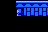

Something is wrong: 


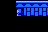

Something is wrong: 


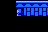

Something is wrong: 


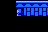

Something is wrong: 


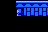

Something is wrong: 


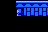

Something is wrong: 


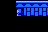

Something is wrong: 


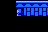

Something is wrong: 


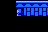

Something is wrong: 


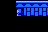

Something is wrong: 


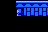

Something is wrong: 


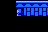

Something is wrong: 


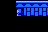

Something is wrong: 


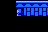

Something is wrong: 


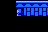

Something is wrong: 


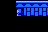

Something is wrong: 


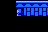

Something is wrong: 


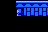

Something is wrong: 


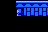

Something is wrong: 


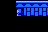

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_14
Something is wrong: 


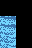

Something is wrong: 


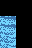

Something is wrong: 


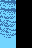

Something is wrong: 


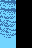

Something is wrong: 


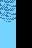

Something is wrong: 


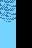

Something is wrong: 


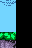

Something is wrong: 


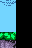

Something is wrong: 


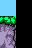

Something is wrong: 


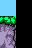

Something is wrong: 


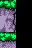

Something is wrong: 


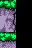

Something is wrong: 


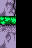

Something is wrong: 


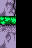

Something is wrong: 


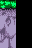

Something is wrong: 


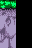

Something is wrong: 


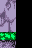

Something is wrong: 


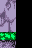

Something is wrong: 


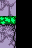

Something is wrong: 


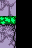

Something is wrong: 


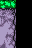

Something is wrong: 


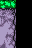

Something is wrong: 


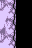

Something is wrong: 


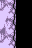

Something is wrong: 


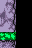

Something is wrong: 


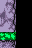

Something is wrong: 


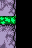

Something is wrong: 


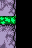

Something is wrong: 


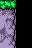

Something is wrong: 


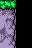

Something is wrong: 


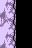

Something is wrong: 


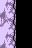

Something is wrong: 


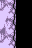

Something is wrong: 


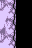

Something is wrong: 


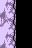

Something is wrong: 


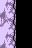

Something is wrong: 


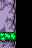

Something is wrong: 


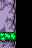

Something is wrong: 


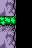

Something is wrong: 


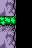

Something is wrong: 


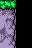

Something is wrong: 


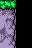

Something is wrong: 


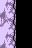

Something is wrong: 


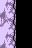

Something is wrong: 


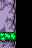

Something is wrong: 


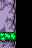

Something is wrong: 


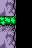

Something is wrong: 


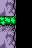

Something is wrong: 


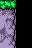

Something is wrong: 


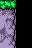

Something is wrong: 


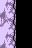

Something is wrong: 


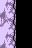

Something is wrong: 


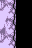

Something is wrong: 


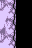

Something is wrong: 


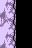

Something is wrong: 


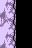

Something is wrong: 


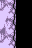

Something is wrong: 


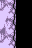

Something is wrong: 


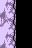

Something is wrong: 


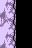

Something is wrong: 


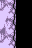

Something is wrong: 


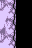

Something is wrong: 


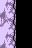

Something is wrong: 


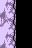

Something is wrong: 


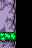

Something is wrong: 


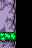

Something is wrong: 


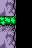

Something is wrong: 


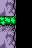

Something is wrong: 


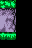

Something is wrong: 


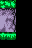

Something is wrong: 


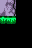

Something is wrong: 


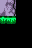

Something is wrong: 


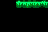

Something is wrong: 


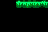

Something is wrong: 


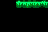

Something is wrong: 


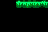

Something is wrong: 


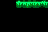

Something is wrong: 


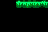

Something is wrong: 


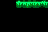

Something is wrong: 


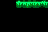

Something is wrong: 


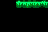

Something is wrong: 


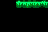

Something is wrong: 


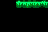

Something is wrong: 


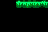

Something is wrong: 


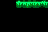

Something is wrong: 


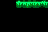

Something is wrong: 


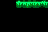

Something is wrong: 


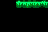

Something is wrong: 


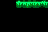

Something is wrong: 


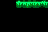

Something is wrong: 


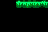

Something is wrong: 


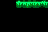

Something is wrong: 


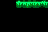

Something is wrong: 


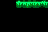

Something is wrong: 


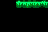

Something is wrong: 


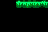

Something is wrong: 


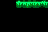

Something is wrong: 


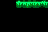

Something is wrong: 


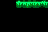

Something is wrong: 


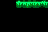

Something is wrong: 


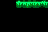

Something is wrong: 


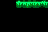

Something is wrong: 


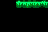

Something is wrong: 


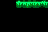

Something is wrong: 


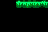

Something is wrong: 


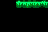

Something is wrong: 


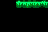

Something is wrong: 


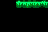

Something is wrong: 


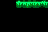

Something is wrong: 


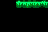

Something is wrong: 


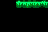

Something is wrong: 


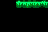

Something is wrong: 


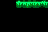

Something is wrong: 


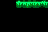

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_0_4
Something is wrong: 


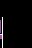

Something is wrong: 


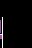

Something is wrong: 


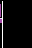

Something is wrong: 


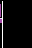

Something is wrong: 


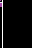

Something is wrong: 


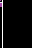

Something is wrong: 


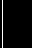

Something is wrong: 


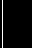

Something is wrong: 


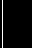

Something is wrong: 


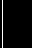

Something is wrong: 


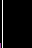

Something is wrong: 


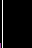

Something is wrong: 


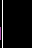

Something is wrong: 


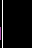

Something is wrong: 


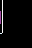

Something is wrong: 


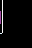

Something is wrong: 


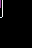

Something is wrong: 


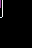

Something is wrong: 


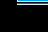

Something is wrong: 


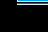

Something is wrong: 


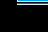

Something is wrong: 


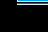

Something is wrong: 


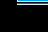

Something is wrong: 


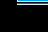

Something is wrong: 


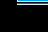

Something is wrong: 


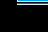

Something is wrong: 


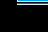

Something is wrong: 


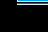

Something is wrong: 


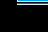

Something is wrong: 


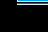

Something is wrong: 


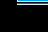

Something is wrong: 


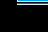

Something is wrong: 


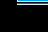

Something is wrong: 


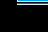

Something is wrong: 


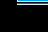

Something is wrong: 


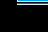

Something is wrong: 


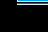

Something is wrong: 


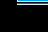

Something is wrong: 


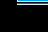

Something is wrong: 


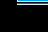

Something is wrong: 


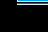

Something is wrong: 


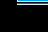

Something is wrong: 


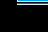

Something is wrong: 


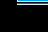

Something is wrong: 


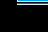

Something is wrong: 


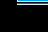

Something is wrong: 


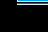

Something is wrong: 


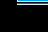

Something is wrong: 


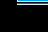

Something is wrong: 


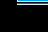

Something is wrong: 


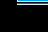

Something is wrong: 


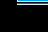

Something is wrong: 


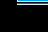

Something is wrong: 


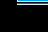

Something is wrong: 


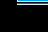

Something is wrong: 


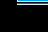

Something is wrong: 


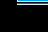

Something is wrong: 


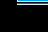

Something is wrong: 


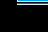

Something is wrong: 


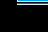

Something is wrong: 


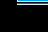

Something is wrong: 


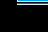

Something is wrong: 


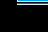

Something is wrong: 


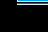

Something is wrong: 


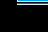

Something is wrong: 


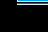

Something is wrong: 


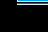

Something is wrong: 


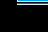

Something is wrong: 


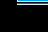

Something is wrong: 


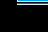

Something is wrong: 


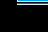

Something is wrong: 


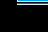

Something is wrong: 


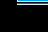

Something is wrong: 


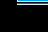

Something is wrong: 


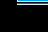

Something is wrong: 


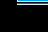

Something is wrong: 


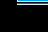

Something is wrong: 


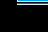

Something is wrong: 


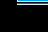

Something is wrong: 


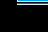

Something is wrong: 


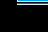

Something is wrong: 


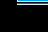

Something is wrong: 


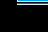

Something is wrong: 


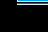

Something is wrong: 


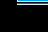

Something is wrong: 


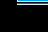

Something is wrong: 


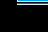

Something is wrong: 


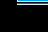

Something is wrong: 


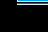

Something is wrong: 


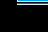

Something is wrong: 


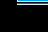

Something is wrong: 


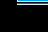

Something is wrong: 


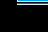

Something is wrong: 


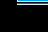

Something is wrong: 


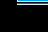

Something is wrong: 


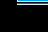

Something is wrong: 


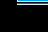

Something is wrong: 


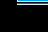

Something is wrong: 


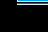

Something is wrong: 


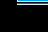

Something is wrong: 


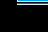

Something is wrong: 


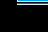

Something is wrong: 


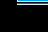

Something is wrong: 


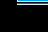

Something is wrong: 


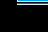

Something is wrong: 


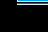

Something is wrong: 


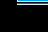

Something is wrong: 


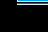

Something is wrong: 


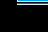

Something is wrong: 


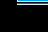

Something is wrong: 


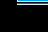

Something is wrong: 


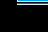

Something is wrong: 


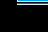

Something is wrong: 


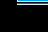

Something is wrong: 


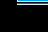

Something is wrong: 


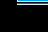

Something is wrong: 


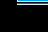

Something is wrong: 


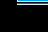

Something is wrong: 


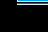

Something is wrong: 


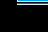

Something is wrong: 


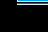

Something is wrong: 


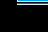

Something is wrong: 


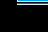

Something is wrong: 


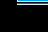

Something is wrong: 


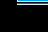

Something is wrong: 


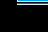

Something is wrong: 


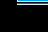

Something is wrong: 


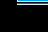

Something is wrong: 


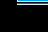

Something is wrong: 


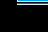

Something is wrong: 


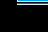

Something is wrong: 


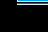

Something is wrong: 


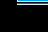

Something is wrong: 


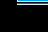

Something is wrong: 


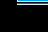

Something is wrong: 


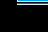

Something is wrong: 


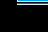

Something is wrong: 


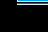

Something is wrong: 


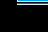

Something is wrong: 


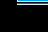

Something is wrong: 


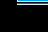

Something is wrong: 


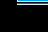

Something is wrong: 


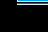

Something is wrong: 


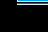

Something is wrong: 


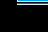

Something is wrong: 


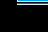

Something is wrong: 


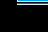

Something is wrong: 


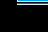

Something is wrong: 


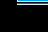

Something is wrong: 


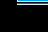

Something is wrong: 


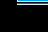

Something is wrong: 


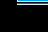

Something is wrong: 


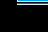

Something is wrong: 


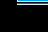

Something is wrong: 


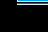

Something is wrong: 


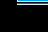

Something is wrong: 


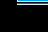

Something is wrong: 


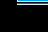

Something is wrong: 


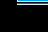

Something is wrong: 


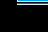

Something is wrong: 


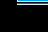

Something is wrong: 


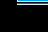

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_0_10
Something is wrong: 


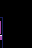

Something is wrong: 


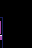

Something is wrong: 


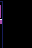

Something is wrong: 


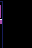

Something is wrong: 


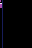

Something is wrong: 


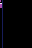

Something is wrong: 


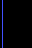

Something is wrong: 


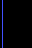

Something is wrong: 


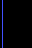

Something is wrong: 


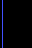

Something is wrong: 


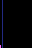

Something is wrong: 


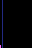

Something is wrong: 


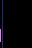

Something is wrong: 


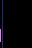

Something is wrong: 


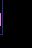

Something is wrong: 


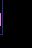

Something is wrong: 


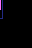

Something is wrong: 


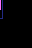

Something is wrong: 


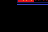

Something is wrong: 


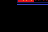

Something is wrong: 


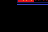

Something is wrong: 


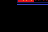

Something is wrong: 


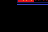

Something is wrong: 


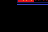

Something is wrong: 


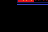

Something is wrong: 


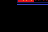

Something is wrong: 


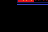

Something is wrong: 


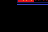

Something is wrong: 


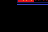

Something is wrong: 


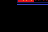

Something is wrong: 


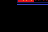

Something is wrong: 


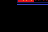

Something is wrong: 


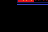

Something is wrong: 


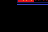

Something is wrong: 


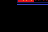

Something is wrong: 


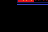

Something is wrong: 


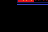

Something is wrong: 


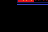

Something is wrong: 


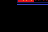

Something is wrong: 


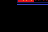

Something is wrong: 


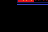

Something is wrong: 


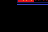

Something is wrong: 


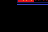

Something is wrong: 


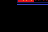

Something is wrong: 


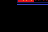

Something is wrong: 


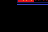

Something is wrong: 


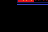

Something is wrong: 


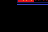

Something is wrong: 


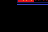

Something is wrong: 


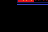

Something is wrong: 


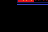

Something is wrong: 


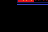

Something is wrong: 


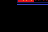

Something is wrong: 


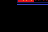

Something is wrong: 


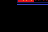

Something is wrong: 


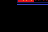

Something is wrong: 


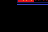

Something is wrong: 


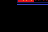

Something is wrong: 


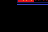

Something is wrong: 


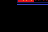

Something is wrong: 


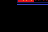

Something is wrong: 


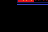

Something is wrong: 


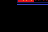

Something is wrong: 


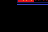

Something is wrong: 


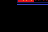

Something is wrong: 


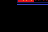

Something is wrong: 


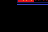

Something is wrong: 


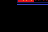

Something is wrong: 


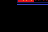

Something is wrong: 


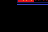

Something is wrong: 


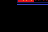

Something is wrong: 


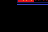

Something is wrong: 


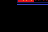

Something is wrong: 


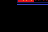

Something is wrong: 


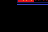

Something is wrong: 


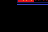

Something is wrong: 


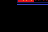

Something is wrong: 


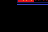

Something is wrong: 


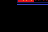

Something is wrong: 


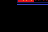

Something is wrong: 


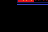

Something is wrong: 


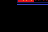

Something is wrong: 


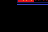

Something is wrong: 


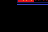

Something is wrong: 


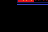

Something is wrong: 


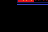

Something is wrong: 


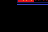

Something is wrong: 


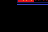

Something is wrong: 


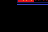

Something is wrong: 


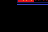

Something is wrong: 


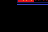

Something is wrong: 


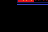

Something is wrong: 


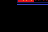

Something is wrong: 


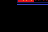

Something is wrong: 


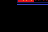

Something is wrong: 


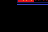

Something is wrong: 


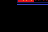

Something is wrong: 


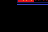

Something is wrong: 


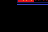

Something is wrong: 


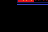

Something is wrong: 


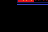

Something is wrong: 


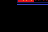

Something is wrong: 


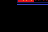

Something is wrong: 


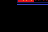

Something is wrong: 


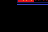

Something is wrong: 


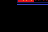

Something is wrong: 


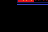

Something is wrong: 


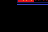

Something is wrong: 


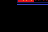

Something is wrong: 


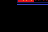

Something is wrong: 


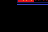

Something is wrong: 


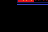

Something is wrong: 


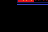

Something is wrong: 


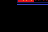

Something is wrong: 


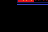

Something is wrong: 


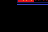

Something is wrong: 


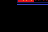

Something is wrong: 


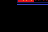

Something is wrong: 


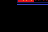

Something is wrong: 


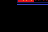

Something is wrong: 


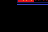

Something is wrong: 


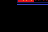

Something is wrong: 


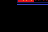

Something is wrong: 


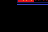

Something is wrong: 


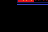

Something is wrong: 


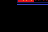

Something is wrong: 


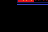

Something is wrong: 


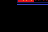

Something is wrong: 


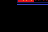

Something is wrong: 


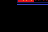

Something is wrong: 


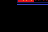

Something is wrong: 


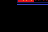

Something is wrong: 


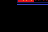

Something is wrong: 


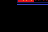

Something is wrong: 


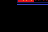

Something is wrong: 


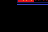

Something is wrong: 


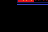

Something is wrong: 


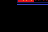

Something is wrong: 


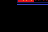

Something is wrong: 


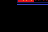

Something is wrong: 


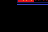

Something is wrong: 


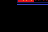

Something is wrong: 


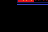

Something is wrong: 


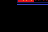

Something is wrong: 


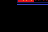

Something is wrong: 


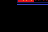

Something is wrong: 


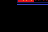

Something is wrong: 


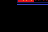

Something is wrong: 


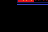

Something is wrong: 


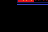

Something is wrong: 


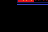

Something is wrong: 


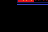

Something is wrong: 


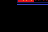

Something is wrong: 


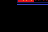

Something is wrong: 


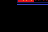

Something is wrong: 


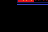

Something is wrong: 


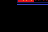

Something is wrong: 


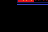

Something is wrong: 


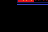

Something is wrong: 


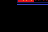

Something is wrong: 


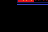

Something is wrong: 


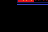

Something is wrong: 


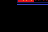

Something is wrong: 


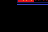

Something is wrong: 


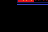

Something is wrong: 


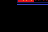

Something is wrong: 


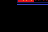

Something is wrong: 


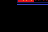

Something is wrong: 


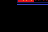

Something is wrong: 


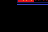

Something is wrong: 


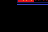

Something is wrong: 


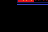

Something is wrong: 


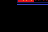

Something is wrong: 


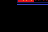

Something is wrong: 


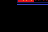

Something is wrong: 


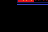

Something is wrong: 


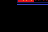

Something is wrong: 


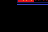

Something is wrong: 


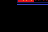

Something is wrong: 


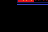

Something is wrong: 


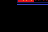

Something is wrong: 


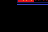

Something is wrong: 


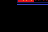

Something is wrong: 


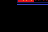

Something is wrong: 


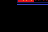

Something is wrong: 


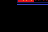

Something is wrong: 


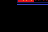

Something is wrong: 


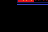

Something is wrong: 


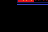

Something is wrong: 


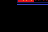

Something is wrong: 


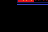

Something is wrong: 


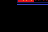

Something is wrong: 


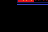

Something is wrong: 


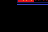

Something is wrong: 


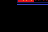

Something is wrong: 


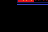

Something is wrong: 


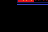

Something is wrong: 


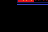

Something is wrong: 


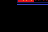

Something is wrong: 


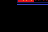

Something is wrong: 


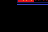

Something is wrong: 


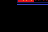

Something is wrong: 


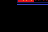

Something is wrong: 


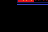

Something is wrong: 


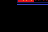

Something is wrong: 


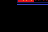

Something is wrong: 


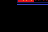

Something is wrong: 


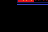

Something is wrong: 


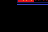

Something is wrong: 


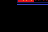

Something is wrong: 


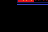

Something is wrong: 


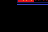

Something is wrong: 


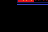

Something is wrong: 


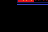

Something is wrong: 


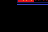

Something is wrong: 


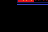

Something is wrong: 


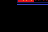

Something is wrong: 


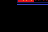

Something is wrong: 


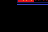

Something is wrong: 


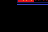

Something is wrong: 


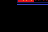

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_0_8
Something is wrong: 


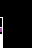

Something is wrong: 


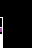

Something is wrong: 


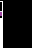

Something is wrong: 


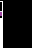

Something is wrong: 


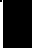

Something is wrong: 


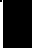

Something is wrong: 


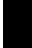

Something is wrong: 


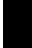

Something is wrong: 


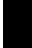

Something is wrong: 


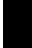

Something is wrong: 


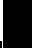

Something is wrong: 


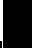

Something is wrong: 


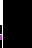

Something is wrong: 


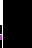

Something is wrong: 


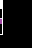

Something is wrong: 


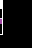

Something is wrong: 


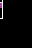

Something is wrong: 


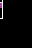

Something is wrong: 


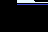

Something is wrong: 


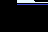

Something is wrong: 


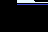

Something is wrong: 


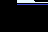

Something is wrong: 


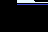

Something is wrong: 


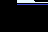

Something is wrong: 


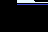

Something is wrong: 


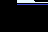

Something is wrong: 


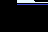

Something is wrong: 


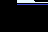

Something is wrong: 


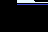

Something is wrong: 


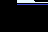

Something is wrong: 


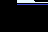

Something is wrong: 


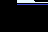

Something is wrong: 


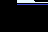

Something is wrong: 


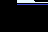

Something is wrong: 


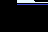

Something is wrong: 


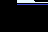

Something is wrong: 


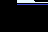

Something is wrong: 


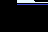

Something is wrong: 


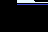

Something is wrong: 


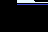

Something is wrong: 


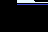

Something is wrong: 


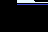

Something is wrong: 


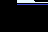

Something is wrong: 


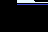

Something is wrong: 


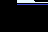

Something is wrong: 


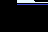

Something is wrong: 


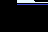

Something is wrong: 


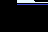

Something is wrong: 


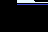

Something is wrong: 


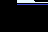

Something is wrong: 


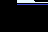

Something is wrong: 


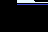

Something is wrong: 


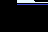

Something is wrong: 


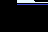

Something is wrong: 


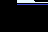

Something is wrong: 


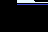

Something is wrong: 


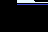

Something is wrong: 


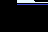

Something is wrong: 


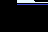

Something is wrong: 


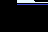

Something is wrong: 


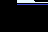

Something is wrong: 


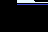

Something is wrong: 


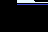

Something is wrong: 


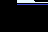

Something is wrong: 


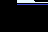

Something is wrong: 


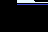

Something is wrong: 


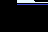

Something is wrong: 


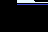

Something is wrong: 


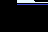

Something is wrong: 


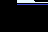

Something is wrong: 


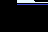

Something is wrong: 


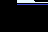

Something is wrong: 


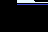

Something is wrong: 


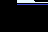

Something is wrong: 


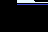

Something is wrong: 


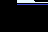

Something is wrong: 


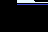

Something is wrong: 


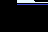

Something is wrong: 


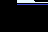

Something is wrong: 


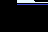

Something is wrong: 


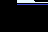

Something is wrong: 


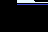

Something is wrong: 


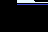

Something is wrong: 


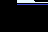

Something is wrong: 


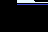

Something is wrong: 


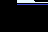

Something is wrong: 


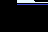

Something is wrong: 


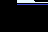

Something is wrong: 


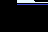

Something is wrong: 


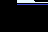

Something is wrong: 


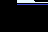

Something is wrong: 


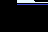

Something is wrong: 


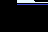

Something is wrong: 


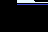

Something is wrong: 


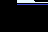

Something is wrong: 


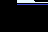

Something is wrong: 


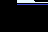

Something is wrong: 


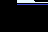

Something is wrong: 


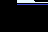

Something is wrong: 


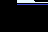

Something is wrong: 


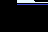

Something is wrong: 


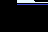

Something is wrong: 


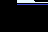

Something is wrong: 


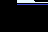

Something is wrong: 


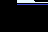

Something is wrong: 


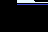

Something is wrong: 


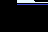

Something is wrong: 


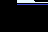

Something is wrong: 


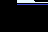

Something is wrong: 


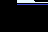

Something is wrong: 


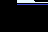

Something is wrong: 


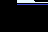

Something is wrong: 


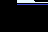

Something is wrong: 


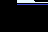

Something is wrong: 


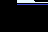

Something is wrong: 


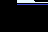

Something is wrong: 


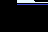

Something is wrong: 


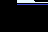

Something is wrong: 


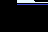

Something is wrong: 


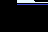

Something is wrong: 


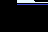

Something is wrong: 


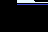

Something is wrong: 


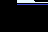

Something is wrong: 


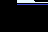

Something is wrong: 


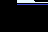

Something is wrong: 


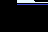

Something is wrong: 


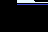

Something is wrong: 


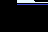

Something is wrong: 


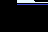

Something is wrong: 


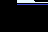

Something is wrong: 


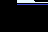

Something is wrong: 


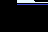

Something is wrong: 


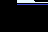

Something is wrong: 


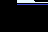

Something is wrong: 


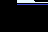

Something is wrong: 


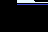

Something is wrong: 


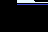

Something is wrong: 


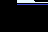

Something is wrong: 


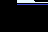

Something is wrong: 


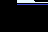

Something is wrong: 


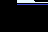

Something is wrong: 


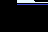

Something is wrong: 


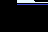

Something is wrong: 


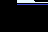

Something is wrong: 


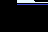

Something is wrong: 


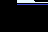

Something is wrong: 


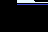

Something is wrong: 


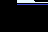

Something is wrong: 


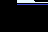

Something is wrong: 


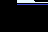

Something is wrong: 


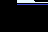

Something is wrong: 


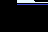

Something is wrong: 


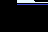

Something is wrong: 


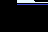

Something is wrong: 


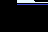

Something is wrong: 


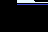

Something is wrong: 


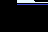

Something is wrong: 


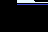

Something is wrong: 


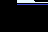

Something is wrong: 


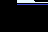

Something is wrong: 


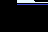

Something is wrong: 


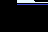

Something is wrong: 


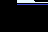

Something is wrong: 


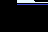

Something is wrong: 


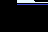

Something is wrong: 


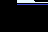

Something is wrong: 


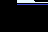

Something is wrong: 


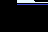

Something is wrong: 


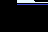

Something is wrong: 


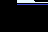

Something is wrong: 


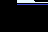

Something is wrong: 


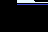

Something is wrong: 


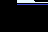

Something is wrong: 


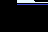

Something is wrong: 


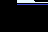

Something is wrong: 


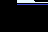

Something is wrong: 


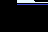

Something is wrong: 


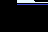

Something is wrong: 


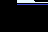

Something is wrong: 


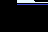

Something is wrong: 


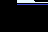

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_51
Something is wrong: 


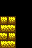

Something is wrong: 


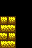

Something is wrong: 


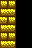

Something is wrong: 


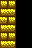

Something is wrong: 


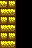

Something is wrong: 


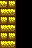

Something is wrong: 


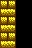

Something is wrong: 


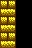

Something is wrong: 


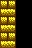

Something is wrong: 


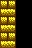

Something is wrong: 


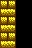

Something is wrong: 


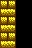

Something is wrong: 


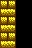

Something is wrong: 


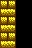

Something is wrong: 


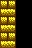

Something is wrong: 


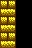

Something is wrong: 


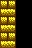

Something is wrong: 


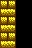

Something is wrong: 


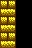

Something is wrong: 


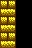

Something is wrong: 


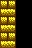

Something is wrong: 


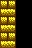

Something is wrong: 


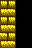

Something is wrong: 


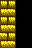

Something is wrong: 


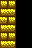

Something is wrong: 


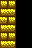

Something is wrong: 


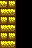

Something is wrong: 


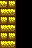

Something is wrong: 


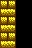

Something is wrong: 


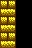

Something is wrong: 


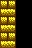

Something is wrong: 


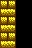

Something is wrong: 


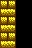

Something is wrong: 


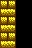

Something is wrong: 


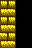

Something is wrong: 


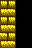

Something is wrong: 


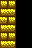

Something is wrong: 


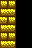

Something is wrong: 


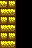

Something is wrong: 


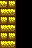

Something is wrong: 


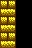

Something is wrong: 


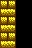

Something is wrong: 


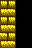

Something is wrong: 


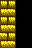

Something is wrong: 


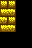

Something is wrong: 


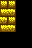

Something is wrong: 


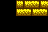

Something is wrong: 


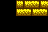

Something is wrong: 


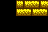

Something is wrong: 


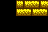

Something is wrong: 


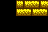

Something is wrong: 


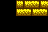

Something is wrong: 


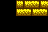

Something is wrong: 


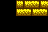

Something is wrong: 


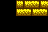

Something is wrong: 


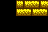

Something is wrong: 


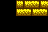

Something is wrong: 


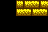

Something is wrong: 


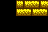

Something is wrong: 


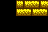

Something is wrong: 


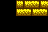

Something is wrong: 


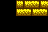

Something is wrong: 


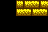

Something is wrong: 


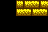

Something is wrong: 


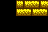

Something is wrong: 


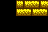

Something is wrong: 


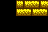

Something is wrong: 


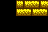

Something is wrong: 


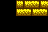

Something is wrong: 


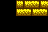

Something is wrong: 


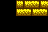

Something is wrong: 


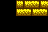

Something is wrong: 


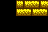

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_15
Something is wrong: 


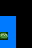

Something is wrong: 


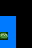

Something is wrong: 


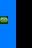

Something is wrong: 


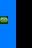

Something is wrong: 


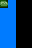

Something is wrong: 


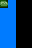

Something is wrong: 


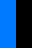

Something is wrong: 


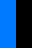

Something is wrong: 


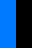

Something is wrong: 


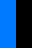

Something is wrong: 


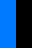

Something is wrong: 


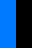

Something is wrong: 


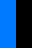

Something is wrong: 


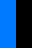

Something is wrong: 


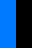

Something is wrong: 


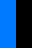

Something is wrong: 


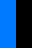

Something is wrong: 


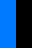

Something is wrong: 


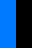

Something is wrong: 


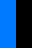

Something is wrong: 


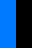

Something is wrong: 


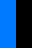

Something is wrong: 


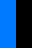

Something is wrong: 


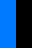

Something is wrong: 


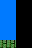

Something is wrong: 


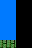

Something is wrong: 


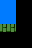

Something is wrong: 


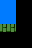

Something is wrong: 


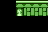

Something is wrong: 


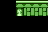

Something is wrong: 


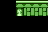

Something is wrong: 


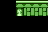

Something is wrong: 


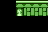

Something is wrong: 


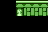

Something is wrong: 


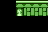

Something is wrong: 


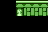

Something is wrong: 


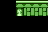

Something is wrong: 


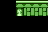

Something is wrong: 


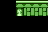

Something is wrong: 


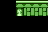

Something is wrong: 


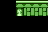

Something is wrong: 


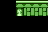

Something is wrong: 


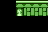

Something is wrong: 


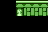

Something is wrong: 


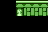

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_47
Something is wrong: 


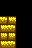

Something is wrong: 


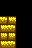

Something is wrong: 


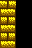

Something is wrong: 


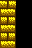

Something is wrong: 


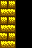

Something is wrong: 


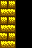

Something is wrong: 


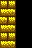

Something is wrong: 


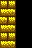

Something is wrong: 


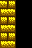

Something is wrong: 


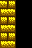

Something is wrong: 


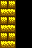

Something is wrong: 


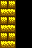

Something is wrong: 


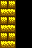

Something is wrong: 


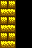

Something is wrong: 


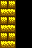

Something is wrong: 


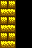

Something is wrong: 


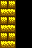

Something is wrong: 


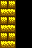

Something is wrong: 


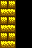

Something is wrong: 


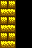

Something is wrong: 


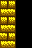

Something is wrong: 


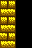

Something is wrong: 


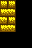

Something is wrong: 


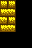

Something is wrong: 


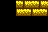

Something is wrong: 


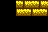

Something is wrong: 


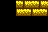

Something is wrong: 


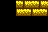

Something is wrong: 


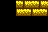

Something is wrong: 


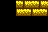

Something is wrong: 


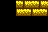

Something is wrong: 


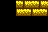

Something is wrong: 


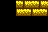

Something is wrong: 


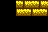

Something is wrong: 


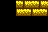

Something is wrong: 


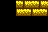

Something is wrong: 


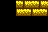

Something is wrong: 


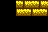

Something is wrong: 


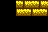

Something is wrong: 


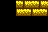

Something is wrong: 


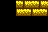

Something is wrong: 


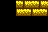

Something is wrong: 


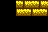

Something is wrong: 


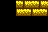

Something is wrong: 


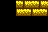

Something is wrong: 


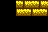

Something is wrong: 


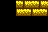

Something is wrong: 


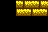

Something is wrong: 


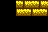

Something is wrong: 


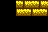

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_0_0
Something is wrong: 


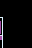

Something is wrong: 


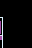

Something is wrong: 


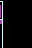

Something is wrong: 


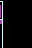

Something is wrong: 


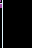

Something is wrong: 


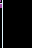

Something is wrong: 


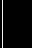

Something is wrong: 


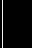

Something is wrong: 


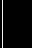

Something is wrong: 


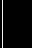

Something is wrong: 


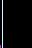

Something is wrong: 


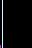

Something is wrong: 


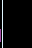

Something is wrong: 


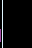

Something is wrong: 


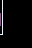

Something is wrong: 


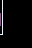

Something is wrong: 


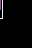

Something is wrong: 


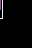

Something is wrong: 


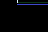

Something is wrong: 


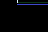

Something is wrong: 


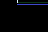

Something is wrong: 


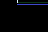

Something is wrong: 


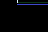

Something is wrong: 


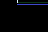

Something is wrong: 


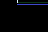

Something is wrong: 


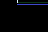

Something is wrong: 


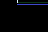

Something is wrong: 


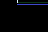

Something is wrong: 


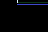

Something is wrong: 


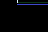

Something is wrong: 


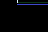

Something is wrong: 


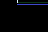

Something is wrong: 


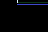

Something is wrong: 


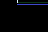

Something is wrong: 


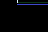

Something is wrong: 


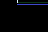

Something is wrong: 


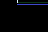

Something is wrong: 


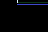

Something is wrong: 


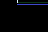

Something is wrong: 


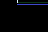

Something is wrong: 


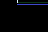

Something is wrong: 


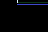

Something is wrong: 


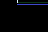

Something is wrong: 


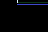

Something is wrong: 


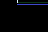

Something is wrong: 


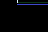

Something is wrong: 


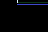

Something is wrong: 


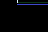

Something is wrong: 


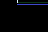

Something is wrong: 


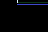

Something is wrong: 


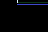

Something is wrong: 


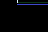

Something is wrong: 


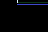

Something is wrong: 


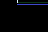

Something is wrong: 


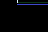

Something is wrong: 


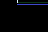

Something is wrong: 


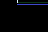

Something is wrong: 


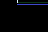

Something is wrong: 


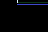

Something is wrong: 


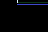

Something is wrong: 


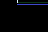

Something is wrong: 


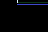

Something is wrong: 


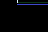

Something is wrong: 


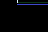

Something is wrong: 


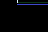

Something is wrong: 


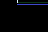

Something is wrong: 


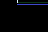

Something is wrong: 


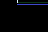

Something is wrong: 


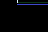

Something is wrong: 


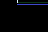

Something is wrong: 


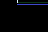

Something is wrong: 


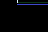

Something is wrong: 


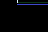

Something is wrong: 


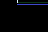

Something is wrong: 


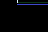

Something is wrong: 


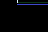

Something is wrong: 


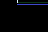

Something is wrong: 


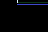

Something is wrong: 


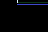

Something is wrong: 


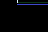

Something is wrong: 


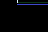

Something is wrong: 


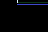

Something is wrong: 


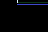

Something is wrong: 


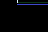

Something is wrong: 


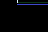

Something is wrong: 


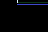

Something is wrong: 


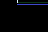

Something is wrong: 


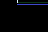

Something is wrong: 


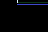

Something is wrong: 


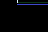

Something is wrong: 


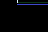

Something is wrong: 


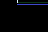

Something is wrong: 


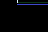

Something is wrong: 


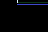

Something is wrong: 


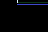

Something is wrong: 


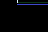

Something is wrong: 


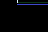

Something is wrong: 


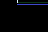

Something is wrong: 


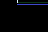

Something is wrong: 


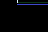

Something is wrong: 


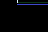

Something is wrong: 


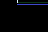

Something is wrong: 


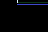

Something is wrong: 


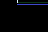

Something is wrong: 


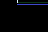

Something is wrong: 


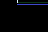

Something is wrong: 


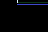

Something is wrong: 


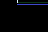

Something is wrong: 


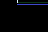

Something is wrong: 


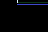

Something is wrong: 


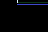

Something is wrong: 


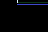

Something is wrong: 


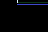

Something is wrong: 


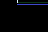

Something is wrong: 


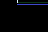

Something is wrong: 


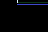

Something is wrong: 


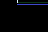

Something is wrong: 


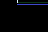

Something is wrong: 


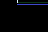

Something is wrong: 


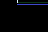

Something is wrong: 


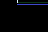

Something is wrong: 


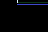

Something is wrong: 


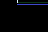

Something is wrong: 


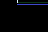

Something is wrong: 


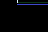

Something is wrong: 


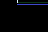

Something is wrong: 


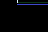

Something is wrong: 


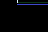

Something is wrong: 


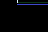

Something is wrong: 


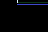

Something is wrong: 


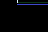

Something is wrong: 


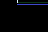

Something is wrong: 


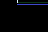

Something is wrong: 


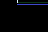

Something is wrong: 


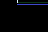

Something is wrong: 


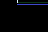

Something is wrong: 


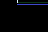

Something is wrong: 


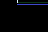

Something is wrong: 


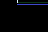

Something is wrong: 


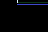

Something is wrong: 


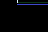

Something is wrong: 


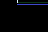

Something is wrong: 


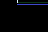

Something is wrong: 


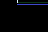

Something is wrong: 


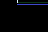

Something is wrong: 


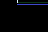

Something is wrong: 


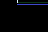

Something is wrong: 


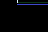

Something is wrong: 


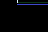

Something is wrong: 


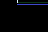

Something is wrong: 


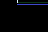

Something is wrong: 


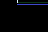

Something is wrong: 


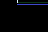

Something is wrong: 


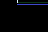

Something is wrong: 


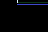

Something is wrong: 


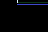

Something is wrong: 


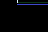

Something is wrong: 


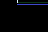

Something is wrong: 


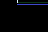

Something is wrong: 


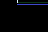

Something is wrong: 


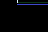

Something is wrong: 


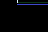

Something is wrong: 


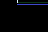

Something is wrong: 


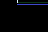

Something is wrong: 


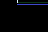

Something is wrong: 


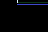

Something is wrong: 


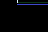

Something is wrong: 


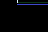

Something is wrong: 


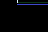

Something is wrong: 


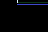

Something is wrong: 


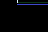

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_1_41
Something is wrong: 


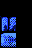

Something is wrong: 


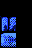

Something is wrong: 


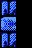

Something is wrong: 


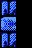

Something is wrong: 


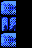

Something is wrong: 


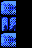

Something is wrong: 


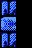

Something is wrong: 


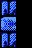

Something is wrong: 


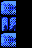

Something is wrong: 


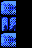

Something is wrong: 


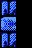

Something is wrong: 


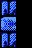

Something is wrong: 


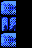

Something is wrong: 


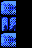

Something is wrong: 


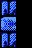

Something is wrong: 


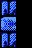

Something is wrong: 


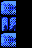

Something is wrong: 


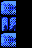

Something is wrong: 


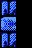

Something is wrong: 


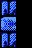

Something is wrong: 


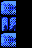

Something is wrong: 


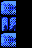

Something is wrong: 


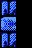

Something is wrong: 


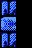

Something is wrong: 


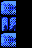

Something is wrong: 


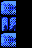

Something is wrong: 


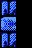

Something is wrong: 


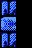

Something is wrong: 


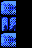

Something is wrong: 


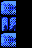

Something is wrong: 


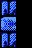

Something is wrong: 


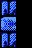

Something is wrong: 


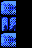

Something is wrong: 


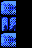

Something is wrong: 


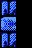

Something is wrong: 


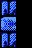

Something is wrong: 


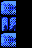

Something is wrong: 


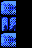

Something is wrong: 


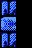

Something is wrong: 


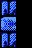

Something is wrong: 


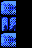

Something is wrong: 


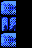

Something is wrong: 


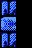

Something is wrong: 


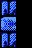

Something is wrong: 


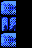

Something is wrong: 


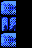

Something is wrong: 


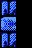

Something is wrong: 


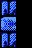

Something is wrong: 


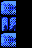

Something is wrong: 


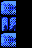

Something is wrong: 


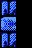

Something is wrong: 


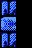

Something is wrong: 


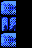

Something is wrong: 


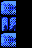

Something is wrong: 


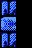

Something is wrong: 


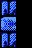

Something is wrong: 


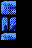

Something is wrong: 


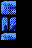

Something is wrong: 


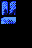

Something is wrong: 


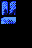

Something is wrong: 


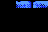

Something is wrong: 


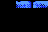

Something is wrong: 


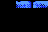

Something is wrong: 


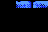

Something is wrong: 


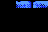

Something is wrong: 


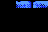

Something is wrong: 


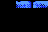

Something is wrong: 


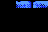

Something is wrong: 


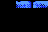

Something is wrong: 


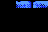

Something is wrong: 


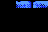

Something is wrong: 


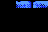

Something is wrong: 


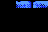

Something is wrong: 


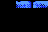

Something is wrong: 


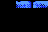

Something is wrong: 


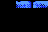

Something is wrong: 


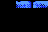

Something is wrong: 


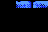

Something is wrong: 


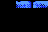

Something is wrong: 


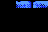

Something is wrong: 


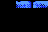

Something is wrong: 


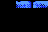

Something is wrong: 


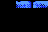

Something is wrong: 


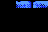

Something is wrong: 


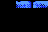

Something is wrong: 


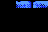

Something is wrong: 


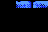

Something is wrong: 


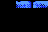

Something is wrong: 


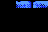

Something is wrong: 


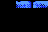

Something is wrong: 


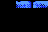

Something is wrong: 


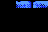

Something is wrong: 


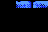

Something is wrong: 


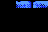

Something is wrong: 


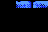

Something is wrong: 


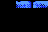

Something is wrong: 


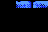

Something is wrong: 


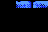

Something is wrong: 


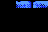

Something is wrong: 


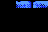

Something is wrong: 


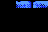

Something is wrong: 


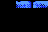

Something is wrong: 


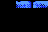

Something is wrong: 


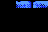

Something is wrong: 


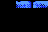

Something is wrong: 


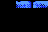

Something is wrong: 


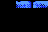

Something is wrong: 


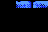

Something is wrong: 


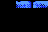

Something is wrong: 


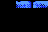

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_52
Something is wrong: 


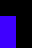

Something is wrong: 


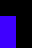

Something is wrong: 


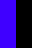

Something is wrong: 


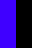

Something is wrong: 


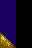

Something is wrong: 


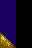

Something is wrong: 


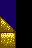

Something is wrong: 


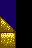

Something is wrong: 


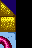

Something is wrong: 


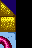

Something is wrong: 


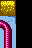

Something is wrong: 


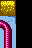

Something is wrong: 


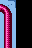

Something is wrong: 


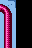

Something is wrong: 


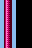

Something is wrong: 


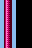

Something is wrong: 


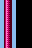

Something is wrong: 


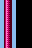

Something is wrong: 


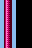

Something is wrong: 


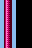

Something is wrong: 


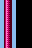

Something is wrong: 


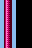

Something is wrong: 


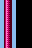

Something is wrong: 


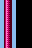

Something is wrong: 


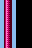

Something is wrong: 


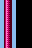

Something is wrong: 


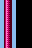

Something is wrong: 


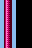

Something is wrong: 


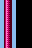

Something is wrong: 


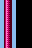

Something is wrong: 


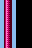

Something is wrong: 


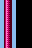

Something is wrong: 


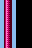

Something is wrong: 


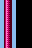

Something is wrong: 


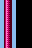

Something is wrong: 


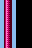

Something is wrong: 


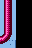

Something is wrong: 


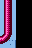

Something is wrong: 


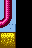

Something is wrong: 


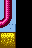

Something is wrong: 


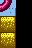

Something is wrong: 


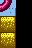

Something is wrong: 


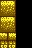

Something is wrong: 


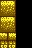

Something is wrong: 


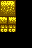

Something is wrong: 


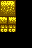

Something is wrong: 


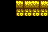

Something is wrong: 


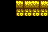

Something is wrong: 


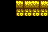

Something is wrong: 


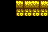

Something is wrong: 


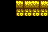

Something is wrong: 


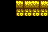

Something is wrong: 


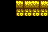

Something is wrong: 


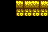

Something is wrong: 


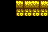

Something is wrong: 


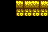

Something is wrong: 


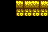

Something is wrong: 


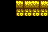

Something is wrong: 


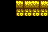

Something is wrong: 


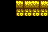

Something is wrong: 


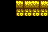

Something is wrong: 


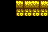

Something is wrong: 


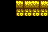

Something is wrong: 


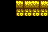

Something is wrong: 


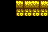

Something is wrong: 


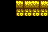

Something is wrong: 


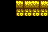

Something is wrong: 


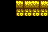

Something is wrong: 


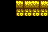

Something is wrong: 


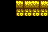

Something is wrong: 


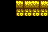

Something is wrong: 


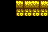

Something is wrong: 


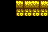

Something is wrong: 


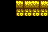

Something is wrong: 


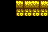

Something is wrong: 


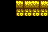

Something is wrong: 


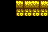

Something is wrong: 


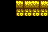

Something is wrong: 


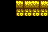

Something is wrong: 


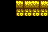

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_25
Something is wrong: 


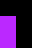

Something is wrong: 


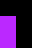

Something is wrong: 


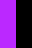

Something is wrong: 


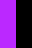

Something is wrong: 


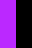

Something is wrong: 


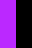

Something is wrong: 


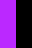

Something is wrong: 


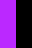

Something is wrong: 


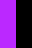

Something is wrong: 


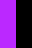

Something is wrong: 


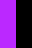

Something is wrong: 


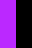

Something is wrong: 


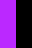

Something is wrong: 


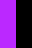

Something is wrong: 


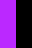

Something is wrong: 


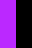

Something is wrong: 


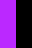

Something is wrong: 


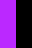

Something is wrong: 


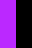

Something is wrong: 


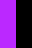

Something is wrong: 


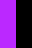

Something is wrong: 


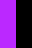

Something is wrong: 


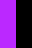

Something is wrong: 


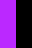

Something is wrong: 


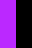

Something is wrong: 


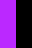

Something is wrong: 


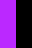

Something is wrong: 


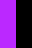

Something is wrong: 


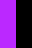

Something is wrong: 


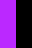

Something is wrong: 


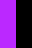

Something is wrong: 


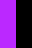

Something is wrong: 


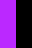

Something is wrong: 


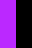

Something is wrong: 


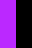

Something is wrong: 


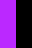

Something is wrong: 


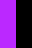

Something is wrong: 


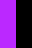

Something is wrong: 


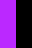

Something is wrong: 


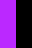

Something is wrong: 


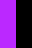

Something is wrong: 


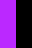

Something is wrong: 


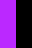

Something is wrong: 


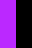

Something is wrong: 


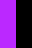

Something is wrong: 


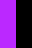

Something is wrong: 


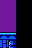

Something is wrong: 


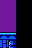

Something is wrong: 


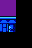

Something is wrong: 


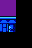

Something is wrong: 


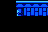

Something is wrong: 


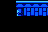

Something is wrong: 


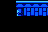

Something is wrong: 


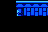

Something is wrong: 


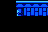

Something is wrong: 


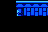

Something is wrong: 


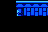

Something is wrong: 


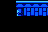

Something is wrong: 


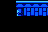

Something is wrong: 


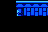

Something is wrong: 


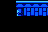

Something is wrong: 


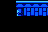

Something is wrong: 


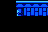

Something is wrong: 


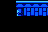

Something is wrong: 


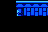

Something is wrong: 


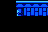

Something is wrong: 


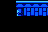

Something is wrong: 


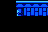

Something is wrong: 


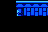

Something is wrong: 


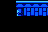

Something is wrong: 


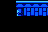

Something is wrong: 


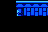

Something is wrong: 


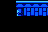

Something is wrong: 


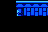

Something is wrong: 


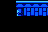

Something is wrong: 


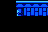

Something is wrong: 


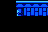

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_40
Something is wrong: 


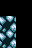

Something is wrong: 


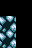

Something is wrong: 


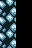

Something is wrong: 


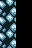

Something is wrong: 


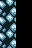

Something is wrong: 


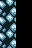

Something is wrong: 


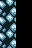

Something is wrong: 


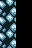

Something is wrong: 


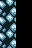

Something is wrong: 


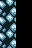

Something is wrong: 


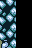

Something is wrong: 


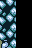

Something is wrong: 


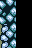

Something is wrong: 


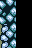

Something is wrong: 


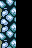

Something is wrong: 


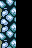

Something is wrong: 


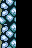

Something is wrong: 


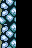

Something is wrong: 


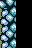

Something is wrong: 


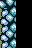

Something is wrong: 


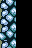

Something is wrong: 


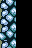

Something is wrong: 


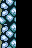

Something is wrong: 


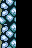

Something is wrong: 


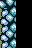

Something is wrong: 


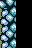

Something is wrong: 


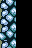

Something is wrong: 


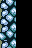

Something is wrong: 


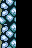

Something is wrong: 


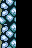

Something is wrong: 


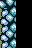

Something is wrong: 


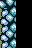

Something is wrong: 


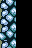

Something is wrong: 


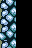

Something is wrong: 


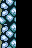

Something is wrong: 


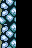

Something is wrong: 


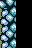

Something is wrong: 


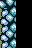

Something is wrong: 


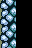

Something is wrong: 


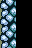

Something is wrong: 


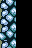

Something is wrong: 


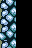

Something is wrong: 


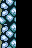

Something is wrong: 


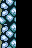

Something is wrong: 


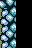

Something is wrong: 


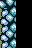

Something is wrong: 


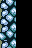

Something is wrong: 


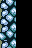

Something is wrong: 


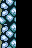

Something is wrong: 


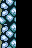

Something is wrong: 


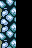

Something is wrong: 


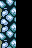

Something is wrong: 


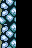

Something is wrong: 


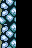

Something is wrong: 


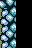

Something is wrong: 


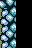

Something is wrong: 


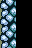

Something is wrong: 


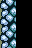

Something is wrong: 


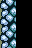

Something is wrong: 


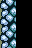

Something is wrong: 


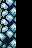

Something is wrong: 


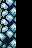

Something is wrong: 


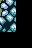

Something is wrong: 


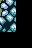

Something is wrong: 


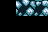

Something is wrong: 


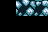

Something is wrong: 


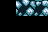

Something is wrong: 


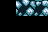

Something is wrong: 


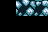

Something is wrong: 


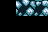

Something is wrong: 


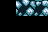

Something is wrong: 


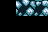

Something is wrong: 


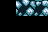

Something is wrong: 


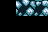

Something is wrong: 


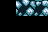

Something is wrong: 


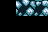

Something is wrong: 


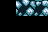

Something is wrong: 


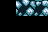

Something is wrong: 


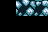

Something is wrong: 


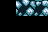

Something is wrong: 


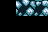

Something is wrong: 


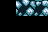

Something is wrong: 


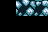

Something is wrong: 


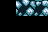

Something is wrong: 


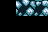

Something is wrong: 


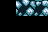

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_45
Something is wrong: 


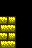

Something is wrong: 


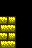

Something is wrong: 


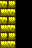

Something is wrong: 


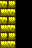

Something is wrong: 


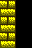

Something is wrong: 


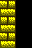

Something is wrong: 


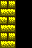

Something is wrong: 


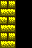

Something is wrong: 


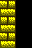

Something is wrong: 


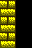

Something is wrong: 


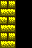

Something is wrong: 


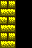

Something is wrong: 


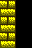

Something is wrong: 


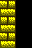

Something is wrong: 


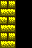

Something is wrong: 


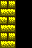

Something is wrong: 


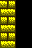

Something is wrong: 


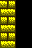

Something is wrong: 


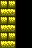

Something is wrong: 


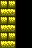

Something is wrong: 


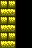

Something is wrong: 


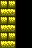

Something is wrong: 


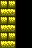

Something is wrong: 


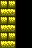

Something is wrong: 


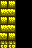

Something is wrong: 


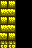

Something is wrong: 


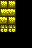

Something is wrong: 


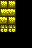

Something is wrong: 


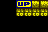

Something is wrong: 


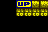

Something is wrong: 


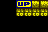

Something is wrong: 


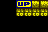

Something is wrong: 


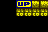

Something is wrong: 


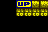

Something is wrong: 


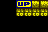

Something is wrong: 


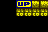

Something is wrong: 


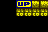

Something is wrong: 


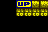

Something is wrong: 


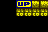

Something is wrong: 


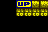

Something is wrong: 


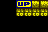

Something is wrong: 


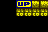

Something is wrong: 


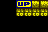

Something is wrong: 


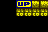

Something is wrong: 


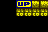

Something is wrong: 


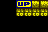

Something is wrong: 


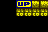

Something is wrong: 


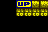

Something is wrong: 


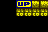

Something is wrong: 


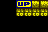

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Processing game_2_54
Something is wrong: 


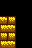

Something is wrong: 


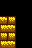

Something is wrong: 


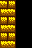

Something is wrong: 


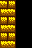

Something is wrong: 


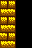

Something is wrong: 


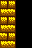

Something is wrong: 


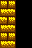

Something is wrong: 


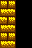

Something is wrong: 


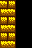

Something is wrong: 


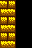

Something is wrong: 


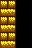

Something is wrong: 


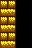

Something is wrong: 


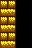

Something is wrong: 


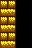

Something is wrong: 


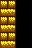

Something is wrong: 


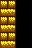

Something is wrong: 


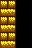

Something is wrong: 


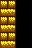

Something is wrong: 


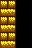

Something is wrong: 


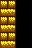

Something is wrong: 


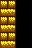

Something is wrong: 


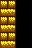

Something is wrong: 


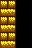

Something is wrong: 


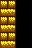

Something is wrong: 


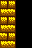

Something is wrong: 


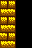

Something is wrong: 


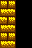

Something is wrong: 


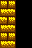

Something is wrong: 


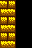

Something is wrong: 


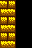

Something is wrong: 


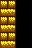

Something is wrong: 


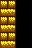

Something is wrong: 


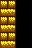

Something is wrong: 


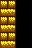

Something is wrong: 


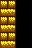

Something is wrong: 


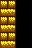

Something is wrong: 


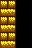

Something is wrong: 


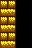

Something is wrong: 


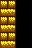

Something is wrong: 


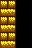

Something is wrong: 


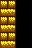

Something is wrong: 


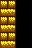

Something is wrong: 


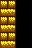

Something is wrong: 


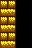

Something is wrong: 


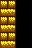

Something is wrong: 


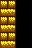

Something is wrong: 


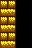

Something is wrong: 


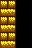

Something is wrong: 


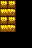

Something is wrong: 


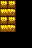

Something is wrong: 


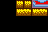

Something is wrong: 


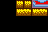

Something is wrong: 


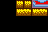

Something is wrong: 


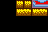

Something is wrong: 


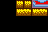

Something is wrong: 


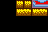

Something is wrong: 


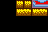

Something is wrong: 


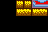

Something is wrong: 


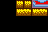

Something is wrong: 


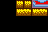

Something is wrong: 


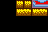

Something is wrong: 


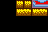

Something is wrong: 


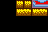

Something is wrong: 


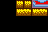

Something is wrong: 


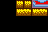

Something is wrong: 


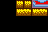

Something is wrong: 


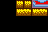

Something is wrong: 


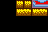

Something is wrong: 


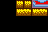

Something is wrong: 


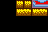

Something is wrong: 


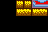

Something is wrong: 


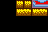

Something is wrong: 


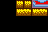

Something is wrong: 


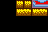

Something is wrong: 


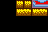

Something is wrong: 


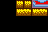

Something is wrong: 


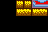

Something is wrong: 


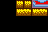

Something is wrong: 


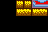

Something is wrong: 


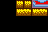

Something is wrong: 


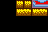

Something is wrong: 


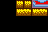

Something is wrong: 


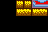

Something is wrong: 


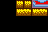

Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Something is wrong: 


Context Data Extracted for game  unannotated


In [ ]:
def get_level_unannotated(path):
    with open(path, "r") as f:
        l = [line.split() for line in f]
    return l

def get_image_unannotated(path):
    img_without_border = load_img(path)
    img = Image.open(path)
    img_with_border = ImageOps.expand(img_without_border, border=16, fill="black")
    return img_without_border, img_with_border

def update_tile_dictionary_unannotated(
    game, current_img_padded, save_dir, tile_dictionary):
    if game == "lode_runner":
        return extract_context_lr(
            current_img_padded, save_dir, tile_dictionary
        )
    else:
        return extract_context_unannotated(
            current_img_padded, save_dir, tile_dictionary
        )

def save_context_unannotated(game, identifiers, image_dir, image_extension, save_dir):
    tile_dictionary = {}

    for identifier in identifiers:
        image_path = image_dir + identifier + image_extension
        current_img, current_img_padded = get_image_unannotated(image_path)
        ##figure out the image_dimensions
        data_array = img_to_array(current_img)
        data_array_padded = img_to_array(current_img_padded)
        # current_level = get_level(annotation_dir + identifier + ".txt")
        # if (
        #     data_array.shape[0] / len(current_level) == 16.0
        #     and data_array.shape[1] / len(current_level[0][0]) == 16.0
        # ):
        if True:
            print("Processing", identifier)
            tile_dictionary = update_tile_dictionary_unannotated(
                game, current_img_padded, save_dir, tile_dictionary
            )
        else:
            print("Skipping", identifier)
            continue
    # save the tile dictionary
    with open(save_dir + "candidate_tile_context_"+str(game)+".json", "w") as fp:
        json.dump(tile_dictionary, fp, indent=4, sort_keys=True)
    print("Context Data Extracted for game ", game)

# UnAnnotated Games
game="unannotated"
image_extension=".png"
image_dir="/content/gdrive/My Drive/CTE/data/unannotated/"
image_paths=glob.glob(image_dir+"*"+image_extension)
image_identifiers=[x.split("/")[-1].split(".")[0] for x in image_paths]
# annotation_dir="/content/gdrive/My Drive/CTE/data/vglc/The Legend of Zelda/Processed/"
# annotation_paths=glob.glob(annotation_dir+"*.txt")
# annotation_identifiers=[x.split("/")[-1].split(".")[0] for x in annotation_paths]
identifiers=set(image_identifiers)
save_dir="/content/gdrive/My Drive/CTE/data/context_data/unannotated/"
print("Number of levels with annotations detected: ",len(identifiers))
save_context_unannotated(game, identifiers, image_dir, image_extension, save_dir)

**load_data.py file**

In [ ]:
def listdir_nohidden(path):
    game_list=[]
    for f in os.listdir(path):
        if not f.startswith('.'):
            game_list.append(f)
    return np.array(game_list)
def get_tile_data(game_data_directory, json_directory, shuffle_data=True):
    games = listdir_nohidden(game_data_directory)
    print("Games detected in the parent folder", games)
    tile_data = pd.DataFrame(
        columns=[
            "game_identifier",
            "image_path",
            "centre_tile",
            "context_string",
            "features",
        ]
    )
    for current_game in games:
        print("Current Game", current_game)
        if current_game != "unannotated":
            game_context_sprites = os.path.join(game_data_directory, current_game)
            print("Reading mappings")
            with open(json_directory + "/" + current_game + ".json") as fp:
                sprite_mappings = json.load(fp)
            sprite_mappings = sprite_mappings["tiles"]
            print("Json File Loaded")
            print("Reading Sprite Data From", game_context_sprites)
            game_data = {}
            for root, dirs, files in os.walk(game_context_sprites):
                for sprite_directory in dirs:
                    game_data[sprite_directory] = glob.glob(
                        game_context_sprites + "/" + sprite_directory + "/*.png"
                    )
            #         print("Game Data Keys",game_data)
            for centre_tile in game_data.keys():
                for context in game_data[centre_tile]:
                    #                 print("Length of data",len(game_data[centre_tile]))
                    context_image_path = context
                    #                 print("Context",context_image_path)
                    possible_context = context.split("/")[-1].split(".")[0]
                    curr_centre = str(context.split("/")[-2])
                    #                 print("Centre Tile",curr_centre)
                    tile_data = tile_data.append(
                        {
                            "game_identifier": current_game,
                            "image_path": context_image_path,
                            "centre_tile": curr_centre,
                            "context_string": possible_context,
                            "features": sprite_mappings[curr_centre],
                        },
                        ignore_index=True,
                    )
        else:
            game_context_sprites = os.path.join(game_data_directory, current_game)
            print("Reading mappings")
            with open(json_directory + "/" + current_game + ".json") as fp:
                sprite_mappings = json.load(fp)
            sprite_mappings = sprite_mappings["tiles"]
            print("Json File Loaded")
            print("Reading Sprite Data From", game_context_sprites)
            game_data = {}
            for root, dirs, files in os.walk(game_context_sprites):
                for sprite_directory in dirs:
                    game_data[sprite_directory] = glob.glob(
                        game_context_sprites + "/" + sprite_directory + "/*.png"
                    )
            #         print("Game Data Keys",game_data)
            for centre_tile in game_data.keys():
                for context in game_data[centre_tile]:
                    #                 print("Length of data",len(game_data[centre_tile]))
                    context_image_path = context
                    #                 print("Context",context_image_path)
                    # possible_context = context.split("/")[-1].split(".")[0]
                    possible_context = "$$$$$$$$$$"
                    curr_centre = str(context.split("/")[-2])
                    #                 print("Centre Tile",curr_centre)
                    tile_data = tile_data.append(
                        {
                            "game_identifier": current_game,
                            "image_path": context_image_path,
                            "centre_tile": curr_centre,
                            "context_string": possible_context,
                            "features": sprite_mappings[curr_centre],
                        },
                        ignore_index=True,
                    )
    if shuffle_data:
        return shuffle(tile_data)
    return tile_data

**Prepare Train and Test dataset**

In [ ]:
data_directory = "/content/gdrive/My Drive/CTE/data/context_data/"
json_directory = "/content/gdrive/My Drive/CTE/data/json_files_trimmed_features/"
data = get_tile_data(data_directory, json_directory)
print("\nThe size of total data is", data.shape)

# shuffle the data so that the test data does not contain only one-game
data = shuffle(data)
# split the data into training and testing
train_data, test_data = train_test_split(data, test_size=0.10, random_state=42)
if debug == 1:
    print("\nThe size of the train data is ", train_data.shape)
    print("The size of the test data is ", test_data.shape)

# saving the csv
data.to_csv("/content/gdrive/My Drive/CTE/data/game_data.csv")
train_data.to_csv("/content/gdrive/My Drive/CTE/data/train_data.csv")
test_data.to_csv("/content/gdrive/My Drive/CTE/data/test_data.csv")

Games detected in the parent folder ['kid_icarus' 'megaman' 'smb' 'lode_runner' 'loz' 'unannotated']
Current Game kid_icarus
Reading mappings
Json File Loaded
Reading Sprite Data From /content/gdrive/My Drive/CTE/data/context_data/kid_icarus


<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.app

Current Game megaman
Reading mappings
Json File Loaded
Reading Sprite Data From /content/gdrive/My Drive/CTE/data/context_data/megaman


Streaming output truncated to the last 5000 lines.
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use

Current Game smb
Reading mappings
Json File Loaded
Reading Sprite Data From /content/gdrive/My Drive/CTE/data/context_data/smb


<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.app

Current Game lode_runner
Reading mappings
Json File Loaded
Reading Sprite Data From /content/gdrive/My Drive/CTE/data/context_data/lode_runner


Streaming output truncated to the last 5000 lines.
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use

Current Game loz
Reading mappings
Json File Loaded
Reading Sprite Data From /content/gdrive/My Drive/CTE/data/context_data/loz


<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.app

Current Game unannotated
Reading mappings
Json File Loaded
Reading Sprite Data From /content/gdrive/My Drive/CTE/data/context_data/unannotated


<ipython-input-12-afc53822e119>:78: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:78: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:78: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:78: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.append(
<ipython-input-12-afc53822e119>:78: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tile_data = tile_data.app


The size of total data is (28555, 5)

The size of the train data is  (25699, 5)
The size of the test data is  (2856, 5)


In [ ]:
game_data_path="/content/gdrive/My Drive/CTE/data/game_data.csv"
train_data_path="/content/gdrive/My Drive/CTE/data/train_data.csv"
test_data_path="/content/gdrive/My Drive/CTE/data/test_data.csv"

data=pd.read_csv(game_data_path)
train_data=pd.read_csv(train_data_path)
test_data=pd.read_csv(test_data_path)

data['features'] = data.features.apply(lambda x: literal_eval(str(x)))
train_data['features'] = train_data.features.apply(lambda x: literal_eval(str(x)))
test_data['features'] = test_data.features.apply(lambda x: literal_eval(str(x)))

# Building feature dictionary consisting of all the features seen across games
print("Building feature Dictionary..")
mlb = MultiLabelBinarizer()
combined_features = np.concatenate(
    [train_data["features"], test_data["features"]], axis=0
)

mlb_model = mlb.fit(combined_features)
feature_classes = [f for f in mlb_model.classes_ if f != "unknown"]
mlb_model.classes_ = feature_classes
num_features = len(feature_classes)

# num_features = len(mlb_model.classes_)
if debug == 1:
    print("The feature dictionary has size", num_features)
    print("Printing Feature classes")
    print(mlb_model.classes_)


# Build Input Output Training Batches
print("Building Training Batches")
train_image_batch = []
status_counter = 0
for train_path in train_data["image_path"]:
    print(status_counter)
    status_counter += 1
    tile = image.load_img(train_path, target_size=(48, 48))
    tile_sprite = image.img_to_array(tile)
    train_image_batch.append(tile_sprite)
train_image_batch = np.array(train_image_batch)
train_text_batch = []
for i in range(len(train_data["features"])):
    features = train_data["features"][i]
    if "unknown" in features:
        # Set "unknown" feature to a one-hot vector with all zeros
        text_ = np.zeros((1, num_features))
    else:
        text_ = mlb.transform([features])
    text_ = mlb.transform(train_data["features"][i : i + 1])
    train_text_batch.append(text_)
train_text_batch = np.array(train_text_batch).reshape(
    train_data.shape[0], num_features
)

output_image_batch = []
for i in range(len(train_image_batch)):
    current_image = train_image_batch[i]
    current_image_centre = train_image_batch[i][16 : 16 + 16, 16 : 16 + 16, :]
    output_image_batch.append(current_image_centre)
output_image_batch = np.array(output_image_batch)

output_text_batch = []
for i in range(len(train_text_batch)):
    current_text = train_text_batch[i]
    output_text_batch.append(current_text)
output_text_batch = np.array(output_text_batch)
print("Training Data Ready")
if debug == 1:
    print("Train Image batch shape", train_image_batch.shape)
    print("Train Text batch shape", train_text_batch.shape)
    print("Output Image batch shape", output_image_batch.shape)
    print("Output Text batch shape", output_text_batch.shape)

print("Train Batches Stored")

# Build Input Output Test Batches
print("Building Testing Batches")
"""Note : Add Generators"""
test_image_batch = []
for test_path in test_data["image_path"]:
    tile = image.load_img(test_path, target_size=(48, 48))
    tile_sprite = image.img_to_array(tile)
    test_image_batch.append(tile_sprite)
test_image_batch = np.array(test_image_batch)
test_text_batch = []
for i in range(len(test_data["features"])):
    text_ = mlb.transform(test_data["features"][i : i + 1])
    test_text_batch.append(text_)
test_text_batch = np.array(test_text_batch).reshape(test_data.shape[0], num_features)

output_test_image_batch = []
for i in range(len(test_image_batch)):
    current_image = test_image_batch[i]
    current_image_centre = test_image_batch[i][16 : 16 + 16, 16 : 16 + 16, :]
    output_test_image_batch.append(current_image_centre)
output_test_image_batch = np.array(output_test_image_batch)

print("\n\nTesting Data Ready")
if debug == 1:
    print("Train Image batch shape", test_image_batch.shape)
    print("Train Text batch shape", test_text_batch.shape)

#save the multilabel binarizer
with open("/content/gdrive/My Drive/CTE/model/model_tokenizer.pickle", "wb") as handle:
    pickle.dump(mlb, handle, protocol=pickle.HIGHEST_PROTOCOL)
print("\nMultilabel binarizer saved")

# save the input-output training batches
with open("/content/gdrive/My Drive/CTE/data/train_image_batch.pickle", "wb") as handle:
    pickle.dump(train_image_batch, handle, protocol=pickle.HIGHEST_PROTOCOL)
with open("/content/gdrive/My Drive/CTE/data/train_text_batch.pickle", "wb") as handle:
    pickle.dump(train_text_batch, handle, protocol=pickle.HIGHEST_PROTOCOL)
with open("/content/gdrive/My Drive/CTE/data/output_image_batch.pickle", "wb") as handle:
    pickle.dump(output_image_batch, handle, protocol=pickle.HIGHEST_PROTOCOL)
with open("/content/gdrive/My Drive/CTE/data/output_text_batch.pickle", "wb") as handle:
    pickle.dump(output_text_batch, handle, protocol=pickle.HIGHEST_PROTOCOL)

print("\nTrain Batches Stored")

# save the input-output test batches
with open("/content/gdrive/My Drive/CTE/data/test_image_batch.pickle", "wb") as handle:
    pickle.dump(test_image_batch, handle, protocol=pickle.HIGHEST_PROTOCOL)
with open("/content/gdrive/My Drive/CTE/data/test_text_batch.pickle", "wb") as handle:
    pickle.dump(test_text_batch, handle, protocol=pickle.HIGHEST_PROTOCOL)
with open("/content/gdrive/My Drive/CTE/data/output_test_image_batch.pickle", "wb") as handle:
    pickle.dump(output_test_image_batch, handle, protocol=pickle.HIGHEST_PROTOCOL)

print("\nTest Batches Stored")

Streaming output truncated to the last 5000 lines.
20699
20700
20701
20702
20703
20704
20705
20706
20707
20708
20709
20710
20711
20712
20713
20714
20715
20716
20717
20718
20719
20720
20721
20722
20723
20724
20725
20726
20727
20728
20729
20730
20731
20732
20733
20734
20735
20736
20737
20738
20739
20740
20741
20742
20743
20744
20745
20746
20747
20748
20749
20750
20751
20752
20753
20754
20755
20756
20757
20758
20759
20760
20761
20762
20763
20764
20765
20766
20767
20768
20769
20770
20771
20772
20773
20774
20775
20776
20777
20778
20779
20780
20781
20782
20783
20784
20785
20786
20787
20788
20789
20790
20791
20792
20793
20794
20795
20796
20797
20798
20799
20800
20801
20802
20803
20804
20805
20806
20807
20808
20809
20810
20811
20812
20813
20814
20815
20816
20817
20818
20819
20820
20821
20822
20823
20824
20825
20826
20827
20828
20829
20830
20831
20832
20833
20834
20835
20836
20837
20838
20839
20840
20841
20842
20843
20844
20845
20846
20847
20848
20849
20850
20851
20852
20853
20854
20855
20856
2

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:895: UserWarning: unknown class(es) ['unknown'] will be ignored
  warnings.warn(


Training Data Ready
Train Image batch shape (25699, 48, 48, 3)
Train Text batch shape (25699, 13)
Output Image batch shape (25699, 16, 16, 3)
Output Text batch shape (25699, 13)
Train Batches Stored
Building Testing Batches


AttributeError: ignored

In [ ]:
import numpy as np
import pandas as pd
from ast import literal_eval
from sklearn.preprocessing import MultiLabelBinarizer
import os
import pickle

# Define file paths
game_data_path = "/content/gdrive/My Drive/CTE/data/game_data.csv"
train_data_path = "/content/gdrive/My Drive/CTE/data/train_data.csv"
test_data_path = "/content/gdrive/My Drive/CTE/data/test_data.csv"

# Read data from CSV
data = pd.read_csv(game_data_path)
train_data = pd.read_csv(train_data_path)
test_data = pd.read_csv(test_data_path)

data['features'] = data.features.apply(lambda x: literal_eval(str(x)))
train_data['features'] = train_data.features.apply(lambda x: literal_eval(str(x)))
test_data['features'] = test_data.features.apply(lambda x: literal_eval(str(x)))

# Building feature dictionary consisting of all the features seen across games
print("Building feature Dictionary..")
mlb = MultiLabelBinarizer()
combined_features = np.concatenate(
    [train_data["features"], test_data["features"]], axis=0
)

# Remove "unknown" from the feature classes
mlb_model = mlb.fit(combined_features)
feature_classes = [f for f in mlb_model.classes_ if f != "unknown"]
mlb_model.classes_ = feature_classes
num_features = len(feature_classes)

if debug == 1:
    print("The feature dictionary has size", num_features)
    print("Printing Feature classes")
    print(mlb_model.classes_)

status_counter = 0

# Function to preprocess images
def preprocess_image(image_path):
    global status_counter
    print(status_counter)
    status_counter += 1
    tile = image.load_img(image_path, target_size=(48, 48))
    tile_sprite = image.img_to_array(tile)
    return tile_sprite

# Function to create text batches
def create_text_batch(features):
    if "unknown" in features:
        # Set "unknown" feature to a one-hot vector with all zeros
        text_ = np.zeros((1, num_features))
    else:
        text_ = mlb.transform([features])
    return text_

# Build Input Output Training Batches
print("Building Training Batches")
train_image_batch = np.array([preprocess_image(train_path) for train_path in train_data["image_path"]])
train_text_batch = np.array([create_text_batch(features) for features in train_data["features"]])
train_text_batch = train_text_batch.reshape(train_data.shape[0], num_features)

output_image_batch = train_image_batch[:, 16:16 + 16, 16:16 + 16, :]
output_text_batch = train_text_batch

print("Training Data Ready")
if debug == 1:
    print("Train Image batch shape", train_image_batch.shape)
    print("Train Text batch shape", train_text_batch.shape)
    print("Output Image batch shape", output_image_batch.shape)
    print("Output Text batch shape", output_text_batch.shape)

print("Train Batches Stored")

# Build Input Output Test Batches
print("Building Testing Batches")
test_image_batch = np.array([preprocess_image(test_path) for test_path in test_data["image_path"]])
test_text_batch = np.array([mlb.transform([features]) for features in test_data["features"]])
test_text_batch = test_text_batch.reshape(test_data.shape[0], num_features)

output_test_image_batch = test_image_batch[:, 16:16 + 16, 16:16 + 16, :]

print("\n\nTesting Data Ready")
if debug == 1:
    print("Train Image batch shape", test_image_batch.shape)
    print("Train Text batch shape", test_text_batch.shape)

# Save the multilabel binarizer
tokenizer_path = "/content/gdrive/My Drive/CTE/model/model_tokenizer.pickle"
with open(tokenizer_path, "wb") as handle:
    pickle.dump(mlb, handle, protocol=pickle.HIGHEST_PROTOCOL)
print("\nMultilabel binarizer saved")

# Save the input-output training batches
train_image_batch_path = "/content/gdrive/My Drive/CTE/data/train_image_batch.pickle"
train_text_batch_path = "/content/gdrive/My Drive/CTE/data/train_text_batch.pickle"
output_image_batch_path = "/content/gdrive/My Drive/CTE/data/output_image_batch.pickle"
output_text_batch_path = "/content/gdrive/My Drive/CTE/data/output_text_batch.pickle"

with open(train_image_batch_path, "wb") as handle:
    pickle.dump(train_image_batch, handle, protocol=pickle.HIGHEST_PROTOCOL)
with open(train_text_batch_path, "wb") as handle:
    pickle.dump(train_text_batch, handle, protocol=pickle.HIGHEST_PROTOCOL)
with open(output_image_batch_path, "wb") as handle:
    pickle.dump(output_image_batch, handle, protocol=pickle.HIGHEST_PROTOCOL)
with open(output_text_batch_path, "wb") as handle:
    pickle.dump(output_text_batch, handle, protocol=pickle.HIGHEST_PROTOCOL)

print("\nTrain Batches Stored")

# Save the input-output test batches
test_image_batch_path = "/content/gdrive/My Drive/CTE/data/test_image_batch.pickle"
test_text_batch_path = "/content/gdrive/My Drive/CTE/data/test_text_batch.pickle"
output_test_image_batch_path = "/content/gdrive/My Drive/CTE/data/output_test_image_batch.pickle"

with open(test_image_batch_path, "wb") as handle:
    pickle.dump(test_image_batch, handle, protocol=pickle.HIGHEST_PROTOCOL)
with open(test_text_batch_path, "wb") as handle:
    pickle.dump(test_text_batch, handle, protocol=pickle.HIGHEST_PROTOCOL)
with open(output_test_image_batch_path, "wb") as handle:
    pickle.dump(output_test_image_batch, handle, protocol=pickle.HIGHEST_PROTOCOL)

print("\nTest Batches Stored")


Streaming output truncated to the last 5000 lines.
23562
23563
23564
23565
23566
23567
23568
23569
23570
23571
23572
23573
23574
23575
23576
23577
23578
23579
23580
23581
23582
23583
23584
23585
23586
23587
23588
23589
23590
23591
23592
23593
23594
23595
23596
23597
23598
23599
23600
23601
23602
23603
23604
23605
23606
23607
23608
23609
23610
23611
23612
23613
23614
23615
23616
23617
23618
23619
23620
23621
23622
23623
23624
23625
23626
23627
23628
23629
23630
23631
23632
23633
23634
23635
23636
23637
23638
23639
23640
23641
23642
23643
23644
23645
23646
23647
23648
23649
23650
23651
23652
23653
23654
23655
23656
23657
23658
23659
23660
23661
23662
23663
23664
23665
23666
23667
23668
23669
23670
23671
23672
23673
23674
23675
23676
23677
23678
23679
23680
23681
23682
23683
23684
23685
23686
23687
23688
23689
23690
23691
23692
23693
23694
23695
23696
23697
23698
23699
23700
23701
23702
23703
23704
23705
23706
23707
23708
23709
23710
23711
23712
23713
23714
23715
23716
23717
23718
23719
2

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:895: UserWarning: unknown class(es) ['unknown'] will be ignored
  warnings.warn(




Testing Data Ready
Train Image batch shape (2856, 48, 48, 3)
Train Text batch shape (2856, 13)

Multilabel binarizer saved

Train Batches Stored

Test Batches Stored


In [ ]:
def get_pickle_file(path):
    with open(path,"rb") as handle:
        return pickle.load(handle)

output_image_batch=get_pickle_file("/content/gdrive/My Drive/CTE/data/output_image_batch.pickle")
test_image_batch = get_pickle_file("/content/gdrive/My Drive/CTE/data/output_test_image_batch.pickle")

output_edge_batch = []
test_edge_batch = []

def get_edge_info(centre_image_list):

    return_edge_list = []
    for i in range(len(centre_image_list)):

        current_image_centre = centre_image_list[i]

        gray = cv2.cvtColor(current_image_centre, cv2.COLOR_BGR2GRAY)

        if gray.dtype != np.uint8:
            gray = gray.astype(np.uint8)

        blurred = cv2.GaussianBlur(gray, (5, 5), 0)
        wide = cv2.Canny(blurred, 15, 20)

        current_edge_centre = wide.reshape(16, 16, 1)
        return_edge_list.append(current_edge_centre)

    return_edge_list = np.array(return_edge_list)
    return return_edge_list

output_edge_batch = get_edge_info(output_image_batch)
test_edge_batch = get_edge_info(test_image_batch)
'''

for i in range(len(output_image_batch)):
    current_image_centre = output_image_batch[i]

    gray = cv2.cvtColor(current_image_centre, cv2.COLOR_BGR2GRAY)

    if gray.dtype != np.uint8:
        gray = gray.astype(np.uint8)

    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    wide = cv2.Canny(blurred, 15, 20)

    current_edge_centre = wide.reshape(16, 16, 1)

    if debug == 1:
        display(image.array_to_img(current_edge_centre))
        display(image.array_to_img(current_image_centre.reshape(16,16,3)))

    output_edge_batch.append(current_edge_centre)

output_edge_batch = np.array(output_edge_batch)
# test_edge_batch = np.array(test_edge_batch)

'''
if debug == 1:
    print("output_edge_batch shape: ",output_edge_batch.shape)
    print("test_edge_batch shape: ", test_edge_batch.shape)

with open("/content/gdrive/My Drive/CTE/data/output_edge_batch.pickle", "wb") as handle:
    pickle.dump(output_edge_batch, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open("/content/gdrive/My Drive/CTE/data/test_edge_batch.pickle", "wb") as handle:
    pickle.dump(test_edge_batch, handle, protocol=pickle.HIGHEST_PROTOCOL)

output_edge_batch shape:  (25699, 16, 16, 1)
test_edge_batch shape:  (2856, 16, 16, 1)


In [ ]:
'''
import cv2

def get_pickle_file(path):
    with open(path, "rb") as handle:
        return pickle.load(handle)

output_image_batch = get_pickle_file("/content/gdrive/My Drive/CTE/data/output_image_batch.pickle")

output_edge_batch = np.empty((len(output_image_batch), 16, 16, 1), dtype=np.uint8)

for i, current_image_centre in enumerate(output_image_batch):
    gray = cv2.cvtColor(current_image_centre, cv2.COLOR_BGR2GRAY).astype(np.uint8)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    wide = cv2.Canny(blurred, 15, 20)
    current_edge_centre = wide.reshape(16, 16, 1)
    # if debug == 1:
    #     display(image.array_to_img(current_edge_centre))
    #     display(image.array_to_img(current_image_centre.reshape(16, 16, 3)))
    output_edge_batch[i] = current_edge_centre

if debug == 1:
    print("output_edge_batch shape: ", output_edge_batch.shape)

with open("/content/gdrive/My Drive/CTE/data/output_edge_batch.pickle", "wb") as handle:
    pickle.dump(output_edge_batch, handle, protocol=pickle.HIGHEST_PROTOCOL)
'''

'\nimport cv2\n\ndef get_pickle_file(path):\n    with open(path, "rb") as handle:\n        return pickle.load(handle)\n\noutput_image_batch = get_pickle_file("/content/gdrive/My Drive/CTE/data/output_image_batch.pickle")\n\noutput_edge_batch = np.empty((len(output_image_batch), 16, 16, 1), dtype=np.uint8)\n\nfor i, current_image_centre in enumerate(output_image_batch):\n    gray = cv2.cvtColor(current_image_centre, cv2.COLOR_BGR2GRAY).astype(np.uint8)\n    blurred = cv2.GaussianBlur(gray, (5, 5), 0)\n    wide = cv2.Canny(blurred, 15, 20)\n    current_edge_centre = wide.reshape(16, 16, 1)\n    # if debug == 1:\n    #     display(image.array_to_img(current_edge_centre))\n    #     display(image.array_to_img(current_image_centre.reshape(16, 16, 3)))\n    output_edge_batch[i] = current_edge_centre\n\nif debug == 1:\n    print("output_edge_batch shape: ", output_edge_batch.shape)\n\nwith open("/content/gdrive/My Drive/CTE/data/output_edge_batch.pickle", "wb") as handle:\n    pickle.dump(out

In [ ]:
def get_pickle_file(path):
    with open(path,"rb") as handle:
        return pickle.load(handle)

num_clusters = 10
gmm = GaussianMixture(n_components=num_clusters)

output_image_batch=get_pickle_file("/content/gdrive/My Drive/CTE/data/output_image_batch.pickle")
output_text_batch=get_pickle_file("/content/gdrive/My Drive/CTE/data/output_text_batch.pickle")
output_edge_batch=get_pickle_file("/content/gdrive/My Drive/CTE/data/output_edge_batch.pickle")

# output_edge_batch = np.array(output_edge_batch)

centre_image_input = output_image_batch.reshape((25699, -1))
centre_edge_input = output_edge_batch.reshape((25699, -1))

combined_input = np.concatenate((centre_image_input, output_text_batch, centre_edge_input), axis=-1)

if debug == 1:
    print("Combined input shape:", combined_input.shape)

# Fit the GMM model to the input data
gmm.fit(combined_input)

# Get the cluster assignments for each data point
cluster_assignments = gmm.predict(combined_input)

model_path = "/content/gdrive/My Drive/CTE/model/gmm_model.pickle"
with open(model_path, "wb") as handle:
    pickle.dump(gmm, handle, protocol=pickle.HIGHEST_PROTOCOL)

print("Saved GMM model to:", model_path)

'''
# Load the GMM model from the saved file
model_path = "/content/gdrive/My Drive/CTE/model/gmm_model.pickle"
with open(model_path, "rb") as handle:
    gmm = pickle.load(handle)
'''

if debug == 1:
    print("combined_input shape: ", combined_input.shape)
    print("cluster_assignment shape: ", cluster_assignments.shape)

    for i in range(50):
        print(cluster_assignments[random.randint(0, cluster_assignments.shape[0])])

Combined input shape: (25699, 1037)
Saved GMM model to: /content/gdrive/My Drive/CTE/model/gmm_model.pickle
combined_input shape:  (25699, 1037)
cluster_assignment shape:  (25699,)
6
4
0
9
7
0
6
0
3
1
6
1
5
1
3
6
0
5
6
8
4
0
6
4
1
1
0
0
0
1
5
5
6
0
5
9
0
0
1
0
3
3
4
9
6
0
7
1
5
0


In [ ]:
# path configurations
tokenizer_path = "/content/drive/My Drive/Mohan/data/all_data/mlb_weighted_tokenizer.pickle"

# all weights and architectures are stored in 'model' directory. set the relative path accordingly
path_autoencoder_arch = "/content/drive/My Drive/Mohan/models/all_data/autoencoder_model_edge_test10_12.json"
path_autoencoder_weights = "/content/drive/My Drive/Mohan/models/all_data/autoencoder_model_edge_test10_12.h5"

path_encoder_arch = "/content/drive/My Drive/Mohan/models/all_data/encoder_model_edge_test10_12.json"
path_encoder_weights = "/content/drive/My Drive/Mohan/models/all_data/encoder_model_edge_test10_12.h5"

path_decoder_arch = "/content/drive/My Drive/Mohan/models/all_data/decoder_model_edge_test10_12.json"
path_decoder_weights = "/content/drive/My Drive/Mohan/models/all_data/decoder_model_edge_test10_12.h5"

current_game = "smb"
# all weights and architectures are stored in 'data' directory. set the relative path accordingly
game_image_dir = "/content/drive/My Drive/smb_level_generation/smb_tile_embeddings/data/all_smb_image/"
vglc_rep_dir = "/content/drive/My Drive/smb_level_generation/smb_tile_embeddings/data/all_smb_text/"
affordance_json_path = "/content/drive/My Drive/smb_level_generation/smb_tile_embeddings/data/json_files_trimmed_features/smb.json"

# path where you want to save the unified representation
save_dir = "/content/drive/My Drive/Mohan/attempt2/clustering_smb/unified_rep/"

**train_autoencoder.py file**

In [ ]:
data_directory = "/content/gdrive/My Drive/CTE/data/context_data/"
json_directory = "/content/gdrive/My Drive/CTE/data/json_files_trimmed_features/"
game_data_path="/content/gdrive/My Drive/CTE/data/game_data.csv"
train_data_path="/content/gdrive/My Drive/CTE/data/train_data.csv"
test_data_path="/content/gdrive/My Drive/CTE/data/test_data.csv"

EPOCHS=10
BATCH_SIZE=25
LATENT_DIM=256

def loss_func_image(y_true, y_pred):
    y_true = K.cast(y_true, dtype='float32')
    # tile sprite loss
    r_loss=K.mean(K.square(y_true - y_pred), axis=[1,2,3])
    loss  =  r_loss
    return loss

def loss_func_text(y_true,y_pred):
    # multilabel text weighted bce
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    bce_array=-(y_true*K.log(y_pred)+(1-y_true)*K.log(1-y_pred))
    weighted_array=bce_array*tensor_from_list
    bce_sum=K.sum(weighted_array,axis=1)
    loss=bce_sum/13.0
    return loss

def loss_func_edge(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    re_loss = K.mean(K.square(y_true - y_pred), axis=[1,2,3])
    loss = re_loss
    return loss

def loss_func_cluster(y_true, y_pred):
    cluster_loss = sparse_categorical_crossentropy(y_true, y_pred)
    return cluster_loss

def check_nonzero(y_true,y_pred):
    """
    Custom metric
    Returns sum of all embeddings
    """
    return(K.sum(K.cast(y_pred > 0.4, 'int32')))

def get_pickle_file(path):
    with open(path,"rb") as handle:
        return pickle.load(handle)

# data loading
data=pd.read_csv(game_data_path)
train_data=pd.read_csv(train_data_path)
test_data=pd.read_csv(test_data_path)
data['features'] = data.features.apply(lambda x: literal_eval(str(x)))
train_data['features'] = train_data.features.apply(lambda x: literal_eval(str(x)))
test_data['features'] = test_data.features.apply(lambda x: literal_eval(str(x)))

# loading multi-label binarizer
mlb=get_pickle_file("/content/gdrive/My Drive/CTE/model/model_tokenizer.pickle")
print("Feature Dictionary Loaded")
total_features = len(mlb.classes_)
if debug == 1:
    print("The feature dictionary has size", total_features)
    print("Features", mlb.classes_)

# loading the batches
# training
train_image_batch=get_pickle_file("/content/gdrive/My Drive/CTE/data/train_image_batch.pickle")
train_text_batch=get_pickle_file("/content/gdrive/My Drive/CTE/data/train_text_batch.pickle")
output_image_batch=get_pickle_file("/content/gdrive/My Drive/CTE/data/output_image_batch.pickle")
output_text_batch=get_pickle_file("/content/gdrive/My Drive/CTE/data/output_text_batch.pickle")
train_edge_batch=get_pickle_file("/content/gdrive/My Drive/CTE/data/output_edge_batch.pickle")

output_image_batch = output_image_batch.astype(np.float32)

#testing
test_image_batch=get_pickle_file("/content/gdrive/My Drive/CTE/data/test_image_batch.pickle")
test_text_batch=get_pickle_file("/content/gdrive/My Drive/CTE/data/test_text_batch.pickle")

print("\Training Testing Batches loaded")
if debug == 1:
    print("Train Image batch shape", train_image_batch.shape)
    print("Train Text batch shape", train_text_batch.shape)
    print("Train Output Image batch shape", output_image_batch.shape)
    print("Train Output Text batch shape", output_text_batch.shape)
    print("Test Image batch shape", test_image_batch.shape)
    print("Test Text batch shape", test_text_batch.shape)

#initialise the TF-IDF vectorizer to counter imbalanced dataset
vectorizer = TfidfVectorizer(stop_words=None)
train_data_copy = train_data
train_data_copy["features"] = train_data_copy.features.apply(lambda x: str(x))
vectors = vectorizer.fit_transform(train_data_copy["features"])
idf = vectorizer.idf_
new_dict = {}
for c in mlb.classes_:
    if c in vectorizer.vocabulary_.keys():
        new_dict[c] = idf[vectorizer.vocabulary_[c]]
    else:
        new_dict[c] = np.max(idf)
print("\n Printing the TF-IDF for the labels\n\n", new_dict)
weight_freq = {k: v / sum(new_dict.values()) for k, v in new_dict.items()}
if debug == 1:
    print("\nPrinting the weight normalised\n\n")
    print(weight_freq)
weight_vector = [v * 1000 for v in new_dict.values()]
tensor_from_list = tf.convert_to_tensor(weight_vector)
tensor_from_list = K.cast(tensor_from_list, "float32")
if debug == 1:
    print("Weight Vector")
    print(weight_vector)

latent_dim = 128
batch_size = 1
image_encoder_input = Input(shape=(48, 48, 3), name="image_input")
image_encoder_conv_layer1 = Conv2D(
    32, strides=3, kernel_size=(3, 3), name="iencode_conv1"
)(image_encoder_input)
image_encoder_norm_layer1 = BatchNormalization()(image_encoder_conv_layer1)
image_encoder_actv_layer1 = ReLU()(image_encoder_norm_layer1)
image_encoder_conv_layer2 = Conv2D(32, (3, 3), padding="same", name="iencode_conv2")(
    image_encoder_actv_layer1
)
image_encoder_norm_layer2 = BatchNormalization()(image_encoder_conv_layer2)
image_encoder_actv_layer2 = ReLU()(image_encoder_norm_layer2)
image_encoder_conv_layer3 = Conv2D(16, (3, 3), padding="same", name="iencode_conv3")(
    image_encoder_actv_layer2
)
image_encoder_norm_layer3 = BatchNormalization()(image_encoder_conv_layer3)
image_encoder_actv_layer3 = ReLU()(image_encoder_norm_layer3)
image_shape_before_flatten = K.int_shape(image_encoder_actv_layer3)[1:]
image_flatten = Flatten(name="image_flatten_layer")(image_encoder_actv_layer3)

# text encoder
text_encoder_input = Input(shape=(13,))
text_encoder_dense_layer1 = Dense(32, activation="tanh", name="tencode_dense1")(
    text_encoder_input
)
text_encoder_dense_layer2 = Dense(16, activation="tanh", name="tencode_dense2")(
    text_encoder_dense_layer1
)
text_shape_before_concat = K.int_shape(text_encoder_dense_layer2)[1:]

# edge encoder
edge_encoder_input = Input(shape=(16, 16, 1), name="edge_input")
edge_encoder_conv_layer1 = Conv2D(32, kernel_size=(3, 3), name="eencode_conv1")(edge_encoder_input)
edge_encoder_norm_layer1 = BatchNormalization()(edge_encoder_conv_layer1)
edge_encoder_actv_layer1 = ReLU()(edge_encoder_norm_layer1)
edge_encoder_conv_layer2 = Conv2D(16, (3,3), name="eencode_conv2")(
    edge_encoder_actv_layer1
)
edge_encoder_norm_layer2 = BatchNormalization()(edge_encoder_conv_layer2)
edge_encoder_actv_layer2 = ReLU()(edge_encoder_norm_layer2)
edge_shape_before_flatten = K.int_shape(edge_encoder_actv_layer2)[1:]
edge_flatten = Flatten(name="edge_flatten_layer")(edge_encoder_actv_layer2)

# image-text concatenation
image_text_concat = Concatenate(name="image_text_edge_concatenation")(
    [image_flatten, text_encoder_dense_layer2, edge_flatten]
)
image_text_concat = Dense(256, activation="tanh", name="embedding_dense_1")(
    image_text_concat
)

# define encoder model
encoding_model = Model(
    inputs=[image_encoder_input, text_encoder_input, edge_encoder_input], outputs=image_text_concat
)

# decoder for image
# decoder_input=Input(shape=(512,))
image_y = Dense(units=np.prod(image_shape_before_flatten), name="image_dense")(
    image_text_concat
)
image_y = Reshape(target_shape=image_shape_before_flatten, name="image_reshape")(
    image_y
)
image_decoder_convt_layer1 = Conv2DTranspose(
    16, (3, 3), padding="same", name="idecode_conv1"
)(image_y)
image_decoder_norm_layer1 = BatchNormalization(name="idecode_norm1")(
    image_decoder_convt_layer1
)
image_decoder_actv_layer1 = ReLU(name="idecode_relu1")(image_decoder_norm_layer1)
image_decoder_convt_layer2 = Conv2DTranspose(
    32, (3, 3), padding="same", name="idecode_conv2"
)(image_decoder_actv_layer1)
image_decoder_norm_layer2 = BatchNormalization(name="idecode_norm2")(
    image_decoder_convt_layer2
)
image_decoder_actv_layer2 = ReLU(name="idecode_relu2")(image_decoder_norm_layer2)
image_decoder_output = Conv2DTranspose(
    3, (3, 3), padding="same", name="image_output_layer"
)(image_decoder_actv_layer2)


# decoder for text
text_decoder_dense_layer1 = Dense(16, activation="tanh", name="tdecode_dense1")(
    image_text_concat
)
text_reshape = Reshape(target_shape=text_shape_before_concat, name="text_reshape")(
    text_decoder_dense_layer1
)
text_decoder_dense_layer2 = Dense(32, activation="tanh", name="tdecode_dense2")(
    text_reshape
)
text_decoder_output = Dense(13, activation="sigmoid", name="text_output_layer")(
    text_decoder_dense_layer2
)
# decoding_model=Model(inputs=[decoder_input],outputs=[image_decoder_output,text_decoder_output])

# decoder for edge
#TODO: Need to rework on units instead of hard coding it
edge_y = Dense(units=2304, name="edge_dense")(image_text_concat)
edge_y = Reshape(target_shape=(12,12,16), name="edge_reshape")(edge_y)
edge_decoder_convt_layer1 = Conv2DTranspose(16, (3,3), name="edecoder_conv1")(edge_y)
edge_decoder_norm_layer1 = BatchNormalization(name="edecode_norm1")(edge_decoder_convt_layer1)
edge_decoder_actv_layer1 = ReLU(name="edecode_relu1")(edge_decoder_norm_layer1)
edge_decoder_convt_layer2 = Conv2DTranspose(32, (3,3), name="edecoder_conv2")(edge_decoder_actv_layer1)
edge_decoder_norm_layer2 = BatchNormalization(name="edecode_norm2")(edge_decoder_convt_layer2)
edge_decoder_actv_layer2 = ReLU(name="edecode_relu2")(edge_decoder_norm_layer2)
edge_decoder_output = Conv2DTranspose(1, (3,3), padding="same", name="edge_output_layer")(edge_decoder_actv_layer2)

image_output_flatten = Flatten(name="image_output_flatten")(image_decoder_output)
edge_output_flatten = Flatten(name="edge_output_flatten")(edge_decoder_output)
image_text_edge_concat = Concatenate(name="image_text_edge_output")([image_output_flatten, text_decoder_output, edge_output_flatten])

predicted_cluster_assignments = Dense(num_clusters, activation='softmax', name='cluster_output_layer')(image_text_edge_concat)

ae_sep_output = Model(
    [image_encoder_input, text_encoder_input, edge_encoder_input],
    [image_decoder_output, text_decoder_output, edge_decoder_output, predicted_cluster_assignments],
)

losses ={'image_output_layer':loss_func_image,
          'text_output_layer':loss_func_text,
         'edge_output_layer':loss_func_edge,
        'cluster_output_layer': loss_func_cluster
}
#tweak loss weights
lossWeights={'image_output_layer':0.5,
          'text_output_layer':1.5,
          'edge_output_layer':0.5,
          'cluster_output_layer': 0.5
        }

accuracy={
    'image_output_layer':loss_func_image,
    'text_output_layer': check_nonzero
}

ae_sep_output.compile(
    optimizer="adam", loss=losses, loss_weights=lossWeights, metrics=accuracy
)

es = EarlyStopping(
    monitor="val_text_output_layer_loss", mode="min", verbose=1, patience=2
)

ae_sep_output.summary()

# '''
ae_history = ae_sep_output.fit(
    [train_image_batch, train_text_batch, train_edge_batch],
    [output_image_batch, output_text_batch, train_edge_batch, cluster_assignments],
    epochs=10,
    batch_size=25,
    shuffle=True,
    validation_split=0.2,
    callbacks=[es],
)

model_json = ae_sep_output.to_json()
with open("/content/gdrive/My Drive/CTE/model/autoencoder_model_test.json", "w") as json_file:
    json_file.write(model_json)
print("Saved Entire Model to disk")

# '''
# build the inference model

decoder_input = Input(shape=(256,))

d_dense = ae_sep_output.get_layer("image_dense")(decoder_input)
d_reshape = ae_sep_output.get_layer("image_reshape")(d_dense)
d_conv1 = ae_sep_output.get_layer("idecode_conv1")(d_reshape)
d_norm1 = ae_sep_output.get_layer("idecode_norm1")(d_conv1)
d_relu1 = ae_sep_output.get_layer("idecode_relu1")(d_norm1)
d_conv2 = ae_sep_output.get_layer("idecode_conv2")(d_relu1)
d_norm2 = ae_sep_output.get_layer("idecode_norm2")(d_conv2)
d_relu2 = ae_sep_output.get_layer("idecode_relu2")(d_norm2)
d_image_output = ae_sep_output.get_layer("image_output_layer")(d_relu2)

t_dense = ae_sep_output.get_layer("tdecode_dense1")(decoder_input)
t_reshape = ae_sep_output.get_layer("text_reshape")(t_dense)
t_dense2 = ae_sep_output.get_layer("tdecode_dense2")(t_reshape)
d_text_output = ae_sep_output.get_layer("text_output_layer")(t_dense2)

edge_y = ae_sep_output.get_layer(name="edge_dense")(decoder_input)
edge_y = ae_sep_output.get_layer(name="edge_reshape")(edge_y)
edge_decoder_convt_layer1 = ae_sep_output.get_layer(name="edecoder_conv1")(edge_y)
edge_decoder_norm_layer1 = ae_sep_output.get_layer(name="edecode_norm1")(edge_decoder_convt_layer1)
edge_decoder_actv_layer1 = ae_sep_output.get_layer(name="edecode_relu1")(edge_decoder_norm_layer1)
edge_decoder_convt_layer2 = ae_sep_output.get_layer(name="edecoder_conv2")(edge_decoder_actv_layer1)
edge_decoder_norm_layer2 = ae_sep_output.get_layer(name="edecode_norm2")(edge_decoder_convt_layer2)
edge_decoder_actv_layer2 = ae_sep_output.get_layer(name="edecode_relu2")(edge_decoder_norm_layer2)
edge_decoder_output = ae_sep_output.get_layer(name="edge_output_layer")(edge_decoder_actv_layer2)

image_output_flatten = ae_sep_output.get_layer(name="image_output_flatten")(d_image_output)
edge_output_flatten = ae_sep_output.get_layer(name="edge_output_flatten")(edge_decoder_output)
image_text_edge_concat = ae_sep_output.get_layer(name="image_text_edge_output")([image_output_flatten, d_text_output, edge_output_flatten])
predicted_cluster_assignments = ae_sep_output.get_layer(name='cluster_output_layer')(image_text_edge_concat)

decoder_model = Model(inputs=[decoder_input], outputs=[d_image_output, d_text_output, edge_decoder_output, predicted_cluster_assignments])

# saving the entire architecture model
model_json = ae_sep_output.to_json()
with open("/content/gdrive/My Drive/CTE/model/autoencoder_model_test.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
ae_sep_output.save_weights("/content/gdrive/My Drive/CTE/model/autoencoder_model_test.h5")
print("Saved Entire Model to disk")

# saving the encoder part
model_json = encoding_model.to_json()
with open("/content/gdrive/My Drive/CTE/model/encoder_model_test.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
encoding_model.save_weights("/content/gdrive/My Drive/CTE/model/encoder_model_test.h5")
print("Saved Encoder Model to disk")
# saving the encoder part

model_json = decoder_model.to_json()
with open("/content/gdrive/My Drive/CTE/model/decoder_model_test.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
decoder_model.save_weights("/content/gdrive/My Drive/CTE/model/decoder_model_test.h5")
print("Saved Decoder Model to disk")
# '''

Feature Dictionary Loaded
The feature dictionary has size 13
Features ['block', 'breakable', 'climbable', 'collectable', 'element', 'empty', 'hazard', 'moving', 'openable', 'passable', 'pipe', 'solid', 'wall']
\Training Testing Batches loaded
Train Image batch shape (25699, 48, 48, 3)
Train Text batch shape (25699, 13)
Train Output Image batch shape (25699, 16, 16, 3)
Train Output Text batch shape (25699, 13)
Test Image batch shape (2856, 48, 48, 3)
Test Text batch shape (2856, 13)

 Printing the TF-IDF for the labels

 {'block': 5.208825662276736, 'breakable': 2.5951436763898643, 'climbable': 2.892461591368559, 'collectable': 4.182577666157521, 'element': 5.694660756739152, 'empty': 2.20670025585113, 'hazard': 4.915921645843803, 'moving': 6.32593253358101, 'openable': 6.539125754042051, 'passable': 1.7171688120827886, 'pipe': 6.589898079415475, 'solid': 1.889986056917698, 'wall': 5.382805147753295}

Printing the weight normalised


{'block': 0.0927807911761446, 'breakable': 0.04622529

**generate_unified_rep.py**

In [ ]:
test_image_batch = get_pickle_file("/content/gdrive/My Drive/CTE/data/test_image_batch.pickle")
test_text_batch = get_pickle_file("/content/gdrive/My Drive/CTE/data/test_text_batch.pickle")
test_edge_batch=get_pickle_file("/content/gdrive/My Drive/CTE/data/test_edge_batch.pickle")

# load entire autoencoder architecture
json_file = open("/content/gdrive/My Drive/CTE/model/autoencoder_model_test.json", "r")
loaded_model_json = json_file.read()
json_file.close()
ae_sep_output = model_from_json(loaded_model_json)
ae_sep_output.load_weights("/content/gdrive/My Drive/CTE/model/autoencoder_model_test.h5")
print("Loaded Entire Autoencoder Model from the Disk")



In [ ]:
def get_level(path):
    with open(path, "r") as f:
        l = [line.split() for line in f]
    return l

def get_image(path):
    img_without_border = load_img(path)
    img = Image.open(path)
    img_with_border = ImageOps.expand(img_without_border, border=16, fill="black")
    return img_without_border, img_with_border

def get_unified_representation(current_level, current_img_padded, feature_mapping):
    en_height = len(current_level)
    en_width = len(current_level[0][0])
    level_encoding = np.zeros((en_height, en_width, 256))
    count = 0
    # for traversing through the text file rows
    x = 0
    # for traversing through the image rows
    img_x = 0
    imax = len(current_level)
    jmax = len(current_level[0][0])
    # outer loop for the row
    for x in range(imax):
        # for traversing through the text file columns
        y = 0
        # image_columns
        img_y = 0
        for y in range(jmax):
            # current tile_symbol
            current_symbol = current_level[x][0][y]
            # extract the image
            tile_context = img_to_array(current_img_padded)[
                img_x : img_x + 48, img_y : img_y + 48, :
            ]

            current_image_centre = tile_context[16 : 16 + 16, 16 : 16 + 16, :]

            gray = cv2.cvtColor(current_image_centre, cv2.COLOR_BGR2GRAY)

            if gray.dtype != np.uint8:
                gray = gray.astype(np.uint8)

            blurred = cv2.GaussianBlur(gray, (5, 5), 0)
            wide = cv2.Canny(blurred, 15, 20)

            current_edge_centre = wide.reshape(1, 16, 16, 1)

            tile_context = np.array(tile_context)
            tile_context = np.expand_dims(tile_context, axis=0)
            tile_feature = mlb.transform([feature_mapping[current_symbol]])
            tile_feature = np.array(tile_feature)
            assert tile_context.shape == (1, 48, 48, 3)
            assert tile_feature.shape == (1, 13)
            assert current_edge_centre.shape == (1, 16, 16, 1)
            embedding = encoding_model.predict([tile_context, tile_feature, current_edge_centre])
            level_encoding[x][y] = embedding

            count += 1
            img_y += 16
        print("x,y", x, y)
        img_x += 16
    return level_encoding

def build_game_dataframe(
    current_game, game_image_dir, representation_dir, json_data_dir, img_extension
):

    image_ids = set(
        [
            path.split("/")[-1].split(".")[0]
            for path in glob.glob(game_image_dir + "/*" + img_extension)
        ]
    )
    rep_ids = set(
        [
            path.split("/")[-1].split(".")[0]
            for path in glob.glob(representation_dir + "/*.txt")
        ]
    )
    ids = image_ids.intersection(rep_ids)
    print(ids)

    # build a dataframe
    game_data = pd.DataFrame(columns=["image_path", "representation_path"])

    for level_id in ids:
        game_data = game_data.append(
            {
                "image_path": game_image_dir + "/" + level_id + img_extension,
                "representation_path": representation_dir + "/" + level_id + ".txt",
            },
            ignore_index=True,
        )

    assert game_data.shape[0] == len(ids)

    print("\nAll Levels Loaded")
    print("\nTotal Levels for game ", current_game, " detected are ", len(ids))

    # get sprite mapping
    with open(json_data_dir + "/" + current_game + ".json") as fp:
        sprite_mappings = json.load(fp)

    sprite_mappings = sprite_mappings["tiles"]
    print("\nJson File Loaded")

    return game_data, sprite_mappings

def generate_unified_rep(loaded_game_data, sprite_mappings, save_dir):

    for ptr in range(loaded_game_data.shape[0]):
    # for ptr in range(1):

        image_path = loaded_game_data["image_path"].iloc[ptr]
        representation_path = loaded_game_data["representation_path"].iloc[ptr]
        level_id = image_path.split("/")[-1].split(".")[0]
        print(level_id)

        current_img, current_img_padded = get_image(image_path)

        ##figure out the image_dimensions
        data_array = img_to_array(current_img)
        data_array_padded = img_to_array(current_img_padded)

        current_level = get_level(representation_path)

        assert data_array.shape[0] / (len(current_level)) == 16
        assert data_array.shape[1] / len(current_level[0][0]) == 16
        print("Getting Unified Representation for ", level_id)
        level_unified_rep = get_unified_representation(
            current_level, current_img_padded, sprite_mappings
        )

        with open(save_dir + level_id + ".pickle", "wb") as handle:
            pickle.dump(level_unified_rep, handle, protocol=pickle.HIGHEST_PROTOCOL)

        print("Saved", level_id)

# load the multilabel binarizer
with open("/content/gdrive/My Drive/CTE/model/model_tokenizer.pickle", "rb") as handle:
    mlb = pickle.load(handle)
print("Feature Dictionary Loaded")
total_features = len(mlb.classes_)
print("The feature dictionary has size", total_features)
print("Features", mlb.classes_)

# load entire autoencoder architecture
json_file = open("/content/gdrive/My Drive/CTE/model/autoencoder_model_test.json", "r")
loaded_model_json = json_file.read()
json_file.close()
ae_sep_output = model_from_json(loaded_model_json)
ae_sep_output.load_weights("/content/gdrive/My Drive/CTE/model/autoencoder_model_test.h5")
print("Loaded Entire Autoencoder Model from the Disk")

# load the encoding architecture and weights
json_file = open("/content/gdrive/My Drive/CTE/model/encoder_model_test.json", "r")
loaded_model_json = json_file.read()
json_file.close()
encoding_model = model_from_json(loaded_model_json)
encoding_model.load_weights("/content/gdrive/My Drive/CTE/model/encoder_model_test.h5")
print("Loaded Encoder Model from the Disk")

# load the decoding architecture and weights
json_file = open("/content/gdrive/My Drive/CTE/model/decoder_model_test.json", "r")
loaded_model_json = json_file.read()
json_file.close()
decoding_model = model_from_json(loaded_model_json)
# load weights into new model
decoding_model.load_weights("/content/gdrive/My Drive/CTE/model/decoder_model_test.h5")
print("Loaded Decoder Model from the Disk")

# current_game = "smb"
# game_image_dir = "/content/gdrive/My Drive/CTE/data/vglc/Super Mario Bros/Original_Fixed"
# representation_dir = "/content/gdrive/My Drive/CTE/data/vglc/Super Mario Bros/Processed_Fixed"
# json_data_directory = "/content/gdrive/My Drive/CTE/data/json_files_trimmed_features/"
# img_extension = ".png"
# save_dir = "/content/gdrive/My Drive/CTE/data/unified_rep/smb/"
# loaded_game_data, sprite_mappings = build_game_dataframe(
#     current_game,
#     game_image_dir,
#     representation_dir,
#     json_data_directory,
#     img_extension,
# )
# generate_unified_rep(loaded_game_data, sprite_mappings, save_dir)

# current_game = "kid_icarus"
# game_image_dir = "/content/gdrive/My Drive/CTE/data/vglc/Kid Icarus/Original_Fixed"
# representation_dir = "/content/gdrive/My Drive/CTE/data/vglc/Kid Icarus/Processed"
# json_data_directory = "/content/gdrive/My Drive/CTE/data/json_files_trimmed_features/"
# img_extension = ".bmp"
# save_dir = "/content/gdrive/My Drive/CTE/data/unified_rep/kid_icarus/"
# loaded_game_data, sprite_mappings = build_game_dataframe(
#     current_game,
#     game_image_dir,
#     representation_dir,
#     json_data_directory,
#     img_extension,
# )
# generate_unified_rep(loaded_game_data, sprite_mappings, save_dir)

current_game = "lode_runner"
game_image_dir = "/content/gdrive/My Drive/CTE/data/vglc/Lode Runner/Original_Fixed"
representation_dir = "/content/gdrive/My Drive/CTE/data/vglc/Lode Runner/Processed"
json_data_directory = "/content/gdrive/My Drive/CTE/data/json_files_trimmed_features/"
img_extension = ".png"
# save_dir = "/content/gdrive/My Drive/CTE/data/unified_rep/megaman/"
save_dir = "/content/gdrive/My Drive/CTE/data/unified_rep/load_runner/"
loaded_game_data, sprite_mappings = build_game_dataframe(
    current_game,
    game_image_dir,
    representation_dir,
    json_data_directory,
    img_extension,
)
generate_unified_rep(loaded_game_data, sprite_mappings, save_dir)

current_game = "megaman"
game_image_dir = "/content/gdrive/My Drive/CTE/data/vglc/MegaMan"
representation_dir = "/content/gdrive/My Drive/CTE/data/vglc/MegaMan"
json_data_directory = "/content/gdrive/My Drive/CTE/data/json_files_trimmed_features/"
img_extension = ".bmp"
save_dir = "/content/gdrive/My Drive/CTE/data/unified_rep/megaman/"
loaded_game_data, sprite_mappings = build_game_dataframe(
    current_game,
    game_image_dir,
    representation_dir,
    json_data_directory,
    img_extension,
)
generate_unified_rep(loaded_game_data, sprite_mappings, save_dir)

current_game = "loz"
game_image_dir = "/content/gdrive/My Drive/CTE/data/vglc/The Legend of Zelda/Flipped_Data"
representation_dir = "/content/gdrive/My Drive/CTE/data/vglc/The Legend of Zelda/Processed"
json_data_directory = "/content/gdrive/My Drive/CTE/data/json_files_trimmed_features/"
img_extension = ".png"
save_dir = "/content/gdrive/My Drive/CTE/data/unified_rep/loz/"
loaded_game_data, sprite_mappings = build_game_dataframe(
    current_game, game_image_dir, representation_dir, json_data_directory, img_extension
)
generate_unified_rep(loaded_game_data, sprite_mappings, save_dir)


Feature Dictionary Loaded
The feature dictionary has size 13
Features ['block', 'breakable', 'climbable', 'collectable', 'element', 'empty', 'hazard', 'moving', 'openable', 'passable', 'pipe', 'solid', 'wall']
Loaded Entire Autoencoder Model from the Disk
Loaded Encoder Model from the Disk
Loaded Decoder Model from the Disk
{'Level 54', 'Level 28', 'Level 72', 'Level 133', 'Level 89', 'Level 149', 'Level 71', 'Level 99', 'Level 34', 'Level 21', 'Level 47', 'Level 90', 'Level 141', 'Level 53', 'Level 36', 'Level 84', 'Level 131', 'Level 134', 'Level 139', 'Level 130', 'Level 82', 'Level 33', 'Level 26', 'Level 126', 'Level 76', 'Level 70', 'Level 23', 'Level 5', 'Level 40', 'Level 8', 'Level 136', 'Level 20', 'Level 102', 'Level 123', 'Level 3', 'Level 49', 'Level 60', 'Level 112', 'Level 14', 'Level 128', 'Level 106', 'Level 109', 'Level 50', 'Level 56', 'Level 92', 'Level 45', 'Level 30', 'Level 67', 'Level 59', 'Level 100', 'Level 66', 'Level 51', 'Level 117', 'Level 81', 'Level 13',

<ipython-input-18-c7cb654f0f22>:88: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  game_data = game_data.append(
<ipython-input-18-c7cb654f0f22>:88: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  game_data = game_data.append(
<ipython-input-18-c7cb654f0f22>:88: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  game_data = game_data.append(
<ipython-input-18-c7cb654f0f22>:88: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  game_data = game_data.append(
<ipython-input-18-c7cb654f0f22>:88: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  game_data = game_data.app

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 25ms/step
x,y 3 31
1/1 [==============================] - 0s 27ms/step
x,y 4 31
1/1 [==============================] - 0s 25ms/step
x,y 5 31
1/1 [==============================] - 0s 25ms/step
x,y 6 31
1/1 [==============================] - 0s 26ms/step
x,y 7 31
1/1 [==============================] - 0s 28ms/step
x,y 8 31
1/1 [==============================] - 0s 27ms/step
x,y 9 31
1/1 [==============================] - 0s 28ms/step
x,y 10 31
1/1 [==============================] - 0s 35ms/step
x,y 11 31
1/1 [==============================] - 0s 36ms/step
x,y 12 31
1/1 [==============================] - 0s 42ms/step
x,y 13 31
1/1 [==============================] - 0s 39ms/step
x,y 14 31
1/1 [==============================] - 0s 32ms/step
x,y 15 31
1/1 [==============================] - 0s 31ms/step
x,y 16 31
1/1 [==============================] - 0s 35ms/step
x,y 17 31
1/1 [=====================

<ipython-input-18-c7cb654f0f22>:88: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  game_data = game_data.append(
<ipython-input-18-c7cb654f0f22>:88: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  game_data = game_data.append(
<ipython-input-18-c7cb654f0f22>:88: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  game_data = game_data.append(
<ipython-input-18-c7cb654f0f22>:88: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  game_data = game_data.append(
<ipython-input-18-c7cb654f0f22>:88: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  game_data = game_data.app

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 26ms/step
x,y 22 303
1/1 [==============================] - 0s 25ms/step
x,y 23 303
1/1 [==============================] - 0s 28ms/step
x,y 24 303
1/1 [==============================] - 0s 28ms/step
x,y 25 303
1/1 [==============================] - 0s 28ms/step
x,y 26 303
1/1 [==============================] - 0s 26ms/step
x,y 27 303
1/1 [==============================] - 0s 26ms/step
x,y 28 303
1/1 [==============================] - 0s 27ms/step
x,y 29 303
1/1 [==============================] - 0s 26ms/step
x,y 30 303
1/1 [==============================] - 0s 26ms/step
x,y 31 303
1/1 [==============================] - 0s 27ms/step
x,y 32 303
1/1 [==============================] - 0s 26ms/step
x,y 33 303
1/1 [==============================] - 0s 27ms/step
x,y 34 303
1/1 [==============================] - 0s 36ms/step
x,y 35 303
1/1 [==============================] - 0s 28ms/step
x,y 36 303
1/1 

In [5]:
def get_level(path):
    with open(path, "r") as f:
        l = [line.split() for line in f]
    return l

def get_image(path):
    img_without_border = load_img(path)
    img = Image.open(path)
    img_with_border = ImageOps.expand(img_without_border, border=16, fill="black")
    return img_without_border, img_with_border

skipped_count = 0

def get_unified_representation(current_level, current_img_padded, feature_mapping):
    global skipped_count
    print(current_level.shape)
    # en_height = len(current_level)
    en_height = current_level.shape[0]//16
    # en_width = len(current_level[0][0])
    en_width = current_level.shape[1]//16
    level_encoding = np.zeros((en_height, en_width, 256))
    count = 0
    # for traversing through the text file rows
    x = 0
    # for traversing through the image rows
    img_x = 0
    # imax = len(current_level)
    imax = current_level.shape[0]//16
    jmax = current_level.shape[1]//16
    # jmax = len(current_level[0][0])
    # outer loop for the row
    for x in range(imax):
        # for traversing through the text file columns
        y = 0
        # image_columns
        img_y = 0
        for y in range(jmax):
            # current tile_symbol
            # current_symbol = current_level[x][0][y]
            # extract the image
            tile_context = img_to_array(current_img_padded)[
                img_x : img_x + 48, img_y : img_y + 48, :
            ]

            predicted_tile_img = array_to_img(tile_context)
            # predicted_tile_img.show()

            # if debug == 1:
            #     print(type(tile_context))
            #     print(tile_context.shape)

            tile_context_check = np.expand_dims(tile_context, axis=0)

            if tile_context_check.shape != ((1,48,48,3)):
                skipped_count += 1
                continue
            assert tile_context_check.shape == (1, 48, 48, 3)

            current_image_centre = tile_context[16 : 16 + 16, 16 : 16 + 16, :]

            gray = cv2.cvtColor(current_image_centre, cv2.COLOR_BGR2GRAY)

            if gray.dtype != np.uint8:
                gray = gray.astype(np.uint8)

            blurred = cv2.GaussianBlur(gray, (5, 5), 0)
            wide = cv2.Canny(blurred, 15, 20)

            current_edge_centre = wide.reshape(1, 16, 16, 1)

            tile_context = np.array(tile_context)
            tile_context = np.expand_dims(tile_context, axis=0)
            # tile_feature = mlb.transform([feature_mapping[current_symbol]])
            # tile_feature = np.array(tile_feature)
            tile_feature = np.zeros((1,13))
            assert tile_context_check.shape == (1, 48, 48, 3)
            assert tile_feature.shape == (1, 13)
            assert current_edge_centre.shape == (1, 16, 16, 1)
            embedding = encoding_model.predict([tile_context, tile_feature, current_edge_centre])
            level_encoding[x][y] = embedding

            count += 1
            img_y += 16
        print("x,y", x, y)
        img_x += 16
    return level_encoding

def build_game_dataframe(current_game, game_image_dir, image_extension):
    image_ids = set(
        [
            path.split("/")[-1].split(".")[0]
            for path in glob.glob(game_image_dir + "/*" + image_extension)
        ]
    )
    ids = image_ids
    # build a dataframe
    image_paths = [game_image_dir + image_id + ".png" for image_id in ids]
    game_data = pd.DataFrame(columns=["image_path"])
    game_data["image_path"] = image_paths
    assert game_data.shape[0] == len(ids)
    print("\nAll Levels Loaded")
    print("\nTotal Levels for game ", current_game, " detected are ", len(ids))
    return game_data, list(ids)


def generate_unified_rep(loaded_game_data, sprite_mappings, save_dir):

    for ptr in range(loaded_game_data.shape[0]):
    # for ptr in range(1):

        image_path = loaded_game_data["image_path"].iloc[ptr]
        # representation_path = loaded_game_data["representation_path"].iloc[ptr]
        level_id = image_path.split("/")[-1].split(".")[0]
        print(level_id)

        current_img, current_img_padded = get_image(image_path)

        ##figure out the image_dimensions
        data_array = img_to_array(current_img)
        data_array_padded = img_to_array(current_img_padded)

        # if debug == 1:
        #     print(type(data_array_padded))
        #     print(data_array_padded.shape)
            # print(type(current_img_padded))
            # print(current_img_padded.shape)

        current_level = data_array_padded
        # current_level = get_level(representation_path)

        # assert data_array.shape[0] / (len(current_level)) == 16
        # assert data_array.shape[1] / len(current_level[0][0]) == 16
        print("Getting Unified Representation for ", level_id)
        level_unified_rep = get_unified_representation(
            current_level, current_img_padded, sprite_mappings
        )

        with open(save_dir + level_id + ".pickle", "wb") as handle:
            pickle.dump(level_unified_rep, handle, protocol=pickle.HIGHEST_PROTOCOL)

        print("Saved", level_id)

# load the multilabel binarizer
with open("/content/gdrive/My Drive/CTE/model/model_tokenizer.pickle", "rb") as handle:
    mlb = pickle.load(handle)
print("Feature Dictionary Loaded")
total_features = len(mlb.classes_)
print("The feature dictionary has size", total_features)
print("Features", mlb.classes_)

# load entire autoencoder architecture
json_file = open("/content/gdrive/My Drive/CTE/model/autoencoder_model_test.json", "r")
loaded_model_json = json_file.read()
json_file.close()
ae_sep_output = model_from_json(loaded_model_json)
ae_sep_output.load_weights("/content/gdrive/My Drive/CTE/model/autoencoder_model_test.h5")
print("Loaded Entire Autoencoder Model from the Disk")

# load the encoding architecture and weights
json_file = open("/content/gdrive/My Drive/CTE/model/encoder_model_test.json", "r")
loaded_model_json = json_file.read()
json_file.close()
encoding_model = model_from_json(loaded_model_json)
encoding_model.load_weights("/content/gdrive/My Drive/CTE/model/encoder_model_test.h5")
print("Loaded Encoder Model from the Disk")

# load the decoding architecture and weights
json_file = open("/content/gdrive/My Drive/CTE/model/decoder_model_test.json", "r")
loaded_model_json = json_file.read()
json_file.close()
decoding_model = model_from_json(loaded_model_json)
# load weights into new model
decoding_model.load_weights("/content/gdrive/My Drive/CTE/model/decoder_model_test.h5")
print("Loaded Decoder Model from the Disk")

# current_game = "unannotated"
# game_image_dir = "/content/gdrive/My Drive/CTE/data/unannotated/"
# save_dir = "/content/gdrive/My Drive/CTE/data/unified_rep/unannotated/"
# json_data_directory = "/content/gdrive/My Drive/CTE/data/json_files_trimmed_features/"
# loaded_game_data, identifiers = build_game_dataframe(
#     current_game,
#     game_image_dir,
#     ".png")
# generate_unified_rep(loaded_game_data,game_image_dir, save_dir)
# print("Saved unannotated Unified Representation!")
# print("Skipped count: ", skipped_count)

current_game = "unannotated_untrained"
game_image_dir = "/content/gdrive/My Drive/CTE/data/unannotated_untrained/"
save_dir = "/content/gdrive/My Drive/CTE/data/unified_rep/unannotated_untrained/"
json_data_directory = "/content/gdrive/My Drive/CTE/data/json_files_trimmed_features/"
loaded_game_data, identifiers = build_game_dataframe(
    current_game,
    game_image_dir,
    ".png")
generate_unified_rep(loaded_game_data,game_image_dir, save_dir)
print("Saved unannotated Unified Representation!")
print("Skipped count: ", skipped_count)

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 24ms/step
x,y 6 324
1/1 [==============================] - 0s 24ms/step
x,y 7 324
1/1 [==============================] - 0s 28ms/step
x,y 8 324
1/1 [==============================] - 0s 23ms/step
x,y 9 324
1/1 [==============================] - 0s 22ms/step
x,y 10 324
1/1 [==============================] - 0s 24ms/step
x,y 11 324
x,y 12 324
x,y 13 324
Saved game_1_2
game_1_9
Getting Unified Representation for  game_1_9
(224, 4352, 3)
1/1 [==============================] - 0s 24ms/step
x,y 0 271
1/1 [==============================] - 0s 23ms/step
x,y 1 271
1/1 [==============================] - 0s 26ms/step
x,y 2 271
1/1 [==============================] - 0s 23ms/step
x,y 3 271
1/1 [==============================] - 0s 26ms/step
x,y 4 271
1/1 [==============================] - 0s 31ms/step
x,y 5 271
1/1 [==============================] - 0s 24ms/step
x,y 6 271
1/1 [==============================

**rep_no_affordances.py**

In [ ]:

# load the multilabel binarizer
with open("/content/gdrive/My Drive/CTE/model/model_tokenizer.pickle", "rb") as handle:
    mlb = pickle.load(handle)
print("Feature Dictionary Loaded")
total_features = len(mlb.classes_)
print("The feature dictionary has size", total_features)
print("Features", mlb.classes_)

# load entire autoencoder architecture
json_file = open("/content/gdrive/My Drive/CTE/model/autoencoder_model_test.json", "r")
loaded_model_json = json_file.read()
json_file.close()
ae_sep_output = model_from_json(loaded_model_json)
ae_sep_output.load_weights("/content/gdrive/My Drive/CTE/model/autoencoder_model_test.h5")
print("Loaded Entire Autoencoder Model from the Disk")

# load the encoding architecture and weights
json_file = open("/content/gdrive/My Drive/CTE/model/encoder_model_test.json", "r")
loaded_model_json = json_file.read()
json_file.close()
encoding_model = model_from_json(loaded_model_json)
encoding_model.load_weights("/content/gdrive/My Drive/CTE/model/encoder_model_test.h5")
print("Loaded Encoder Model from the Disk")

# load the decoding architecture and weights
json_file = open("/content/gdrive/My Drive/CTE/model/decoder_model_test.json", "r")
loaded_model_json = json_file.read()
json_file.close()
decoding_model = model_from_json(loaded_model_json)
# load weights into new model
decoding_model.load_weights("/content/gdrive/My Drive/CTE/model/decoder_model_test.h5")
print("Loaded Decoder Model from the Disk")

def get_image(path):
    img_without_border = load_img(path)
    img = Image.open(path)
    img_with_border = ImageOps.expand(img_without_border, border=16, fill="black")
    return img_without_border, img_with_border

def level_image_unroll(level_array_padded):
    level_image_unrolled = []
    level_edge_unrolled = []
    image_h, image_w, image_c = level_array_padded.shape
    for x in range(0, image_w - 32, 16):
        for y in range(0, image_h - 32, 16):
            context_tile = level_array_padded[y : y + 48, x : x + 48, :]
            level_image_unrolled.append(context_tile)

            current_image_centre = context_tile[16 : 16 + 16, 16 : 16 + 16, :]

            gray = cv2.cvtColor(current_image_centre, cv2.COLOR_BGR2GRAY)

            if gray.dtype != np.uint8:
                gray = gray.astype(np.uint8)

            blurred = cv2.GaussianBlur(gray, (5, 5), 0)
            wide = cv2.Canny(blurred, 15, 20)

            current_edge_centre = wide.reshape(16, 16, 1)

            level_edge_unrolled.append(current_edge_centre)

    return np.array(level_image_unrolled), np.array(level_edge_unrolled)

def build_game_dataframe(current_game, game_image_dir, image_extension):
    image_ids = set(
        [
            path.split("/")[-1].split(".")[0]
            for path in glob.glob(game_image_dir + "/*" + image_extension)
        ]
    )
    ids = image_ids
    # build a dataframe
    image_paths = [game_image_dir + image_id + ".png" for image_id in ids]
    game_data = pd.DataFrame(columns=["image_path"])
    game_data["image_path"] = image_paths
    assert game_data.shape[0] == len(ids)
    print("\nAll Levels Loaded")
    print("\nTotal Levels for game ", current_game, " detected are ", len(ids))
    return game_data, list(ids)

def generate_unified_rep(current_game,loaded_game_data,game_image_dir, save_dir):

    ptr = 0

    idx2embed_map = {}
    idx2tile_map = {}

    for idx in range(len(loaded_game_data)):

        image_path = loaded_game_data.loc[idx]["image_path"]
        level_id = image_path.split("/")[-1].split(".")[0]
        # print("\nProcessing level", level_id)
        level_img, level_img_padded = get_image(image_path)
        level_array = img_to_array(level_img)
        level_array_padded = img_to_array(level_img_padded)

        assert level_array.shape[0] % 16 == 0
        assert level_array.shape[1] % 16 == 0
        level_h = level_array.shape[0] / 16
        level_w = level_array.shape[1] / 16
        # print("Height ", level_h, "Width ", level_w)
        level_image_expanded, level_edge_expanded = level_image_unroll(level_array_padded)
        # print("Expanded level images ", level_image_expanded.shape)
        # print("Expanded level edges ", level_edge_expanded.shape)

        mapped_text = np.zeros((level_image_expanded.shape[0], 13))

        encoded_level = encoding_model.predict([level_image_expanded, mapped_text, level_edge_expanded])
        # print("Encoding dimension", encoded_level.shape)

        for i in range(len(encoded_level)):
            tile_embedding = encoded_level[i]
            tile_sprite = level_image_expanded[i].reshape(48, 48, 3)[
                16 : 16 + 16, 16 : 16 + 16, :
            ]
            idx2embed_map[ptr] = tile_embedding
            idx2tile_map[ptr] = tile_sprite
            ptr += 1

        decoded_level = decoding_model.predict([encoded_level])

        # print("Decoded level")

        for i in range(len(encoded_level)):
            # print("Actual candidate tile: ")
            tile_sprite = level_image_expanded[i].reshape(48, 48, 3)[
                16 : 16 + 16, 16 : 16 + 16, :
            ]
            tile_sprite = np.array(tile_sprite)
            tile_sprite = tile_sprite.reshape(16, 16, 3)
            level_img = array_to_img(tile_sprite)
            # level_img.show()
            # print("Predicted candidate tile: ")
            # print(np.array(decoded_level[0][i]).shape)
            predicted_tile_sprite = np.array(decoded_level[0][i])
            predicted_tile_sprite = predicted_tile_sprite.reshape(16, 16, 3)
            predicted_tile_img = array_to_img(predicted_tile_sprite)
            # predicted_tile_img.show()
            # print("Predicted affordance of candidate tile: ")
            # print(np.array(decoded_level[1][i]).shape)
            # print(decoded_level[1][i])
            max_index = np.array(decoded_level[1][i]).argmax()
            # print("Index of the maximum value:", max_index)

            # for j in range(np.array(decoded_level[1][i]).shape[0]):
            #     if decoded_level[1][i][j] >= 0.5:
            #         print(j, end=", ")
            # print()
            # print(predicted_tile_sprite)

            # # Print the actual and predicted text
            # actual_text = mapped_text[i]
            # predicted_text = decoded_text[i]
            # print("Actual text:", actual_text)
            # print("Predicted text:", predicted_text)

        with open(save_dir + level_id + ".pickle", "wb") as handle:
            pickle.dump(encoded_level, handle, protocol=pickle.HIGHEST_PROTOCOL)
        print("Saved ", level_id, " successfully!")

    with open(save_dir + "mappings/idx2embed.pickle", "wb") as handle:
        pickle.dump(idx2embed_map, handle, protocol=pickle.HIGHEST_PROTOCOL)
    print("Index to Embedding map saved successfully!")

    with open(save_dir + "mappings/idx2tile.pickle", "wb") as handle:
        pickle.dump(idx2tile_map, handle, protocol=pickle.HIGHEST_PROTOCOL)
    print("Index to Tile map saved successfully!")
    print("Extracted unified representation for game ",current_game)


# if __name__ == "__main__":
current_game = "unannotated"
game_image_dir = "/content/gdrive/My Drive/CTE/data/unannotated/"
save_dir = "/content/gdrive/My Drive/CTE/data/unified_rep/unannotated/"
loaded_game_data, identifiers = build_game_dataframe(
    current_game,
    game_image_dir,
    ".png")
generate_unified_rep(current_game,loaded_game_data,game_image_dir, save_dir)
print("Saved unannotated Unified Representation!")

Streaming output truncated to the last 5000 lines.
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candidate tile: 
Actual candid

KeyboardInterrupt: ignored

In [5]:
def get_pickle(pickle_path):
    '''
    This function loads the pickle file
    Input:
    pickle_path: path of the pickle file
    Output:
    Loads and returns the stored pickle file
    '''
    with open(pickle_path, "rb") as handle:
        level_pickle = pickle.load(handle)
    return level_pickle


# load the multilabel binarizer
with open("/content/gdrive/My Drive/CTE/model/model_tokenizer.pickle", "rb") as handle:
    mlb = pickle.load(handle)
print("Feature Dictionary Loaded")
total_features = len(mlb.classes_)
print("The feature dictionary has size", total_features)
print("Features", mlb.classes_)

# load entire autoencoder architecture
json_file = open("/content/gdrive/My Drive/CTE/model/autoencoder_model_test.json", "r")
loaded_model_json = json_file.read()
json_file.close()
ae_sep_output = model_from_json(loaded_model_json)
ae_sep_output.load_weights("/content/gdrive/My Drive/CTE/model/autoencoder_model_test.h5")
print("Loaded Entire Autoencoder Model from the Disk")

# load the encoding architecture and weights
json_file = open("/content/gdrive/My Drive/CTE/model/encoder_model_test.json", "r")
loaded_model_json = json_file.read()
json_file.close()
encoding_model = model_from_json(loaded_model_json)
encoding_model.load_weights("/content/gdrive/My Drive/CTE/model/encoder_model_test.h5")
print("Loaded Encoder Model from the Disk")

# load the decoding architecture and weights
json_file = open("/content/gdrive/My Drive/CTE/model/decoder_model_test.json", "r")
loaded_model_json = json_file.read()
json_file.close()
decoding_model = model_from_json(loaded_model_json)
# load weights into new model
decoding_model.load_weights("/content/gdrive/My Drive/CTE/model/decoder_model_test.h5")
print("Loaded Decoder Model from the Disk")

# affordances_tags = {0:"BL", 1:"PI", 2:"CO", 3:"CL", 4:"EL", 5:"EM", 6:"HA", 7:"MO", 8:"PA", 9:"OP", 10:"BR", 11:"SO", 12:"WA"}

affordances_tags = {0:"BL", 1:"PI", 2:"CO", 3:"CL", 4:"EL", 5:"EM", 6:"HA", 7:"MO", 8:"PA", 9:"OP", 10:"BR", 11:"SO", 12:"WA"}

# affordances_tags = {"block":"BL", "breakable":"BR", "climbable":"CL", "collectable":"CO", "element":"EL", "empty":"EM", "hazard":"HA", "moving":"MO", "openable":"OP", "passable":"PA", "pipe":"PI", "solid":"SO", "wall":"WA"}

affordances_map = "'BL': 'BLOCK', 'BR': 'BREAKABLE', 'CL': 'CLIMBABLE', 'CO': 'COLLECTABLE', 'EL': 'ELEMENT', 'EM': 'EMPTY', 'HA': 'HAZARD', 'MO': 'MOVING', 'OP': 'OPENABLE', 'PA': 'PASSABLE', 'PI': 'PIPE', 'SO': 'SOLID', 'WA': 'WALL'\n"

def aff_to_file_nums(file_name, aff1 = None, aff2 = None):
    f = open(file_name, "w")
    if aff1 != None:
        # line_breaker = ["input image affordances:\n"]
        # f.writelines(line_breaker)
        for i in range(len(aff1)):
            f.writelines("line "+str(i)+":")
            # f.writelines(aff1[i])
            for j in range(len(aff1[0])):
                # f.writelines(str(aff1[i][j]))
                f.writelines(str(j)+":"+str(aff1[i][j])+" ")
            f.writelines("\n")

        if aff2 != None:
            line_breaker = ["\n\n\n", "reconstructed image affordances:\n"]
            f.writelines(line_breaker)
            for i in range(len(aff2)):
                f.writelines("line "+str(i)+":")
                for j in range(len(aff2[0])):
                    f.writelines(str(j)+":"+str(aff2[j][i])+" ")
                f.writelines("\n")
        f.close()


def aff_to_file(file_name, aff1 = None, aff2 = None):
    f = open(file_name, "w")
    if aff1 != None:
        # line_breaker = ["input image affordances:\n"]
        # f.writelines(line_breaker)
        for i in range(len(aff1)):
            # f.writelines("line "+str(i)+":")
            # f.writelines(aff1[i])
            for j in range(len(aff1[0])):
                f.writelines(str(aff1[i][j]))
                # f.writelines(str(j)+":"+str(aff1[i][j])+" ")
            f.writelines("\n")

        if aff2 != None:
            line_breaker = ["\n\n\n", "reconstructed image affordances:\n"]
            f.writelines(line_breaker)
            for i in range(len(aff2)):
                f.writelines("line "+str(i)+":")
                for j in range(len(aff2[0])):
                    f.writelines(str(j)+":"+str(aff2[j][i])+" ")
                f.writelines("\n")
        f.close()

def visualise_level1(test1):
    image_height,image_width=(test1.shape[0]*16),(test1.shape[1]*16)
    if debug == 10:
        print("image_height: ", image_height, " image_width: ", image_width)
    image = Image.new("RGB", (image_width,image_height), color=(0,0,0))
    pixels = image.load()
    aff_values = [[' ' for i in range(test1.shape[1])] for j in range(test1.shape[0])]
    res_aff = []
    res_aff.append(affordances_map)
    print(test1.shape)
    for x in range(test1.shape[1]):
        for y in range(test1.shape[0]):
            print("x,y: ", x, ",", y)
            imagetouse = None
            embedding=test1[y][x]
            v=np.array(embedding)
            v = v.reshape(-1, 256)
            res = decoding_model.predict(v)
            res_image = np.array((res[0]))
            res_image = res_image.reshape(16, 16, 3)

            # predicted_tile_img = array_to_img(res_image)
            # predicted_tile_img.show()


            aff_result = np.array(res[1]).argmax()
            aff_values[y][x] = affordances_tags[aff_result]

            imagetouse = array_to_img(res_image)
            # imagetouse.show()
            # imagetouse=array_to_img(imagetouse)

            if not imagetouse==None:
                pixelstouse=imagetouse.load()
                for x2 in range(0,16):
                    for y2 in range(0,16):
                        pixels[x*16+x2,y*16+y2]=pixelstouse[x2,y2]

    return image, aff_values

# load the embedded level representations
# save_dir = "/content/gdrive/My Drive/CTE/data/unified_rep/unannotated/"
save_dir = "/content/gdrive/My Drive/CTE/data/unified_rep/unannotated_untrained/"
# save_dir = "/content/gdrive/My Drive/CTE/data/unified_rep/load_runner/"
# save_dir = "/content/gdrive/My Drive/CTE/data/unified_rep/loz/"
# save_dir = "/content/gdrive/My Drive/CTE/data/unified_rep/smb/"
embedding_paths1=glob.glob(save_dir+"*.pickle")
if debug == 1:
    print("\nTotal Number of paths read : ",len(embedding_paths1))
    print("Printing Sample paths ",embedding_paths1[:])

unannotated_levels = []

for i in range(len(embedding_paths1)):
    print(embedding_paths1[i])
    curr_level = np.array(get_pickle(embedding_paths1[i]))
    if debug == 1:
        print(curr_level.shape)
    unannotated_levels.append(curr_level)

smb_levels = 14+75

save_dir = "/content/gdrive/My Drive/CTE/data/unannotated_untrained_v/"
for i in range(len(unannotated_levels)):
    img1, aff1 = visualise_level1(unannotated_levels[i])
    filename = os.path.basename(embedding_paths1[i])
    filename_without_extension = os.path.splitext(filename)[0]
    name = save_dir + filename_without_extension + ".png"
    # name = save_dir + "input_output" + str(i+smb_levels) + ".png"
    save_img(name, img1)
    # nametxt = save_dir + "input_output" + str(i+smb_levels) + ".txt"
    nametxt = save_dir + filename_without_extension + ".txt"
    print(np.array(aff1).shape)
    aff_to_file(nametxt, aff1, None)
    nametxt = save_dir + filename_without_extension + "_num.txt"
    aff_to_file_nums(nametxt, aff1, None)
    # f = open(nametxt, "w")
    # f.writelines(affordances_map)
    # # f.writelines(line_breaker)
    # f.writelines(aff1)
    # f.close()


Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 21ms/step
x,y:  93 , 7
1/1 [==============================] - 0s 21ms/step
x,y:  93 , 8
1/1 [==============================] - 0s 21ms/step
x,y:  93 , 9
1/1 [==============================] - 0s 21ms/step
x,y:  93 , 10
1/1 [==============================] - 0s 22ms/step
x,y:  93 , 11
1/1 [==============================] - 0s 22ms/step
x,y:  93 , 12
1/1 [==============================] - 0s 22ms/step
x,y:  93 , 13
1/1 [==============================] - 0s 21ms/step
x,y:  94 , 0
1/1 [==============================] - 0s 22ms/step
x,y:  94 , 1
1/1 [==============================] - 0s 21ms/step
x,y:  94 , 2
1/1 [==============================] - 0s 21ms/step
x,y:  94 , 3
1/1 [==============================] - 0s 21ms/step
x,y:  94 , 4
1/1 [==============================] - 0s 20ms/step
x,y:  94 , 5
1/1 [==============================] - 0s 21ms/step
x,y:  94 , 6
1/1 [==============================